In [1]:
# !wget http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz
# !gunzip train-images-idx3-ubyte.gz

# !wget http://yann.lecun.com/exdb/mnist/train-labels-idx1-ubyte.gz
# !gunzip train-labels-idx1-ubyte.gz

# !wget http://yann.lecun.com/exdb/mnist/t10k-images-idx3-ubyte.gz
# !gunzip t10k-images-idx3-ubyte.gz

# !wget http://yann.lecun.com/exdb/mnist/t10k-labels-idx1-ubyte.gz
# !gunzip t10k-labels-idx1-ubyte.gz

# Load Data

train_num: 60000 test_num: 10000


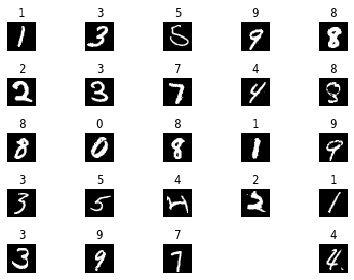

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

train_img = 'train-images-idx3-ubyte'
train_label = 'train-labels-idx1-ubyte'
test_img = 't10k-images-idx3-ubyte'
test_label = 't10k-labels-idx1-ubyte'



def load_MNIST(img_path, label_path):
    """
    # Input
        img_path: MNIST images path. e.g. train-images-idx3-ubyte
        label_path: MNIST label path. e.g. train-labels-idx1-ubyte
    
    # Return
        train_x: shape(n, row, col)
        train_y: shape(n,)
    """
    img_file = open(img_path, 'rb')
    label_file = open(label_path, 'rb')

    img_file.read(4) # magic number 0~3 offset
    n = int.from_bytes(img_file.read(4), byteorder='big') # number of images 4~7 offset
    row = int.from_bytes(img_file.read(4), byteorder='big') # 8~11 offset rows
    col = int.from_bytes(img_file.read(4), byteorder='big') # 12~15 offset cols
    label_file.read(8) # skip label's magic number & number of items
    train_x = np.zeros((n, row, col), dtype='uint8')
    train_y = np.zeros(n, dtype='uint8')
    
    # 1 offset per a pixel value
    for i in range(n):
        for j in range(row):
            for k in range(col):
                train_x[i,j,k] = int.from_bytes(img_file.read(1), byteorder='big')
        train_y[i] = int.from_bytes(label_file.read(1), byteorder='big')

    return (train_x,train_y)


train_x, train_y = load_MNIST(train_img, train_label)
test_x, test_y = load_MNIST(test_img, test_label)

print(f'train_num: {len(train_x)} test_num: {len(test_x)}')

# Visualization 
mask = np.random.choice(60000, 25, replace=False)
example_img = train_x[mask]
example_label = train_y[mask]
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.title(example_label[i])
    plt.axis('off')
    plt.imshow(example_img[i], cmap="gray")
    plt.tight_layout()

# Naive Bayes classifier
## Discrete mode

In [3]:
def Probility_Discrete(train_x, train_y, empty_bin=True):
    """
    Get the distribution of training data (likelihood)
    # Input
        train_x: shape(n, 28, 28)
        train_y: shape(n,)
    
    # Return
        distribution: shape(10, 28*28, 32)
    """
    n, row, col = train_x.shape
    features = train_x.reshape(n, -1)
    distribution = np.zeros((10, row*col, 32)) # 256 pixel value are divided into 32 bins
    for i in range(n):
        categories = train_y[i]
        for j in range(row*col):
            distribution[categories][j][int(features[i,j])//8] += 1
   
    # Find the second minimum to replace 
    if empty_bin:
        min_count = sorted(set(distribution.reshape(-1,)))[1]
        
    for i in range(10):
        for j in range(row*col):
            count = 0
            for k in range(32):
                if distribution[i,j,k] == 0 and empty_bin:
                    distribution[i,j,k] = min_count
                count += distribution[i,j,k]

            distribution[i,j,:] /= count
            
    return distribution

def Prior(train_y):
    """
    Get each categories(0~9) probability (Prior)
    # Input
        train_y: shape(60000,)
    
    # Return
        prior (10,)
    """
    n = train_y.shape
    prior = np.zeros(10)
    for i in range(10):
        prior[i] = np.sum(train_y == i) / n
    return prior

def Posterior_Discrete(test_x, test_y, likelihood, prior):
    """
    Naive Bayes classifier
    # Input
        test_x: shape(n, 28, 28)
        test_y: shape(n,)
        likelihood: shape(10, 28*28, 32)
        prior: shape(10,)
    
    # Return
        posterier: shape(10,) Prediction probability in log scale
        correct: number of correct prediction
    """
    n, row, col = test_x.shape
    features = test_x.reshape(n, -1)
    posterior = np.zeros(10)
    correct = 0
    
    for i in range(n):
        for j in range(10):
            for k in range(row*col):
                posterior[j] += np.log(max(1e-10, likelihood[j, k, int(features[i,k])//8])) # Avoid log with 0
            posterior[j] += np.log(prior[j])
        posterior /= np.sum(posterior)
        
        print("Posterior (in log scale):")
        for idx in range(10):
            print(f'{idx}: {posterior[idx]}')
        print(f'Prediction: {np.argmin(posterior)}, Ans: {test_y[i]}')
        print("")
        if np.argmin(posterior) == test_y[i]:
            correct += 1
            
    return posterior, correct
        
def Imageination_Number(likelihood, threshold):
    """
    Visualization
    # Input
        likelihood: shape(10, 28*28, 32 or 256)
    """    
    print("Imagination of numbers in Bayesian classifier:")
    print("")
    for i in range(10):
        print(f'{i}:')
        for j in range(28):
            for k in range(28):
                value = np.argmax(likelihood[i,j*28+k,:])
                # 256/8 = 32  128/8 = 16
                # When pixel value >=128(half of max pixel value), it should print 1
                if value >= threshold:
                    print("1", end='')
                else:
                    print("0",  end='')
            print("")
        print("")
        
def print_error_rate(test_y, correct):
    n = test_y.shape[0]
    print(f'Error rate:', (n-correct)/n)

## Empty bins remain 0, using 1e-10 to replace in the posterior
* Error rate: 0.1494

In [4]:
c = Probility_Discrete(train_x, train_y, empty_bin=False)
p = Prior(train_y)
Posterior, correct = Posterior_Discrete(test_x, test_y, c, p)

Posterior (in log scale):
0: 0.11215423064481833
1: 0.13727040469572996
2: 0.10887331612468486
3: 0.09611973894554567
4: 0.0904982042252168
5: 0.09179619902595523
6: 0.12773686218416608
7: 0.06666903577027918
8: 0.091662013836023
9: 0.07721999454758087
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09837152559977262
1: 0.1107371946366211
2: 0.07106884435681356
3: 0.08724325467910632
4: 0.10732347016376084
5: 0.08772461525167685
6: 0.08380587571388051
7: 0.13469690245388918
8: 0.09528387231160433
9: 0.12374444483287467
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1268586966306712
1: 0.06251084005316682
2: 0.09693943841385724
3: 0.09890135394182119
4: 0.10172517487949512
5: 0.09493095328949563
6: 0.10169642996657591
7: 0.10991960500225707
8: 0.09860730080726693
9: 0.10791020701539283
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07354814873201874
1: 0.17007577276161814
2: 0.09202588028587219
3: 0.09153778751622257
4: 0.09820056071618796
5: 0.0878415062735372
6: 0.

Posterior (in log scale):
0: 0.12451897370061182
1: 0.1311079211680981
2: 0.10526286089541068
3: 0.09722702395557706
4: 0.07839639652745461
5: 0.09387929992229496
6: 0.11172061392889467
7: 0.08701163254703195
8: 0.09103418768807758
9: 0.07984108966654843
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10308336064212498
1: 0.12234437109500677
2: 0.0826589315992296
3: 0.0950405308320896
4: 0.0938960470750877
5: 0.08875352934952724
6: 0.08856310982416937
7: 0.11949787125136585
8: 0.09722584485028955
9: 0.10893640348110933
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11308808026073824
1: 0.10970373962249313
2: 0.09375816995818408
3: 0.08394303166448486
4: 0.09874033501897786
5: 0.08826871182095086
6: 0.09399245754203502
7: 0.11232160074659063
8: 0.09413274592017144
9: 0.11205112744537384
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09876261664295359
1: 0.11676201398829493
2: 0.10012134924062077
3: 0.0854732614080433
4: 0.09860013505760405
5: 0.08439363536609477
6: 0

Posterior (in log scale):
0: 0.12398972577486371
1: 0.1215212300124662
2: 0.1092703732158324
3: 0.09684989704976354
4: 0.09025035010076354
5: 0.09378021529430808
6: 0.1274498537498252
7: 0.06920678786913526
8: 0.08906334169003606
9: 0.07861822524300596
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09835339214135992
1: 0.15711748136095482
2: 0.09722485147149025
3: 0.08084322307243556
4: 0.09024910742575688
5: 0.08381175763610127
6: 0.09650538771637715
7: 0.09714087382145481
8: 0.09241749392290084
9: 0.10633643143116842
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09463037321124462
1: 0.15390222961594632
2: 0.08004560353219306
3: 0.09657304010484526
4: 0.08620636311959694
5: 0.09616648097367388
6: 0.06930558331250612
7: 0.1151082646387475
8: 0.09912533381962829
9: 0.10893672767161806
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.13015858870194175
1: 0.06385018114207827
2: 0.09522199216344779
3: 0.09815544700711316
4: 0.10234948827210907
5: 0.0957565097924425
6: 0

Posterior (in log scale):
0: 0.10937200785354567
1: 0.13206645313911614
2: 0.101622839565449
3: 0.08919998757804415
4: 0.09276266817492984
5: 0.08781534764167524
6: 0.12629949791148376
7: 0.09378367025423548
8: 0.08001747584139607
9: 0.08706005204012462
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09888804676413492
1: 0.110995301349116
2: 0.10336383550890689
3: 0.09568321721221304
4: 0.0944327294988696
5: 0.08146585732365315
6: 0.11835798816436019
7: 0.10968415237488675
8: 0.08643788718719933
9: 0.10069098461666015
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09566546295658344
1: 0.1509855242410789
2: 0.08768409289262304
3: 0.09610803117925257
4: 0.09374291960843431
5: 0.08914923229121614
6: 0.07106693672183884
7: 0.12307774056144087
8: 0.09285528820351949
9: 0.09966477134401233
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09002650590254702
1: 0.1470020543890766
2: 0.08434801562223598
3: 0.09614844722446675
4: 0.09020224264622502
5: 0.0882531976247314
6: 0.07

Posterior (in log scale):
0: 0.1187886237777091
1: 0.10952115815230433
2: 0.10427539412085653
3: 0.09984477461859366
4: 0.0899320492757648
5: 0.09262033036098101
6: 0.10145577362614887
7: 0.09754337270051953
8: 0.09706205188535014
9: 0.08895647148177221
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.1183852995872595
1: 0.12427246027667163
2: 0.09626080206767285
3: 0.09642110783396284
4: 0.08206407867486684
5: 0.09370321019922537
6: 0.10363489121632591
7: 0.10012849992040639
8: 0.09036227097621641
9: 0.09476737924739222
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08658260646139489
1: 0.1483377358064555
2: 0.085781160327823
3: 0.09642365984055035
4: 0.09093292765897606
5: 0.08891494864189635
6: 0.0681864644530685
7: 0.12692003637198526
8: 0.09782411964245467
9: 0.1100963407953954
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08887093924997098
1: 0.13136510537621496
2: 0.10104935066836314
3: 0.08726922031215845
4: 0.09436003656553624
5: 0.07512486099368954
6: 0.11

Posterior (in log scale):
0: 0.08243467039942823
1: 0.16057394836111397
2: 0.07648054845577658
3: 0.07410758508794982
4: 0.09987382713990248
5: 0.08190861457733209
6: 0.09780954697882825
7: 0.12812174332050985
8: 0.08441111330510628
9: 0.11427840237405239
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08163659091069003
1: 0.17971665628259584
2: 0.0764385616463254
3: 0.10226296517088707
4: 0.0875335088250057
5: 0.09499328242235629
6: 0.07040913412720569
7: 0.1061516467924495
8: 0.09472196321646131
9: 0.10613569060602329
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12853775320058222
1: 0.06541455175875967
2: 0.09463999420722198
3: 0.09906166811037612
4: 0.09990615729538409
5: 0.09631438001561773
6: 0.1088034485909322
7: 0.10869753021669618
8: 0.09367250592046168
9: 0.10495201068396821
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12934563578748678
1: 0.06906417654934824
2: 0.10624587988971892
3: 0.09842719660739392
4: 0.10057503093298319
5: 0.09175749288395837
6: 

Posterior (in log scale):
0: 0.09644021685211926
1: 0.14673410859289682
2: 0.09840646250196201
3: 0.10247426479344662
4: 0.093999832608049
5: 0.08628615126667591
6: 0.1113076671074475
7: 0.09448938366629446
8: 0.07968783184751746
9: 0.09017408076359111
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11125646052198888
1: 0.15487263218793193
2: 0.0989049789164352
3: 0.09278459779080116
4: 0.08239010289158916
5: 0.09387573172448756
6: 0.10341440744579758
7: 0.08165106836848433
8: 0.09591698653586568
9: 0.08493303361661851
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11572776692858235
1: 0.09894541201181548
2: 0.0882188962042232
3: 0.09173341001078772
4: 0.0999316246606743
5: 0.09245381484667124
6: 0.09409913205551161
7: 0.11093232133981189
8: 0.09547270705821251
9: 0.11248491488370958
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09988885390984571
1: 0.1542881780393275
2: 0.08989665926580369
3: 0.08803354453386598
4: 0.09175455683900287
5: 0.09028047148402832
6: 0.0

Posterior (in log scale):
0: 0.10813694631737619
1: 0.14812829570015418
2: 0.09856479102459907
3: 0.0967168679625038
4: 0.0826259306921532
5: 0.09332013976691836
6: 0.1058261395677603
7: 0.08989264063960618
8: 0.09715623488739979
9: 0.07963201344152883
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09893728425949463
1: 0.12315524434308278
2: 0.06910669371341252
3: 0.0808448214539811
4: 0.099280000057991
5: 0.09550591753048139
6: 0.08229549677757989
7: 0.12648094174079116
8: 0.09773336733353893
9: 0.12666023278964664
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10917021837923435
1: 0.10933074013522766
2: 0.08853123878379002
3: 0.09727993067671459
4: 0.09747926063595695
5: 0.08705520553889766
6: 0.07904611398362978
7: 0.1343457892818004
8: 0.08875723448930849
9: 0.10900426809544003
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09246564435713324
1: 0.19039296475989237
2: 0.08828685266524702
3: 0.08255887230078053
4: 0.07610435502556197
5: 0.09065144012333469
6: 0.1

Posterior (in log scale):
0: 0.1001418622470601
1: 0.10646863340877648
2: 0.07461488870389897
3: 0.09512042657156104
4: 0.10876245585902689
5: 0.08982282050901855
6: 0.08101953842535717
7: 0.13247939839795325
8: 0.09430668144429025
9: 0.1172632944330572
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.06430594790748975
1: 0.1802465189140557
2: 0.08883662281816422
3: 0.09145800978294634
4: 0.0911956569504202
5: 0.08154729144400327
6: 0.08915729295354764
7: 0.1201136449175715
8: 0.08951789535069991
9: 0.10362111896110145
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12267769565989207
1: 0.11108027529842708
2: 0.10243212108998762
3: 0.10075964550017776
4: 0.0931667870046419
5: 0.09496148540264096
6: 0.11581802986498366
7: 0.08225302752289823
8: 0.09115013446381466
9: 0.08570079819253605
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1322581811897453
1: 0.06288705629054765
2: 0.09828499927986037
3: 0.09758489761158207
4: 0.10369489706210851
5: 0.09584695107631654
6: 0.0

Posterior (in log scale):
0: 0.09167534612946182
1: 0.1270697731289875
2: 0.10208381299945267
3: 0.08517060732506147
4: 0.09622288435338129
5: 0.0780595964954026
6: 0.11915131808101805
7: 0.11151183652340406
8: 0.08595199572123205
9: 0.10310282924259846
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12481888218670838
1: 0.06978026694985903
2: 0.10515840478850196
3: 0.09822829443352159
4: 0.10123627235627707
5: 0.09302525277212062
6: 0.11687618808559937
7: 0.09234471594292436
8: 0.10280981418887676
9: 0.0957219082956108
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11989526178197492
1: 0.12230034454644481
2: 0.10059742867414757
3: 0.08756278282848687
4: 0.08530615284642967
5: 0.09709067730713858
6: 0.1257012772032941
7: 0.07744022382354167
8: 0.09729831298452446
9: 0.08680753800401735
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11122884579481362
1: 0.1243262332416627
2: 0.1004684347345405
3: 0.09760351907780652
4: 0.08530443070554669
5: 0.09299783884338761
6: 0.

Posterior (in log scale):
0: 0.1063138322621758
1: 0.16524575648637932
2: 0.09861815905120225
3: 0.09513200529757866
4: 0.07497907587553085
5: 0.08816262213369536
6: 0.10711053113984975
7: 0.09095456291395851
8: 0.09283586888870173
9: 0.0806475859509277
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09421883551390091
1: 0.16305002888154385
2: 0.08376832042586228
3: 0.09741563589205265
4: 0.07511084469402173
5: 0.0933545720135125
6: 0.0896572135172588
7: 0.10925074385849291
8: 0.09873946261476417
9: 0.0954343425885902
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08158589000533355
1: 0.13067215416646089
2: 0.07736236370845348
3: 0.08977350604056436
4: 0.10230256871631861
5: 0.08817655409544489
6: 0.10250407753499657
7: 0.12308899187503208
8: 0.08540698575019587
9: 0.11912690810719977
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11309131995624958
1: 0.1051387397500617
2: 0.09807635472958029
3: 0.08985648246253884
4: 0.09965034426009384
5: 0.09111146085292457
6: 0.

Posterior (in log scale):
0: 0.06183016255817769
1: 0.1890336549692181
2: 0.08460222403072709
3: 0.08995639937756832
4: 0.09151079787352873
5: 0.08793185573979706
6: 0.10492345444267553
7: 0.10180393106235248
8: 0.08812068827158134
9: 0.10028683167437358
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07992717496573148
1: 0.1603230856067998
2: 0.09282159320377865
3: 0.09417571036759528
4: 0.09470575610833581
5: 0.08883703463220499
6: 0.08832064793327961
7: 0.10799664894301815
8: 0.09076731126176771
9: 0.10212503697748856
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1008779214646274
1: 0.14606920847464233
2: 0.09771127206936969
3: 0.07496260322409706
4: 0.09697754572272664
5: 0.08332587607108169
6: 0.11022568212554684
7: 0.1007773647276169
8: 0.08858070956105903
9: 0.10049181655923241
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10623870949980697
1: 0.11295345136312693
2: 0.10176514906860101
3: 0.09400910128586884
4: 0.09646260583015125
5: 0.09189136474140303
6: 

Posterior (in log scale):
0: 0.12210311129320514
1: 0.06384367317688429
2: 0.09682708650894399
3: 0.09711850463338127
4: 0.10004385084537491
5: 0.09314429312234253
6: 0.10325989813478595
7: 0.11963922468054396
8: 0.09526749035332793
9: 0.10875286725121026
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11865073512894578
1: 0.14405565220471303
2: 0.10693654027547253
3: 0.0907739238727304
4: 0.08213016460682879
5: 0.08926804398499957
6: 0.11490669812039887
7: 0.08670974281988866
8: 0.0909577580771835
9: 0.07561074090883882
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11270649927075299
1: 0.14435260861477403
2: 0.10204513693145162
3: 0.08188892802566167
4: 0.08736264105073296
5: 0.09673252575327321
6: 0.11626260059773326
7: 0.06464497925436075
8: 0.09876264707319982
9: 0.09524143342805977
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1007762380812387
1: 0.12335810875071022
2: 0.10770790678068078
3: 0.10709459971933613
4: 0.09156815548043754
5: 0.0831088132462131
6: 

Posterior (in log scale):
0: 0.1118823732145435
1: 0.08740364782146598
2: 0.09373872878731948
3: 0.0974272669633718
4: 0.10041383094060392
5: 0.09332468952336528
6: 0.09829973028818594
7: 0.12261747747143716
8: 0.08694300646636711
9: 0.10794924852333992
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1297443341047335
1: 0.10335672424857571
2: 0.10545953646938278
3: 0.09348089021252945
4: 0.09129956664607973
5: 0.09109479206063543
6: 0.11664600219812872
7: 0.09362385987312198
8: 0.09294636770472296
9: 0.08234792648208973
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1177048345751435
1: 0.1557905305162504
2: 0.0938144301839733
3: 0.0907709936013839
4: 0.08400738392802917
5: 0.09606499623157722
6: 0.11158303777288607
7: 0.07366778369369201
8: 0.09566502555540979
9: 0.08093098394165472
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10928500863789473
1: 0.08222227780160737
2: 0.08694080277777068
3: 0.10068922116732058
4: 0.10183889881803669
5: 0.08565743404110136
6: 0.1

Posterior (in log scale):
0: 0.11095941998897772
1: 0.13740396621264825
2: 0.10015113803475326
3: 0.10166659886593399
4: 0.08413196615454877
5: 0.09551949902733016
6: 0.108086048631409
7: 0.08750003718367984
8: 0.09295121642509561
9: 0.08163010947562353
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11356194674120798
1: 0.10611021992332118
2: 0.101190173811091
3: 0.0951987631153234
4: 0.09620143343594029
5: 0.09143544351637141
6: 0.11645351608027345
7: 0.09938206081382249
8: 0.08634903296184737
9: 0.09411740960080146
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08609818212814024
1: 0.1565956769354698
2: 0.09270323321818126
3: 0.09172601507145374
4: 0.09461892320207033
5: 0.08908100179781438
6: 0.09400148508350076
7: 0.10588979919725704
8: 0.09293239576897029
9: 0.09635328759714223
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11973482649737051
1: 0.1297054661480543
2: 0.10523292767089283
3: 0.09409073318550623
4: 0.088051957581624
5: 0.09082439122311965
6: 0.113

Posterior (in log scale):
0: 0.11005240318405217
1: 0.12173913175012573
2: 0.10226856609588712
3: 0.09499976903673522
4: 0.09566056975359465
5: 0.09203506796587223
6: 0.10557348027180911
7: 0.09736733577138387
8: 0.08842194695101856
9: 0.09188172921952126
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.112843216755602
1: 0.11648694805367668
2: 0.10755005994755451
3: 0.09272946029005413
4: 0.09092500071628565
5: 0.08369035641379086
6: 0.13276813781166755
7: 0.09219789495599214
8: 0.08645810354095464
9: 0.08435082151442179
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12093905755197275
1: 0.09868324510444654
2: 0.1036037604973961
3: 0.09903619059815036
4: 0.09189655920085009
5: 0.09382205545030202
6: 0.12818161665642602
7: 0.0896268503343917
8: 0.08816150781063771
9: 0.08604915679542675
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.10102307116681045
1: 0.11147634278580634
2: 0.09295821212687394
3: 0.08588705074293211
4: 0.10086248966437512
5: 0.0885669719212424
6: 0

Posterior (in log scale):
0: 0.10260521124594355
1: 0.10818860462703168
2: 0.07209828531899869
3: 0.0829948074684175
4: 0.10478244519729156
5: 0.08915901176544759
6: 0.101648236323473
7: 0.12434621632166291
8: 0.0897787870170045
9: 0.12439839471472912
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.07880212102833456
1: 0.15562429632651376
2: 0.08924191131918217
3: 0.09111994023965755
4: 0.09451442657081638
5: 0.0890709791280953
6: 0.09238487105830176
7: 0.11108667208067571
8: 0.09227992390330787
9: 0.10587485834511492
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10131718822470522
1: 0.12910829062084025
2: 0.09753051997372822
3: 0.08837685784960685
4: 0.10035992860465559
5: 0.0861730832432039
6: 0.08667666407819939
7: 0.1188771540906797
8: 0.0884309545861672
9: 0.10314935872821376
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10742008730102501
1: 0.1086331583274401
2: 0.08132624574427591
3: 0.09795027525451684
4: 0.10121606861878842
5: 0.0934058692541245
6: 0.0831

Posterior (in log scale):
0: 0.11706079400395204
1: 0.1314066007556542
2: 0.0873521190514183
3: 0.08073671084438391
4: 0.08614692738181223
5: 0.09563269456257041
6: 0.10536367850429891
7: 0.0932666439877036
8: 0.09289487218348891
9: 0.1101389587247175
Prediction: 3, Ans: 7

Posterior (in log scale):
0: 0.10381157596425804
1: 0.11358754115408408
2: 0.09394967319923342
3: 0.0956289066727725
4: 0.09850251516240348
5: 0.09031501805320725
6: 0.11336708042725754
7: 0.1040141055045741
8: 0.08632248403623352
9: 0.10050109982597612
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11157011916806334
1: 0.10677524070646463
2: 0.08859049660851516
3: 0.07521199580625493
4: 0.09921178033352045
5: 0.0922114700403278
6: 0.0963617303307171
7: 0.12228467380686005
8: 0.09250089402105754
9: 0.11528159917821885
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11029945105082205
1: 0.11607444822966832
2: 0.09581293229621887
3: 0.08288465713478019
4: 0.09572470960879687
5: 0.08780543037411814
6: 0.12

Posterior (in log scale):
0: 0.12690068639960977
1: 0.0609326573905815
2: 0.09975071927086415
3: 0.09884397317095066
4: 0.10330939441895785
5: 0.09359550484088036
6: 0.10253782571659016
7: 0.10465903892153468
8: 0.09883350791286874
9: 0.11063669195716219
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1139748169170847
1: 0.1261930491103183
2: 0.10665803684821977
3: 0.09290232440991623
4: 0.09099771788914907
5: 0.08956784868799726
6: 0.10406428314653128
7: 0.08704973401935155
8: 0.09883959253857426
9: 0.08975259643285745
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10714687659677695
1: 0.11299917328979835
2: 0.09383848742920753
3: 0.08214879048390905
4: 0.10157296158305269
5: 0.08935877054886274
6: 0.12255445866893964
7: 0.10256453381440923
8: 0.08848034259294651
9: 0.09933560499209713
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.108611520727445
1: 0.11920619646406201
2: 0.09032173634157938
3: 0.09071777679133912
4: 0.0945147289979027
5: 0.09387173937028895
6: 0.

Posterior (in log scale):
0: 0.1336778719759684
1: 0.06422692321538238
2: 0.09663800699097
3: 0.10037351688744583
4: 0.10076218536664171
5: 0.09684452413798451
6: 0.11192694753246807
7: 0.09999652681367771
8: 0.09598766697270723
9: 0.09956583010675427
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12912639654006508
1: 0.06310207706967445
2: 0.09924055798795632
3: 0.09650105744267443
4: 0.10559428845698343
5: 0.09472688960750345
6: 0.09872385080364743
7: 0.11568286229201491
8: 0.0939572532458045
9: 0.10334476655367589
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10117306675818737
1: 0.12633673056411884
2: 0.0903509262454717
3: 0.09256591929311427
4: 0.09503846110259621
5: 0.08670501805855158
6: 0.07791439348644831
7: 0.1305189517155794
8: 0.08764008613692714
9: 0.11175644663900519
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09379042218627098
1: 0.16452934692157611
2: 0.0927102658812255
3: 0.10121037841907107
4: 0.07856576705482786
5: 0.09012714907227211
6: 0.09

Posterior (in log scale):
0: 0.09230003716542484
1: 0.13619644816152632
2: 0.09119965058895685
3: 0.07897905856901113
4: 0.10245358172474198
5: 0.08598187299538532
6: 0.09397402323473901
7: 0.11265491142411493
8: 0.09362993243868023
9: 0.11263048369741945
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12815781406661186
1: 0.06720547981572078
2: 0.10455236958645593
3: 0.09935758276469976
4: 0.10276176214090958
5: 0.0920876952481532
6: 0.11113096527238646
7: 0.09608453653559756
8: 0.10063708886348366
9: 0.09802470570598114
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08854904438553134
1: 0.17459619244065497
2: 0.09187773844966216
3: 0.08966768043917991
4: 0.0874537051753287
5: 0.0908192522336217
6: 0.11049961686052208
7: 0.08456572184232346
8: 0.09005114334598562
9: 0.09191990482719004
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10629954957592358
1: 0.11203108313767915
2: 0.0949802898996565
3: 0.07889415729856236
4: 0.10471841953681016
5: 0.09060316218385729
6: 

Posterior (in log scale):
0: 0.12771435232972073
1: 0.06458827681114582
2: 0.09575168837280457
3: 0.0981958273262266
4: 0.10237248820427879
5: 0.0943437204249625
6: 0.10641238493692627
7: 0.11055413650225045
8: 0.09387917513994644
9: 0.10618794995173783
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09744110163239769
1: 0.13382916058322922
2: 0.0824654150974939
3: 0.07640203692058936
4: 0.09922765902248956
5: 0.08769922927592631
6: 0.09762681853466272
7: 0.11756049351285239
8: 0.08888784353776462
9: 0.11886024188259421
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12895612671484827
1: 0.06338305771781211
2: 0.09714239542630174
3: 0.09738074298556398
4: 0.10718494342478073
5: 0.09611836613570357
6: 0.099434167461766
7: 0.10783567676179145
8: 0.0949374484066964
9: 0.10762707496473578
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08035821935851666
1: 0.14578162821178053
2: 0.0950396803690698
3: 0.09026837169667079
4: 0.10030491298047185
5: 0.08597363469415108
6: 0.0

Posterior (in log scale):
0: 0.12937945637085432
1: 0.06416851233649075
2: 0.09958280458814656
3: 0.0964702219338457
4: 0.10318954049031635
5: 0.09494814161549936
6: 0.10172802658891822
7: 0.10817129970184743
8: 0.09775814986532264
9: 0.10460384650875862
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10151716922707242
1: 0.10712914947931863
2: 0.09649498777625952
3: 0.08302077527288633
4: 0.10601384466328774
5: 0.08563034701643928
6: 0.09981171963228562
7: 0.1184871924864441
8: 0.09118419089283157
9: 0.11071062355317474
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09987940444729787
1: 0.09213122135056678
2: 0.07272982777081965
3: 0.08572508978913651
4: 0.10374942986191969
5: 0.08826230473833936
6: 0.08614071089601705
7: 0.15086185796894117
8: 0.09381049508333263
9: 0.12670965809362938
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10202920402212379
1: 0.13048358592980622
2: 0.07368877796521842
3: 0.08995908692819478
4: 0.09696233162963068
5: 0.09319344944242086
6

Posterior (in log scale):
0: 0.11512162557923795
1: 0.13080066377159072
2: 0.0982055973813534
3: 0.0958287758478365
4: 0.09130240432657322
5: 0.09399980560792649
6: 0.10420420426280814
7: 0.08975007850749439
8: 0.09109303444615909
9: 0.08969381026902008
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.1227778901052847
1: 0.1260949368306098
2: 0.10032965908189143
3: 0.0947136897669176
4: 0.08381071581706159
5: 0.09134134355827975
6: 0.10780432650518963
7: 0.09156856143847318
8: 0.09724403460412942
9: 0.08431484229216298
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07466729231123527
1: 0.17538452189272477
2: 0.08561111871266447
3: 0.08624874182334501
4: 0.0906572722651066
5: 0.08506306501421249
6: 0.09712142141447906
7: 0.10245118273224066
8: 0.09705380166069137
9: 0.10574158217330021
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0917376520866656
1: 0.13399066102119322
2: 0.08865466880844407
3: 0.07814151329274766
4: 0.10115586340431192
5: 0.08537572100673316
6: 0.0

Posterior (in log scale):
0: 0.06317438453024238
1: 0.18088950214553212
2: 0.08872252984742364
3: 0.09702295683398816
4: 0.0953650662861245
5: 0.08069197753833775
6: 0.10329811987301578
7: 0.10190925927413208
8: 0.0858203250951403
9: 0.10310587857606315
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0906833825413515
1: 0.1464067274321632
2: 0.08131322586799997
3: 0.10022404430687265
4: 0.09120868834184079
5: 0.09492775593049357
6: 0.07483347744657057
7: 0.11057774877212814
8: 0.0985606834471579
9: 0.11126426591342163
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10611644048216429
1: 0.11846164679472433
2: 0.0735144623422371
3: 0.08950135015178702
4: 0.10295468126933326
5: 0.09299283131194987
6: 0.0944263301448258
7: 0.11904386911177862
8: 0.08884559591702444
9: 0.11414279247417534
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09656250617888029
1: 0.14438430747431386
2: 0.08274316985368357
3: 0.0820487569042518
4: 0.09044782802860638
5: 0.09364003331893782
6: 0.08

Posterior (in log scale):
0: 0.10400119228510742
1: 0.09183249192659573
2: 0.08038302526417963
3: 0.088736979165562
4: 0.10319903615136025
5: 0.09356478507131466
6: 0.10009335632257516
7: 0.13385520476175555
8: 0.08270048826267
9: 0.12163344078887955
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0891254840048891
1: 0.14377009864155874
2: 0.0899474003462951
3: 0.07424026415445222
4: 0.10406443631926474
5: 0.07812267250848764
6: 0.11580142776095854
7: 0.12027566715865089
8: 0.07967385445677201
9: 0.10497869464867106
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.12847807066483935
1: 0.07715121158011969
2: 0.10475268446626239
3: 0.09719622345466075
4: 0.09859405310453023
5: 0.09074181318985124
6: 0.11227899605791651
7: 0.0974574973379659
8: 0.09595955486812811
9: 0.09738989527572581
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1273705136314665
1: 0.11669417720955097
2: 0.10572150957671735
3: 0.09769660266441249
4: 0.0881600571284247
5: 0.09477938006805799
6: 0.1084

Posterior (in log scale):
0: 0.11858321735203092
1: 0.15012792153423293
2: 0.1046470270385255
3: 0.0901848589516998
4: 0.07839518161965574
5: 0.08876112123615501
6: 0.10801797519328941
7: 0.0858074220282452
8: 0.09254664988571353
9: 0.08292862516045207
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11172758409227126
1: 0.11389767852673005
2: 0.08994138207121384
3: 0.09649456527808718
4: 0.09172094380560962
5: 0.0966864964951213
6: 0.08781230298995796
7: 0.11405071960405122
8: 0.09244689283778751
9: 0.10522143429917
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.13276157370367014
1: 0.10584924434182238
2: 0.1084063355134079
3: 0.09059507412560207
4: 0.09379710273652177
5: 0.08698541788096514
6: 0.12323463624812998
7: 0.08895693319104135
8: 0.08880493889010765
9: 0.08060874336873167
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1070985766742488
1: 0.10683118229774613
2: 0.10737783629343574
3: 0.0884860472464211
4: 0.09672850487552048
5: 0.08456018546202126
6: 0.1194

Posterior (in log scale):
0: 0.10266298265815356
1: 0.12748959544756447
2: 0.08859158475564208
3: 0.09632333871923396
4: 0.0948921850354457
5: 0.09184233987268157
6: 0.07739225083075352
7: 0.11163881862984718
8: 0.09984613217324065
9: 0.10932077187743734
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11242090948245481
1: 0.15695346150437117
2: 0.09561657893661268
3: 0.0961772364260449
4: 0.07788898006758826
5: 0.09261916017489166
6: 0.10982234877550442
7: 0.08869455014610833
8: 0.09444834618432375
9: 0.07535842830210002
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10146524427273311
1: 0.1028221926261575
2: 0.10423324229001452
3: 0.09366484377458388
4: 0.10041400675356453
5: 0.08259293253956798
6: 0.1208067958790279
7: 0.10899654419449434
8: 0.08494104973619089
9: 0.1000631479336654
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1127923254940631
1: 0.14991934004833216
2: 0.11125049712917073
3: 0.09923186816917749
4: 0.0814048638144499
5: 0.09079908475769127
6: 0.1

Posterior (in log scale):
0: 0.09546630035111613
1: 0.16627179170212097
2: 0.10559321237069287
3: 0.09780247907931588
4: 0.08687641998446581
5: 0.0913886480031407
6: 0.11357248051634566
7: 0.06960548061292499
8: 0.0960774270901039
9: 0.07734576028977308
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12220536137194737
1: 0.10999458815276593
2: 0.10755099730864
3: 0.0864068407339425
4: 0.09229335429841701
5: 0.09115283791345438
6: 0.13029133575188126
7: 0.0905188685597539
8: 0.08397527593735608
9: 0.08561053997184158
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.10179878184703557
1: 0.17041951992163742
2: 0.08965127531677096
3: 0.08738279014645704
4: 0.08764741994236552
5: 0.09974885150342687
6: 0.09666391650524228
7: 0.08429748176725732
8: 0.09136187098046075
9: 0.0910280920693462
Prediction: 7, Ans: 3

Posterior (in log scale):
0: 0.12568775140767793
1: 0.06579035535546711
2: 0.09269026352205031
3: 0.09520160549703437
4: 0.10406237414885629
5: 0.09607903857849336
6: 0.10

Posterior (in log scale):
0: 0.11143858231673222
1: 0.11296360096839789
2: 0.11173059737333753
3: 0.09454483928857048
4: 0.09281733054598433
5: 0.08594654895093613
6: 0.13348627684394493
7: 0.08749172656562984
8: 0.0852675602755889
9: 0.08431293687087785
Prediction: 9, Ans: 5

Posterior (in log scale):
0: 0.10920608927683341
1: 0.14123758601077194
2: 0.10410579212394037
3: 0.09869212658064434
4: 0.08190340035446227
5: 0.08143024154179383
6: 0.1232023648861535
7: 0.09189594615939495
8: 0.07903995941042506
9: 0.08928649365558047
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1236361568247241
1: 0.11672209803728822
2: 0.10701644884005103
3: 0.10020621978836744
4: 0.08848167320645503
5: 0.09486488333451207
6: 0.12051705579238839
7: 0.0705905613320747
8: 0.09965203119697759
9: 0.07831287164716137
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09706582600164723
1: 0.11603721334814292
2: 0.09333459785085012
3: 0.07821523386964674
4: 0.09722047767199667
5: 0.08365746219990777
6: 

Posterior (in log scale):
0: 0.09630983815245812
1: 0.11530262630768957
2: 0.06601607894726602
3: 0.08568150202566976
4: 0.10131647997034766
5: 0.09358462399106122
6: 0.08174634236097218
7: 0.13572844808569492
8: 0.09651011993062579
9: 0.12780394022821479
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12675220318709526
1: 0.07534166309616966
2: 0.09301602827352573
3: 0.09689430932421403
4: 0.09752886823333799
5: 0.09700605463029455
6: 0.12676141176648464
7: 0.09762233831172598
8: 0.08787440820374054
9: 0.10120271497341146
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10781795442225192
1: 0.10650869148545264
2: 0.09448783461303184
3: 0.09622670846679772
4: 0.09689989975976725
5: 0.09236850830976336
6: 0.09462878153140424
7: 0.11699600748209905
8: 0.09037749767119858
9: 0.10368811625823347
Prediction: 8, Ans: 6

Posterior (in log scale):
0: 0.1342603920455889
1: 0.06592139497650853
2: 0.10324468213849163
3: 0.09688284920912457
4: 0.10279199035323026
5: 0.09566937727534595


Posterior (in log scale):
0: 0.08739826684049459
1: 0.17666534099083148
2: 0.09084017770202221
3: 0.10664061105799867
4: 0.0800665115492496
5: 0.08820617395330616
6: 0.08105865181652423
7: 0.09257351211897136
8: 0.09351015874074506
9: 0.10304059522985674
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12783536852011063
1: 0.06312347904235974
2: 0.10643378557160497
3: 0.09908458031884244
4: 0.10373000661517418
5: 0.09414140216822478
6: 0.1135167879182715
7: 0.09498116165580262
8: 0.10015988719070691
9: 0.0969935409989023
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12509416918356578
1: 0.1342013990269346
2: 0.10863485222654194
3: 0.09506033150955508
4: 0.08443016823965294
5: 0.09084481946146178
6: 0.11105405327724148
7: 0.08220706373871348
8: 0.09381679269658938
9: 0.07465635063974346
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09477700856630678
1: 0.14823244009087663
2: 0.09387119852630361
3: 0.086526403838821
4: 0.09280976249873515
5: 0.08818467685842803
6: 0.

Posterior (in log scale):
0: 0.1278880526276093
1: 0.05882189629486064
2: 0.09503512066856053
3: 0.09782561749073432
4: 0.10209972882761602
5: 0.09437299375898109
6: 0.10145818866255822
7: 0.11455593357405867
8: 0.09624077552805381
9: 0.11170169256696733
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11231029378397707
1: 0.10596138883821749
2: 0.090281757046124
3: 0.09406277772544724
4: 0.09654223675610152
5: 0.09227515451652255
6: 0.08311128401093888
7: 0.12370524486758269
8: 0.09519965311843302
9: 0.10655020933665554
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07244330728530317
1: 0.16158774109756655
2: 0.09344665484836004
3: 0.09058401007316236
4: 0.09621357116560793
5: 0.08482922662044183
6: 0.10985609809714887
7: 0.10296465859369909
8: 0.08943840270782649
9: 0.0986363295108837
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10714050421470238
1: 0.14759797964092855
2: 0.09395677215870134
3: 0.08156901899854804
4: 0.09219930675826996
5: 0.08899759185227224
6: 

Posterior (in log scale):
0: 0.10399960922196635
1: 0.11035768480782496
2: 0.07742156431017864
3: 0.08638565880956767
4: 0.10802208649952261
5: 0.09027115948988924
6: 0.09164559683498234
7: 0.12041329282627641
8: 0.08898316468949459
9: 0.12250018251029729
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08817898888441499
1: 0.13706495849474712
2: 0.07392561314255326
3: 0.090460770123832
4: 0.09952701785136098
5: 0.09160190023076681
6: 0.06384252138739528
7: 0.12806882149596732
8: 0.10398949824145252
9: 0.12333991014750988
Prediction: 6, Ans: 2

Posterior (in log scale):
0: 0.1319084021912798
1: 0.06532571299080502
2: 0.10396505686840263
3: 0.09763137722323752
4: 0.10203928908562993
5: 0.09414950424331707
6: 0.11273628891210535
7: 0.0966399030955471
8: 0.10002005835038454
9: 0.0955844070392911
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09206527835365307
1: 0.1548687345068963
2: 0.09385628318691835
3: 0.08187580461085638
4: 0.09646687596187789
5: 0.08502992297612189
6: 0.

Posterior (in log scale):
0: 0.1060310422081896
1: 0.09102275776489939
2: 0.09471682768201717
3: 0.0924553944049555
4: 0.09453776402988631
5: 0.08423057605317412
6: 0.09130090503885256
7: 0.1301364023443303
8: 0.08963622501400376
9: 0.12593210545969136
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.0648588816436863
1: 0.17808135747375917
2: 0.0899316329685045
3: 0.08564363856368579
4: 0.09209836009235328
5: 0.07810267101660154
6: 0.11870003670707863
7: 0.1051791539557703
8: 0.0901613327585977
9: 0.09724293481996271
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1141883360695448
1: 0.11991018657967384
2: 0.10074571827881719
3: 0.1034204789021978
4: 0.08668213344075405
5: 0.09547683429505853
6: 0.10721087230802548
7: 0.0927951693136083
8: 0.09722953764876983
9: 0.08234073316355027
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08605899791572133
1: 0.14219724946572498
2: 0.06998170685354863
3: 0.08043504165868698
4: 0.10104407486257466
5: 0.0872853451576041
6: 0.10024

Posterior (in log scale):
0: 0.08730087162361998
1: 0.20279395606076314
2: 0.08798726770495105
3: 0.0959780822064175
4: 0.0713273551051959
5: 0.08710771831007494
6: 0.10415420143452099
7: 0.08933973480928842
8: 0.0929042722112318
9: 0.08110654053393641
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10016468853460747
1: 0.1372693960891196
2: 0.08526220473889286
3: 0.09444679561544843
4: 0.09785586230080258
5: 0.09324439850673329
6: 0.07297723766157702
7: 0.11589443839523679
8: 0.09654243291224104
9: 0.10634254524534095
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09215519771656203
1: 0.1543139740159621
2: 0.10162198056125457
3: 0.10034494610546106
4: 0.08542904273352424
5: 0.08470521467064822
6: 0.10451608630267734
7: 0.09156946355725183
8: 0.09624871130001145
9: 0.08909538303664705
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08626949282034939
1: 0.17936938307334852
2: 0.08636527811115174
3: 0.09445740277221658
4: 0.07868486900946041
5: 0.09197524096029652
6: 0

Posterior (in log scale):
0: 0.0989560190057642
1: 0.17163942557164621
2: 0.0935683085618471
3: 0.098292121094776
4: 0.07673299586451288
5: 0.09333242811830268
6: 0.09245316141638611
7: 0.09178536395424293
8: 0.09662858467143001
9: 0.08661159174109181
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08644880044128839
1: 0.13883519090433444
2: 0.08357947603137895
3: 0.08708046760439611
4: 0.09046617739139164
5: 0.08680628233508944
6: 0.09770367264029575
7: 0.1241193530577406
8: 0.09471244555951383
9: 0.11024813403457066
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09575515888435676
1: 0.16542340457079927
2: 0.09762857905019261
3: 0.07608773304988131
4: 0.09036916892236939
5: 0.0879006182944789
6: 0.13834867628037453
7: 0.0764828410946334
8: 0.08431621621617863
9: 0.08768760363673529
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10633204958423184
1: 0.12817218740358818
2: 0.09844604986963112
3: 0.0864861875915722
4: 0.09527273298934995
5: 0.09045377492166573
6: 0.11

Posterior (in log scale):
0: 0.11239204291826932
1: 0.10843289079186554
2: 0.09897976122877036
3: 0.09221747193463409
4: 0.09888270032854174
5: 0.09036958958355445
6: 0.0957171500056808
7: 0.11473639348243315
8: 0.09094576051484893
9: 0.09732623921140167
Prediction: 5, Ans: 8

Posterior (in log scale):
0: 0.10359043586574249
1: 0.10771360547820856
2: 0.09544517225993919
3: 0.08071273572248827
4: 0.10107825788848424
5: 0.08792757907824025
6: 0.10171710643568299
7: 0.11341068042336078
8: 0.09419172136563984
9: 0.1142127054822133
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08036026437989931
1: 0.1633997107049749
2: 0.09028137475870915
3: 0.0868324526844572
4: 0.09406913617380697
5: 0.08744818737572334
6: 0.09255661307695151
7: 0.10975258023298542
8: 0.09066986220724066
9: 0.10462981840525172
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12750487802901236
1: 0.09724629468138343
2: 0.10389632920655914
3: 0.09335725530848173
4: 0.09494862293941043
5: 0.09334724266047219
6: 

Posterior (in log scale):
0: 0.10853171245823674
1: 0.14271727134598672
2: 0.10413785468809125
3: 0.10114094663686357
4: 0.08818834063012411
5: 0.09149124571218638
6: 0.11937506631889029
7: 0.07521666142652934
8: 0.09060606417210046
9: 0.07859483661099119
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11540535434720996
1: 0.1300380382155435
2: 0.10094448292725494
3: 0.0916056173631912
4: 0.08720289483918581
5: 0.09573502334394562
6: 0.12545885072319582
7: 0.06737034157363664
8: 0.1007661190641088
9: 0.08547327760272753
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10185358320516857
1: 0.17392269096133434
2: 0.08953332247590526
3: 0.09135905506395364
4: 0.07557625384019831
5: 0.09152257349579737
6: 0.11196431430013805
7: 0.09018733558617012
8: 0.0950011816300048
9: 0.07907968944132951
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10952946396386655
1: 0.12339709982845601
2: 0.08515183164813545
3: 0.08905791647925551
4: 0.0964190988348266
5: 0.09335285579481323
6: 0

Posterior (in log scale):
0: 0.09018604377862634
1: 0.11988419820839166
2: 0.06631287154910719
3: 0.08744824814074464
4: 0.10571455439912285
5: 0.09282558231997057
6: 0.08211673437566135
7: 0.1335692792046837
8: 0.09583908004143814
9: 0.12610340798225353
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11144250875065298
1: 0.10124531162069635
2: 0.0994966840949722
3: 0.08421621380168796
4: 0.1067527798436809
5: 0.09143682977516128
6: 0.12041416531135903
7: 0.09531752498831753
8: 0.09316233245578504
9: 0.09651564935768675
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09187837957731461
1: 0.13726607920942094
2: 0.09438410439786425
3: 0.08785598467795981
4: 0.10010059428049617
5: 0.08283309994332586
6: 0.08341176191523449
7: 0.12470355649166963
8: 0.0911114534401427
9: 0.10645498606657143
Prediction: 5, Ans: 6

Posterior (in log scale):
0: 0.09205315248687991
1: 0.12336471697809724
2: 0.08702163686814102
3: 0.07323085245955946
4: 0.10648560263177095
5: 0.08233243720301227
6: 

Posterior (in log scale):
0: 0.09773844454470461
1: 0.10348094075017449
2: 0.091496298209764
3: 0.07972740229196253
4: 0.10440637861662563
5: 0.08405741913700948
6: 0.1005742139621317
7: 0.12284734969827238
8: 0.09250020520948467
9: 0.12317134757987042
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.095229606359073
1: 0.11341169797601111
2: 0.10284718935902214
3: 0.08907272222372185
4: 0.097652570976044
5: 0.07445130394359095
6: 0.12937717594786405
7: 0.11612994786725486
8: 0.08038866993760092
9: 0.10143911540981708
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12912043927579195
1: 0.06106483902604417
2: 0.09865346984732529
3: 0.10029924852442303
4: 0.10704921933948561
5: 0.09480810240711865
6: 0.0995938233627934
7: 0.10610530317675324
8: 0.09766442427599785
9: 0.10564113076426662
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11680443429341308
1: 0.13979397101662583
2: 0.11437132286114822
3: 0.09734391514277048
4: 0.08673202950333013
5: 0.08394947132908114
6: 0.11

Posterior (in log scale):
0: 0.11664017462634149
1: 0.16030762400193238
2: 0.09683503684165971
3: 0.0833531001654907
4: 0.08531440158226027
5: 0.08924430843475797
6: 0.1193033711828265
7: 0.07311374144112417
8: 0.09320328694584634
9: 0.08268495477776042
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10879970718235585
1: 0.12132356338188857
2: 0.11638925026104856
3: 0.09109873022298468
4: 0.0920664404463883
5: 0.07810892105216354
6: 0.1487238830977394
7: 0.08013393406461393
8: 0.08168714189988308
9: 0.08166842839093427
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1370903333952518
1: 0.06858526004006149
2: 0.1100750642812128
3: 0.09720662781450533
4: 0.09849433576469988
5: 0.09409929786619319
6: 0.11902076537184864
7: 0.08835411011086097
8: 0.09818761363563422
9: 0.08888659171973166
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12611918477024878
1: 0.06776964214225106
2: 0.105265998180185
3: 0.0977669510497428
4: 0.1049193045620331
5: 0.09231479754789886
6: 0.1148

Posterior (in log scale):
0: 0.07487669457921235
1: 0.16587095130125096
2: 0.09172542664446778
3: 0.08738756048992642
4: 0.09372577122360817
5: 0.08563301262484829
6: 0.1147727467573617
7: 0.09862658660267352
8: 0.0907249521945348
9: 0.09665629758211616
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11513132049230393
1: 0.15523081887763387
2: 0.11049651235324214
3: 0.09021937491624946
4: 0.0804537299494272
5: 0.08421702061891037
6: 0.11903974581168789
7: 0.08488836107297032
8: 0.0874390282902002
9: 0.07288408761737465
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12551046978367464
1: 0.063474350755099
2: 0.10029517324637728
3: 0.09793215358383248
4: 0.10391957487666262
5: 0.09302973246585214
6: 0.09896079488182523
7: 0.11173057816887398
8: 0.09868963461923846
9: 0.10645753761856419
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1260432932398291
1: 0.07966929852733487
2: 0.10415312733938135
3: 0.09763594450397539
4: 0.09801719440396925
5: 0.0939586336833473
6: 0.12

Posterior (in log scale):
0: 0.12817515498411466
1: 0.0667768372131384
2: 0.10208457626018319
3: 0.09822421303059799
4: 0.10288043292879914
5: 0.09309523356265081
6: 0.0997348280689485
7: 0.106522683429575
8: 0.10054348559412667
9: 0.1019625549278657
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1043586078853268
1: 0.12654281770553077
2: 0.08359009480700426
3: 0.0866887530601988
4: 0.09932248553672618
5: 0.09551495741936752
6: 0.09942811984155094
7: 0.10588216541745785
8: 0.0932483177231935
9: 0.10542368060364334
Prediction: 2, Ans: 7

Posterior (in log scale):
0: 0.0918865808755644
1: 0.1092491036372496
2: 0.09180311024223813
3: 0.08699566531633678
4: 0.10582951643600244
5: 0.08525659088396079
6: 0.09858490171733063
7: 0.12621303691526153
8: 0.0904272912871436
9: 0.1137542026889123
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10608725281002665
1: 0.10596279063852618
2: 0.09870831905505086
3: 0.0938167872140445
4: 0.09765400056679523
5: 0.0902771465496681
6: 0.11292697

Posterior (in log scale):
0: 0.12067607368253921
1: 0.1484025389310369
2: 0.09980301810310586
3: 0.09242883749109444
4: 0.08492491399780878
5: 0.09567652947752066
6: 0.1106668269100497
7: 0.07508736067699394
8: 0.09446508121414682
9: 0.07786881951570378
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10158742612581513
1: 0.17009722302084077
2: 0.09364842672136116
3: 0.09528342601589426
4: 0.07685279562800296
5: 0.09227347064153342
6: 0.11132372555759625
7: 0.08572622676575165
8: 0.10134823720046465
9: 0.07185904232273978
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07846887473801843
1: 0.1542024016196797
2: 0.08930933022066508
3: 0.08945231715529277
4: 0.0948756046242549
5: 0.0806284215892519
6: 0.0976930988635215
7: 0.11910120951813645
8: 0.08942519234848766
9: 0.10684354932269158
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09742508585830759
1: 0.12001310059528972
2: 0.07376814425700437
3: 0.08769850592486676
4: 0.09910427559163344
5: 0.09464490808077836
6: 0.

Posterior (in log scale):
0: 0.1324548231547127
1: 0.05915006866205259
2: 0.09927400958218452
3: 0.1002093506343087
4: 0.10284394524276237
5: 0.09240962756759563
6: 0.09790761306463772
7: 0.10704316658203027
8: 0.10246441565628121
9: 0.10624297985343424
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12902325359052733
1: 0.06395766067648398
2: 0.1024595806634544
3: 0.09886452213297738
4: 0.10405326852674796
5: 0.0949040262474489
6: 0.11268548128961947
7: 0.0988469283506077
8: 0.09882637278959785
9: 0.09637890573253492
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10300019638338763
1: 0.09866845593796306
2: 0.0990027885761961
3: 0.08254388515974473
4: 0.10909803821293335
5: 0.08470180296366557
6: 0.106217410103174
7: 0.11367800348588798
8: 0.09264360038544195
9: 0.11044581879160573
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11971835923552285
1: 0.06730732063406263
2: 0.08176152115353097
3: 0.09338122169596004
4: 0.10618699400841218
5: 0.09307305698433403
6: 0.09

Posterior (in log scale):
0: 0.1157200372208669
1: 0.09320413594314472
2: 0.10881376461857184
3: 0.0963832494050686
4: 0.0972946217421411
5: 0.09206345793286166
6: 0.12011409365272838
7: 0.09660391515444117
8: 0.0874321146283647
9: 0.09237060970181094
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10724398021760187
1: 0.12973712084081496
2: 0.09049895541859702
3: 0.08373635203315011
4: 0.09609634568035812
5: 0.09049402514708528
6: 0.09447911722323661
7: 0.1099486715379061
8: 0.09118644789459664
9: 0.10657898400665329
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.11143948308170114
1: 0.10257498874306367
2: 0.10692300274709396
3: 0.09513510115448422
4: 0.09639563149131482
5: 0.08644805662429861
6: 0.11156242343207001
7: 0.10805958935693687
8: 0.09040783678561834
9: 0.0910538865834185
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08073970837001311
1: 0.18608479199553443
2: 0.08291041630574333
3: 0.09406541499198699
4: 0.08872275144415454
5: 0.0899629723321655
6: 0.0

Posterior (in log scale):
0: 0.1210086294214099
1: 0.12197252822154059
2: 0.10679823460066748
3: 0.09703012742744649
4: 0.09284044725262697
5: 0.09445172998353799
6: 0.12622525127259207
7: 0.06798402036166061
8: 0.09495541061937386
9: 0.07673362083914391
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11824183912780988
1: 0.12639204017649563
2: 0.10329244118601319
3: 0.09889664383101004
4: 0.08269904491905498
5: 0.09208304777054664
6: 0.10759346500942492
7: 0.08979786479608069
8: 0.09830676337181152
9: 0.0826968498117525
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.08834590091019859
1: 0.16729321892133092
2: 0.07837622289111912
3: 0.09944313337808096
4: 0.09015956063760534
5: 0.09609780952599047
6: 0.071708688831097
7: 0.10867096242699456
8: 0.09592299660394117
9: 0.10398150587364184
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12883920008511845
1: 0.06167677782687238
2: 0.09783265032662147
3: 0.09971380288132502
4: 0.10389126117989234
5: 0.09583687209248258
6: 

Posterior (in log scale):
0: 0.10579412333111558
1: 0.10015795396377938
2: 0.09303141203955384
3: 0.09183806276551802
4: 0.09685164018468631
5: 0.08996750089012204
6: 0.10285953382751102
7: 0.12459483106504482
8: 0.08706948301291847
9: 0.10783545891975053
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09854513142251842
1: 0.12658845425627263
2: 0.09384569216350148
3: 0.07859186243277967
4: 0.09872806325271886
5: 0.08566133333213793
6: 0.12406034970449326
7: 0.10557810015712045
8: 0.08315057937360683
9: 0.10525043390485027
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11437407894365087
1: 0.1380081565758967
2: 0.10368102848098705
3: 0.09640500031659255
4: 0.08115859294955188
5: 0.09084111945048991
6: 0.10480064802253997
7: 0.09164629534729218
8: 0.09641404195940903
9: 0.08267103795359
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12605637695142022
1: 0.11720393863467177
2: 0.10704198919079144
3: 0.09713527670584485
4: 0.08520361036728727
5: 0.09317781739605827
6: 

Posterior (in log scale):
0: 0.10734304133081385
1: 0.09727714499894144
2: 0.10889879330884933
3: 0.09595190233656194
4: 0.0940605330096819
5: 0.08323846072910512
6: 0.11185911929252293
7: 0.11269830054441442
8: 0.08715996638255483
9: 0.10151273806655432
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11737645542090713
1: 0.11474114400231478
2: 0.10935420011875356
3: 0.09938054598724333
4: 0.09376520127726132
5: 0.09023524787215809
6: 0.12230569363315522
7: 0.08153813622080532
8: 0.09431599085993245
9: 0.07698738460746887
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.08493475516515453
1: 0.1764486407412646
2: 0.08424372867728097
3: 0.09645202053794937
4: 0.08081838604362566
5: 0.08459412255155006
6: 0.09787433661466012
7: 0.10636685953009917
8: 0.0919487693329036
9: 0.09631838080551189
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09781065117343107
1: 0.15430540894384323
2: 0.08354196250576139
3: 0.08730347195293477
4: 0.09370377222183038
5: 0.09034724621197582
6:

Posterior (in log scale):
0: 0.09384384931416793
1: 0.11704985042609477
2: 0.09368867510808854
3: 0.07349531081387639
4: 0.11124450517260696
5: 0.082009098989259
6: 0.13207684949207563
7: 0.10604029436539972
8: 0.08534702570134851
9: 0.10520454061708251
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12000690015342784
1: 0.1333679399370404
2: 0.10586702323116519
3: 0.0975478354928708
4: 0.07913975196593612
5: 0.0905129609663157
6: 0.11189071135973212
7: 0.08854195674074976
8: 0.09376715005695137
9: 0.07935777009581065
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07916238798806559
1: 0.15265400226778825
2: 0.08641781803167066
3: 0.09534806993101283
4: 0.09251897456250528
5: 0.08297646232418872
6: 0.0768910501369897
7: 0.12420222886582853
8: 0.09736148316797695
9: 0.11246752272397344
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10650666832401338
1: 0.16603749450637
2: 0.10262835547983937
3: 0.08649175680427812
4: 0.07895567224654688
5: 0.09611760746229553
6: 0.114

Posterior (in log scale):
0: 0.06644832790165804
1: 0.17310797287264187
2: 0.0891485939890773
3: 0.09217413099819073
4: 0.09441001187684119
5: 0.08498119453338701
6: 0.08646994126071515
7: 0.11944333969082976
8: 0.09109904560803135
9: 0.10271744126862763
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11661100997010472
1: 0.1498892552490149
2: 0.10469221753405579
3: 0.09906924737476555
4: 0.0825875009446638
5: 0.08962657685158437
6: 0.10868823700019475
7: 0.08257207950838574
8: 0.09412028838833673
9: 0.07214358717889369
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.128883999284105
1: 0.10811574187572899
2: 0.11347308724599367
3: 0.0914404848694344
4: 0.09447960819631905
5: 0.08643268985027691
6: 0.11751469246745219
7: 0.08467604855125838
8: 0.09817198833726445
9: 0.07681165932216696
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1258900143431286
1: 0.10335400518836996
2: 0.10489460561452507
3: 0.09328627631659209
4: 0.0913670000012541
5: 0.09206549117844313
6: 0.10

Posterior (in log scale):
0: 0.06986659099724193
1: 0.15940445897624314
2: 0.09103292275093616
3: 0.09188071918805409
4: 0.09353347109555177
5: 0.07973332498519
6: 0.0946152940759635
7: 0.11760437697635577
8: 0.0891032284428431
9: 0.11322561251162058
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10567413374199476
1: 0.12221380657008299
2: 0.0957836560194868
3: 0.07528178452652028
4: 0.09865596176410764
5: 0.08568713032376553
6: 0.12722246498497697
7: 0.09748371298580309
8: 0.09040309142593385
9: 0.10159425765732827
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09160551449993322
1: 0.1418913485714464
2: 0.08399925520282651
3: 0.08770914745940293
4: 0.10288032550961151
5: 0.08632018321002664
6: 0.10416040904418152
7: 0.1073524029415089
8: 0.08919597245980967
9: 0.10488544110125264
Prediction: 2, Ans: 9

Posterior (in log scale):
0: 0.1139085492675624
1: 0.14877464988120268
2: 0.10577456650502183
3: 0.09804890920115127
4: 0.08093369158593544
5: 0.09174238712326128
6: 0.111

Posterior (in log scale):
0: 0.10382771512050239
1: 0.12447982114071625
2: 0.08486858516563103
3: 0.08543024537794858
4: 0.09602382955700735
5: 0.08996803430602071
6: 0.100800190415513
7: 0.11843839257542178
8: 0.0881341272745352
9: 0.10802905906670372
Prediction: 2, Ans: 8

Posterior (in log scale):
0: 0.1145476795750463
1: 0.13498560579245775
2: 0.0998085891371652
3: 0.09577833393438871
4: 0.08193140617119797
5: 0.09396691254912448
6: 0.1082686906724697
7: 0.0909440803548241
8: 0.0954704670691811
9: 0.0842982347441446
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09143032680897532
1: 0.17209473646413517
2: 0.07348916159869177
3: 0.0956405122527817
4: 0.08542946014688109
5: 0.09422948996756662
6: 0.06676379288950877
7: 0.11223932795807004
8: 0.09532781961823189
9: 0.1133553722951577
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12769627028800093
1: 0.07096139222475357
2: 0.10302022749120542
3: 0.09702039739419047
4: 0.10011067215652378
5: 0.09161682185584824
6: 0.09909

Posterior (in log scale):
0: 0.11067519691611422
1: 0.11890129353905694
2: 0.09306712674666737
3: 0.09918858723165873
4: 0.0932488394788717
5: 0.09308348296066737
6: 0.08150908279498602
7: 0.1087245241626659
8: 0.0968781648563733
9: 0.1047237013129384
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11265440632117697
1: 0.11942322517972973
2: 0.0966018719666865
3: 0.09138928937258602
4: 0.09487599215378567
5: 0.0936442423721938
6: 0.11374813645760273
7: 0.1035325319316883
8: 0.08242496843064462
9: 0.09170533581390554
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11404546553414809
1: 0.13162742525218482
2: 0.11085462060896786
3: 0.10118880804215903
4: 0.08297338229085255
5: 0.09238380465809391
6: 0.11236319873051312
7: 0.08722402650523053
8: 0.0887707989251395
9: 0.07856846945271069
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10585837256961515
1: 0.11143233903985701
2: 0.09664899878571902
3: 0.09037983270966626
4: 0.09794915665857062
5: 0.09015936609505146
6: 0.11

Posterior (in log scale):
0: 0.0980411560864884
1: 0.17551188642504303
2: 0.08931962779447658
3: 0.0879185778484507
4: 0.08002965887323736
5: 0.09007046266973304
6: 0.09522153481267137
7: 0.09483899386931711
8: 0.09645987993524396
9: 0.09258822168533844
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12486287537441768
1: 0.10076241995858087
2: 0.110395618878204
3: 0.1012805029746555
4: 0.09651678709392926
5: 0.09738438476783476
6: 0.12013448515329508
7: 0.07272056917963356
8: 0.09610401159399444
9: 0.07983834502545488
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09157120021909948
1: 0.15110671650672353
2: 0.0799508629010771
3: 0.09421366096226233
4: 0.09373257471527385
5: 0.08661410814793673
6: 0.10376814263863364
7: 0.1160996964972019
8: 0.0879199857675912
9: 0.09502305164420008
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09407252388819612
1: 0.15015442812422186
2: 0.08313702633178684
3: 0.09335866595722343
4: 0.09185846259516187
5: 0.08854359280030379
6: 0.09

Posterior (in log scale):
0: 0.07388939680275881
1: 0.19074136001088202
2: 0.07535958808716836
3: 0.10089676745377472
4: 0.08726939375331304
5: 0.08547510324772124
6: 0.08292593697501228
7: 0.10925933474901878
8: 0.0892861699273029
9: 0.10489694899304797
Prediction: 0, Ans: 9

Posterior (in log scale):
0: 0.07860107370507621
1: 0.15280334693160122
2: 0.09088854387931135
3: 0.10083965462288395
4: 0.09252113798912674
5: 0.08544408638314356
6: 0.10219854274142164
7: 0.10602954826381707
8: 0.0871600175876765
9: 0.10351404789594157
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07495528205879202
1: 0.16283743829892275
2: 0.085384233593172
3: 0.09138873676391296
4: 0.0966280389459179
5: 0.0850813638080262
6: 0.09280879533880156
7: 0.10906295809475337
8: 0.0888904532278203
9: 0.11296269986988114
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11221503210535662
1: 0.09317084388822337
2: 0.08438121673036486
3: 0.09112245322314827
4: 0.10735747134478328
5: 0.09584928243791213
6: 0.0

Posterior (in log scale):
0: 0.11599390867263702
1: 0.13128880800318982
2: 0.10260572976692828
3: 0.09835063225161617
4: 0.08904464912636859
5: 0.09205868404960335
6: 0.12288202331021714
7: 0.0762463482974811
8: 0.08956452036531015
9: 0.08196469615664846
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.130451432687207
1: 0.06561111335133829
2: 0.10618067300843798
3: 0.09538311415134615
4: 0.10298164393729783
5: 0.09331606413018392
6: 0.11683269048405308
7: 0.10065806136131006
8: 0.09390944417028028
9: 0.0946757627185455
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10580547866589708
1: 0.13412584780799738
2: 0.09893618916282389
3: 0.10417915611851675
4: 0.07924708316021031
5: 0.09271888981333624
6: 0.10228724379123175
7: 0.0995424141845828
8: 0.09348396375734856
9: 0.08967373353805518
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08841439855067669
1: 0.17118161880870042
2: 0.07223361711123899
3: 0.10124029609778691
4: 0.08602230357041848
5: 0.09906324052746387
6: 0

0: 0.1017158054587886
1: 0.17474206354474497
2: 0.07899880141289548
3: 0.08658988888101395
4: 0.07839908727603416
5: 0.09429170369685366
6: 0.0932785939948498
7: 0.10144712402355949
8: 0.09313364675518203
9: 0.0974032849560777
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.06925063936860038
1: 0.16574817651361548
2: 0.09101103901402291
3: 0.0975681447744829
4: 0.0935648599582506
5: 0.07928172734931019
6: 0.10759740474523156
7: 0.10815901093904048
8: 0.08113721363593247
9: 0.10668178370151295
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11159246157768067
1: 0.12087747923378056
2: 0.10060546339669697
3: 0.09501547163323715
4: 0.09743709081052096
5: 0.0942537087825768
6: 0.12653055912396363
7: 0.07697865202650991
8: 0.09027504422355698
9: 0.08643406919147627
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08170614679109144
1: 0.16854911394261943
2: 0.08236201780290757
3: 0.08488793971003178
4: 0.09314139706457637
5: 0.08810076082335049
6: 0.09410783772534038
7: 0.105

Posterior (in log scale):
0: 0.07097427648095642
1: 0.17085872660562262
2: 0.08427717867484208
3: 0.09862359112437726
4: 0.08837828882985975
5: 0.079220377044663
6: 0.08304010004910448
7: 0.11981961463551015
8: 0.09251071283297994
9: 0.1122971337220842
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1324756203293412
1: 0.06282188887761953
2: 0.09894043071665963
3: 0.09815987819067988
4: 0.10121643568634987
5: 0.09387890292521278
6: 0.11838877427797921
7: 0.09891030009314421
8: 0.09516893234660631
9: 0.10003883655640754
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10609368091496017
1: 0.10329195367971873
2: 0.09420465119577638
3: 0.09106487664248009
4: 0.09663176089846197
5: 0.0919983176115849
6: 0.09921023546139814
7: 0.12080521688081067
8: 0.08781752009895778
9: 0.10888178661585107
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.0982950563463884
1: 0.1694746961493417
2: 0.09635597702815395
3: 0.10032664350307943
4: 0.08067346995563689
5: 0.09036554571660356
6: 0.1

Posterior (in log scale):
0: 0.10592816590989731
1: 0.13695186458431174
2: 0.08485553235729752
3: 0.09995810722830223
4: 0.09290487068411121
5: 0.09109088862125407
6: 0.06869987921861391
7: 0.11649378265089937
8: 0.0970480141938041
9: 0.10606889455150838
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11192326072482349
1: 0.10531342637790927
2: 0.08066200976795126
3: 0.09062976734875179
4: 0.09682636573438437
5: 0.09499513525514235
6: 0.10126240304196822
7: 0.11775038443110003
8: 0.09171852963517596
9: 0.10891871768279321
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10581742737083559
1: 0.13294215918796168
2: 0.09809996710294444
3: 0.0959349404323955
4: 0.08839529181119249
5: 0.08745404572528236
6: 0.106494511895467
7: 0.10764057726077647
8: 0.08988763855759137
9: 0.08733344065555293
Prediction: 9, Ans: 5

Posterior (in log scale):
0: 0.08876299751506471
1: 0.147128950686091
2: 0.0941142782533359
3: 0.09146188460659416
4: 0.09646176922883039
5: 0.08919208890117764
6: 0.0

Posterior (in log scale):
0: 0.09190323019718184
1: 0.11438245967928183
2: 0.08410004349468797
3: 0.07579824138814552
4: 0.10654292187560375
5: 0.08571945682460526
6: 0.1106909616957
7: 0.12064725817037598
8: 0.08989657053424602
9: 0.12031885614017186
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10018155670393716
1: 0.14730702195203232
2: 0.0865832811224296
3: 0.07347306346418075
4: 0.09424119468984432
5: 0.08882349074261844
6: 0.1198917323592113
7: 0.09578593013484876
8: 0.08913111052151017
9: 0.10458161830938702
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08635640004278076
1: 0.14630571551129223
2: 0.07004309618818824
3: 0.08334586936577491
4: 0.09534079043014627
5: 0.08455906618697401
6: 0.08318563792238536
7: 0.1332047875484351
8: 0.09237147499120847
9: 0.1252871618128146
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12500208965267584
1: 0.07791409060929347
2: 0.10191200609906913
3: 0.09859877736713904
4: 0.0977927066617041
5: 0.09195050841077985
6: 0.099

Posterior (in log scale):
0: 0.1009981571640887
1: 0.11417125709109026
2: 0.09130928525088106
3: 0.09675263655174997
4: 0.10151870174074036
5: 0.08743307347564476
6: 0.11905787900368303
7: 0.10311967001395092
8: 0.0806832485447953
9: 0.10495609116337554
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1250710790108213
1: 0.12343077681820697
2: 0.11012541927678028
3: 0.09721005900110483
4: 0.0891090348098088
5: 0.0940104613210454
6: 0.1067134542592351
7: 0.07997146192512351
8: 0.09798647567110612
9: 0.07637177790676776
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09975874228502547
1: 0.13302443692070323
2: 0.10153496176493997
3: 0.0834686843017013
4: 0.096206968380527
5: 0.08401354211662938
6: 0.12364237952363877
7: 0.09204177944113821
8: 0.08713488083064129
9: 0.0991736244350554
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10046069947262559
1: 0.1145779321743954
2: 0.1161426213815894
3: 0.1034329432092322
4: 0.08576934689825737
5: 0.07567538356811163
6: 0.1401602

Posterior (in log scale):
0: 0.10611875811549369
1: 0.11579260723547413
2: 0.10095318550646194
3: 0.08339568582512111
4: 0.1007874002940959
5: 0.08396145092896297
6: 0.11577121599506435
7: 0.11187617310334258
8: 0.08456308593789631
9: 0.09678043705808691
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10382344354042498
1: 0.1445155545212224
2: 0.09552916580126282
3: 0.07793257668760177
4: 0.09030906874351931
5: 0.08727263796732794
6: 0.12229891599676196
7: 0.08896678813932582
8: 0.08886719810128607
9: 0.10048465050126706
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10100003157298049
1: 0.17635685249097985
2: 0.09836618553741185
3: 0.08680851849695177
4: 0.08486547740606176
5: 0.08997259104440733
6: 0.11732248711398814
7: 0.06617453418741152
8: 0.09969137971742843
9: 0.07944194243237876
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09026665342826358
1: 0.17586674258152932
2: 0.09285054296647127
3: 0.0924166353272423
4: 0.08572146508297154
5: 0.09057893058279938
6:

Posterior (in log scale):
0: 0.06725958274985276
1: 0.17747405714283432
2: 0.09298456974366344
3: 0.09619065505877959
4: 0.09054606012535729
5: 0.07785812319806543
6: 0.10056013201989315
7: 0.10961621308538211
8: 0.0833514171091495
9: 0.10415918976702249
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11937435177084277
1: 0.11896386001552708
2: 0.09655991904096362
3: 0.09642820418104854
4: 0.09108718887951109
5: 0.0965413564395045
6: 0.11300175659325695
7: 0.08888663267391228
8: 0.09126230291229524
9: 0.08789442749313783
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.10307843949058344
1: 0.10764352562400267
2: 0.09894346477449716
3: 0.0818702189900652
4: 0.1027441009284862
5: 0.08487144826974634
6: 0.12242435061192757
7: 0.10655690686388142
8: 0.08918712651382872
9: 0.10268041793298137
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10639103786451037
1: 0.181553557228655
2: 0.08581502144291535
3: 0.09333838794425599
4: 0.07329990972421652
5: 0.0924723612164477
6: 0.1

Posterior (in log scale):
0: 0.09950048537881184
1: 0.11486241417815617
2: 0.0684457712786899
3: 0.09043524698683132
4: 0.10620401826710983
5: 0.08980226782911595
6: 0.090965816607732
7: 0.13231542082007422
8: 0.09475364842384172
9: 0.112714910229637
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08774313364186745
1: 0.16004348694837756
2: 0.09276128505443951
3: 0.08635139188693494
4: 0.09657698763528635
5: 0.08801251094178017
6: 0.10081493664429282
7: 0.10230818347436182
8: 0.08648848304321669
9: 0.09889960072944269
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10732098719834807
1: 0.13169067212139607
2: 0.0975218462398896
3: 0.10227994912671672
4: 0.09598925445653281
5: 0.09136451758552049
6: 0.12011662622775347
7: 0.0760538152314052
8: 0.09045426768659688
9: 0.08720806412584073
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09237236250684698
1: 0.1496114491704964
2: 0.08943719700033585
3: 0.091221931786272
4: 0.09084514232868897
5: 0.08814638178034101
6: 0.0769

Posterior (in log scale):
0: 0.11736906253803901
1: 0.12749044987276004
2: 0.10632438250676991
3: 0.09217806996238376
4: 0.09083246590555348
5: 0.09449012009384065
6: 0.11567033020097914
7: 0.07591679750684975
8: 0.0996875139965096
9: 0.08004080741631461
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0922049205916587
1: 0.16941974647349903
2: 0.07787318913507027
3: 0.09678870194015288
4: 0.08694201947517428
5: 0.09668375797180241
6: 0.08150977037044142
7: 0.09628257722715146
8: 0.09531417990033854
9: 0.10698113691471103
Prediction: 2, Ans: 6

Posterior (in log scale):
0: 0.09985152733444469
1: 0.11130628860304553
2: 0.09056763365215334
3: 0.07805963841218108
4: 0.10522395310715575
5: 0.08702028684868882
6: 0.09740462563724621
7: 0.12361512812379967
8: 0.09042311345361123
9: 0.11652780482767364
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10148652182935555
1: 0.12658925833094997
2: 0.09478152413549755
3: 0.09677090399380009
4: 0.09768150159028399
5: 0.0910705400474364
6:

Posterior (in log scale):
0: 0.08278472775922102
1: 0.14711332123472914
2: 0.08998922833735835
3: 0.08913984388209989
4: 0.09964259450749866
5: 0.08705103604093278
6: 0.08050374434701496
7: 0.11992946491954981
8: 0.09736009525898645
9: 0.10648594371260883
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08825670691796494
1: 0.1470376697550052
2: 0.06410813823551667
3: 0.08997038505916871
4: 0.09203756035672615
5: 0.08966815929025629
6: 0.07431543785989134
7: 0.1311073010277124
8: 0.10112669304613404
9: 0.12237194845162419
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11640183133094685
1: 0.07815836074343141
2: 0.09533276006427374
3: 0.0958291332477116
4: 0.09603358133300008
5: 0.09067570157093423
6: 0.10841027343563074
7: 0.11842385300397118
8: 0.08658170504116458
9: 0.1141528002289355
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07854058414669784
1: 0.17396687752123474
2: 0.08437768731587575
3: 0.10305909971358032
4: 0.08878748196400826
5: 0.09288328055159317
6: 

Posterior (in log scale):
0: 0.10910988024061494
1: 0.10138851575701652
2: 0.09989859798887997
3: 0.10040632413598542
4: 0.09590154455387521
5: 0.093167995900489
6: 0.10825918851949598
7: 0.10377762705120884
8: 0.09137610125284797
9: 0.09671422459958602
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09216393135807768
1: 0.1399577800392076
2: 0.09366134078977156
3: 0.09028766597264112
4: 0.0939035269190386
5: 0.08866350507184532
6: 0.09564229290147791
7: 0.112409408458477
8: 0.09289815424218996
9: 0.10041239424727323
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.1024027529056561
1: 0.13423483938535588
2: 0.07929611352744544
3: 0.09335368900793892
4: 0.09244586498046509
5: 0.09375081244374696
6: 0.06823831773337834
7: 0.1255771480993658
8: 0.0964734546257341
9: 0.11422700729091344
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11414945903265497
1: 0.11974794892232604
2: 0.09033832093428507
3: 0.09336812949088268
4: 0.09541009574528744
5: 0.09158338999396463
6: 0.078

Posterior (in log scale):
0: 0.10859585801782372
1: 0.1309011896814283
2: 0.09053939656172719
3: 0.09482183829116188
4: 0.08565217473910991
5: 0.10184214971911054
6: 0.11621134060196439
7: 0.08180592124501063
8: 0.10381134947901523
9: 0.08581878166364826
Prediction: 7, Ans: 4

Posterior (in log scale):
0: 0.10900130610189535
1: 0.14662803108634165
2: 0.10315026123400847
3: 0.0952260207159965
4: 0.08964856520522936
5: 0.09399042437565437
6: 0.12739021054549204
7: 0.06470904961727589
8: 0.09349835850553181
9: 0.07675777261257441
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09772199520114924
1: 0.11084692908590246
2: 0.0819354187708353
3: 0.0874137987981049
4: 0.09922177770734673
5: 0.09364217852240493
6: 0.09525665222542387
7: 0.1263119182364626
8: 0.08971494420438138
9: 0.11793438724798859
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09133139595119928
1: 0.14119339142281875
2: 0.09247839363122265
3: 0.08556359693631052
4: 0.08769394310710585
5: 0.07710678196776041
6: 0

Posterior (in log scale):
0: 0.1115062974060886
1: 0.15402461707279977
2: 0.09959283049835582
3: 0.09789721032967352
4: 0.08316929737531918
5: 0.09075836708977209
6: 0.09499171200878877
7: 0.09008355629141744
8: 0.09388863746093135
9: 0.08408747446685358
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12891712709407507
1: 0.06858487848201732
2: 0.09786125432075868
3: 0.09598992954556033
4: 0.107062964374454
5: 0.09354380120125806
6: 0.094724440847931
7: 0.11587957467893627
8: 0.08999666890387371
9: 0.10743936055113545
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10544425317181784
1: 0.15037389401436627
2: 0.09567355905496876
3: 0.09971315852185325
4: 0.08574600448286539
5: 0.09285093097638392
6: 0.09527603575492088
7: 0.09467889897183975
8: 0.0930622624884193
9: 0.08718100256256474
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.13104851760687697
1: 0.06320678476119564
2: 0.10071093950888761
3: 0.0986946697175177
4: 0.1034832152456609
5: 0.09658599407766788
6: 0.11

Posterior (in log scale):
0: 0.13253787576230056
1: 0.10251384973037171
2: 0.11461091085712133
3: 0.0947010468607616
4: 0.09368457265322212
5: 0.08857921587751844
6: 0.1201374428879055
7: 0.08279311783243296
8: 0.09473024134405851
9: 0.07571172619430731
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12012550610242428
1: 0.1117538428070718
2: 0.09801422562648822
3: 0.10095626487171043
4: 0.08549115802254723
5: 0.09422903786431326
6: 0.09494742493081218
7: 0.10991738632205983
8: 0.09278369930479063
9: 0.0917814541477821
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08906413678954564
1: 0.14656906174571302
2: 0.06798750245920963
3: 0.07861640956690105
4: 0.09185914720847367
5: 0.08316397291857962
6: 0.08764315547291511
7: 0.13324580629270197
8: 0.10263171698312251
9: 0.11921909056283786
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10269598150575684
1: 0.127077810032878
2: 0.09540478372303325
3: 0.09978012239123356
4: 0.0880710364226115
5: 0.08876871640788422
6: 0.1

Posterior (in log scale):
0: 0.1227369943444193
1: 0.11929133055023915
2: 0.10801485151306826
3: 0.09825822768841071
4: 0.0857890592156571
5: 0.09421361848888368
6: 0.10866978091487062
7: 0.09124252650709164
8: 0.09101266413559983
9: 0.08077094664175986
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1057498403123927
1: 0.15421563476652736
2: 0.0775867287516166
3: 0.09826711340011758
4: 0.08735029539942885
5: 0.09106957640333428
6: 0.0946177444420979
7: 0.10746582458468328
8: 0.09215115571555223
9: 0.09152608622424925
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1180231664035473
1: 0.12467466259028179
2: 0.09578099484190863
3: 0.0895025927453057
4: 0.09613760998475197
5: 0.09441071160783211
6: 0.11461108269936333
7: 0.09370324643591377
8: 0.08342289920236953
9: 0.08973303348872579
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12193515843657088
1: 0.1205028495178242
2: 0.10109921979487975
3: 0.09114725909569885
4: 0.08951904179885886
5: 0.09937978162123183
6: 0.11

Posterior (in log scale):
0: 0.11321306746527308
1: 0.14079283003631576
2: 0.10135034697332451
3: 0.09752659482907307
4: 0.08413220644822075
5: 0.08929554097713707
6: 0.10672880897106082
7: 0.09309517942727706
8: 0.09350689344148155
9: 0.08035853143083628
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.07880643285213113
1: 0.16218519526496689
2: 0.09346265210497548
3: 0.08976557583913936
4: 0.0934480522827956
5: 0.08859790576208729
6: 0.11005417554379283
7: 0.09735214327649581
8: 0.09130108734750907
9: 0.09502677972610651
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10770645687696104
1: 0.11863775323339903
2: 0.0896163092150427
3: 0.08982274105235807
4: 0.09809713484820293
5: 0.08693934169513357
6: 0.07946503048682071
7: 0.12872031626285044
8: 0.09242371528510843
9: 0.10857120104412321
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11277103617197741
1: 0.13149512139352273
2: 0.10020003963877912
3: 0.10149884692034462
4: 0.08604859551468232
5: 0.09322064416698714
6

Posterior (in log scale):
0: 0.1264304937553816
1: 0.07040771470656586
2: 0.10411351301598866
3: 0.09888512472401617
4: 0.1004369544113802
5: 0.09310504279360138
6: 0.1033438725431259
7: 0.1009805847748808
8: 0.1045741237952627
9: 0.09772257547979676
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12221895693453053
1: 0.10982377009444225
2: 0.1100203360014947
3: 0.10068265143601636
4: 0.09634818602638177
5: 0.09109604294462997
6: 0.1292062556092406
7: 0.0680195562829503
8: 0.09678712525148556
9: 0.07579711941882787
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12187967020258607
1: 0.1306341020666214
2: 0.10744705242092027
3: 0.09394560542441374
4: 0.08515288657623929
5: 0.09166049565816191
6: 0.11131091151152811
7: 0.08900992814116115
8: 0.09213855778471543
9: 0.07682079021365272
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1029704407813276
1: 0.1457526063934267
2: 0.10227283549644546
3: 0.1142099459482096
4: 0.07812158542166489
5: 0.08251556696467227
6: 0.099788

Posterior (in log scale):
0: 0.10611589122195307
1: 0.10658616079706192
2: 0.09032038687723618
3: 0.07599869665551276
4: 0.10015887895267493
5: 0.08808943469944336
6: 0.11258445812929355
7: 0.11163119337933822
8: 0.0937498828187645
9: 0.11476501646872146
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0960443810182444
1: 0.11779958265892246
2: 0.0740220403677403
3: 0.08541581428135558
4: 0.10603912955744631
5: 0.09106217077259467
6: 0.10713848497669771
7: 0.12166672233338359
8: 0.08459060204958228
9: 0.11622107198403264
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10203510251414044
1: 0.11191152057119763
2: 0.09354868767687873
3: 0.07993805503041136
4: 0.10045346437112787
5: 0.08586294897973065
6: 0.1062929174829647
7: 0.1157671740925967
8: 0.09249611724749106
9: 0.11169401203346078
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09606476346525075
1: 0.15553070489743914
2: 0.084024791619097
3: 0.07227316120490654
4: 0.09063663758748744
5: 0.08192403184692386
6: 0.0

Posterior (in log scale):
0: 0.09549408618328929
1: 0.1644481862977796
2: 0.08275211512635186
3: 0.09437372444031197
4: 0.08773228697646299
5: 0.0939536178747265
6: 0.06929192648156021
7: 0.10684023898039348
8: 0.10011158389196886
9: 0.10500223374715523
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10604386362053371
1: 0.1549212466656642
2: 0.091783611621996
3: 0.0907969428549796
4: 0.0880455874854663
5: 0.10100045166314349
6: 0.10014626401166957
7: 0.0798604182853719
8: 0.0941270229421495
9: 0.09327459084902567
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12013757357518527
1: 0.12634922465987833
2: 0.09964721777428305
3: 0.0980907400444055
4: 0.08442125485908913
5: 0.09421218037030109
6: 0.10486383711950177
7: 0.09319490495483866
8: 0.09500523429919144
9: 0.08407783234332565
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.12549612839076107
1: 0.08773275100159236
2: 0.10164599994152373
3: 0.09281775212025381
4: 0.09871573337748815
5: 0.0907118249400763
6: 0.09820

Posterior (in log scale):
0: 0.11341120746963688
1: 0.14729840102704872
2: 0.11127893827842192
3: 0.09039116613804381
4: 0.08442115360876365
5: 0.08770921289504265
6: 0.11438687760895715
7: 0.0862372300002332
8: 0.089928768009941
9: 0.0749370449639112
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12122404541152787
1: 0.11431002853300191
2: 0.09540524334229501
3: 0.09441755887920707
4: 0.09196218173195035
5: 0.09409980845095425
6: 0.1205335348188629
7: 0.09262609086750317
8: 0.08753161471658641
9: 0.08788989324811118
Prediction: 8, Ans: 7

Posterior (in log scale):
0: 0.11474290663827869
1: 0.0867608148695873
2: 0.09005412289582092
3: 0.09186237884593768
4: 0.10677661956763047
5: 0.09039590611895078
6: 0.08936310800308513
7: 0.11307581677868858
8: 0.10257318545023807
9: 0.11439514083178255
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.11739039670610057
1: 0.14838769747818145
2: 0.09878479606512869
3: 0.09486847121502907
4: 0.08157858094424947
5: 0.09405004352996955
6: 0.

Posterior (in log scale):
0: 0.1014808926541661
1: 0.0868234567723186
2: 0.07893747469945595
3: 0.08741111846291645
4: 0.11246525197328991
5: 0.09118998631786555
6: 0.08801416423045494
7: 0.13480906065070847
8: 0.09221331248160033
9: 0.12665528175722376
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11333485554864453
1: 0.13164930889650672
2: 0.10078533276280459
3: 0.09886395551832555
4: 0.08622329905466597
5: 0.09776760232558009
6: 0.12027861275439244
7: 0.07694619894641298
8: 0.09176885293829178
9: 0.08238198125437532
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10430051055595048
1: 0.1297730946382886
2: 0.09060362612965975
3: 0.09186707955083523
4: 0.09402440002408312
5: 0.09156182763533764
6: 0.07558505555322735
7: 0.1292416589369639
8: 0.08867026220319174
9: 0.10437248477246225
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08625294913923627
1: 0.1403898710853261
2: 0.08952591545908163
3: 0.09360577647760028
4: 0.09834491640079826
5: 0.08732939756375858
6: 0

Posterior (in log scale):
0: 0.10527548952452238
1: 0.1579533538186197
2: 0.10057679411997832
3: 0.09937957459916359
4: 0.07772334316233057
5: 0.09104399350692542
6: 0.10737810711727341
7: 0.08776025526271483
8: 0.08984968566168676
9: 0.08305940322678498
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10187851616887768
1: 0.10549735132254856
2: 0.07707271235368805
3: 0.09399588552112544
4: 0.10557137086745512
5: 0.09246201427337045
6: 0.07704243085820033
7: 0.1349576589478553
8: 0.09458081453868139
9: 0.11694124514819773
Prediction: 6, Ans: 2

Posterior (in log scale):
0: 0.07328273274779447
1: 0.19878075813393792
2: 0.0866615007954353
3: 0.10085024231176339
4: 0.08284786159221412
5: 0.09302035873158311
6: 0.09086620561738863
7: 0.08674634478829779
8: 0.09909265963073431
9: 0.08785133565085104
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10532435936439027
1: 0.09669682584666087
2: 0.09060567818271043
3: 0.09924368728661231
4: 0.0967431145874999
5: 0.08651115967812237
6: 

Posterior (in log scale):
0: 0.11136760921777956
1: 0.14091373540476607
2: 0.09642359663380853
3: 0.09619129325830866
4: 0.08193094817834322
5: 0.09379466448288598
6: 0.10594122664161078
7: 0.09587314979016481
8: 0.09105844756974411
9: 0.08650532882258823
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10148584726146433
1: 0.15681624668953878
2: 0.10736035765671181
3: 0.09944834200839245
4: 0.08147209772282131
5: 0.08641079431317719
6: 0.11658033694309013
7: 0.07675272498840902
8: 0.09876743323060685
9: 0.07490581918578833
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.09733468585799214
1: 0.12183245191395153
2: 0.06780151875921127
3: 0.08215681637145193
4: 0.10135856802699404
5: 0.0902364158857387
6: 0.08537863354929313
7: 0.13790536506812004
8: 0.09141265458659294
9: 0.1245828899806541
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1145228268822464
1: 0.16097995340210383
2: 0.09537793245308149
3: 0.09800558594697416
4: 0.08213795824047765
5: 0.09426807930811806
6:

Posterior (in log scale):
0: 0.10368938644444074
1: 0.1529859349679286
2: 0.0996640580278553
3: 0.09870045666916967
4: 0.07838730119665985
5: 0.09048288004128907
6: 0.10046089984741577
7: 0.0969963835805562
8: 0.09294015227949089
9: 0.08569254694519401
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12664338761928645
1: 0.14211483753639045
2: 0.1015730792763551
3: 0.09524395636995157
4: 0.08169399721176884
5: 0.09084360006538385
6: 0.10757655598562499
7: 0.08307692111539873
8: 0.09449429630179298
9: 0.07673936851804708
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.11245023351230551
1: 0.1089687697663984
2: 0.10967505818524627
3: 0.09413486666014641
4: 0.09268306194741698
5: 0.08655560103640707
6: 0.1255375495565378
7: 0.09230720405772391
8: 0.09110785384043708
9: 0.08657980143738081
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10494394947778588
1: 0.11231137687170295
2: 0.09520751532645379
3: 0.0957013807923369
4: 0.09432361380111298
5: 0.08637117035594134
6: 0.1

Posterior (in log scale):
0: 0.1087960714176102
1: 0.11037523057861756
2: 0.09845341437436209
3: 0.09121125048901228
4: 0.0983446147713212
5: 0.09162555092573414
6: 0.11305605327452836
7: 0.10920140686280566
8: 0.08298860491115584
9: 0.09594780239485272
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09101606801436184
1: 0.10703601229678215
2: 0.07708039957915783
3: 0.08823327739706066
4: 0.10420363321622825
5: 0.08855586601762287
6: 0.09318089068648948
7: 0.14026970665052538
8: 0.09030029675725279
9: 0.12012384938451878
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11974211230472806
1: 0.11871169084909686
2: 0.11283518681552591
3: 0.09586313205276398
4: 0.09154012867143865
5: 0.08791280629995243
6: 0.11770053806455692
7: 0.08331550353852751
8: 0.09268152778957033
9: 0.07969737361383934
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.11420917943723992
1: 0.11600631442496277
2: 0.09773805444108176
3: 0.10135672649105922
4: 0.08879979993739626
5: 0.0919138544933554
6:

Posterior (in log scale):
0: 0.0800675886381541
1: 0.1622633529518055
2: 0.09427721221791428
3: 0.09277878861432685
4: 0.09084985635819234
5: 0.0882485745181297
6: 0.10543525414533625
7: 0.1019513718525431
8: 0.08999560991321694
9: 0.094132390790381
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13423210785801146
1: 0.09611192685039045
2: 0.11090215374919203
3: 0.09552925111058985
4: 0.09112312887498275
5: 0.09333442567141283
6: 0.12720729618023124
7: 0.07317314093527881
8: 0.09846846697523708
9: 0.07991810179467353
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1286640258104456
1: 0.06404806676874263
2: 0.10116966738781157
3: 0.09936482268555799
4: 0.10299172424342222
5: 0.09273806562429672
6: 0.09688102720225879
7: 0.11103245196407967
8: 0.0969446350362907
9: 0.10616551327709418
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1316014350287005
1: 0.0632972812901576
2: 0.09913449864279045
3: 0.10038807343746294
4: 0.10011541598289717
5: 0.09684170752241161
6: 0.1186

Posterior (in log scale):
0: 0.09497816748994363
1: 0.18351873705050042
2: 0.08842194911244136
3: 0.0955947979455312
4: 0.07868336927498333
5: 0.09192594797632989
6: 0.10543768677436297
7: 0.08340220669420507
8: 0.09930195726824381
9: 0.0787351804134584
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10134293806808996
1: 0.14679394073555643
2: 0.0926645090267061
3: 0.09889869221904701
4: 0.08676826158347578
5: 0.0942316124629786
6: 0.09772320014358356
7: 0.09942284917884349
8: 0.09373520173643039
9: 0.08841879484528864
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10675922437933957
1: 0.1417263433674198
2: 0.10147691352108285
3: 0.10381031204131454
4: 0.08573917886371374
5: 0.09250404605081138
6: 0.12478083999724388
7: 0.07073807979834411
8: 0.0862038140724983
9: 0.08626124790823174
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09803142639829895
1: 0.13137575811170688
2: 0.10784292765183315
3: 0.10410270907461744
4: 0.0870585225082352
5: 0.07689837360189744
6: 0.1

Posterior (in log scale):
0: 0.10259206599051174
1: 0.16748858855251464
2: 0.08619819962978711
3: 0.09750740149112792
4: 0.07580425954116027
5: 0.0926270099041098
6: 0.10192119558186345
7: 0.09614172184811237
8: 0.0915293503203227
9: 0.08819020714049003
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10861130058737625
1: 0.15066940540653773
2: 0.10497689462370281
3: 0.09637182255879939
4: 0.08632902034805069
5: 0.08939279704852716
6: 0.11254055033491053
7: 0.08196990336018783
8: 0.09563870202613035
9: 0.07349960370577725
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10748005384846088
1: 0.1272450031988573
2: 0.09050581385670303
3: 0.08914299976727667
4: 0.09251325456290081
5: 0.09150881738010158
6: 0.0956102500403703
7: 0.1195082885498298
8: 0.08541834581298044
9: 0.10106717298251933
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12183228233026976
1: 0.0964169152955198
2: 0.10610773308771834
3: 0.0956590242599651
4: 0.09722600547051875
5: 0.08882581446570963
6: 0.1

Posterior (in log scale):
0: 0.07852869669098317
1: 0.18844266963506898
2: 0.0834373764332322
3: 0.09128427668642033
4: 0.07971913742995901
5: 0.08328754937884582
6: 0.09323403471899432
7: 0.11355908889985301
8: 0.0883082567741495
9: 0.10019891335249372
Prediction: 0, Ans: 4

Posterior (in log scale):
0: 0.09450442729280896
1: 0.15511870392075328
2: 0.09046246499248181
3: 0.09609405230725887
4: 0.08593802396684727
5: 0.08840891487799378
6: 0.08344861073111119
7: 0.11319328380882192
8: 0.09403462973693426
9: 0.09879688836498865
Prediction: 6, Ans: 4

Posterior (in log scale):
0: 0.0989106285082381
1: 0.16891771468449163
2: 0.09819000433610213
3: 0.10328620252645239
4: 0.07907950121928502
5: 0.08884420801917878
6: 0.10102716004856611
7: 0.0837350535562079
8: 0.09343418879644597
9: 0.08457533830503197
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09439248606780179
1: 0.15288658923831305
2: 0.07938013559978037
3: 0.09665222359235054
4: 0.09311913300335915
5: 0.09676899087056186
6: 

Posterior (in log scale):
0: 0.11338042061819996
1: 0.1128630982773616
2: 0.10095211958498577
3: 0.09008784796349753
4: 0.0958741077714755
5: 0.09222997906310584
6: 0.11141817517339103
7: 0.09875928809731362
8: 0.09083743147509032
9: 0.09359753197557878
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.0626298696661427
1: 0.1852410794794208
2: 0.08736260455618367
3: 0.09288684869244494
4: 0.09276408724816743
5: 0.08161075530750071
6: 0.10272434562191793
7: 0.10636269459039109
8: 0.08496701368896295
9: 0.10345070114886767
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10868143110354775
1: 0.15062623023250724
2: 0.10013276947587553
3: 0.0814481745775175
4: 0.08986866966882649
5: 0.0964689185105166
6: 0.11878417292111366
7: 0.06994834953724612
8: 0.09924089735921147
9: 0.08480038661363744
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12715327437661136
1: 0.07760656162652359
2: 0.09865820707789343
3: 0.09327784278294535
4: 0.10442416528674464
5: 0.0927883760158174
6: 0.0

Posterior (in log scale):
0: 0.12463932472701247
1: 0.065047855501752
2: 0.10198466895861708
3: 0.09794909041837714
4: 0.10657643354726783
5: 0.09334606226107531
6: 0.10215698215046788
7: 0.1094333088012322
8: 0.09752383053170853
9: 0.1013424431024896
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10641751563246273
1: 0.13341417398039124
2: 0.09645664713715917
3: 0.08610642964286938
4: 0.09528633995661813
5: 0.0896824960615247
6: 0.11345370581450587
7: 0.09852115570717088
8: 0.0877161888236762
9: 0.09294534724362176
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.09174180373768624
1: 0.12077782292441604
2: 0.0852240093520646
3: 0.10577475643504561
4: 0.10010547876104897
5: 0.09027115282780947
6: 0.09547861918502414
7: 0.11820753469097628
8: 0.07981718837650557
9: 0.11260163370942299
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.088656389197232
1: 0.14408919623442717
2: 0.07411268834692306
3: 0.0876440864921324
4: 0.09921780133329625
5: 0.08966849051233539
6: 0.0991

Posterior (in log scale):
0: 0.11156935830446049
1: 0.14185398585341874
2: 0.11035087138634996
3: 0.09407525871669072
4: 0.08779022145694354
5: 0.09154997719149378
6: 0.11616700779497373
7: 0.07739960278341558
8: 0.09085554536462584
9: 0.07838817114762765
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08829776659055279
1: 0.13968761145089162
2: 0.06292503163467286
3: 0.08614295776593972
4: 0.10091314733796748
5: 0.0927138419814132
6: 0.0783346278023854
7: 0.1258553845811891
8: 0.0963883941858889
9: 0.12874123666909904
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13101592040650023
1: 0.0665296130911686
2: 0.10564085525683424
3: 0.09959284807450157
4: 0.10134648568396985
5: 0.09263077228023897
6: 0.10924845957051908
7: 0.10176158365938448
8: 0.09568442249846144
9: 0.09654903947842156
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10034602258519933
1: 0.12778359728318806
2: 0.08676232274837653
3: 0.0775089879558864
4: 0.09965923782975543
5: 0.08772978444658125
6: 0.

Posterior (in log scale):
0: 0.11128171350928025
1: 0.13495807162910634
2: 0.08945720689861651
3: 0.08723694031846506
4: 0.08970061618362113
5: 0.08940102278569637
6: 0.10668678825918262
7: 0.10790616470308027
8: 0.0863100747261837
9: 0.09706140098676778
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10693189604250301
1: 0.15339514915465152
2: 0.10447803532307169
3: 0.0954696219329314
4: 0.08154491584281279
5: 0.09304629848997448
6: 0.11002809222924648
7: 0.08131452965710734
8: 0.09818697279313715
9: 0.07560448853456428
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0795148191152594
1: 0.15850588184562442
2: 0.08568993647341985
3: 0.08877187670014874
4: 0.08938490102039587
5: 0.08378699188698562
6: 0.09237803657215804
7: 0.11832935788659646
8: 0.09267812300609132
9: 0.11096007549332035
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11336928363302005
1: 0.1455297805430638
2: 0.10803410210284017
3: 0.09437527002532352
4: 0.08226071142247803
5: 0.09203202783625428
6: 

Posterior (in log scale):
0: 0.10731307905713143
1: 0.12483353427346176
2: 0.09063395712389952
3: 0.10482948260601596
4: 0.08887980771857014
5: 0.09469288708265791
6: 0.0947441266336482
7: 0.09710510771677477
8: 0.1007287072593509
9: 0.09623931052848929
Prediction: 4, Ans: 7

Posterior (in log scale):
0: 0.08117332368983325
1: 0.17690618783029305
2: 0.08261573242977667
3: 0.09590579505422947
4: 0.08144339205933833
5: 0.08810410549499992
6: 0.08921203341809202
7: 0.10572300592601389
8: 0.09574262264187178
9: 0.10317380145555165
Prediction: 0, Ans: 4

Posterior (in log scale):
0: 0.1241070039704395
1: 0.10383684211532179
2: 0.10736795442685503
3: 0.09764092207345058
4: 0.09403915464743358
5: 0.09476696689329325
6: 0.1311311744495473
7: 0.07238439099643315
8: 0.09408896865022959
9: 0.08063662177699606
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10072649593679715
1: 0.1239457404734155
2: 0.10168142277684039
3: 0.0913186827047316
4: 0.09650375092592793
5: 0.085254498589622
6: 0.11

Posterior (in log scale):
0: 0.1116108747440695
1: 0.10334213434029811
2: 0.0980600329647578
3: 0.09313900356419007
4: 0.0984246216646796
5: 0.0914815893116866
6: 0.11843094098751247
7: 0.10576466875623347
8: 0.08532883625900242
9: 0.09441729740756982
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09717220068437438
1: 0.12564362427397427
2: 0.08779249646883261
3: 0.08728793402003317
4: 0.09720444355076113
5: 0.09102618012183798
6: 0.09387211095539284
7: 0.12164496037461973
8: 0.08703000323404983
9: 0.11132604631612404
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10782842516996957
1: 0.17293228364959062
2: 0.09710627030799593
3: 0.10004573077591986
4: 0.07697943007200099
5: 0.0907274928208844
6: 0.10936222412097131
7: 0.0795747881395556
8: 0.09572171523936998
9: 0.0697216397037416
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.13319179376922244
1: 0.06792416663578084
2: 0.10429494299845818
3: 0.09718611604211809
4: 0.10222875215990232
5: 0.09379349455313352
6: 0.1

Posterior (in log scale):
0: 0.11774043746733018
1: 0.11183346616771625
2: 0.11059831170571603
3: 0.08544238433868877
4: 0.09331247652078672
5: 0.0891701714339176
6: 0.13145389554940926
7: 0.09000271757429658
8: 0.08719586028115084
9: 0.08325027896098783
Prediction: 9, Ans: 3

Posterior (in log scale):
0: 0.10618411097525982
1: 0.09808471326893284
2: 0.0958886485599225
3: 0.082033324978177
4: 0.10548275782464092
5: 0.08672148756475129
6: 0.10105159216430137
7: 0.1187647944779983
8: 0.0928023085534436
9: 0.11298626163257237
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09685576153480113
1: 0.1005432108403383
2: 0.09550911049440994
3: 0.09740865816512144
4: 0.10134985522186923
5: 0.07912218222802543
6: 0.11871005354024915
7: 0.11048190348050328
8: 0.08559768736228382
9: 0.11442157713239824
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09363888493913532
1: 0.15203015144060028
2: 0.0828176876777512
3: 0.09880821694949429
4: 0.09152306670744077
5: 0.09165175892790768
6: 0.07

Posterior (in log scale):
0: 0.07960075374152967
1: 0.161894406515285
2: 0.0965658214872659
3: 0.09201471154453902
4: 0.09382136105431828
5: 0.08585293520376006
6: 0.10272793234312033
7: 0.10512968497458702
8: 0.08630619343325577
9: 0.09608619970233885
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10421814382653037
1: 0.16395105754710035
2: 0.09714632120744149
3: 0.09785857601035176
4: 0.0747808823180673
5: 0.09099776698290235
6: 0.10278471901800496
7: 0.09164433989528367
8: 0.09450744938356459
9: 0.08211074381075331
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12985645203714374
1: 0.07569134096455414
2: 0.1014691837857403
3: 0.094628479902082
4: 0.10191562309794616
5: 0.0917217031853486
6: 0.09970082819578939
7: 0.1084340109718049
8: 0.09500707292701828
9: 0.10157530493257245
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.06772222603605245
1: 0.17775395909394218
2: 0.08090616214351581
3: 0.08900039981049698
4: 0.09377642167332229
5: 0.0807259965887965
6: 0.0871

Posterior (in log scale):
0: 0.11067975205549598
1: 0.1158963569766322
2: 0.10426160299358167
3: 0.09561785273906107
4: 0.09562673922059173
5: 0.09075511742867048
6: 0.10792995579789393
7: 0.09942137541897171
8: 0.0888860703858911
9: 0.09092517698321018
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10410020807411226
1: 0.1288636039127507
2: 0.08246925792433656
3: 0.07852851182581905
4: 0.09726573058435886
5: 0.08830497924687015
6: 0.11885670753423949
7: 0.11102281055164663
8: 0.0847960642796601
9: 0.10579212606620611
Prediction: 3, Ans: 1

Posterior (in log scale):
0: 0.10026755937954593
1: 0.1156935527701431
2: 0.1131017873972425
3: 0.10236694174989262
4: 0.09214118960055546
5: 0.076081449508626
6: 0.1239349422560004
7: 0.09683114732685061
8: 0.08397020122722834
9: 0.09561122878391505
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1030026742696427
1: 0.1067284892973071
2: 0.09101498820018475
3: 0.0940687831747292
4: 0.09964938431612481
5: 0.08705084495605275
6: 0.077618

Posterior (in log scale):
0: 0.09721607828324383
1: 0.11200208476253325
2: 0.09217315025480323
3: 0.07313460650846441
4: 0.10542874501229745
5: 0.08266665516122307
6: 0.13307325841393577
7: 0.1148509263900337
8: 0.0850774538573474
9: 0.10437704135611778
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08485003083670387
1: 0.16512908151165068
2: 0.07750461785662095
3: 0.08671788956385
4: 0.09020878060668243
5: 0.08722360864848472
6: 0.07503149679918804
7: 0.12076673781442211
8: 0.09796149255559457
9: 0.11460626380680249
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1053955381122114
1: 0.10690233480674816
2: 0.09141917514324008
3: 0.08693820169350085
4: 0.10055515515346966
5: 0.09112287555911319
6: 0.09890473701771824
7: 0.12442271245172114
8: 0.08676902753585339
9: 0.10757024252642394
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12389936373150438
1: 0.12796201880172503
2: 0.10157704924690736
3: 0.09441684953250777
4: 0.08475403273875329
5: 0.09248365100321261
6: 0.

Posterior (in log scale):
0: 0.1070595498283178
1: 0.11221653709716702
2: 0.10029102141361139
3: 0.09355067744167428
4: 0.09566968241533189
5: 0.09035045143657808
6: 0.11237514974194199
7: 0.10624901064607639
8: 0.0870401371153221
9: 0.0951977828639791
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09766700654162136
1: 0.11791234878650236
2: 0.09392569730036672
3: 0.09431173655691179
4: 0.095435090777831
5: 0.09011872423289566
6: 0.09777970671033277
7: 0.11811946436844817
8: 0.09160644115749761
9: 0.10312378356759257
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.13564480955322664
1: 0.06129586481783171
2: 0.0995735000989811
3: 0.10186193221266207
4: 0.10309116692928164
5: 0.09714958854524462
6: 0.10768346311419602
7: 0.09679021623361887
8: 0.09816465695915795
9: 0.09874480153579931
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10171067400509975
1: 0.12266378125621807
2: 0.09129158817054737
3: 0.09353204904055049
4: 0.09886990991233574
5: 0.09188026883671997
6: 0.

Posterior (in log scale):
0: 0.10519655922183097
1: 0.1119655615774716
2: 0.0974831795898466
3: 0.08602969527102662
4: 0.09932093073943302
5: 0.08657661900339114
6: 0.09421291429639862
7: 0.1230775087782517
8: 0.09087892137286159
9: 0.10525811014948817
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.1250730701014183
1: 0.06519873916149192
2: 0.09335143022129842
3: 0.09568933641909828
4: 0.10510671314303605
5: 0.09453930597455096
6: 0.1030092515827171
7: 0.12205500236846943
8: 0.08914346785289559
9: 0.10683368317502404
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.06606248041676403
1: 0.18335679708271221
2: 0.0842587170446005
3: 0.09190984724906211
4: 0.09287711037643645
5: 0.08302700284942721
6: 0.08804760506058713
7: 0.10997652149449111
8: 0.09166612643858253
9: 0.10881779198733665
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.06896512458761066
1: 0.17377457975571728
2: 0.08182806385998159
3: 0.085651457553505
4: 0.09688876209881322
5: 0.08070565594404808
6: 0.09

Posterior (in log scale):
0: 0.10925327503838736
1: 0.08971966277742166
2: 0.10084595284448464
3: 0.09162027556147509
4: 0.1070222357373977
5: 0.08967594347204892
6: 0.10954780359926826
7: 0.10449967822774897
8: 0.09459067525523794
9: 0.10322449748652945
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11696192145877775
1: 0.13667569766166351
2: 0.10964083780617416
3: 0.09510174680069286
4: 0.08681667491968774
5: 0.09075331893581659
6: 0.1303750813705626
7: 0.05896793233387631
8: 0.09811905152860448
9: 0.07658773718414419
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1308915965905609
1: 0.06814056793102652
2: 0.10478946813349509
3: 0.1000012631619389
4: 0.10091822682784213
5: 0.09299481409060066
6: 0.11136162225360269
7: 0.09445239169957607
8: 0.09974713876337235
9: 0.09670291054798479
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08397872738761995
1: 0.15493920661704882
2: 0.09086127746321158
3: 0.08364855762163212
4: 0.09683249210717647
5: 0.08399313680636436
6: 

Posterior (in log scale):
0: 0.1062152495541474
1: 0.115820617229785
2: 0.06790142216553424
3: 0.0834477054923807
4: 0.1016637878056579
5: 0.09421019244355437
6: 0.07905969214116203
7: 0.12724870638631927
8: 0.09831968186138469
9: 0.12611294492007452
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10195411625304329
1: 0.09818025106237036
2: 0.08794192393078692
3: 0.0938898544978938
4: 0.10281665966516335
5: 0.09244591830146558
6: 0.10585150862292021
7: 0.11613253328827026
8: 0.0923582414691345
9: 0.10842899290895164
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0982264899254739
1: 0.12266269774015104
2: 0.07644927593510215
3: 0.0847070624953307
4: 0.09623522332972954
5: 0.09202239796803344
6: 0.08468283121514064
7: 0.1330602222969273
8: 0.09395224205574858
9: 0.11800155703836276
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09609859039212175
1: 0.14219904762825472
2: 0.08797354508619283
3: 0.08616553214162485
4: 0.0919809886240241
5: 0.08788324374743015
6: 0.09529

Posterior (in log scale):
0: 0.06602488108903413
1: 0.17703956130262968
2: 0.08399062789160582
3: 0.0957735203447109
4: 0.09169609287202553
5: 0.08203442204870119
6: 0.09865638945871473
7: 0.10233156449379469
8: 0.08935775344564086
9: 0.1130951870531426
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11056594181736568
1: 0.11750462110290066
2: 0.08693530169073466
3: 0.08531256767156088
4: 0.09836825651085204
5: 0.09159506235739812
6: 0.11415088734773074
7: 0.10831069341580343
8: 0.08444796923595274
9: 0.10280869884970106
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.06169568570570184
1: 0.18545379944001933
2: 0.0828888400106352
3: 0.08922781303623398
4: 0.09440661600352558
5: 0.08290716722996647
6: 0.08991731296228302
7: 0.11957876136916509
8: 0.08949792577044656
9: 0.10442607847202302
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10062341253974949
1: 0.17287062559402158
2: 0.09373032216758505
3: 0.09865857549932779
4: 0.08084507005169743
5: 0.09268286029616193
6:

Posterior (in log scale):
0: 0.094359463127235
1: 0.12459856080213874
2: 0.10231195083618914
3: 0.08535186512599915
4: 0.1008447249657946
5: 0.08465245773687928
6: 0.1226651811788949
7: 0.10008122623369499
8: 0.08949359477177389
9: 0.09564097522140035
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11617868648751302
1: 0.11501682193066157
2: 0.09578783987329996
3: 0.10013733633853608
4: 0.0873771644834105
5: 0.09313702211748716
6: 0.0958896216088333
7: 0.11010041319629134
8: 0.09376755370786444
9: 0.09260754025610266
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1115587509930797
1: 0.14899775529799342
2: 0.11050552199934363
3: 0.10034084398517783
4: 0.08022344957335036
5: 0.09210523964528912
6: 0.10906976997738031
7: 0.08045042388308338
8: 0.09344428872103139
9: 0.07330395592427079
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12667182539921026
1: 0.11404606452593259
2: 0.11371984391121646
3: 0.09898292945573973
4: 0.09181375927286393
5: 0.08410534475834887
6: 0.1

Posterior (in log scale):
0: 0.08933301789913416
1: 0.13934575838521507
2: 0.09236415986299204
3: 0.09079279838870258
4: 0.09323732425513202
5: 0.0823547932202228
6: 0.08754962011250816
7: 0.12667018374055963
8: 0.08723983852191047
9: 0.11111250561362307
Prediction: 5, Ans: 6

Posterior (in log scale):
0: 0.11257294061007814
1: 0.15633945500473104
2: 0.10114162502707766
3: 0.09620228150660878
4: 0.08278652825128248
5: 0.08996038148375841
6: 0.1054033910736957
7: 0.0887979565459203
8: 0.09385600927267734
9: 0.07293943122417015
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0731168638391495
1: 0.17027115925562208
2: 0.08785565455604832
3: 0.0908837974757341
4: 0.09579821426240058
5: 0.08855350558500251
6: 0.08908980874876958
7: 0.11072004391018388
8: 0.0912651273904833
9: 0.10244582497660619
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09207790841582611
1: 0.09896530823657744
2: 0.08739179718473179
3: 0.07422535040021172
4: 0.11014811781807758
5: 0.08056784475388874
6: 0.

Posterior (in log scale):
0: 0.07011298913043813
1: 0.1742663694622278
2: 0.09115452096186097
3: 0.09183946776916209
4: 0.09245207180439735
5: 0.08411205571526861
6: 0.10941369260883471
7: 0.10263383352246924
8: 0.0880167823258781
9: 0.095998216699463
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09830644660981937
1: 0.15246707818134905
2: 0.07308662309057096
3: 0.09598043826331824
4: 0.08308737785697297
5: 0.0880103583994737
6: 0.09048848710236941
7: 0.1297766601887766
8: 0.0906074000284262
9: 0.09818913027892347
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13603589506627747
1: 0.10050968337862633
2: 0.108402315017528
3: 0.09509475528128872
4: 0.09087436211928501
5: 0.09004248009933698
6: 0.11447719628290762
7: 0.09177617210639448
8: 0.09198947695770415
9: 0.08079766369065121
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08842559060162693
1: 0.1333969564441178
2: 0.09408178778132034
3: 0.09764845881172733
4: 0.09598982705805864
5: 0.09104127790556325
6: 0.0896

Posterior (in log scale):
0: 0.10510389923935697
1: 0.1456433406330245
2: 0.10712482344231375
3: 0.0909138124303135
4: 0.0840789413002765
5: 0.08883797369858781
6: 0.1263166027079426
7: 0.08820038574899582
8: 0.08594417013523713
9: 0.07783605066395134
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10489592403994169
1: 0.16038113238543222
2: 0.10699858475930166
3: 0.09332668233022998
4: 0.08544158057440006
5: 0.09013252675797534
6: 0.12440329150982153
7: 0.06497014628194016
8: 0.0950181612536068
9: 0.07443197010735064
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11276078972132182
1: 0.09573443563954295
2: 0.10732097817448591
3: 0.09863209818488201
4: 0.09652572709248355
5: 0.08947303113327351
6: 0.11900277897437586
7: 0.0947084904860537
8: 0.09406664610957254
9: 0.09177502448400822
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11988874567833642
1: 0.12858804609062632
2: 0.10482869833706465
3: 0.09473031974212771
4: 0.08252155623556277
5: 0.09199056359060578
6: 0.

Posterior (in log scale):
0: 0.09742897491772304
1: 0.134107054273887
2: 0.10794160818617264
3: 0.1087006531066717
4: 0.08985497755146554
5: 0.07984089771958328
6: 0.10567895389467744
7: 0.0956389170640736
8: 0.08340925607523017
9: 0.09739870721051563
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.07790228983886181
1: 0.16142209693972087
2: 0.09074230470783169
3: 0.09131060475614161
4: 0.09409329173981656
5: 0.08745704543958743
6: 0.09503934079195792
7: 0.10860500132767019
8: 0.09272986469245152
9: 0.10069815976596042
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09973730630212406
1: 0.10043000354862924
2: 0.09022112467634479
3: 0.07766671058016149
4: 0.10660116144078537
5: 0.08573761080756202
6: 0.1124784342886169
7: 0.12120260647350693
8: 0.08854107472362847
9: 0.11738396715864068
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09960848222092981
1: 0.10768970502509194
2: 0.06839164020631422
3: 0.09309725737846516
4: 0.10477105200902627
5: 0.09316389436066982
6: 0

Posterior (in log scale):
0: 0.09890085273895718
1: 0.15164362344315865
2: 0.08420788449465211
3: 0.07167778331903597
4: 0.0927670179073872
5: 0.09099396730553186
6: 0.11452627033601154
7: 0.09951032949855439
8: 0.08613600973901925
9: 0.10963626121769192
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11637670104559136
1: 0.11645060628379433
2: 0.11176440337131206
3: 0.10090726850288255
4: 0.0881496769542404
5: 0.09046820534674706
6: 0.12130880191181141
7: 0.08158189885839619
8: 0.09532035298507639
9: 0.07767208474014832
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09479497734725777
1: 0.1583515768540581
2: 0.092123843372641
3: 0.09878636946931728
4: 0.08711904885734027
5: 0.0937648644075788
6: 0.09783532688114438
7: 0.0937766664214273
8: 0.09534307863942537
9: 0.08810424774980978
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.12829681508175322
1: 0.061667504767772
2: 0.09553471892109806
3: 0.0967790840513471
4: 0.10643326727495744
5: 0.0935720489547781
6: 0.10164

Posterior (in log scale):
0: 0.0655488443208081
1: 0.18295847664983747
2: 0.08754973742155372
3: 0.08810407611316125
4: 0.09809284227945357
5: 0.0842981188491995
6: 0.09168233086452088
7: 0.10826604605705227
8: 0.09291260809410967
9: 0.10058691935030353
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08489615154382271
1: 0.15698979038394073
2: 0.08790634648469087
3: 0.09822396603576768
4: 0.09044566831548002
5: 0.09229361633659904
6: 0.0839238322763804
7: 0.11044691639540241
8: 0.09233715631622288
9: 0.10253655591169314
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.13573570036471397
1: 0.05872831730555599
2: 0.10433325408124057
3: 0.10040000670027971
4: 0.10497341773697733
5: 0.09292325181658208
6: 0.10859651356103847
7: 0.09648417449916104
8: 0.09960408531926325
9: 0.0982212786151877
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11009105979947927
1: 0.09814339305250325
2: 0.0997283259804147
3: 0.09650540050166904
4: 0.09690873332413938
5: 0.09298181889794045
6: 0

Posterior (in log scale):
0: 0.11050925119427828
1: 0.1190428640524186
2: 0.1055433269664259
3: 0.09034884389250922
4: 0.09434386459372313
5: 0.08992385974028254
6: 0.1230119157785674
7: 0.09421450026332513
8: 0.08738743257912766
9: 0.08567414093934218
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0975404645423775
1: 0.1556478519865919
2: 0.0945818250949077
3: 0.10184218963097366
4: 0.07889994127205123
5: 0.09400329515996217
6: 0.10136737935196675
7: 0.09503226194293657
8: 0.09457010556655197
9: 0.08651468545168052
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12632604483478493
1: 0.08363139701577348
2: 0.09951995237669098
3: 0.09718641346590652
4: 0.09667052480239047
5: 0.08924732728059975
6: 0.10025989592612243
7: 0.10405734004166604
8: 0.09976353833091908
9: 0.10333756592514626
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11834506105272478
1: 0.11980081487781905
2: 0.10518355878830986
3: 0.0841111489414037
4: 0.09433129810551213
5: 0.0856269436219516
6: 0.11

Posterior (in log scale):
0: 0.12002087876765183
1: 0.12750185093071262
2: 0.10549930760859791
3: 0.09811793865015125
4: 0.08181449318910328
5: 0.09188095378810619
6: 0.1152410893555758
7: 0.08815709769253735
8: 0.09045335183149184
9: 0.08131303818607183
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.09987108800934862
1: 0.11867163324764457
2: 0.11121720823469598
3: 0.10006974653881372
4: 0.09698049379841871
5: 0.07878696759558083
6: 0.13836547884009157
7: 0.08630731500797986
8: 0.08144909633168006
9: 0.08828097239574616
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11296345085970487
1: 0.13687138076181782
2: 0.08598113833285832
3: 0.09697949401932586
4: 0.09409734370335877
5: 0.09545184777586455
6: 0.09590852913178027
7: 0.09180024347607106
8: 0.09842010675733158
9: 0.09152646518188683
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11501029211783317
1: 0.14628476938038143
2: 0.10234006081817641
3: 0.09061210422145369
4: 0.09004533461843309
5: 0.09702049660215815


Posterior (in log scale):
0: 0.11942115752252275
1: 0.10618330366564702
2: 0.11105994300440307
3: 0.09776588390186294
4: 0.09190141111927669
5: 0.09234032396975872
6: 0.12050166370966134
7: 0.07971859096786944
8: 0.0966118840146083
9: 0.08449583812438968
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08504336669411965
1: 0.15409036207177645
2: 0.07530312307016736
3: 0.08635328089473619
4: 0.09329666521067188
5: 0.08698192322440676
6: 0.0906026441469457
7: 0.12551013331764932
8: 0.08701469263775245
9: 0.11580380873177412
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13057961642758117
1: 0.06819350309611912
2: 0.0930808585443988
3: 0.10049957901574653
4: 0.09862525081320424
5: 0.09637086062901921
6: 0.10090664906126504
7: 0.10941103408006644
8: 0.09665849566881965
9: 0.10567415266377973
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12605049853817948
1: 0.06289695520928186
2: 0.09486157597820599
3: 0.09675674643503186
4: 0.10555413710081153
5: 0.09548206733838574
6:

Posterior (in log scale):
0: 0.1291768677823395
1: 0.07029063052137326
2: 0.10277107566417815
3: 0.09626507631459484
4: 0.1043014202320523
5: 0.0939638732987222
6: 0.10060233326672201
7: 0.10859623238191096
8: 0.09706251896121645
9: 0.09696997157689047
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.06594431894853867
1: 0.20262292227396753
2: 0.08407986170958766
3: 0.10236672869067417
4: 0.08407601756513358
5: 0.08855608877169689
6: 0.07920568881620985
7: 0.09979954921502167
8: 0.08835720419623876
9: 0.10499161981293137
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10966852423974946
1: 0.10505573834947254
2: 0.09418517686419384
3: 0.08752527095294085
4: 0.1040330402367294
5: 0.09122942400431953
6: 0.09829316619268612
7: 0.11617247555408462
8: 0.08672119153136144
9: 0.10711599207446217
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.12992018264548091
1: 0.06391081345899341
2: 0.09467044962486533
3: 0.09990972792590042
4: 0.09937273130433763
5: 0.0957801744244457
6: 0

Posterior (in log scale):
0: 0.13242293511527123
1: 0.08148884506810117
2: 0.09998886126424224
3: 0.09130134208578801
4: 0.1025218571902032
5: 0.0937662263035044
6: 0.10126733682317098
7: 0.10736592323557007
8: 0.09185841842568587
9: 0.09801825448846288
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11982522034503724
1: 0.1305205440420675
2: 0.1108774879473873
3: 0.10051625078590898
4: 0.0835286330250436
5: 0.09409670729001088
6: 0.11185669304081935
7: 0.08055498601487526
8: 0.0952021442486961
9: 0.07302133326015368
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1002725599879854
1: 0.13072343399659897
2: 0.11265814809121617
3: 0.10370576608045139
4: 0.08826109922545534
5: 0.07680315229344052
6: 0.11905989037567923
7: 0.09494818384812896
8: 0.07991723304790321
9: 0.09365053305314083
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12948569662066797
1: 0.0653134599303256
2: 0.10444506671711737
3: 0.09964223517490432
4: 0.1023076169535453
5: 0.09253567110432245
6: 0.111

Posterior (in log scale):
0: 0.11489157529948218
1: 0.14642311381206097
2: 0.10587536031550678
3: 0.09827969199792702
4: 0.08342478764542514
5: 0.09301454165020621
6: 0.1117072016910422
7: 0.07935433787270277
8: 0.09323941770264053
9: 0.07378997201300637
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10584567518853906
1: 0.10909804675810399
2: 0.08412015959964766
3: 0.09795436239249593
4: 0.0975834361175805
5: 0.09548525113905602
6: 0.0996403972087391
7: 0.11630185836463701
8: 0.08983168433442304
9: 0.10413912889677777
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1297453991834298
1: 0.07085732176643403
2: 0.10129583183894358
3: 0.09796246701938816
4: 0.10114902341170197
5: 0.09325277695507835
6: 0.09927223674774384
7: 0.10900999118191043
8: 0.09924470468651608
9: 0.09821024720885373
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08421834551201245
1: 0.1668641442379155
2: 0.08502406069285003
3: 0.09360121310432011
4: 0.09112120438510712
5: 0.0924855514149656
6: 0.

Posterior (in log scale):
0: 0.11552520935121005
1: 0.09411387456984284
2: 0.10109038791869912
3: 0.09162389800582989
4: 0.10160600567631368
5: 0.09079839820790368
6: 0.12009768114237775
7: 0.10392964899571833
8: 0.08583842393492716
9: 0.09537647219717751
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.13247708241992365
1: 0.10238982881441001
2: 0.0983290195063152
3: 0.08635538741793704
4: 0.09436145807084842
5: 0.09083489542841552
6: 0.1230297946067301
7: 0.0926849195079186
8: 0.0923371250807681
9: 0.08720048914673313
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09807853528022765
1: 0.13891464586803412
2: 0.10600701770819691
3: 0.10091816249818347
4: 0.08919076861545233
5: 0.08517834024275218
6: 0.10193700950621204
7: 0.09226549972910465
8: 0.09667647585391624
9: 0.09083354469792027
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12712581531551886
1: 0.07190060804933303
2: 0.10515513925403695
3: 0.0967035849913338
4: 0.10319326528198498
5: 0.09206395115750227
6: 0

Posterior (in log scale):
0: 0.08410842377736234
1: 0.20152780399538425
2: 0.08180508298320467
3: 0.09614977719157258
4: 0.07242325102571265
5: 0.08949645149977009
6: 0.09895340153168225
7: 0.08710652897434308
8: 0.0977404336635617
9: 0.09068884535740633
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11091078640333721
1: 0.15339646864323145
2: 0.11003505934268333
3: 0.0953580744445072
4: 0.08443599325079998
5: 0.09049561341281205
6: 0.10583142347437753
7: 0.07669858776201355
8: 0.09628520717480801
9: 0.07655278609142971
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10562357152487631
1: 0.11770327003415394
2: 0.10039335304113424
3: 0.07657788841411539
4: 0.1002160991173597
5: 0.08571599832795317
6: 0.12556986087862132
7: 0.09939026049434856
8: 0.08898735221731495
9: 0.09982234595012236
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0984576154227663
1: 0.10819603791379186
2: 0.11040933857067015
3: 0.10140817246975077
4: 0.09517979186216849
5: 0.0770809968288669
6: 0

Posterior (in log scale):
0: 0.10829968843474985
1: 0.11356532547953775
2: 0.1177544307412432
3: 0.09842665565605314
4: 0.08784118018543288
5: 0.07678016243407301
6: 0.14365116788405216
7: 0.08031816861818257
8: 0.08373852949320072
9: 0.08962469107347483
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10707078132877404
1: 0.1541494778563909
2: 0.10638642226291449
3: 0.09171570318323818
4: 0.08547044948523168
5: 0.09460428948640452
6: 0.12277028909714582
7: 0.06671540700533042
8: 0.0942707723096057
9: 0.07684640798496421
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11426281246063774
1: 0.09017411320034259
2: 0.08488631564264458
3: 0.08700692474120265
4: 0.10636974953771969
5: 0.09407442232337802
6: 0.09184875232523089
7: 0.12487416789029125
8: 0.08842600521948052
9: 0.11807673665907195
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09980694365276002
1: 0.15119270522443506
2: 0.09988739034320805
3: 0.1123216759227957
4: 0.08111750616893831
5: 0.09130269586251696
6: 

Posterior (in log scale):
0: 0.10037998495491268
1: 0.12540345943539827
2: 0.08689372107990245
3: 0.08608878641791029
4: 0.09890934779182159
5: 0.08776388568659559
6: 0.08634338817252908
7: 0.12159434729759813
8: 0.0938935753990554
9: 0.11272950376427646
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.1314883275257035
1: 0.06223419105518983
2: 0.1001844163685273
3: 0.09773868805265427
4: 0.10544881857396897
5: 0.0945347915694617
6: 0.11339103046728138
7: 0.10463428965708252
8: 0.09112073398303865
9: 0.09922471274709185
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0793668849075333
1: 0.15782091986036229
2: 0.08774315891541813
3: 0.0746519638857671
4: 0.09917056962209697
5: 0.0810007084938765
6: 0.11714910332390692
7: 0.10201488552727314
8: 0.08785559689482784
9: 0.11322620856893777
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11341248147876051
1: 0.13521046405331213
2: 0.1000663581139545
3: 0.10131114366281276
4: 0.08885388933570575
5: 0.09724584941351642
6: 0.11

Posterior (in log scale):
0: 0.09483398663787744
1: 0.12312951449294528
2: 0.10533684023837542
3: 0.09368952307675238
4: 0.09270681528712335
5: 0.07990145148198181
6: 0.11735548791821981
7: 0.10817563313926697
8: 0.08742420506691011
9: 0.09744654266054745
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12204757561368311
1: 0.11279949341915531
2: 0.10795349938616866
3: 0.09873309599404964
4: 0.08544649188294061
5: 0.09284467278778546
6: 0.10875691050115574
7: 0.09144628888294928
8: 0.09729365237467753
9: 0.08267831915743441
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.09222396772850991
1: 0.11221776769648621
2: 0.0889956792572829
3: 0.07142954331926164
4: 0.11187854548047355
5: 0.08158273820882256
6: 0.13955874439122012
7: 0.11169508802759548
8: 0.08672549403949235
9: 0.10369243185085518
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1057352953506376
1: 0.13173038489991143
2: 0.09242337566533362
3: 0.09182147469058291
4: 0.09882858488832166
5: 0.08940806103523302
6

Posterior (in log scale):
0: 0.09790585404226296
1: 0.1285581684541102
2: 0.10155646802226011
3: 0.09740527399726727
4: 0.08784096017320989
5: 0.08117706678158554
6: 0.11853376108173921
7: 0.11129237454268234
8: 0.08298893034501871
9: 0.09274114255986375
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08045366513361629
1: 0.169296987906584
2: 0.08544264878978186
3: 0.0891268870862357
4: 0.0952605713176786
5: 0.08538417416040463
6: 0.07167332312465875
7: 0.12223974723375046
8: 0.09363712695037266
9: 0.10748486829691713
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07148809376555597
1: 0.1571027954543588
2: 0.09254761716191115
3: 0.09121689187977321
4: 0.09600081368072376
5: 0.08397439793767401
6: 0.09252058105848625
7: 0.11869634364057069
8: 0.09002849041304509
9: 0.10642397500790109
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11298367138702103
1: 0.1294146815321874
2: 0.1015089563639269
3: 0.09666958018125223
4: 0.09406144105870698
5: 0.09315210878705794
6: 0.13

Posterior (in log scale):
0: 0.11182267335254081
1: 0.15203617918109427
2: 0.10574119685726027
3: 0.09544438714727164
4: 0.07832292407243525
5: 0.08796761505045321
6: 0.11149617474316119
7: 0.08563760711495881
8: 0.09386195224427489
9: 0.07766929023654967
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.12954496962597103
1: 0.06465539602996395
2: 0.10362448877571544
3: 0.09886812686363014
4: 0.1031952586039378
5: 0.09298052076430559
6: 0.11469335121618332
7: 0.0985022836220783
8: 0.09596130165373867
9: 0.09797430284447575
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11925504175637594
1: 0.12357268371108353
2: 0.10840595441166236
3: 0.09269902853889896
4: 0.09295497345518423
5: 0.0907560984053831
6: 0.12225743810872029
7: 0.0811426658583088
8: 0.08694256143409332
9: 0.08201355432028949
Prediction: 7, Ans: 8

Posterior (in log scale):
0: 0.08734915721262373
1: 0.16596574038421008
2: 0.0963677784266137
3: 0.08079848312180035
4: 0.08927365033317612
5: 0.08301201886580128
6: 0

Posterior (in log scale):
0: 0.08971038868399592
1: 0.14784016015773876
2: 0.06978649115663166
3: 0.09128211946956896
4: 0.0914965746651414
5: 0.09005617444503315
6: 0.08271679765929671
7: 0.12759932211598504
8: 0.09052645452364082
9: 0.11898551712296758
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09746609543876998
1: 0.10974438974263316
2: 0.08384091741142567
3: 0.07831831599835243
4: 0.10483148335237524
5: 0.08716807521137312
6: 0.09845569382177989
7: 0.13515514258216654
8: 0.08542911044819539
9: 0.11959077599292849
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0992970250201937
1: 0.09817724805293056
2: 0.09278780050897605
3: 0.08746616765039669
4: 0.10124474369736376
5: 0.08182476565868502
6: 0.09336871849715278
7: 0.13522613933693411
8: 0.08424892572213875
9: 0.12635846585522853
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09199115602047636
1: 0.11028898988894158
2: 0.08815038618036751
3: 0.08511831792203083
4: 0.10597971304747131
5: 0.07918881519577771
6

Posterior (in log scale):
0: 0.1048805623094664
1: 0.09704473400905905
2: 0.09818028552375185
3: 0.09276426093891996
4: 0.10069973220492548
5: 0.08883029898957359
6: 0.12056444653868291
7: 0.11208835518409456
8: 0.08162016626193182
9: 0.10332715803959445
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10817837850725723
1: 0.13956039417261681
2: 0.10949942372069539
3: 0.10348476407732816
4: 0.08278740312492668
5: 0.08845263038116444
6: 0.11522708407811905
7: 0.08047165328315732
8: 0.09630318564760788
9: 0.0760350830071269
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.110291920148683
1: 0.10866785938652594
2: 0.09720196325362979
3: 0.0901163224054734
4: 0.09986083095337307
5: 0.09118060814239712
6: 0.11724103477656757
7: 0.10398728202752239
8: 0.08473061641781618
9: 0.09672156248801171
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10715260806712398
1: 0.10359115227225307
2: 0.09692485181854807
3: 0.08739205363355729
4: 0.10146706142419065
5: 0.08790869263361827
6: 0

Posterior (in log scale):
0: 0.1185706251559099
1: 0.1208423061061156
2: 0.10256241962032922
3: 0.1061388813920955
4: 0.08238813017202183
5: 0.09398147259862401
6: 0.10398061845911687
7: 0.09428449680701137
8: 0.09231756136114903
9: 0.08493348832762669
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.0976823208509327
1: 0.11624330195546453
2: 0.10409654266219932
3: 0.10496707617581455
4: 0.0934963903486701
5: 0.07886305531299731
6: 0.10837762501296115
7: 0.1032146785139422
8: 0.0841907787470424
9: 0.10886823041997579
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10408898349265407
1: 0.1163794354033776
2: 0.099710114826367
3: 0.10049994798577704
4: 0.09396096474190022
5: 0.08862238991039247
6: 0.11305937493372457
7: 0.10258754245978556
8: 0.08293817579541259
9: 0.0981530704506089
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10768224487047881
1: 0.15098707135430198
2: 0.10006820170111935
3: 0.10387821965520071
4: 0.07711904274245279
5: 0.09220951790058016
6: 0.10793

Posterior (in log scale):
0: 0.08827168985849451
1: 0.13002421306796283
2: 0.08063269702117157
3: 0.08280052997145929
4: 0.09901461222149167
5: 0.08605213464403987
6: 0.08311792292136908
7: 0.13788053124093164
8: 0.09325434404200668
9: 0.11895132501107285
Prediction: 2, Ans: 3

Posterior (in log scale):
0: 0.1171139632503469
1: 0.11919233937185145
2: 0.10786134322867463
3: 0.09994984144664595
4: 0.08686066661820424
5: 0.09010007746735894
6: 0.11882528514161987
7: 0.08862072516859171
8: 0.09075807479915865
9: 0.08071768350754767
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0875461762341387
1: 0.151825341933464
2: 0.08513949623165284
3: 0.09517329041752337
4: 0.09351438914287781
5: 0.09195753092934045
6: 0.07359710732601021
7: 0.11897658904845099
8: 0.09468856957578847
9: 0.1075815091607531
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10007799357277722
1: 0.10958216489415852
2: 0.0830133195467227
3: 0.08196233630749147
4: 0.10490705709764447
5: 0.08805425521284951
6: 0.

Posterior (in log scale):
0: 0.10196482321077863
1: 0.11546966792958654
2: 0.0987352820827064
3: 0.0826838337358199
4: 0.09914091029056109
5: 0.08583129063048348
6: 0.12083092167212629
7: 0.10944315255641995
8: 0.08698649975498304
9: 0.09891361813653468
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1292194348251599
1: 0.0582927279342039
2: 0.09503452032458112
3: 0.09796116430871281
4: 0.10709762164285302
5: 0.0952211664017527
6: 0.10088089301645992
7: 0.114599451820735
8: 0.09534448181125867
9: 0.10634853791428309
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08838398450112059
1: 0.14140852462444214
2: 0.09565153428510072
3: 0.08636568310796011
4: 0.09692584765500536
5: 0.07961031040992217
6: 0.09756288972298711
7: 0.11486902004437
8: 0.08937911076942398
9: 0.10984309487966788
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10420750890017005
1: 0.12940992690495362
2: 0.10208311857814684
3: 0.1055785949575502
4: 0.08799955590335504
5: 0.08117393484377042
6: 0.09872

Posterior (in log scale):
0: 0.10175260916482608
1: 0.12785962782471352
2: 0.09499521204125427
3: 0.10550446872956147
4: 0.09412020589016055
5: 0.09170838252260437
6: 0.09287578445595
7: 0.11003429774330885
8: 0.08362142765724644
9: 0.0975279839703743
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12827124096165932
1: 0.057641526954298326
2: 0.09384877524500435
3: 0.09607482524834199
4: 0.10968041174495304
5: 0.09387564022105244
6: 0.10215726271345613
7: 0.11848532370931952
8: 0.08995588375879957
9: 0.11000910944311537
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10159827852343187
1: 0.13442997898484826
2: 0.0931731284792903
3: 0.09539002866192565
4: 0.0932554772287659
5: 0.09298063439350189
6: 0.07938677916112362
7: 0.10963613966437168
8: 0.10045353573531464
9: 0.09969601916742614
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09912815980843254
1: 0.09161558031069722
2: 0.09796633911512384
3: 0.08989578956171934
4: 0.10530723874831942
5: 0.08048566509853233
6: 0

Posterior (in log scale):
0: 0.12000746602759775
1: 0.11524661976602348
2: 0.10278113631409329
3: 0.09492184485813535
4: 0.09236742559518851
5: 0.09102002397978126
6: 0.12365093648623685
7: 0.08597157747083355
8: 0.08867300609106617
9: 0.08535996341104386
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07544583953122559
1: 0.16539272408167421
2: 0.0968016297272452
3: 0.0882327812868574
4: 0.0958204904734193
5: 0.08514506307607693
6: 0.10562329502937
7: 0.10267753136343158
8: 0.08733672326448881
9: 0.09752392216621107
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12877504232353953
1: 0.06426037640080147
2: 0.09935583863067936
3: 0.09683495444971102
4: 0.10700025209801721
5: 0.09499154354465637
6: 0.11573669963379239
7: 0.10307895756320762
8: 0.08982983185353531
9: 0.1001365035020598
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0918039330817927
1: 0.1284235982982495
2: 0.0684427301672756
3: 0.086185706429135
4: 0.09733380183841171
5: 0.08940207424961687
6: 0.089656

Posterior (in log scale):
0: 0.09737964756414627
1: 0.16023073828350956
2: 0.10303928675313731
3: 0.08814375605308897
4: 0.0917044930376133
5: 0.09507751811274053
6: 0.12885592280909589
7: 0.06513998439000067
8: 0.09123095942752091
9: 0.07919769356914648
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11307953333711418
1: 0.13425498592710278
2: 0.107007301548244
3: 0.09109313774449855
4: 0.09108212501894483
5: 0.08928350851654222
6: 0.1243360051912565
7: 0.08079071535449832
8: 0.08886616287387793
9: 0.08020652448792083
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10483978423816609
1: 0.14930672062907321
2: 0.0977633082086826
3: 0.10710592915706049
4: 0.07695654450761445
5: 0.09325527228840166
6: 0.09909934499921241
7: 0.09404900102951347
8: 0.0924003035691938
9: 0.08522379137308186
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10630886173126282
1: 0.15892388859148157
2: 0.10526940644892609
3: 0.08841434001162184
4: 0.08195343261882203
5: 0.09451393483338587
6: 0.

Posterior (in log scale):
0: 0.08762715706615351
1: 0.12477320025456096
2: 0.09985142877732647
3: 0.08707862986222731
4: 0.10161464420682542
5: 0.07632056924209814
6: 0.12734044377536743
7: 0.10976735979175302
8: 0.08353600973044045
9: 0.10209055729324727
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10268400565167284
1: 0.1660679556770567
2: 0.10749290237345438
3: 0.0950771168415085
4: 0.08419756791559334
5: 0.08856235767828684
6: 0.11178534044902072
7: 0.07780304686933351
8: 0.09491258532021955
9: 0.0714171212238537
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.06877553077998726
1: 0.17147673214511316
2: 0.08927563528944071
3: 0.09273360044468976
4: 0.09393372097420667
5: 0.0823843923012173
6: 0.0879335195478595
7: 0.12122398424351755
8: 0.08657613217490358
9: 0.10568675209906456
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10976110454829428
1: 0.1255622123932117
2: 0.0834058433277841
3: 0.09531787186045501
4: 0.09651486476162176
5: 0.09511596564253028
6: 0.0

Posterior (in log scale):
0: 0.10270976570347733
1: 0.14486709826998279
2: 0.094700421800602
3: 0.10210492106245347
4: 0.07784957570559638
5: 0.0932883376224664
6: 0.09613041918509341
7: 0.10225220459368928
8: 0.09409165521249989
9: 0.09200560084413917
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11705778802191681
1: 0.0961145618008728
2: 0.10732631096581588
3: 0.09488361438064595
4: 0.09646965618207916
5: 0.08888721532200956
6: 0.128875226232458
7: 0.0953836935458091
8: 0.08242214394479634
9: 0.09257978960359652
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1105717733815236
1: 0.12599275968390664
2: 0.0948692191145664
3: 0.10808993684443154
4: 0.0810372042661546
5: 0.09561345396534861
6: 0.09569928523085404
7: 0.10007031111452264
8: 0.09544919518972671
9: 0.0926068612089653
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11164885155404843
1: 0.10537431330360977
2: 0.09140787793898072
3: 0.09689149471774494
4: 0.09849126220841915
5: 0.08985431194543206
6: 0.07800

Posterior (in log scale):
0: 0.11381621687612549
1: 0.09541900077162267
2: 0.09967690117559669
3: 0.0898685044100034
4: 0.1023507780786764
5: 0.09143132241982253
6: 0.11539888026343421
7: 0.10660642671414555
8: 0.08622213303990453
9: 0.09920983625066851
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08006044923390825
1: 0.16846258206052583
2: 0.09503019158999759
3: 0.08617998907490414
4: 0.09731600472684603
5: 0.08598905437243065
6: 0.10258630847171289
7: 0.1011166819032796
8: 0.08818125426065788
9: 0.09507748430573708
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08374150280232004
1: 0.13601045797689945
2: 0.0641830237369133
3: 0.08250950343214927
4: 0.09751657057611848
5: 0.08724170489504407
6: 0.086414142911307
7: 0.13663182726041057
8: 0.09498253052209789
9: 0.13076873588673993
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10747716340708467
1: 0.14528029288796526
2: 0.11008738208166599
3: 0.09830715943415276
4: 0.09119688877504138
5: 0.08824651822988756
6: 0.

Posterior (in log scale):
0: 0.09560674433002314
1: 0.16674197514206215
2: 0.08951019653182335
3: 0.1002688474927968
4: 0.07654050130026528
5: 0.0910717036883333
6: 0.08964038558986326
7: 0.10583094909627233
8: 0.090351393765592
9: 0.09443730306296855
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12755415520178673
1: 0.06180737236810713
2: 0.09323750226193202
3: 0.09780694155792853
4: 0.09946162185461321
5: 0.09585474626686072
6: 0.10544824103766133
7: 0.11724439513843721
8: 0.0933080786813872
9: 0.1082769456312859
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1117887524233918
1: 0.11065716702136477
2: 0.10100660436875411
3: 0.09327909151934355
4: 0.09887339340147899
5: 0.09191699455735819
6: 0.11128614833777777
7: 0.1030180538313381
8: 0.08422297089111404
9: 0.09395082364807877
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.0850238813000512
1: 0.13083787535674998
2: 0.08708851636044926
3: 0.07368261314219894
4: 0.10526742935225292
5: 0.08071950435625587
6: 0.107

Posterior (in log scale):
0: 0.08844818520880698
1: 0.14126593927800876
2: 0.09244891466789906
3: 0.08791080249540098
4: 0.09705985824206376
5: 0.08752235325008592
6: 0.08843362539230956
7: 0.11960027156304057
8: 0.09079086337034255
9: 0.10651918653204184
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.12792587060311783
1: 0.07159312122757314
2: 0.10063158610563318
3: 0.09604638515493719
4: 0.1041385052224872
5: 0.0934005869057833
6: 0.09834211036406905
7: 0.10690237684228317
8: 0.09684268126796255
9: 0.1041767763061535
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09120389935732863
1: 0.11157432321557507
2: 0.06902624050624671
3: 0.08458755260738553
4: 0.10733881909290356
5: 0.09252444687355085
6: 0.08121772503783234
7: 0.1400318617499264
8: 0.09389542275786544
9: 0.12859970880138547
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08661682086057787
1: 0.16061826075911295
2: 0.09081183914730524
3: 0.08208117410296818
4: 0.09442731374300763
5: 0.0856036094702735
6: 0

Posterior (in log scale):
0: 0.11072578824522745
1: 0.14269968975218997
2: 0.11425658659510912
3: 0.09642806280525427
4: 0.08512496201650975
5: 0.09042388149591367
6: 0.12066183501146073
7: 0.07297219731333046
8: 0.09414765724477162
9: 0.07255933952023301
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.09289287294998103
1: 0.16037763260108404
2: 0.09335806199777723
3: 0.09854383479682431
4: 0.08359047574868667
5: 0.09219921417005693
6: 0.09326997182183185
7: 0.09870196703806507
8: 0.09491856444852662
9: 0.0921474044271663
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09428575413644694
1: 0.11065737875913546
2: 0.0806575571200514
3: 0.08508962148332368
4: 0.10910483101907739
5: 0.08827180263092367
6: 0.10460854575806107
7: 0.13679057891623797
8: 0.07745739426713576
9: 0.11307653590960672
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.11691246415355804
1: 0.13257053636006533
2: 0.103004717006935
3: 0.09312773512510879
4: 0.09108871925248702
5: 0.09370928405329007
6: 

Posterior (in log scale):
0: 0.12954973313263723
1: 0.12540557649527576
2: 0.11158485998927833
3: 0.09445063175342325
4: 0.08791076762819477
5: 0.08585484452674041
6: 0.12093496740319859
7: 0.07783508971772078
8: 0.09562537862105669
9: 0.07084815073247405
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07468825058349401
1: 0.17299089619536348
2: 0.07908879588068321
3: 0.10381797912926168
4: 0.08834233247609835
5: 0.09270857310859505
6: 0.08183701371367161
7: 0.10488526035450829
8: 0.09247570256912609
9: 0.1091651959891982
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13037038480734894
1: 0.06808432088669619
2: 0.10109940536875872
3: 0.09501733775409156
4: 0.10477882438113835
5: 0.0950824772508657
6: 0.10078568941324628
7: 0.10944678204953502
8: 0.0972812281811567
9: 0.0980535499071624
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09612377915832448
1: 0.13246290019205983
2: 0.07171270276192321
3: 0.08801935586495827
4: 0.09800922786148127
5: 0.08815264191395311
6: 

Posterior (in log scale):
0: 0.1087276337721333
1: 0.11041236246574884
2: 0.11102432760780316
3: 0.10666131232319033
4: 0.09565114521000828
5: 0.08407261263396941
6: 0.10865119496951456
7: 0.09282428006903584
8: 0.08614835804182439
9: 0.09582677290677175
Prediction: 5, Ans: 1

Posterior (in log scale):
0: 0.08835740151493246
1: 0.12743388255927993
2: 0.07433768862239735
3: 0.08730953240453823
4: 0.09312840968519329
5: 0.08738833496279337
6: 0.08727083844799462
7: 0.1467676548514076
8: 0.08753890575551941
9: 0.12046735119594369
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10731635533913311
1: 0.12202049130042195
2: 0.09853437693283482
3: 0.10111093882567074
4: 0.08740577528285257
5: 0.08903137350098106
6: 0.09886839897885431
7: 0.10942915956766211
8: 0.08546004983799357
9: 0.10082308043359567
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1215813730682379
1: 0.12013494390758558
2: 0.11770669155383558
3: 0.08853848033713983
4: 0.08916256407547495
5: 0.08655287056687916
6:

Posterior (in log scale):
0: 0.11560490833054624
1: 0.14805215908464486
2: 0.10496649778227973
3: 0.08683836185728586
4: 0.08394144435919541
5: 0.08677457722763732
6: 0.11016668502168073
7: 0.09332526901303966
8: 0.09057333053969441
9: 0.07975676678399558
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.06904824274278572
1: 0.17833058883708483
2: 0.0838037139973973
3: 0.08845581306937146
4: 0.09386730636385257
5: 0.08671101027151186
6: 0.09021721958059813
7: 0.11078808676212504
8: 0.08868324204867434
9: 0.1100947763265989
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07264657538304367
1: 0.16892537044036832
2: 0.0885061126640693
3: 0.09203579010816754
4: 0.09251652476704211
5: 0.08414339410002418
6: 0.11171775615672747
7: 0.10698058920809855
8: 0.08527901905233204
9: 0.09724886812012676
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07056367042795167
1: 0.1797929634383256
2: 0.08595315820254891
3: 0.09317372493724177
4: 0.0914192739448847
5: 0.08569256932348758
6: 0

Posterior (in log scale):
0: 0.10096639035128985
1: 0.14003348183011002
2: 0.09020899521113016
3: 0.07857104306572821
4: 0.09800316016464622
5: 0.08685351291790053
6: 0.10991176862261395
7: 0.11007832362369263
8: 0.08762352252163438
9: 0.09774980169125393
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09563195932614073
1: 0.17658491599649667
2: 0.09192862211116927
3: 0.08825577641270162
4: 0.07383507181751002
5: 0.09112665920057321
6: 0.09787485125037111
7: 0.09251179977543478
8: 0.0970681402631446
9: 0.09518220384645795
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10196287777810431
1: 0.13385881613725112
2: 0.10123799421216063
3: 0.08703219292066544
4: 0.09291941046363802
5: 0.0856197213187145
6: 0.1158551319165999
7: 0.09972230253898605
8: 0.09056821700805183
9: 0.09122333570582815
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09470217403550574
1: 0.1497766438000291
2: 0.08223115771844437
3: 0.09597630819806495
4: 0.0934151146448462
5: 0.08974810057902058
6: 0

Posterior (in log scale):
0: 0.10400524504528835
1: 0.12317462268682858
2: 0.09414886870341521
3: 0.07968297303452054
4: 0.09604955236983853
5: 0.08912237850318612
6: 0.11805673888266449
7: 0.10531644459099168
8: 0.08783177162483823
9: 0.10261140455842838
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09936745182366917
1: 0.12471984939129521
2: 0.09249837857207348
3: 0.09861964942926939
4: 0.10097585983356537
5: 0.08821089044832
6: 0.10971597824698431
7: 0.10534937715222491
8: 0.07889435321005454
9: 0.10164821189254367
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.104221493270432
1: 0.10815955227061921
2: 0.0991047494996874
3: 0.07774676722416618
4: 0.10627173334555624
5: 0.08738799316917534
6: 0.12911430498877807
7: 0.10337320477744201
8: 0.0842904427265226
9: 0.10032975872762104
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09450520746897037
1: 0.1127132592096176
2: 0.060887666656889515
3: 0.08722098112765775
4: 0.1035251093253579
5: 0.09012515567548035
6: 0.08

Posterior (in log scale):
0: 0.09419798425541906
1: 0.13456039920479074
2: 0.0923548968738011
3: 0.07457829619066678
4: 0.10302498134505286
5: 0.08349604326833526
6: 0.1230030190166377
7: 0.1095444269812462
8: 0.08440905751032388
9: 0.10083089535372648
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11600330788313033
1: 0.13761077906062366
2: 0.10831225264500904
3: 0.09342025971750614
4: 0.0881357135966766
5: 0.08920557700379157
6: 0.11870057636381989
7: 0.08364772564237463
8: 0.08740764857481616
9: 0.07755615951225191
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0669173603591276
1: 0.1735820893226516
2: 0.08269954073681594
3: 0.08925682124702083
4: 0.0954529509079156
5: 0.08213314624190084
6: 0.08128361193279514
7: 0.12096570087908698
8: 0.09286676320932936
9: 0.11484201516335613
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09851481464212987
1: 0.11840652919673522
2: 0.10364022757478705
3: 0.08807827500009982
4: 0.09773190233259925
5: 0.08460598992429402
6: 0.1

Posterior (in log scale):
0: 0.10746996031489216
1: 0.15853600982912086
2: 0.09865144852680409
3: 0.09653592173398913
4: 0.08371088633605736
5: 0.09196496783035286
6: 0.10903065106636599
7: 0.08065452143437517
8: 0.0914535714147979
9: 0.08199206151324442
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09559845750782896
1: 0.12156380744549541
2: 0.1030451156841048
3: 0.09912861382563884
4: 0.090919017847682
5: 0.08060149312709905
6: 0.11540868745966687
7: 0.11340526667350342
8: 0.07481145545396875
9: 0.10551808497501196
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.07158680830648682
1: 0.15867238125585179
2: 0.08677869480679004
3: 0.0864597461149684
4: 0.0977699458463619
5: 0.0805762793822151
6: 0.11024256096808019
7: 0.10912032313272739
8: 0.0914067882629061
9: 0.10738647192361224
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1273629848360136
1: 0.06445409502525354
2: 0.09930615132323917
3: 0.09519964476069734
4: 0.10379530717009891
5: 0.09487063975390007
6: 0.123

Posterior (in log scale):
0: 0.08442537106876488
1: 0.18098836245124486
2: 0.0844698211244489
3: 0.08582746249977301
4: 0.08764690678162008
5: 0.08680853037317557
6: 0.10038899679437406
7: 0.10113573144822995
8: 0.09262089110211444
9: 0.09568792635625432
Prediction: 0, Ans: 7

Posterior (in log scale):
0: 0.07922312289704035
1: 0.1547640150717592
2: 0.07904883637870636
3: 0.09722430023808501
4: 0.09141504663635155
5: 0.08348945137811956
6: 0.07872529172125724
7: 0.12770017784079177
8: 0.09518829579384071
9: 0.11322146204404841
Prediction: 6, Ans: 4

Posterior (in log scale):
0: 0.13068033840695528
1: 0.0645019704427433
2: 0.09984748022900804
3: 0.0966162337834885
4: 0.10382869447428535
5: 0.09401189919450052
6: 0.09908896836809403
7: 0.11072524264063831
8: 0.0984957324582437
9: 0.10220344000204298
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09646844631451618
1: 0.13051195885499717
2: 0.09634112453413878
3: 0.08889250976638742
4: 0.10004194284422681
5: 0.0886764334763082
6: 0.

Posterior (in log scale):
0: 0.11797070572155442
1: 0.12016412558937462
2: 0.08393473843453784
3: 0.09975607124090112
4: 0.09394895987359901
5: 0.0963648993254912
6: 0.07108680106380473
7: 0.11363151861964635
8: 0.10156044929056308
9: 0.10158173084052768
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07907412266342188
1: 0.16800690902113583
2: 0.08723146699501357
3: 0.08574499712699332
4: 0.09415525342355842
5: 0.08690189175117054
6: 0.09369297841827767
7: 0.1132394539408661
8: 0.08919713519138264
9: 0.10275579146818
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.06619785539381487
1: 0.1736309462995674
2: 0.08513283734448143
3: 0.08861273610842324
4: 0.09301216953144965
5: 0.08290297022925701
6: 0.09207461300248451
7: 0.12131128894556086
8: 0.08798176305109805
9: 0.10914282009386289
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0949767350365467
1: 0.10373890413251648
2: 0.06943292312197023
3: 0.08957840414684556
4: 0.10720034727443434
5: 0.08978297444074099
6: 0.0

Posterior (in log scale):
0: 0.09309490605622946
1: 0.1531067024224952
2: 0.09772937839026023
3: 0.07964045794868635
4: 0.0971969633733762
5: 0.08307767456667477
6: 0.1124659702259713
7: 0.09825220015303421
8: 0.08716971272199898
9: 0.09826603414127326
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10229667516602652
1: 0.15505476818162212
2: 0.09658161911845882
3: 0.08815924820456236
4: 0.09243770864817787
5: 0.08693523500879981
6: 0.10248102712598973
7: 0.09865645633021118
8: 0.08842500644449344
9: 0.08897225577165814
Prediction: 5, Ans: 3

Posterior (in log scale):
0: 0.08755053849185375
1: 0.1584845397498051
2: 0.09152164425329071
3: 0.09327217152932346
4: 0.0959841251480435
5: 0.0914935148560748
6: 0.0873020577307491
7: 0.10554074580859127
8: 0.09305732360776699
9: 0.09579333882450135
Prediction: 6, Ans: 0

Posterior (in log scale):
0: 0.1307945689661232
1: 0.12546490462051804
2: 0.10657049600090235
3: 0.0911981161109856
4: 0.0845803785788173
5: 0.08780559279895976
6: 0.1099

Posterior (in log scale):
0: 0.10346146940568376
1: 0.12516647445453158
2: 0.06724025497630026
3: 0.0849383217903761
4: 0.09754158274300151
5: 0.0916506813375577
6: 0.08432249832366931
7: 0.1291770872257269
8: 0.09657644935060056
9: 0.11992518039255229
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.07270033192725152
1: 0.18311955948162392
2: 0.08165950478644053
3: 0.08578077388626208
4: 0.09094912877340124
5: 0.08408488704810997
6: 0.09568625156536972
7: 0.1086781583599634
8: 0.09013194284045854
9: 0.10720946133111903
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.06552526015957671
1: 0.1825379539308828
2: 0.08118297666887185
3: 0.09247628963478509
4: 0.0937467812026021
5: 0.08643062006924701
6: 0.08754551577902935
7: 0.10956117030433112
8: 0.08856870415847586
9: 0.11242472809219826
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1212567217265709
1: 0.12691120015077745
2: 0.09885913462838225
3: 0.08941888154767581
4: 0.08954756974716768
5: 0.09226930762477804
6: 0.1

Posterior (in log scale):
0: 0.12863957030380782
1: 0.08019561735525339
2: 0.10349491370720855
3: 0.09706634759884075
4: 0.10071677785901763
5: 0.0911389180241279
6: 0.1006293373856919
7: 0.10450594895997382
8: 0.09572939240699055
9: 0.09788317639908768
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09908641391331988
1: 0.16712926852898605
2: 0.09139766458120378
3: 0.08280902228032715
4: 0.08839289470912744
5: 0.08384678970094611
6: 0.1144858395328189
7: 0.0979585931327999
8: 0.08876621923916363
9: 0.08612729438130719
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10303119383736427
1: 0.14355688278423728
2: 0.08742629445859566
3: 0.08010971769574377
4: 0.09668319996997239
5: 0.0873628021411519
6: 0.09413826162230672
7: 0.11242020631394724
8: 0.08798519946869592
9: 0.10728624170798491
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11757715032692627
1: 0.14440073239389487
2: 0.10530260583738253
3: 0.09095372843284813
4: 0.08641466318642625
5: 0.08635358425340131
6: 0

Posterior (in log scale):
0: 0.09913264092715487
1: 0.12732757986703203
2: 0.06714842887298533
3: 0.08317618408523286
4: 0.10052670407558632
5: 0.0878115989892442
6: 0.09785111617544218
7: 0.13251326639121444
8: 0.08756024287780442
9: 0.1169522377383033
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09026321888312012
1: 0.16477096132528904
2: 0.09252949921163597
3: 0.07849430050667343
4: 0.09480034844103424
5: 0.08475684800795938
6: 0.10815520876990568
7: 0.10150816403923943
8: 0.08471686512116489
9: 0.1000045856939778
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09317601273018974
1: 0.20048005898723423
2: 0.08755074277157608
3: 0.09410619533058516
4: 0.06928261705322575
5: 0.08996827247725842
6: 0.09627910788483503
7: 0.09744196481818443
8: 0.09225836027230229
9: 0.07945666767460878
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08941604770634033
1: 0.13348678379036505
2: 0.09889283050814286
3: 0.0979742864698736
4: 0.09211715190526168
5: 0.07648917417116743
6: 

Posterior (in log scale):
0: 0.057740372687227974
1: 0.1861180381410172
2: 0.08630053992254225
3: 0.09549016242604799
4: 0.09318631189659012
5: 0.08293212680004441
6: 0.08732290566579828
7: 0.11270960593747131
8: 0.08622643021972351
9: 0.11197350630353707
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12815712487553627
1: 0.07213994105620185
2: 0.09883498180209221
3: 0.09409361807633586
4: 0.10269341608895773
5: 0.09614568545922443
6: 0.1281220565665561
7: 0.09706010491215399
8: 0.08674241340107064
9: 0.09601065776187089
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09919613996816097
1: 0.13486625700500912
2: 0.09338770816142233
3: 0.0797228195029978
4: 0.0978002293646451
5: 0.08520130782678577
6: 0.1205440700425372
7: 0.10918056089831384
8: 0.08272507169766109
9: 0.09737583553246668
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.06331447334032109
1: 0.18624495951677683
2: 0.08542508616793039
3: 0.09479136777109534
4: 0.09237583376365689
5: 0.0822226353625221
6: 0

Posterior (in log scale):
0: 0.0847046842354972
1: 0.16303003910016978
2: 0.08763987664065329
3: 0.08737698089799897
4: 0.09563307191176226
5: 0.08677314649644506
6: 0.09757105637497855
7: 0.11272572501728562
8: 0.08136186936637718
9: 0.10318354995883205
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08732257299481447
1: 0.13082345600612846
2: 0.0885013979278373
3: 0.08239247232142383
4: 0.10316380318793897
5: 0.07921761120254836
6: 0.0950807136836676
7: 0.13290889287148064
8: 0.08344012589409273
9: 0.11714895391006777
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09470316859546019
1: 0.12389838971739331
2: 0.06793052110287537
3: 0.08349548929407491
4: 0.1067796030303587
5: 0.09220443913714238
6: 0.07306870966864863
7: 0.13401605636702008
8: 0.0931668288360324
9: 0.13073679425099416
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08325420797949765
1: 0.16065821651246506
2: 0.09343892971452
3: 0.09624991571241977
4: 0.09253629189275062
5: 0.08748993854584605
6: 0.10

Posterior (in log scale):
0: 0.09384143166210919
1: 0.1224199072836206
2: 0.06997474500963195
3: 0.0872025270002954
4: 0.10134327943761649
5: 0.08991791007811849
6: 0.08588511401168843
7: 0.13813929176033152
8: 0.08894173796589512
9: 0.12233405579069292
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08615212473020524
1: 0.1295831241465958
2: 0.08809874696224892
3: 0.07500684368716155
4: 0.10109076573424754
5: 0.08092888985149221
6: 0.10591088874237413
7: 0.1360121686582694
8: 0.08688725566382043
9: 0.11032919182358486
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09606828035065128
1: 0.16864010539597096
2: 0.0937406207473609
3: 0.10077052145102217
4: 0.0735702317589451
5: 0.08952135218937286
6: 0.093670347574726
7: 0.0967579218140797
8: 0.0947676655681923
9: 0.0924929531496787
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.083693080813197
1: 0.13661533736174727
2: 0.09886326370018192
3: 0.0839733068805894
4: 0.09594657686944084
5: 0.07498013416007687
6: 0.11620498

Posterior (in log scale):
0: 0.09087091673467465
1: 0.14414082817247154
2: 0.07322444787027203
3: 0.08718770458331469
4: 0.10182977643107866
5: 0.08664212582882824
6: 0.09578568267199429
7: 0.12393944985861244
8: 0.08348071057652814
9: 0.11289835727222525
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10865093290047166
1: 0.15272457528362943
2: 0.1083791582436402
3: 0.10181101206935565
4: 0.08162326770713416
5: 0.0910168498606806
6: 0.11637220430685274
7: 0.07569742006293521
8: 0.09270276203702883
9: 0.07102181752827141
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09184189780635113
1: 0.12480870047509751
2: 0.10095664136088861
3: 0.09550476573190775
4: 0.09586377478026212
5: 0.07904409351774566
6: 0.11090666880433521
7: 0.10857724562422258
8: 0.08730695144078629
9: 0.1051892604584032
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10220015532938875
1: 0.1382105723463567
2: 0.08610081846030307
3: 0.09912192207719327
4: 0.08966402119531033
5: 0.0908223155551415
6: 0

Posterior (in log scale):
0: 0.09123858631456215
1: 0.16150946903434182
2: 0.09599447182243372
3: 0.10611080805316128
4: 0.07926066513272795
5: 0.08971415555730382
6: 0.09319462449963382
7: 0.0966596571996797
8: 0.09369478704302846
9: 0.09262277534312736
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09158528454152014
1: 0.13569768044374958
2: 0.07913747745563508
3: 0.08647910642708058
4: 0.10023440823963091
5: 0.08989288773176504
6: 0.0952501154712569
7: 0.12380420684510465
8: 0.0865870715923064
9: 0.11133176125195092
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10684651821921719
1: 0.10857794734242049
2: 0.09701166623734245
3: 0.09279908941685447
4: 0.09848018636776507
5: 0.09115221370523204
6: 0.12275677780822007
7: 0.10687770022531859
8: 0.07964180579846336
9: 0.09585609487916621
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1219139968671039
1: 0.0663030352247931
2: 0.09202072141472961
3: 0.0968931542300594
4: 0.10139858833570735
5: 0.09422042514884317
6: 0.

Posterior (in log scale):
0: 0.11677769120819416
1: 0.14224632247085572
2: 0.10970400247277651
3: 0.08639584225946233
4: 0.09246610740783898
5: 0.08707719190651685
6: 0.12515142018760245
7: 0.06610847628932653
8: 0.0983979290913642
9: 0.07567501670606229
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10073004908236423
1: 0.122307374536524
2: 0.0956074419592089
3: 0.0970625906983546
4: 0.09675374792618108
5: 0.09188082051665522
6: 0.1068620143227619
7: 0.10917835686587901
8: 0.08278245609333285
9: 0.09683514799873824
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1207614270982094
1: 0.1403368935303282
2: 0.1095596412153293
3: 0.09771461621477487
4: 0.08051364397441209
5: 0.09200695572472603
6: 0.11124395485958517
7: 0.08729714126503844
8: 0.08696899088381119
9: 0.07359673523378522
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.06380779615727394
1: 0.17396996244412055
2: 0.08394707286009899
3: 0.08689681306963548
4: 0.09917214278901985
5: 0.08242021649623102
6: 0.088

Posterior (in log scale):
0: 0.10833733106035709
1: 0.10231095413601986
2: 0.09290113398596246
3: 0.0909645698064067
4: 0.1042031477173552
5: 0.09385250680782672
6: 0.1044584493412024
7: 0.11623010662473839
8: 0.08486599305511143
9: 0.10187580746501977
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09913996790166325
1: 0.17984721046966767
2: 0.10120625208045685
3: 0.0878240307779828
4: 0.08465032334640296
5: 0.0889361524543391
6: 0.11068593970170389
7: 0.06796410562656555
8: 0.09894278783623431
9: 0.08080322980498376
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12051034245619976
1: 0.1421892507532281
2: 0.10700710073223152
3: 0.09407218375933896
4: 0.08755478720084217
5: 0.09335273320075498
6: 0.12180460728442997
7: 0.06511004500291402
8: 0.09243546909989973
9: 0.0759634805101608
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11437993720439532
1: 0.13348321154483614
2: 0.0957672561079781
3: 0.10278946904352515
4: 0.07855399067445601
5: 0.09488274387476672
6: 0.09

Posterior (in log scale):
0: 0.0982374221312462
1: 0.1602168825731678
2: 0.08220164540833895
3: 0.09429150551090754
4: 0.08412227303501225
5: 0.09736728140321252
6: 0.07652402035429551
7: 0.10724535959736517
8: 0.09675378376494913
9: 0.10303982622150491
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.0855603236119791
1: 0.14961865055414642
2: 0.08919732427171219
3: 0.10247273024151693
4: 0.09348165998794263
5: 0.09036401600805873
6: 0.08216103605297315
7: 0.10869861783386899
8: 0.09558477784069642
9: 0.10286086359710545
Prediction: 6, Ans: 0

Posterior (in log scale):
0: 0.12292158962177856
1: 0.12100015504878969
2: 0.10979061371354928
3: 0.09664099880278161
4: 0.08603308776392182
5: 0.09018265724326899
6: 0.11851312233440567
7: 0.08771930993075917
8: 0.09135620140317635
9: 0.07584226413756903
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09132944851310743
1: 0.16316588129017498
2: 0.08447875003539794
3: 0.09517084588828367
4: 0.08643035417373167
5: 0.09437324458359148
6:

Posterior (in log scale):
0: 0.10293531711803768
1: 0.10891865818246077
2: 0.0965047513395387
3: 0.09655585804510508
4: 0.09561716873611398
5: 0.0882467119512076
6: 0.11491752411076384
7: 0.11592864126785292
8: 0.08031538639701287
9: 0.10005998285190656
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10573078453878285
1: 0.15053562790980324
2: 0.10575164586046681
3: 0.0997327368741011
4: 0.07976434155320718
5: 0.09226432940793046
6: 0.11497164794059678
7: 0.08561197369500766
8: 0.08997675910402203
9: 0.07566015311608187
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07355259417258632
1: 0.14964434178982822
2: 0.08709047934511557
3: 0.09144671835769459
4: 0.09629845179805263
5: 0.08384053757389255
6: 0.0842847906830994
7: 0.12884995257612292
8: 0.09287085064312063
9: 0.11212128306048717
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11288088847584007
1: 0.07530783700139533
2: 0.08839985685599408
3: 0.09452851351902414
4: 0.10532263293913542
5: 0.09178439071078522
6: 

Posterior (in log scale):
0: 0.09775105244511162
1: 0.11549481720254073
2: 0.10112964957747039
3: 0.09603257118407398
4: 0.09255691404581515
5: 0.07641307746028078
6: 0.10311671071565987
7: 0.119754925677607
8: 0.08725938326516003
9: 0.11049089842628054
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12548947748808204
1: 0.06370404175376623
2: 0.09278600275275445
3: 0.09760758683039977
4: 0.10488587754604187
5: 0.09567656205246632
6: 0.10301141503479168
7: 0.11650148714106379
8: 0.09178554323903608
9: 0.10855200616159764
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1066678891315072
1: 0.09696718514927796
2: 0.09453481885038625
3: 0.09980371030908845
4: 0.10305441890093092
5: 0.09122890114935667
6: 0.09909532276263695
7: 0.11837256866108709
8: 0.0831528701281813
9: 0.10712231495754719
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1080472794447093
1: 0.10490646854220333
2: 0.10227591006633016
3: 0.09977241962985219
4: 0.09214349719365743
5: 0.07969023814644538
6: 0

Posterior (in log scale):
0: 0.09352438908560161
1: 0.11153495288751065
2: 0.1015752835724154
3: 0.08768472797066466
4: 0.09658001391006993
5: 0.07510013203507934
6: 0.13154602824784709
7: 0.11714505147159339
8: 0.08079391187361097
9: 0.10451550894560704
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.07106750792945588
1: 0.17618386013407702
2: 0.08951086494404956
3: 0.10629992279572471
4: 0.0931757134172776
5: 0.0872101567485152
6: 0.08373206940298895
7: 0.09517459670891787
8: 0.09060271373252704
9: 0.10704259418646613
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13170879886771378
1: 0.0624130004126398
2: 0.08734078803201162
3: 0.09855695102406678
4: 0.10249987842847082
5: 0.09769539742577528
6: 0.1062829843191093
7: 0.11371179508406822
8: 0.09076854910329721
9: 0.10902185730284732
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10200574408507732
1: 0.12304223660633164
2: 0.06716299904933584
3: 0.08669964219852022
4: 0.0901824173018105
5: 0.08927158341797609
6: 0.

Posterior (in log scale):
0: 0.09825630803011447
1: 0.13142931608825095
2: 0.07202622515654165
3: 0.09182574977161517
4: 0.08872689857048142
5: 0.09005807917578462
6: 0.08134728087558016
7: 0.13140979345084713
8: 0.09962792830896935
9: 0.11529242057181503
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.07381681419845829
1: 0.18501979100008029
2: 0.08659443595632726
3: 0.10223363089069525
4: 0.08828472262280686
5: 0.08745203269593595
6: 0.08698413120533494
7: 0.09155582923216722
8: 0.09462795626540153
9: 0.10343065593279246
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11704160992445198
1: 0.09951569224979341
2: 0.10197821125444308
3: 0.09687646313934681
4: 0.09309669602568614
5: 0.0914672314224807
6: 0.11396179132293136
7: 0.10162895629872017
8: 0.09328421965502386
9: 0.09114912870712254
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12479794890564164
1: 0.09690355902866665
2: 0.1075391939327003
3: 0.09498202742275766
4: 0.0928135905441024
5: 0.0913039892617491
6: 

Posterior (in log scale):
0: 0.10732465642692592
1: 0.14754513637415473
2: 0.11254063824859828
3: 0.09456300808685239
4: 0.0895293417366617
5: 0.08662683880654541
6: 0.12228114797529573
7: 0.06875559439526162
8: 0.09506661403279172
9: 0.07576702391691253
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10486868268341143
1: 0.11403119222040224
2: 0.08056804203326652
3: 0.09694140753816528
4: 0.09604901464961779
5: 0.09228733983362852
6: 0.09169242032861764
7: 0.11998647643118096
8: 0.09421124205122339
9: 0.1093641822304862
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11931104470824404
1: 0.11214025450778377
2: 0.11037297081308983
3: 0.09714762380802369
4: 0.08746762523549985
5: 0.08961869245624808
6: 0.11360384520566222
7: 0.0913127438703381
8: 0.09360750969509539
9: 0.08541768970001506
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11483853963785397
1: 0.09871439587371782
2: 0.10567481349766056
3: 0.0996565184020248
4: 0.09358235102400685
5: 0.09264242748113714
6: 

Posterior (in log scale):
0: 0.1133940181478758
1: 0.1282743916533365
2: 0.09799350729267459
3: 0.10375493431196992
4: 0.08025944996621077
5: 0.09443043124030202
6: 0.10794019693089668
7: 0.09606561123490756
8: 0.09372321326494762
9: 0.0841642459568787
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11597095307178615
1: 0.12108812258986257
2: 0.10385630618290134
3: 0.09732544832661458
4: 0.09187999385335112
5: 0.09420756763026246
6: 0.12718659376842048
7: 0.07007793003321554
8: 0.09719363714237773
9: 0.08121344740120799
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10137972526071261
1: 0.11117843471093353
2: 0.0999803539497711
3: 0.10163082777776729
4: 0.0953345342418108
5: 0.08073738816541193
6: 0.11927169793678619
7: 0.10933807250878647
8: 0.07737244772825168
9: 0.1037765177197684
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10587811307009033
1: 0.13804465921710496
2: 0.10418914270719085
3: 0.1050670210415819
4: 0.08624544413226772
5: 0.08916320585693817
6: 0.1

Posterior (in log scale):
0: 0.11343329590987597
1: 0.12252482964226946
2: 0.09547329234662866
3: 0.10627219106700209
4: 0.08070712329920732
5: 0.09052496895458079
6: 0.09683773628165572
7: 0.10241459577386196
8: 0.09458038882067733
9: 0.09723157790424075
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08825037525056982
1: 0.14761576350082856
2: 0.09033068262684094
3: 0.0767918833615491
4: 0.09753134392101317
5: 0.08393826032414098
6: 0.12429753196186263
7: 0.10202696124594629
8: 0.08741443784870224
9: 0.10180275995854632
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.07794887751965429
1: 0.16140485101306135
2: 0.08235952535930409
3: 0.0928181375239525
4: 0.0908666032156826
5: 0.08166682682017665
6: 0.0797524960001472
7: 0.1296398706445055
8: 0.09259499289443679
9: 0.11094781900907903
Prediction: 0, Ans: 6

Posterior (in log scale):
0: 0.0992998896464989
1: 0.14469428359986666
2: 0.10651784216226534
3: 0.10189585262520744
4: 0.0898934891770791
5: 0.08858778119173873
6: 0.1

Posterior (in log scale):
0: 0.1186789628932479
1: 0.11697846402288989
2: 0.10207201324438732
3: 0.09727780950451122
4: 0.0948757985799234
5: 0.09244194971880638
6: 0.129572807586396
7: 0.07483710225678152
8: 0.09103953147010733
9: 0.08222556072294901
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10173719512603385
1: 0.1442812313926142
2: 0.08568147467371269
3: 0.09608153231567615
4: 0.09350713023326984
5: 0.09130198984645173
6: 0.08943619753105739
7: 0.10325476033378646
8: 0.09540283498871363
9: 0.09931565355868407
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11336132777876631
1: 0.07770861137328135
2: 0.08252082851827927
3: 0.0915153057762871
4: 0.10097257867570421
5: 0.09051872679721075
6: 0.10934400123019432
7: 0.13156293930165888
8: 0.08244399717913899
9: 0.120051683369479
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09184931889406336
1: 0.17776280814386317
2: 0.0919843826846658
3: 0.1145965158351779
4: 0.07537402503969724
5: 0.09401900241405087
6: 0.0876

Posterior (in log scale):
0: 0.08158541704767154
1: 0.16221630252419034
2: 0.0655349925488011
3: 0.0794199076085153
4: 0.0968560178751777
5: 0.08830024718898592
6: 0.09611702116620098
7: 0.12216028303645791
8: 0.08593931039719309
9: 0.12187050060680621
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09639147847695825
1: 0.14111234103661768
2: 0.08327584352090026
3: 0.09830534130093078
4: 0.09073930699635845
5: 0.0866346464641554
6: 0.07382856417463236
7: 0.12470240187418875
8: 0.09195915658422174
9: 0.11305091957103622
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1113836238154075
1: 0.10716468536303617
2: 0.09362755849408502
3: 0.10600721892062381
4: 0.09183208867778002
5: 0.09181548662111937
6: 0.10380039595574736
7: 0.10052819170432806
8: 0.09436980377757337
9: 0.09947094667029946
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10361184167845554
1: 0.11250734383572764
2: 0.08913585322315418
3: 0.09819181039816581
4: 0.09679857711063744
5: 0.09237849989122349
6: 0

Posterior (in log scale):
0: 0.11521551896066774
1: 0.1461946836605179
2: 0.10638971600458491
3: 0.09224002007774312
4: 0.08542666278654315
5: 0.09809036806333653
6: 0.12121996346132519
7: 0.060598333522380816
8: 0.09774776978665121
9: 0.07687696367624942
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10001525567609557
1: 0.11936718695044726
2: 0.09747034861073213
3: 0.08567805241957202
4: 0.09769962415956436
5: 0.08656861209019152
6: 0.1191891098497162
7: 0.11179985756319727
8: 0.08541217200807465
9: 0.09679978067240913
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12321698581287875
1: 0.12386916934105631
2: 0.10781319092032207
3: 0.0953253901266246
4: 0.08468809238101788
5: 0.0928776934734779
6: 0.11273140168023195
7: 0.08663226087217951
8: 0.09129785917579572
9: 0.0815479562164154
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08563161638427252
1: 0.15678725759515383
2: 0.09290586294308317
3: 0.0874354905605105
4: 0.09565034296606835
5: 0.0894925087016809
6: 0.

Posterior (in log scale):
0: 0.12297171798865252
1: 0.12298466941771964
2: 0.11001793798754961
3: 0.09331393347326801
4: 0.09218790611420946
5: 0.09355242912849177
6: 0.12527250097805023
7: 0.06900573649771359
8: 0.09637555987541736
9: 0.07431760853892785
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10186178676156314
1: 0.12891750155789378
2: 0.09115199577650976
3: 0.07551968867175361
4: 0.09935909740697368
5: 0.08412977053605909
6: 0.09473559336358875
7: 0.11576190145148206
8: 0.09247707555526265
9: 0.11608558891891345
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11510104991655724
1: 0.13901296567400614
2: 0.10817531246599953
3: 0.09447788208836413
4: 0.0886117169604847
5: 0.0926447480632797
6: 0.1225285227759353
7: 0.066370771990378
8: 0.0968801578901499
9: 0.0761968721748454
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11898870530509835
1: 0.13245364722327263
2: 0.10244546339316564
3: 0.09659578360370082
4: 0.08235871935862116
5: 0.0921773198612116
6: 0.10

Posterior (in log scale):
0: 0.11422832130873359
1: 0.11849103181469543
2: 0.10342958047017897
3: 0.09554636464783522
4: 0.09220360243111442
5: 0.09310729525427654
6: 0.11272507785934764
7: 0.09355675312784212
8: 0.08985063358158477
9: 0.08686133950439134
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10930163458128413
1: 0.11703428437745148
2: 0.10696864010221697
3: 0.09248919206182747
4: 0.09354051642558636
5: 0.0838590604332429
6: 0.11805752413681415
7: 0.10139483903617039
8: 0.09028950458731062
9: 0.08706480425809564
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11381322751579744
1: 0.12604806452231287
2: 0.08610452595148914
3: 0.09750710598056449
4: 0.09260875920361146
5: 0.09554700836739446
6: 0.07562970485029294
7: 0.11029951596944072
8: 0.0975030410041228
9: 0.10493904663497372
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.13323011549111716
1: 0.05886447948850164
2: 0.1012899257294908
3: 0.0991437695162047
4: 0.10273932630224275
5: 0.09454659399048432
6: 

Posterior (in log scale):
0: 0.09179655518274768
1: 0.13317135315928802
2: 0.0781443733132243
3: 0.09197318836314045
4: 0.10245613327639867
5: 0.08979602413163068
6: 0.09773205917807726
7: 0.11662790849522141
8: 0.08651625020513116
9: 0.11178615469514049
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10096903433445305
1: 0.1021237974887726
2: 0.08415322032551513
3: 0.08323591469452199
4: 0.10619478595644707
5: 0.08566944463340372
6: 0.08704926694267699
7: 0.13578709399357689
8: 0.09250295571659707
9: 0.12231448591403538
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11067551476761518
1: 0.1558086167515862
2: 0.10902727259352024
3: 0.09672178918500819
4: 0.0759193937979782
5: 0.087078866984447
6: 0.11221988241646928
7: 0.08724951472196664
8: 0.08788640790053284
9: 0.0774127408808762
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09536197442866258
1: 0.1135614621150273
2: 0.09690028723839227
3: 0.08913424719572659
4: 0.09907949563015311
5: 0.07906285678146786
6: 0.12

Posterior (in log scale):
0: 0.0936510226037006
1: 0.11044479611670337
2: 0.0903056996500667
3: 0.08887492565669754
4: 0.10297607340218594
5: 0.08542623526020982
6: 0.08711038490294429
7: 0.13420759562380719
8: 0.08713802544163421
9: 0.11986524134205044
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09906978846759977
1: 0.10975044328781965
2: 0.0928825861547988
3: 0.07578278205896119
4: 0.10997473759971252
5: 0.08445548672327634
6: 0.10628078566412691
7: 0.12392300674238467
8: 0.0863584620927943
9: 0.11152192120852579
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12559063470372933
1: 0.10663264145585283
2: 0.10568906774730318
3: 0.09924032462378325
4: 0.08487780864778639
5: 0.09354999330241391
6: 0.11406503852196148
7: 0.09476852578165529
8: 0.09032990932700959
9: 0.08525605588850495
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12142484099074716
1: 0.132270223429169
2: 0.10992925958718411
3: 0.09995903648093465
4: 0.08331055007985738
5: 0.09472026923330822
6: 0.

Posterior (in log scale):
0: 0.13291034558738965
1: 0.06531318141085359
2: 0.09743375832332644
3: 0.09795880007076413
4: 0.1010419750271727
5: 0.09760196675207264
6: 0.11723362459556919
7: 0.09926046052957957
8: 0.09382289050747185
9: 0.0974229971958002
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09897182215016906
1: 0.10705420357926838
2: 0.08815834450809593
3: 0.07596117049438231
4: 0.11468409486777303
5: 0.08772334190061475
6: 0.11477479776245454
7: 0.11355995443389888
8: 0.0905142996820455
9: 0.10859797062129767
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12230267381230213
1: 0.1182364694852059
2: 0.108413029505014
3: 0.09584827714964751
4: 0.08653335683052701
5: 0.0918140479422686
6: 0.12298269084234549
7: 0.08732561723343472
8: 0.08809349548273367
9: 0.07845034171652085
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0796794896763124
1: 0.1344038106953241
2: 0.0837856634436283
3: 0.07356640374853526
4: 0.11008597049286045
5: 0.08163215141891338
6: 0.1076

Posterior (in log scale):
0: 0.1064108789511421
1: 0.12767839982719675
2: 0.077440383498482
3: 0.10155551846992421
4: 0.09953044914504354
5: 0.09468001076224805
6: 0.08906699411483439
7: 0.10914734664294082
8: 0.09427405164519177
9: 0.10021596694299643
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11006031220112467
1: 0.09233575821567636
2: 0.09999144503122638
3: 0.08263402601333776
4: 0.10579075920839574
5: 0.09047480967094639
6: 0.13199430993714853
7: 0.09986815881018878
8: 0.08832301631840228
9: 0.09852740459355316
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0994424774601897
1: 0.16649089751109142
2: 0.09780875078047666
3: 0.09857686676287805
4: 0.07600536614075482
5: 0.08865507896456871
6: 0.10025960775791817
7: 0.09591083657523304
8: 0.08600842993614656
9: 0.09084168811074286
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09462850629988283
1: 0.10893859861143694
2: 0.10633400019816497
3: 0.10144284577856821
4: 0.09421630414740402
5: 0.07433131588979056
6: 

Posterior (in log scale):
0: 0.09913200309520107
1: 0.14012118312266422
2: 0.08201560231406387
3: 0.09935859486217871
4: 0.090464401030468
5: 0.0924063976503606
6: 0.06910784932613301
7: 0.11958863550419892
8: 0.09913951973688494
9: 0.10866581335784672
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12611295982954837
1: 0.10075877516109699
2: 0.11149226169462838
3: 0.09440428994689436
4: 0.09299109157972954
5: 0.091082592570524
6: 0.11995394300811345
7: 0.08947173450160995
8: 0.08891708113089272
9: 0.08481527057696235
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12993183828959853
1: 0.09654157139037625
2: 0.11608321837082981
3: 0.09793005588308083
4: 0.09159238813927033
5: 0.08898205846164894
6: 0.1220160727506134
7: 0.0827415440202022
8: 0.09239999045981286
9: 0.08178126223456686
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1096053654951127
1: 0.10628398645971021
2: 0.11423880014814976
3: 0.10514067874880106
4: 0.08620357412629531
5: 0.07493647213547476
6: 0.13

Posterior (in log scale):
0: 0.10422063274872186
1: 0.11862420419292954
2: 0.09829837346810892
3: 0.0982984819508268
4: 0.09204244787537134
5: 0.09098567858384468
6: 0.12019576259940723
7: 0.10485005590831925
8: 0.08129287242977311
9: 0.09119149024269722
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09506335736690487
1: 0.13335517704311853
2: 0.0751853924327768
3: 0.0913279900955803
4: 0.09776488691100432
5: 0.09135462210139307
6: 0.09357773384666826
7: 0.12091492483436231
8: 0.08807859582697178
9: 0.1133773195412198
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10470368831292653
1: 0.15335937071605976
2: 0.10662725648092947
3: 0.1026510300389562
4: 0.08113976976628218
5: 0.09114561824581333
6: 0.1097339813289289
7: 0.08393921827282955
8: 0.08921086055804481
9: 0.07748920627922924
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11330288995259558
1: 0.1268651378461122
2: 0.09923789072256103
3: 0.09822395988267259
4: 0.09708419559177356
5: 0.09460476621271856
6: 0.1

Posterior (in log scale):
0: 0.0973608144175312
1: 0.12766060859576767
2: 0.08509658262507153
3: 0.09826474006235959
4: 0.09634083758599096
5: 0.08760196935417106
6: 0.06905681698040636
7: 0.12300799842524507
8: 0.09806771323887495
9: 0.11754191871458167
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11357204526449091
1: 0.11832828270438417
2: 0.11023561900591484
3: 0.10363501533641406
4: 0.08971043146475985
5: 0.09181280151566602
6: 0.1259848713877264
7: 0.071475955052907
8: 0.097605599222955
9: 0.07763937904478178
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.07622703845449547
1: 0.1664006879374768
2: 0.08605386431378387
3: 0.09973209720736459
4: 0.09363077301639022
5: 0.08523271934859733
6: 0.09516750736728356
7: 0.0973130091155577
8: 0.09502498834375643
9: 0.10521731489529393
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12070680489306536
1: 0.07174987573592553
2: 0.09288841357731359
3: 0.09698392822267388
4: 0.098212909044609
5: 0.09252251281143524
6: 0.1267

Posterior (in log scale):
0: 0.09983406412849134
1: 0.14897682076356747
2: 0.09726002286419509
3: 0.09945661947088265
4: 0.08138048421883436
5: 0.0889486890777199
6: 0.09944858767533718
7: 0.09798816479075538
8: 0.09421902755403552
9: 0.09248751945618099
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10574636628612889
1: 0.1498641143454296
2: 0.11387154225188842
3: 0.09961883341032512
4: 0.08704190785956768
5: 0.08878419305454897
6: 0.11083460438673273
7: 0.0723119518662381
8: 0.09664016513242656
9: 0.07528632140671414
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09674191536691239
1: 0.10761810751750332
2: 0.09116063373186788
3: 0.08565283982224932
4: 0.10216532150219425
5: 0.08717120555093576
6: 0.13655823618538226
7: 0.10919067275362258
8: 0.07991079435688714
9: 0.10383027321244512
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.06981526109542442
1: 0.1758347530028027
2: 0.09264026808395293
3: 0.08740155895354158
4: 0.09458195357072943
5: 0.0803294140652208
6: 0

Posterior (in log scale):
0: 0.06658055495912764
1: 0.168058753306297
2: 0.08589675477689193
3: 0.08790158095603778
4: 0.09411584359688474
5: 0.07822600502994384
6: 0.09678358962441434
7: 0.1228294074782006
8: 0.08915897805266089
9: 0.11044853221954137
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10752723945427567
1: 0.08854367159614371
2: 0.08367294396276412
3: 0.0913014810687189
4: 0.10061714733391675
5: 0.08781443839063093
6: 0.11377965659316228
7: 0.13005135756946462
8: 0.08299782759815744
9: 0.11369423643276565
Prediction: 8, Ans: 1

Posterior (in log scale):
0: 0.07867605631175201
1: 0.13917759981902766
2: 0.08784619114864389
3: 0.08668285116670542
4: 0.10030864281566466
5: 0.08577839229022491
6: 0.09718189375235768
7: 0.12143407732710101
8: 0.0911767705820245
9: 0.11173752478649827
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09731886559285133
1: 0.1324393789402225
2: 0.09942505881100781
3: 0.10334537503031142
4: 0.09317632935627557
5: 0.08514784059842812
6: 0.

Posterior (in log scale):
0: 0.11269520798561684
1: 0.10501925153761367
2: 0.09139766584129684
3: 0.09198562593668973
4: 0.10128522741270823
5: 0.09470591174751404
6: 0.09652330975265419
7: 0.11946199593172732
8: 0.08150719029988333
9: 0.10541861355429573
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12882222083240547
1: 0.06264546213432715
2: 0.09836575192725047
3: 0.0958892894611941
4: 0.1054230145662273
5: 0.09590693694128524
6: 0.10280192753239704
7: 0.11359459519450289
8: 0.09637830274695355
9: 0.10017249866345683
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09557616368806965
1: 0.09935317090472066
2: 0.0924514643055229
3: 0.08357308583983618
4: 0.10784094076379924
5: 0.08367997637897219
6: 0.10405227517985552
7: 0.12764356085278186
8: 0.08904461289139678
9: 0.11678474919504503
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.09395257833132305
1: 0.15942102989155563
2: 0.07924557719330824
3: 0.09821984651630368
4: 0.09138169185652305
5: 0.09333161955798676
6:

Posterior (in log scale):
0: 0.1326129983046066
1: 0.06355517765407194
2: 0.09999240160918281
3: 0.09678287227413315
4: 0.10416728319501592
5: 0.09660750490012181
6: 0.1156745395335677
7: 0.10099222170123688
8: 0.09168755809030073
9: 0.09792744273776251
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10504422228059077
1: 0.10854919590748555
2: 0.08386030344232509
3: 0.09209711795689458
4: 0.10306419011726
5: 0.09462980527590019
6: 0.09638607590422689
7: 0.11787941128404072
8: 0.08943050100865399
9: 0.10905917682262213
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09998985614983477
1: 0.14370554839147537
2: 0.0800150057760087
3: 0.09588317647075688
4: 0.09065577649100448
5: 0.09294280078065048
6: 0.06514352321613573
7: 0.1228686198940341
8: 0.09774761951042014
9: 0.11104807331967943
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11218106207041045
1: 0.14599726025042284
2: 0.10498154894530407
3: 0.0938765262309507
4: 0.08286525573518884
5: 0.09061562158884884
6: 0.11

Posterior (in log scale):
0: 0.10572302675901103
1: 0.11336041067627466
2: 0.08053569449669967
3: 0.09524037337323661
4: 0.09889839768830504
5: 0.09562657981855506
6: 0.09368101026650336
7: 0.12275465105364021
8: 0.08691584575745326
9: 0.10726401011032094
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08960071235981444
1: 0.1605693745690822
2: 0.08203729065653691
3: 0.09886758211773526
4: 0.08863728729688489
5: 0.09257951258852454
6: 0.06598352520104829
7: 0.11835918098491634
8: 0.09632332712093959
9: 0.10704220710451738
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09229199500564185
1: 0.11671860503056064
2: 0.09846062036379476
3: 0.08670416122348377
4: 0.10265787063413105
5: 0.0761626180784679
6: 0.1008442711906556
7: 0.12074782928706645
8: 0.08890139721757562
9: 0.11651063196862242
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10608547216010673
1: 0.12737874355746817
2: 0.08208299105877188
3: 0.10222028861184998
4: 0.09341525659839045
5: 0.09684019096912808
6:

Posterior (in log scale):
0: 0.09483758374852137
1: 0.12764230232870008
2: 0.08982113892316293
3: 0.088922105714755
4: 0.10054234416521467
5: 0.08571520579551146
6: 0.09140336567572514
7: 0.113285104915418
8: 0.09512832833358237
9: 0.11270252039940903
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09376249968448482
1: 0.12327445428969865
2: 0.09528575153823102
3: 0.0782404775560298
4: 0.1029533961488149
5: 0.08529688576664576
6: 0.13054842092401384
7: 0.09935254979987201
8: 0.09168700317142194
9: 0.0995985611207872
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11007336630650082
1: 0.08946791539151609
2: 0.08521113035996708
3: 0.08821949799203337
4: 0.1072988081659266
5: 0.09412834550985107
6: 0.12500616522500282
7: 0.10692332289664891
8: 0.0880599465737007
9: 0.10561150157885252
Prediction: 2, Ans: 7

Posterior (in log scale):
0: 0.09874044837366325
1: 0.11385255345632621
2: 0.09143196686007483
3: 0.09877009845330098
4: 0.10194474435327448
5: 0.08602514902382316
6: 0.108

Posterior (in log scale):
0: 0.1031984870916851
1: 0.13628070591423297
2: 0.08490989954110806
3: 0.08944850442700356
4: 0.08818511874231862
5: 0.1012651904994985
6: 0.09848967550287903
7: 0.09683858451468105
8: 0.10724868876777438
9: 0.09413514499881859
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11606754745798906
1: 0.10472329068111154
2: 0.10587356043122662
3: 0.1018896242689399
4: 0.08669740550122378
5: 0.08614529839940563
6: 0.11789779185630606
7: 0.09645997274162643
8: 0.08366787928650239
9: 0.10057762937566846
Prediction: 8, Ans: 4

Posterior (in log scale):
0: 0.11085304555873733
1: 0.10475927175853172
2: 0.10218941116189426
3: 0.10807861411429259
4: 0.09298134656511085
5: 0.08486802647837625
6: 0.10455393370817968
7: 0.09811372401348661
8: 0.08932210695968819
9: 0.1042805196817025
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09914661122587266
1: 0.1084567352366434
2: 0.1003231121577022
3: 0.0906400471288639
4: 0.10397120600139163
5: 0.08002976011014008
6: 0.1

Posterior (in log scale):
0: 0.10680514053197133
1: 0.14844654477052566
2: 0.10470428235930998
3: 0.09897510465422553
4: 0.08481032740874184
5: 0.09259670313700256
6: 0.11228526133473889
7: 0.0825753563999287
8: 0.09152305523710942
9: 0.07727822416644606
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07291271401890184
1: 0.1610200910966471
2: 0.08758318478979897
3: 0.08793964284948083
4: 0.09441613576896132
5: 0.08202994994290537
6: 0.0964904370729413
7: 0.11841574223200975
8: 0.08862824755226219
9: 0.1105638546760913
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1209462274761895
1: 0.06795880150108136
2: 0.09095984185592836
3: 0.09695567698900921
4: 0.10341577551084061
5: 0.09460881018100552
6: 0.10825519143898127
7: 0.11728292389020635
8: 0.08799094368905873
9: 0.11162580746769915
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0857767759204456
1: 0.12357945629969179
2: 0.07358439664096478
3: 0.07985021637100366
4: 0.11010599957354895
5: 0.08601052488269373
6: 0.

Posterior (in log scale):
0: 0.11855603533648519
1: 0.11640560043020165
2: 0.10694193426271938
3: 0.09866159882266577
4: 0.08749396805099183
5: 0.09415258216950965
6: 0.12147580124462627
7: 0.08857023043006382
8: 0.08850103069775536
9: 0.07924121855498115
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08982369946111318
1: 0.13169539447797252
2: 0.08461342862273583
3: 0.09397361981749917
4: 0.09746184584582027
5: 0.08892049549328869
6: 0.08574874711018789
7: 0.12042999068844817
8: 0.09425931455578618
9: 0.1130734639271481
Prediction: 2, Ans: 0

Posterior (in log scale):
0: 0.08032262639478055
1: 0.12985383008109064
2: 0.08273154731038705
3: 0.0767508388534768
4: 0.10419348020174397
5: 0.07833554258430613
6: 0.11159168346529719
7: 0.12806900343261937
8: 0.09117848562032849
9: 0.11697296205596998
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.1227303263520364
1: 0.11360391485404991
2: 0.09800125430305717
3: 0.09778413099462849
4: 0.08422834196492524
5: 0.09153315515126054
6:

Posterior (in log scale):
0: 0.10535417338945609
1: 0.1549170440440937
2: 0.10899857327166633
3: 0.10192703833679655
4: 0.08348602219436513
5: 0.08883412592800143
6: 0.12139899955409438
7: 0.06646198363647217
8: 0.09337679972212914
9: 0.0752452399229251
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08532057935851489
1: 0.13818536947652346
2: 0.09102419792920942
3: 0.08949718070919155
4: 0.09735154082654777
5: 0.08748386975774379
6: 0.0969423538106803
7: 0.1195375987451535
8: 0.08934802486212097
9: 0.10530928452431432
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12295173936017322
1: 0.06845439957096378
2: 0.0878037780372779
3: 0.09691688968207292
4: 0.09893089104155027
5: 0.09429445721814088
6: 0.10687157740601445
7: 0.12390177257172347
8: 0.08810953003370284
9: 0.11176496507838027
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07064980689156193
1: 0.1594530441922693
2: 0.09029584510110086
3: 0.09064389498841684
4: 0.09645139463908405
5: 0.08351262511303999
6: 0.

Posterior (in log scale):
0: 0.12187163418381879
1: 0.12907782682620414
2: 0.10565464190514055
3: 0.09818234407339281
4: 0.08332548691120274
5: 0.09113957847478552
6: 0.11519830006332735
7: 0.08885820389202786
8: 0.09112748923940375
9: 0.07556449443069656
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11484397056496125
1: 0.12461110733048895
2: 0.10031250919540734
3: 0.09858230279527404
4: 0.08642235002118061
5: 0.09311180896279489
6: 0.1087102597046479
7: 0.0987880044563356
8: 0.09110947828015402
9: 0.08350820868875536
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11135666554474365
1: 0.09205694275210764
2: 0.09600443615091496
3: 0.09325160357826093
4: 0.10094051497930102
5: 0.09107617430376884
6: 0.10293753242459495
7: 0.12178902392896915
8: 0.0847011672065484
9: 0.1058859391307904
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09119368644497512
1: 0.1366945481385499
2: 0.08569208283710053
3: 0.07889877359695759
4: 0.09677513565814616
5: 0.08077912991134008
6: 0

Posterior (in log scale):
0: 0.08230951631773561
1: 0.15155065350824418
2: 0.08176899436425415
3: 0.08553811560367641
4: 0.09212930561462848
5: 0.08724073173041508
6: 0.09533793152851558
7: 0.12471220496556366
8: 0.0897020696318217
9: 0.10971047673514522
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09810016464371779
1: 0.15053407670412167
2: 0.07954185726207709
3: 0.09604641057345516
4: 0.09118091943311453
5: 0.0945673377942943
6: 0.06774471193173481
7: 0.1132111731545075
8: 0.09818484088958696
9: 0.11088850761339009
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08643316070351738
1: 0.13448875439020538
2: 0.07519807748950995
3: 0.08560638848375245
4: 0.09369131739912384
5: 0.09023456380231525
6: 0.08285203333449373
7: 0.13167740166249667
8: 0.09892365469816568
9: 0.12089464803641974
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13104969672527964
1: 0.06657426753579279
2: 0.1045643218793593
3: 0.09567521350358131
4: 0.10216622791591966
5: 0.0942747949090686
6: 0

Posterior (in log scale):
0: 0.1053162927435561
1: 0.13929800083700355
2: 0.09806770790647512
3: 0.1018330864615926
4: 0.07969748536215447
5: 0.09388655088153136
6: 0.10225817207314178
7: 0.09741773136117882
8: 0.09531050647545385
9: 0.08691446589791231
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07140083598376895
1: 0.1695472873210242
2: 0.08937643750780316
3: 0.09096334597557555
4: 0.09807628397321323
5: 0.08605560728010782
6: 0.08730706997718697
7: 0.11521329246886035
8: 0.0885342232575472
9: 0.10352561625491252
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12845988128494878
1: 0.07336039647958072
2: 0.09363530444703147
3: 0.09452867574968724
4: 0.10232116464231378
5: 0.09741491260310614
6: 0.1240124787943628
7: 0.10277168121368055
8: 0.08558542039666951
9: 0.09791008438861921
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09425668955564886
1: 0.14632604769005877
2: 0.0779572224100399
3: 0.09169447410118942
4: 0.09535689272245705
5: 0.09134200224855962
6: 0.

Posterior (in log scale):
0: 0.09990321517052594
1: 0.163575388020363
2: 0.10827476316741795
3: 0.09866589882374877
4: 0.08269466745800587
5: 0.0898880514268423
6: 0.12039826312846581
7: 0.06707573518772941
8: 0.0940744928341141
9: 0.07544952478278688
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09684348068755347
1: 0.11487865477551168
2: 0.08765388051980935
3: 0.08552545661006726
4: 0.09926554062675325
5: 0.08591557698484886
6: 0.10152970986100172
7: 0.135416505228869
8: 0.07934688455278681
9: 0.11362431015279867
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10246752282873792
1: 0.14065544578311315
2: 0.07956614157384889
3: 0.09245255034412231
4: 0.09557663170768388
5: 0.09048294487042599
6: 0.06437929387345852
7: 0.12907946673604107
8: 0.09197796601662714
9: 0.11336203626594116
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11207516819638277
1: 0.13886085090191674
2: 0.107760220445173
3: 0.09682152398087222
4: 0.08618950213137129
5: 0.0906333286255315
6: 0.122

Posterior (in log scale):
0: 0.09648219572159829
1: 0.1289170631846556
2: 0.09508683111175145
3: 0.09564982641365645
4: 0.09180906570093098
5: 0.08467465153144356
6: 0.09966430891864243
7: 0.1165742331902323
8: 0.07961569940528371
9: 0.11152612482180524
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11500049668068217
1: 0.07606784578215102
2: 0.08342149430343557
3: 0.09151208495218038
4: 0.10688661192363469
5: 0.0920741621876539
6: 0.11187202185144533
7: 0.12763663207513973
8: 0.08199481942220051
9: 0.11353383082147676
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11105934197428358
1: 0.14977026463955456
2: 0.10588421967228343
3: 0.09372007042950473
4: 0.08522298080776497
5: 0.08858722653388648
6: 0.12252526911728205
7: 0.08268466561433552
8: 0.08366315871945867
9: 0.07688280249164615
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10416779008797168
1: 0.11585587654060284
2: 0.09323094582676839
3: 0.1055777252714844
4: 0.09397787901022792
5: 0.08616950603566538
6: 

Posterior (in log scale):
0: 0.06363272915102729
1: 0.18247525363959716
2: 0.08549922235079706
3: 0.09600332653717629
4: 0.09366840817544515
5: 0.07971601337512359
6: 0.09468813887988474
7: 0.11313946787067403
8: 0.08711930634185762
9: 0.10405813367841725
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10795845095704945
1: 0.09591956408710034
2: 0.08052467662973845
3: 0.09110400723253718
4: 0.10186221806062058
5: 0.09152302600150718
6: 0.11135591252889053
7: 0.12424874014003538
8: 0.08089280741729865
9: 0.11461059694522246
Prediction: 2, Ans: 1

Posterior (in log scale):
0: 0.08899005711737447
1: 0.16471582275005403
2: 0.07853679802972438
3: 0.09655668281201155
4: 0.08553929337674762
5: 0.09287707034230906
6: 0.09267171900488572
7: 0.1063299289631422
8: 0.09912268442824985
9: 0.09465994317550117
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10972622842807277
1: 0.13723026222980364
2: 0.08233543705533188
3: 0.08439669765498173
4: 0.09024643871168501
5: 0.09742115545128557


Posterior (in log scale):
0: 0.10903893426525522
1: 0.12990421770741373
2: 0.09380763497650407
3: 0.1066825763394333
4: 0.0881568436442991
5: 0.0917377949388679
6: 0.098228778419459
7: 0.09835111620838353
8: 0.09239070393229219
9: 0.09170139956809184
Prediction: 4, Ans: 5

Posterior (in log scale):
0: 0.06283367293170371
1: 0.2021269745670358
2: 0.0875528137053374
3: 0.10203607245126847
4: 0.09052580611684381
5: 0.08356888760741862
6: 0.08429615487544892
7: 0.09939008503618668
8: 0.0911020695099268
9: 0.09656746319882997
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11964108909802776
1: 0.07494007610697734
2: 0.09032401513805988
3: 0.09464732575494972
4: 0.10107306324560521
5: 0.09489239561792913
6: 0.12852163226575794
7: 0.10878174268738935
8: 0.0841848179672508
9: 0.10299384211805289
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07691702903660577
1: 0.18237620360735593
2: 0.07840647250496587
3: 0.09634558434024736
4: 0.08876101270269836
5: 0.0869743557457414
6: 0.0680

Posterior (in log scale):
0: 0.09746988484698045
1: 0.15426583019530554
2: 0.07927677894248428
3: 0.09243734884675014
4: 0.08976169630933371
5: 0.09052801223029094
6: 0.09075336020098582
7: 0.11407739608057771
8: 0.09471600478637976
9: 0.09671368756091155
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11072144042224566
1: 0.1408404086065403
2: 0.10876773291950682
3: 0.0965507974273232
4: 0.08618722562442205
5: 0.09054903154465696
6: 0.1177558928737178
7: 0.08516933604329138
8: 0.08700314919200472
9: 0.07645498534629114
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08463975488607786
1: 0.1353235469125553
2: 0.07793726549838928
3: 0.07252259292407671
4: 0.10655987841701431
5: 0.08351881358859649
6: 0.09483276918298536
7: 0.13112114290514176
8: 0.09617372130709798
9: 0.11737051437806487
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.061530592030722406
1: 0.18508253094098434
2: 0.08351253833521195
3: 0.08818823290280003
4: 0.09358430093510692
5: 0.07981295442474014
6:

Posterior (in log scale):
0: 0.11032275436442628
1: 0.13384301195895248
2: 0.09452993090703354
3: 0.10174899948081001
4: 0.07737265116304551
5: 0.09273954365627904
6: 0.0963200081233599
7: 0.10648947001738178
8: 0.09220275677265753
9: 0.09443087355605416
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.13066778292066347
1: 0.0616396952944277
2: 0.08684011111929711
3: 0.09571715651343879
4: 0.10252559394247872
5: 0.09674242808492463
6: 0.10957311830580528
7: 0.12026165516823643
8: 0.08757270420633838
9: 0.10845975444438946
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09756939877955832
1: 0.128936101600957
2: 0.10939713216665169
3: 0.10812916281649741
4: 0.09094271975035884
5: 0.07990497548740155
6: 0.09919795651063586
7: 0.10002347884865827
8: 0.08673738030724745
9: 0.09916169373203366
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08906616494155155
1: 0.15157964613103728
2: 0.08652403500187182
3: 0.08849835239109231
4: 0.09603128480039141
5: 0.08767917955258203
6: 

Posterior (in log scale):
0: 0.09156736269563534
1: 0.12685302426199768
2: 0.08553052624157284
3: 0.07566777204767232
4: 0.10350201867885267
5: 0.08689470767273183
6: 0.09027959613304339
7: 0.1255506882786269
8: 0.09038749943712687
9: 0.12376680455274011
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08096733585504343
1: 0.15803813677290562
2: 0.09830137918961651
3: 0.10721533945259397
4: 0.08723069885997979
5: 0.08084072537804655
6: 0.10646450516824803
7: 0.10673744863430353
8: 0.07389831502417737
9: 0.10030611566508538
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.06816234710249376
1: 0.19313168075169596
2: 0.08596608184186715
3: 0.10049222823863796
4: 0.08417642408566016
5: 0.08649878960575974
6: 0.0901451570232696
7: 0.09923433203706504
8: 0.09623614185672018
9: 0.09595681745683059
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11217828377170974
1: 0.16100033603877056
2: 0.10937849612259722
3: 0.09258941174215515
4: 0.08055155247682957
5: 0.08928363142515904
6

Posterior (in log scale):
0: 0.0684851939398102
1: 0.17399065165716013
2: 0.08537608650352688
3: 0.08924281778153745
4: 0.09398732088797351
5: 0.08386295925400475
6: 0.0894970440775135
7: 0.1200197503943704
8: 0.08629331823015544
9: 0.10924485727394767
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.05825513256181087
1: 0.18753878649070785
2: 0.08343517358438454
3: 0.08643496897459085
4: 0.0929823683335836
5: 0.0833948588969122
6: 0.11561493490918566
7: 0.10326838512986075
8: 0.08870363967261914
9: 0.10037175144634451
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.05827414282137833
1: 0.19238836141688384
2: 0.07842865264989322
3: 0.08692879762589113
4: 0.09123726759672086
5: 0.08402718420562127
6: 0.0992036611099684
7: 0.11275813530126631
8: 0.09121972827343436
9: 0.10553406899894227
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13624267242504326
1: 0.06410403053770611
2: 0.09474425187758893
3: 0.09510324946108745
4: 0.10825404380867512
5: 0.0963458924233868
6: 0.1

Posterior (in log scale):
0: 0.08272001715165903
1: 0.16907315803244582
2: 0.09050728512436063
3: 0.0880035241689858
4: 0.0921107079731824
5: 0.08576297910290932
6: 0.10539295338826114
7: 0.10917271615850639
8: 0.0826707695146582
9: 0.09458588938503121
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.06340225688909593
1: 0.17480459778321758
2: 0.09471027248809256
3: 0.10233353788039799
4: 0.09172896470974948
5: 0.07772583162293913
6: 0.08522798186691102
7: 0.11115616569182751
8: 0.08615244393424677
9: 0.11275794713352225
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13221605612759277
1: 0.05990066135199805
2: 0.09693788770284731
3: 0.0977338914883803
4: 0.10574373641342187
5: 0.09606924525140666
6: 0.11312838630991064
7: 0.10374878253818158
8: 0.09409380291574576
9: 0.10042754990051503
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13352782617048747
1: 0.05884063670265155
2: 0.09214289188989723
3: 0.09472706924621559
4: 0.10735661274817988
5: 0.09566009780400912
6: 

Posterior (in log scale):
0: 0.08491296161920028
1: 0.15837995848055206
2: 0.0806886950395762
3: 0.06950251242698034
4: 0.10171565779701305
5: 0.08014988195797992
6: 0.12163021301204845
7: 0.1066657519003622
8: 0.08642591285997442
9: 0.10992845490631324
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1070467813526542
1: 0.13869331971178533
2: 0.10370514139835878
3: 0.10808837307192164
4: 0.08016487920646365
5: 0.08675777458008212
6: 0.10887972827340066
7: 0.09032787987485023
8: 0.08829233643465043
9: 0.08804378609583302
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09836320655820821
1: 0.1302531365587365
2: 0.10101910198969667
3: 0.10346408596595577
4: 0.09180494048515055
5: 0.08227275054099731
6: 0.09863060118070098
7: 0.10053712251959417
8: 0.09108634543644306
9: 0.10256870876451685
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08728925793736139
1: 0.14504792026861146
2: 0.08911595689469637
3: 0.0988031034112125
4: 0.08833605041206247
5: 0.08108714749042199
6: 0

Posterior (in log scale):
0: 0.09967932173789339
1: 0.12846587160878722
2: 0.10845626301266936
3: 0.10499878183428234
4: 0.08930284888069817
5: 0.08054551545229692
6: 0.10088837460182626
7: 0.10019726890833344
8: 0.0911707774366841
9: 0.09629497652652866
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1072935844206957
1: 0.13509929242282648
2: 0.10127257236416111
3: 0.10036027780534745
4: 0.0883698567214646
5: 0.08867197357843805
6: 0.11537488420189329
7: 0.08801716894340142
8: 0.0908068374878644
9: 0.08473355205390742
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08573766419175657
1: 0.17500919598040773
2: 0.09764203154714725
3: 0.10869826543762495
4: 0.0825158663185223
5: 0.08759330211488836
6: 0.10339669016084063
7: 0.08629484277135716
8: 0.08940380753749903
9: 0.0837083339399561
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10354707071697326
1: 0.12693849604789395
2: 0.10394829543414817
3: 0.10587747912932569
4: 0.09093230512053899
5: 0.08207339053800371
6: 0.

Posterior (in log scale):
0: 0.061472384607335825
1: 0.18089269386636075
2: 0.08351083113022978
3: 0.08876543987968787
4: 0.09277619443612523
5: 0.07778127207888487
6: 0.09782371666210017
7: 0.11178922898166145
8: 0.09259249774277346
9: 0.11259574061484061
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1012759155006055
1: 0.15097972974404159
2: 0.09719066647016078
3: 0.1018215685237398
4: 0.07769658664236569
5: 0.08944226513655468
6: 0.10617979959628576
7: 0.09558871546579713
8: 0.0904395671375671
9: 0.08938518578288189
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09324282268216845
1: 0.12714334304475894
2: 0.09016638598524543
3: 0.09498121209608913
4: 0.09205551555733374
5: 0.08615898970858839
6: 0.09921132853009984
7: 0.12034474112128177
8: 0.08236432897115434
9: 0.11433133230328006
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09780329403308644
1: 0.13576175638768676
2: 0.10584187622269717
3: 0.10382608541303937
4: 0.08988961425204804
5: 0.07972332678292986
6

Posterior (in log scale):
0: 0.0974791941052045
1: 0.14955778885511822
2: 0.09525748241323626
3: 0.08586918631342821
4: 0.09057613209070027
5: 0.09097798237343654
6: 0.11008907662702676
7: 0.0797729664795784
8: 0.09722309055395312
9: 0.10319710018831776
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09990793997840386
1: 0.12441242308229339
2: 0.09962436639117994
3: 0.09640571805247192
4: 0.09337854117739652
5: 0.08198525499018779
6: 0.12694101582359274
7: 0.10304119130569973
8: 0.07295954269642844
9: 0.10134400650234572
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09919068387176812
1: 0.1623906434558277
2: 0.10376704313010625
3: 0.10013231741906511
4: 0.0825407097509107
5: 0.08818710543967294
6: 0.11013093851472548
7: 0.08382907894989072
8: 0.09084284487773464
9: 0.0789886345902984
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.110379171730945
1: 0.08244401012437269
2: 0.08189421533139836
3: 0.09384958586456074
4: 0.10428271003369778
5: 0.08922661546893086
6: 0.1

Posterior (in log scale):
0: 0.09737089711541926
1: 0.14166125961479667
2: 0.10344397189796486
3: 0.07952727552539662
4: 0.09877923866631527
5: 0.08104211596902451
6: 0.12415042568314803
7: 0.09550473732231968
8: 0.08678721837812642
9: 0.09173285982748856
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10116700000921798
1: 0.13402555923266235
2: 0.1014574392837349
3: 0.10181918464039962
4: 0.0831088892309914
5: 0.0880275223204762
6: 0.09812058860662319
7: 0.1055726764564004
8: 0.09016510548304064
9: 0.09653603473645336
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09953359069693199
1: 0.1347101902694177
2: 0.08261374018966954
3: 0.10152965893358716
4: 0.09440996586037607
5: 0.09189242037751477
6: 0.08318075055909883
7: 0.1159582766450909
8: 0.0909292365666889
9: 0.10524216990162401
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0829087101739054
1: 0.1762750268027447
2: 0.07980954395050392
3: 0.09585708977578107
4: 0.08546037578639429
5: 0.08693836259702868
6: 0.071

Posterior (in log scale):
0: 0.08100342938509072
1: 0.18500095714883166
2: 0.07897375442519823
3: 0.09937403139132708
4: 0.08366876599168013
5: 0.08966914014254561
6: 0.06788495005031672
7: 0.10845984963820011
8: 0.09836409711837621
9: 0.10760102470843345
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10735903884058144
1: 0.1441430942503739
2: 0.10959693021933876
3: 0.1028408037466114
4: 0.08602245106856955
5: 0.08819631890973588
6: 0.12553302313082723
7: 0.06782892956762258
8: 0.09390311998996824
9: 0.0745762902763711
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.07169015856200299
1: 0.18255272367883893
2: 0.08858179626417534
3: 0.0943689525847057
4: 0.08782468683780147
5: 0.08170195478630973
6: 0.0910273792736289
7: 0.0995342824056159
8: 0.09953316761802912
9: 0.10318489798889177
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12488320881504143
1: 0.06823503809001229
2: 0.09668517916318554
3: 0.09528549142640504
4: 0.10452007028868165
5: 0.09466100120629573
6: 0.

Posterior (in log scale):
0: 0.1261165479345268
1: 0.06584245802376096
2: 0.0975236784743336
3: 0.09720847129415382
4: 0.10009143809639283
5: 0.09506692636635136
6: 0.1209230362219483
7: 0.10096867281986935
8: 0.09373177232282452
9: 0.10252699844583839
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08964915776511566
1: 0.16595781606635332
2: 0.10192053398207414
3: 0.0966472822432475
4: 0.08163888160977968
5: 0.08738883707396165
6: 0.11264404351826417
7: 0.0815496602995099
8: 0.0987255163579354
9: 0.08387827108375862
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09903271623947478
1: 0.15962947761215754
2: 0.092764742673086
3: 0.0953777873398366
4: 0.07921638962119894
5: 0.09084694053454533
6: 0.09312647287964505
7: 0.10398036844683976
8: 0.09261550397442683
9: 0.09340960067878906
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09664885757922806
1: 0.13387324091593117
2: 0.09341256154775746
3: 0.07897243397964858
4: 0.09757869140184085
5: 0.08612483045530848
6: 0.117

Posterior (in log scale):
0: 0.09646314599351906
1: 0.1674928418483587
2: 0.10662189867679506
3: 0.09574865683615404
4: 0.07971669597837441
5: 0.08744088959575223
6: 0.11221640426904667
7: 0.07970627109822094
8: 0.09791990751166445
9: 0.07667328819211447
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12282544221199791
1: 0.06364487671540398
2: 0.08912029569487602
3: 0.09612742251995744
4: 0.10159697130179679
5: 0.09415992961734558
6: 0.10681369132974697
7: 0.12233473234831865
8: 0.08923509590375067
9: 0.114141542356806
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08564962493319767
1: 0.15770132220687405
2: 0.0788788570016097
3: 0.09264369282382216
4: 0.09604510338554055
5: 0.08596364393410985
6: 0.06379592028117534
7: 0.1260643692456969
8: 0.09579085456094036
9: 0.11746661162703351
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09142510387394596
1: 0.1711596937783446
2: 0.09008515229031494
3: 0.10151934479743903
4: 0.0739564878868277
5: 0.08903264560880325
6: 0.0

Posterior (in log scale):
0: 0.08945012315615447
1: 0.1410656593913462
2: 0.09913046004891382
3: 0.0910214893650331
4: 0.10032109024589778
5: 0.07880551941444892
6: 0.11240182215793072
7: 0.10295842368745035
8: 0.08626671618906667
9: 0.09857869634375803
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09428299294640986
1: 0.15999324280954205
2: 0.07672876719396642
3: 0.09565009812754265
4: 0.09241632453450228
5: 0.09151200164367541
6: 0.06112090082045698
7: 0.12342997329568738
8: 0.09496253957726856
9: 0.10990315905094855
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11471083086237274
1: 0.15167214198331747
2: 0.10804606237490655
3: 0.09531191303194929
4: 0.08445268338986488
5: 0.09122752650208273
6: 0.1285712133191436
7: 0.06313495983208942
8: 0.089088997571832
9: 0.07378367113244139
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.07924259810029936
1: 0.15668770082086333
2: 0.08684901266230392
3: 0.09036645717814025
4: 0.09432856657589564
5: 0.0799760795836883
6: 0.

Posterior (in log scale):
0: 0.11714937750727343
1: 0.13955091993548782
2: 0.11195555232292283
3: 0.09339758441620992
4: 0.08582516288267099
5: 0.08663725792629176
6: 0.11318884075551011
7: 0.08599747211017802
8: 0.09034290306918992
9: 0.07595492907426524
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11534414173401138
1: 0.12753626120010486
2: 0.11228928265926208
3: 0.09226295670408803
4: 0.09089393746924497
5: 0.08617562878042952
6: 0.11583546291890959
7: 0.08882980912296705
8: 0.091477760955889
9: 0.07935475845509342
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0964883195486773
1: 0.13625843938716306
2: 0.09376421771990469
3: 0.09594071598988801
4: 0.0939843289639684
5: 0.08720182505996414
6: 0.11561479064912815
7: 0.10764454077480132
8: 0.07816287280310871
9: 0.09493994910339626
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12349680000697622
1: 0.12595703066253905
2: 0.11364649790408923
3: 0.09237440332449133
4: 0.08700402481527877
5: 0.08927195964999463
6: 

Posterior (in log scale):
0: 0.08366067052094775
1: 0.16044626224869493
2: 0.09806859507576239
3: 0.09680305632177562
4: 0.09255022705919345
5: 0.07994096178087057
6: 0.11096280848000625
7: 0.10332235491391094
8: 0.07705420073877235
9: 0.0971908628600657
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.06779578176221215
1: 0.17588838589960565
2: 0.08240960520722092
3: 0.0945679057229327
4: 0.09169639820504594
5: 0.09038533241451277
6: 0.09043944890384871
7: 0.10587662000318619
8: 0.09133476452861031
9: 0.10960575735282461
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12834913446949775
1: 0.06925631260597101
2: 0.09913476558971067
3: 0.09495561063553103
4: 0.1069447896642142
5: 0.09485866020903315
6: 0.09844606549165522
7: 0.10979659908768241
8: 0.09237868553222045
9: 0.1058793767144841
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09882438582799383
1: 0.13303511487159858
2: 0.06688333696975458
3: 0.08952189787557759
4: 0.10230411263623795
5: 0.0952699256083759
6: 0

Posterior (in log scale):
0: 0.11693233855408779
1: 0.1383418508083461
2: 0.10746188224800463
3: 0.09667952087646435
4: 0.08191472803889772
5: 0.09192955784743062
6: 0.11397577513796896
7: 0.08621254668439345
8: 0.090932677418066
9: 0.0756191223863406
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12947130458123596
1: 0.1063539604454351
2: 0.10778939608534706
3: 0.0963027597894158
4: 0.0947828894866903
5: 0.09306654247468679
6: 0.1236818145148629
7: 0.0719005005019348
8: 0.09742983849929772
9: 0.07922099362109364
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08382855266263782
1: 0.14389467313144896
2: 0.07471452113011116
3: 0.08248406488645751
4: 0.09826193561107449
5: 0.08371796934329602
6: 0.10611398508604106
7: 0.1262183968346266
8: 0.08946634187621069
9: 0.11129955943809561
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11839090095993872
1: 0.13121000597659158
2: 0.1058122132651232
3: 0.09966545590745496
4: 0.08325404626535834
5: 0.09352352094450625
6: 0.10994

Posterior (in log scale):
0: 0.13976254269475344
1: 0.0559567313869498
2: 0.10309187840691045
3: 0.09593325801539691
4: 0.10716809171645686
5: 0.09514302440073674
6: 0.12057237024280498
7: 0.09325993067131855
8: 0.0943471582862139
9: 0.09476501417845844
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08064467699540817
1: 0.14172874898551538
2: 0.09226057865455344
3: 0.09073053188548776
4: 0.09938439213419765
5: 0.0884588590686461
6: 0.09122968915217888
7: 0.11856992459787474
8: 0.08977749191719024
9: 0.10721510660894756
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11473954669869262
1: 0.11009577872164959
2: 0.09815799347584421
3: 0.08835788950164643
4: 0.09752398066938682
5: 0.09189519620111185
6: 0.11539473240303501
7: 0.10296427457116149
8: 0.08539463849029082
9: 0.0954759692671811
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1321744372499432
1: 0.06599192616363257
2: 0.09916815876548761
3: 0.09648471433790964
4: 0.1046046412840334
5: 0.09619327359800409
6: 0.

Posterior (in log scale):
0: 0.10571131389103747
1: 0.15892678335134525
2: 0.09685483079320488
3: 0.09801715446175356
4: 0.0745168627924154
5: 0.09099920795664308
6: 0.1032133377798733
7: 0.09959174529811171
8: 0.09113300722024889
9: 0.08103575645536645
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09209152257369622
1: 0.11389079836685347
2: 0.09393515308713331
3: 0.09203331153775253
4: 0.10221802996198331
5: 0.08032112165548402
6: 0.10850894774219949
7: 0.12624817312290734
8: 0.08342885087802332
9: 0.10732409107396702
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08999129431518213
1: 0.16265085561445147
2: 0.07960570891383172
3: 0.09353872496540587
4: 0.092296917365439
5: 0.09095878049193175
6: 0.06435514498192349
7: 0.12001015515653214
8: 0.09781312342144627
9: 0.10877929477385609
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10586894308917025
1: 0.13076192096945008
2: 0.11150306286124584
3: 0.10168014213840051
4: 0.08932259403722269
5: 0.09345801598679465
6: 

Posterior (in log scale):
0: 0.08910922786369092
1: 0.12770582299969357
2: 0.08308140875114867
3: 0.07217604626351573
4: 0.10291462946406334
5: 0.08217511423181147
6: 0.10868942315308552
7: 0.1282761335910825
8: 0.08482694849918905
9: 0.12104524518271931
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1179738093340775
1: 0.14402595257518858
2: 0.11333555467388459
3: 0.09267545788084226
4: 0.08331444216651009
5: 0.08764665979415745
6: 0.11576818084727945
7: 0.0841878143359993
8: 0.08759014213601476
9: 0.07348198625604599
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11311025696046546
1: 0.1290133494377579
2: 0.09751386994885444
3: 0.09750411208563947
4: 0.09152428216794103
5: 0.09249076664430278
6: 0.1290439337054924
7: 0.07745482641943115
8: 0.08664117070828307
9: 0.08570343192183219
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09692115731965967
1: 0.12812380916826976
2: 0.07254820633263666
3: 0.09146924013462215
4: 0.10267076253781737
5: 0.09054763874353962
6: 0

Posterior (in log scale):
0: 0.10930966564123128
1: 0.16164527048634222
2: 0.10368517909342105
3: 0.09902091894933365
4: 0.07568872992678556
5: 0.08853994614259092
6: 0.10685180251413176
7: 0.08591302013238752
8: 0.09200229412435541
9: 0.07734317298942064
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12144895852546628
1: 0.06629782909194724
2: 0.09123319172760871
3: 0.09641740263133207
4: 0.1053140525286828
5: 0.09497569331358789
6: 0.1035321134852469
7: 0.12357847966326031
8: 0.09030232635312858
9: 0.10689995267973917
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10386627280604625
1: 0.13511157833869492
2: 0.09720557494108556
3: 0.08939572579828872
4: 0.09711017062206952
5: 0.09041573585293672
6: 0.10781928094277245
7: 0.09858393713851574
8: 0.08522747305259473
9: 0.09526425050699547
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09318645632341852
1: 0.15002014183868276
2: 0.08752808198292494
3: 0.09672083768296669
4: 0.09166157633504964
5: 0.09054299290659748
6

Posterior (in log scale):
0: 0.1074022556336284
1: 0.14963237742642466
2: 0.09404538524972741
3: 0.10084288091542312
4: 0.07624843539339898
5: 0.09272871442899966
6: 0.09350804608677997
7: 0.10078397694409603
8: 0.09262570361337719
9: 0.09218222430814467
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.06499282151486356
1: 0.1764832824354631
2: 0.08415775217891155
3: 0.08427550998296081
4: 0.0981932875437829
5: 0.08226628913673426
6: 0.09962135124878552
7: 0.11369262164312509
8: 0.08825942521538348
9: 0.10805765909998971
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1249246567410012
1: 0.06349316939157612
2: 0.09381628226356181
3: 0.09620540317124288
4: 0.10488792602882162
5: 0.09478587288240341
6: 0.10528525518699329
7: 0.11508477488680778
8: 0.09037788134378487
9: 0.11113877810380714
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0861014224994941
1: 0.14320735193842238
2: 0.06629180970792771
3: 0.08379381802787099
4: 0.1017052276884121
5: 0.08621030201944874
6: 0.

Posterior (in log scale):
0: 0.09741858192594967
1: 0.10507999079486369
2: 0.08641943474707219
3: 0.0773171065632443
4: 0.10346441010532095
5: 0.08503935976119337
6: 0.11536568099099784
7: 0.13229413196186526
8: 0.08492981286254146
9: 0.11267149028695123
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11110389075782168
1: 0.15263808386766256
2: 0.1116376002855659
3: 0.09669507712385425
4: 0.08299419170677108
5: 0.0863027847982709
6: 0.11813132450143103
7: 0.07744491579438566
8: 0.09104339974692442
9: 0.07200873141731247
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0852655890929808
1: 0.1196211921631457
2: 0.08500950838235996
3: 0.07150638538466787
4: 0.10945114222049684
5: 0.07990137666589328
6: 0.11236290054196102
7: 0.1348625958013848
8: 0.08474108135630591
9: 0.11727822839080368
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09294131238604358
1: 0.13143127533941085
2: 0.092714837788164
3: 0.10144452577303628
4: 0.09611029608494383
5: 0.08108279930145307
6: 0.11

Posterior (in log scale):
0: 0.11091279358819124
1: 0.14029911548802818
2: 0.10078181110810767
3: 0.09881794590707284
4: 0.08387724387905975
5: 0.09432810058031162
6: 0.10490933102346942
7: 0.0959140018072024
8: 0.09042090872220389
9: 0.07973874789635285
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11147896033019232
1: 0.13025128548945836
2: 0.1052761491387228
3: 0.09685776798203542
4: 0.0876051351034499
5: 0.09523532325582103
6: 0.13151435299937975
7: 0.06774590813013123
8: 0.09010071178475314
9: 0.08393440578605618
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09626185428401199
1: 0.15262607497655725
2: 0.08378889488872265
3: 0.10053342087215965
4: 0.08933057124922916
5: 0.09626736936909172
6: 0.07193239728043588
7: 0.11006216326332789
8: 0.09467934515658723
9: 0.10451790865987642
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11935868364244565
1: 0.10482446137759752
2: 0.09589763451216711
3: 0.09235818377597484
4: 0.09850353639479865
5: 0.09400217917486008
6:

Posterior (in log scale):
0: 0.08185573556316049
1: 0.14641130736740932
2: 0.07210502101581745
3: 0.08582099792275476
4: 0.10087423995960428
5: 0.08470267932757522
6: 0.09650411703899264
7: 0.12384771504868185
8: 0.09522414163616678
9: 0.11265404511983713
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10485148050712781
1: 0.12241755366992363
2: 0.09280133507191307
3: 0.08351188233788881
4: 0.10447304748443514
5: 0.0890050255628642
6: 0.10434186969253423
7: 0.10851631925883935
8: 0.08836212484540812
9: 0.10171936156906565
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0986517267921464
1: 0.1525536195157233
2: 0.09898706893413937
3: 0.10464712101682973
4: 0.07317382849307212
5: 0.08629877576825523
6: 0.10429306803624507
7: 0.0978592960897349
8: 0.09123200398197134
9: 0.0923034913718826
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09574275003959314
1: 0.16306305895180548
2: 0.10748162419947052
3: 0.10314863275234817
4: 0.08792127735873079
5: 0.0859233355593664
6: 0.

Posterior (in log scale):
0: 0.0952859363784448
1: 0.13078208579450168
2: 0.09443019730752411
3: 0.09539316657510226
4: 0.09360595321844907
5: 0.08489781498709704
6: 0.11889697346231358
7: 0.10964292753636817
8: 0.07807757689607045
9: 0.09898736784412883
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08894722962970608
1: 0.1303842010877791
2: 0.06484454111756931
3: 0.08083804377317001
4: 0.09949872025526672
5: 0.08411664356224671
6: 0.09358974089862622
7: 0.14045410866866168
8: 0.09636633551257322
9: 0.12096043549440087
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09725873666144198
1: 0.13665988289084283
2: 0.08912700808544426
3: 0.08867899876373803
4: 0.1009891603699239
5: 0.08507258113405268
6: 0.0761193986905472
7: 0.12815649884277225
8: 0.09214526048414733
9: 0.10579247407708964
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09870593595218562
1: 0.15017654357891197
2: 0.08118054507177862
3: 0.09453138515907197
4: 0.09485068521364273
5: 0.09327264215958689
6: 

Posterior (in log scale):
0: 0.08948830553432867
1: 0.12151626468258477
2: 0.08704834662519663
3: 0.08691753860853907
4: 0.10979499486578072
5: 0.08889289609624107
6: 0.12034363230158697
7: 0.11316609468278944
8: 0.07950279987879007
9: 0.10332912672416256
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.09732484752882459
1: 0.12402760139339718
2: 0.0907718406413318
3: 0.08524175296243576
4: 0.10113259112303188
5: 0.08645171485733473
6: 0.12914161309360925
7: 0.10245299135752042
8: 0.08006332238110625
9: 0.10339172466140811
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.09566025074687479
1: 0.14592975179310566
2: 0.10192215315615812
3: 0.10721454769783953
4: 0.08383065180750236
5: 0.08479782633108233
6: 0.0959463857683278
7: 0.09895968195677178
8: 0.08472239373498545
9: 0.10101635700735219
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09645167018514839
1: 0.12636814523578546
2: 0.07804989500171773
3: 0.09007619787793966
4: 0.09925654327564652
5: 0.09192802549681926
6

Posterior (in log scale):
0: 0.10040341761511197
1: 0.1158462870618263
2: 0.0687957957118863
3: 0.09213582765960093
4: 0.10920011201094224
5: 0.09063300434333821
6: 0.07995881633935227
7: 0.13168095058568657
8: 0.09315373603341205
9: 0.11819205263884323
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11835215020189642
1: 0.07687521234996243
2: 0.08687901350995147
3: 0.09443913232062676
4: 0.09775928539283543
5: 0.09229375474958411
6: 0.12333387904741158
7: 0.11460272142108059
8: 0.08580679091660394
9: 0.10965806009004728
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09667836892551901
1: 0.1324555031392115
2: 0.08714799304512524
3: 0.09858506330485821
4: 0.09367322312875494
5: 0.08603672942048658
6: 0.07148232260466841
7: 0.1283516246501776
8: 0.0972145163599528
9: 0.1083746554212455
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.14483743037757632
1: 0.0595107707389316
2: 0.08585833438899548
3: 0.0953661510092485
4: 0.10441619544298962
5: 0.0975615204946887
6: 0.103

Posterior (in log scale):
0: 0.13382593599329182
1: 0.06667666345117135
2: 0.10274108700008758
3: 0.09515772109622526
4: 0.10314026743813409
5: 0.09457980707011913
6: 0.11686923639078027
7: 0.09884739527716804
8: 0.09311473151511442
9: 0.09504715476790798
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09826133382051659
1: 0.16087782868738124
2: 0.08377664098128468
3: 0.09175846456628864
4: 0.09118210751033051
5: 0.08966162226597951
6: 0.06987713064236452
7: 0.11591285035542012
8: 0.09195474014128001
9: 0.1067372810291542
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10258693487028896
1: 0.15063736761129096
2: 0.09120351548115824
3: 0.08821892413709394
4: 0.09026251736890195
5: 0.09005931028717694
6: 0.11098550502023441
7: 0.1013252620046184
8: 0.08433269974448168
9: 0.09038796347475453
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11191758098617878
1: 0.15370065938038227
2: 0.09923063363715713
3: 0.09739956440803016
4: 0.08203033265040584
5: 0.09036011327560899
6

Posterior (in log scale):
0: 0.0909857630248833
1: 0.14127449553495106
2: 0.09618629027873052
3: 0.0994062511863551
4: 0.08592467101536842
5: 0.0826496450493864
6: 0.10852521552037266
7: 0.10735088426965254
8: 0.08542424366733901
9: 0.10227254045296087
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.06310275688952846
1: 0.18880501150750204
2: 0.0835143922794523
3: 0.09666161272052444
4: 0.09816656924647768
5: 0.08280396101388127
6: 0.09307164492881016
7: 0.10069290924045791
8: 0.08874866536801398
9: 0.10443247680535177
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09755399775613108
1: 0.11087581564147997
2: 0.06252378642605665
3: 0.0822816788728591
4: 0.10588232334568279
5: 0.08857881477064848
6: 0.08720577369772414
7: 0.1429082105644046
8: 0.09320396750917954
9: 0.12898563141583386
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1048875422148171
1: 0.1402916822102997
2: 0.09591893438897937
3: 0.09402667617167819
4: 0.0881771575383046
5: 0.09109177120285951
6: 0.111

Posterior (in log scale):
0: 0.11077935178623348
1: 0.1297693731210023
2: 0.09836247526267096
3: 0.09308817750113502
4: 0.09238734948446972
5: 0.09238176563850593
6: 0.10611479764968126
7: 0.10099103726370387
8: 0.08632551352712003
9: 0.08980015876547731
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.06470622814607084
1: 0.19341186986066108
2: 0.08722078949410716
3: 0.09714131608497446
4: 0.09494525979590854
5: 0.08546563458396302
6: 0.0878674757181132
7: 0.0959005215924488
8: 0.0947133437816418
9: 0.09862756094211109
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10646960214145243
1: 0.11583332417481287
2: 0.07870634164027293
3: 0.07076836910452763
4: 0.09851175758191522
5: 0.09574343917404414
6: 0.0977599857370589
7: 0.11741542012630785
8: 0.09208900664841836
9: 0.12670275367118966
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09268567468112397
1: 0.14868598359037094
2: 0.0938942030769295
3: 0.0880853310611351
4: 0.08977755765993084
5: 0.08183875745821177
6: 0.1

Posterior (in log scale):
0: 0.11002530079786248
1: 0.13679061823526706
2: 0.10526540082517892
3: 0.10000623403920994
4: 0.08686703820200345
5: 0.0872373659358518
6: 0.12637796246200814
7: 0.07893870696483962
8: 0.08700112413386062
9: 0.08149024840391804
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.09787603069067734
1: 0.12805524128731796
2: 0.08095115457643809
3: 0.09395011483845336
4: 0.1003759491609923
5: 0.09091240335131384
6: 0.10222981454602569
7: 0.11244206696327126
8: 0.08960820910411363
9: 0.10359901548139665
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11329272400672434
1: 0.11888605801424729
2: 0.10186880265628381
3: 0.0985677148665231
4: 0.09346622653138312
5: 0.08863454715104975
6: 0.12203471593867789
7: 0.08981014781021138
8: 0.08574100181072816
9: 0.08769806121417123
Prediction: 8, Ans: 9

Posterior (in log scale):
0: 0.08547274909426446
1: 0.1356648109192353
2: 0.0815823127472536
3: 0.08377688538511047
4: 0.10604463707385202
5: 0.08339297124491192
6: 0

Posterior (in log scale):
0: 0.10752446681004355
1: 0.13225847207188707
2: 0.10791834682741444
3: 0.0964534326395773
4: 0.0929539588890195
5: 0.09080603334692977
6: 0.12044734635052007
7: 0.07872636078889336
8: 0.08884355424606374
9: 0.0840680280296512
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1129978450081843
1: 0.0793043208011829
2: 0.08579882297032171
3: 0.09524643261633564
4: 0.10071825196642044
5: 0.09028780447943421
6: 0.11012743875049465
7: 0.12341439843392597
8: 0.08383805075830339
9: 0.11826663421539677
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08763972967173589
1: 0.12650558502417117
2: 0.07449437740021447
3: 0.08086968887052054
4: 0.10753667688113336
5: 0.08703610413359053
6: 0.10475520071517204
7: 0.12758295289472624
8: 0.08566079214090572
9: 0.1179188922678301
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10238624461457901
1: 0.12029177617626828
2: 0.10401666701325177
3: 0.09960622391278175
4: 0.09878852176121118
5: 0.08087516932158097
6: 0.

Posterior (in log scale):
0: 0.12400482245126665
1: 0.10916697466159374
2: 0.11560636415231589
3: 0.10068221973551762
4: 0.08996107300821814
5: 0.09398944031746354
6: 0.11533709898285148
7: 0.08119625137607903
8: 0.09479523783785855
9: 0.07526051747683536
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10806938406749302
1: 0.15439687600235738
2: 0.11140658507789314
3: 0.08951133455788345
4: 0.0842973518580969
5: 0.09131373981715657
6: 0.11375054487102144
7: 0.0629394881185733
8: 0.10294123399507615
9: 0.08137346163444856
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12578639320214724
1: 0.06496778225700206
2: 0.09847203607025161
3: 0.09763132920069334
4: 0.1011754288482989
5: 0.09376363004193877
6: 0.09999633530691247
7: 0.11032906338842689
8: 0.10021471219743615
9: 0.10766328948689247
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10899162224523878
1: 0.14454341485654082
2: 0.10708176352066213
3: 0.09166769203511638
4: 0.08975302297985378
5: 0.09232970798324029
6:

Posterior (in log scale):
0: 0.09077495288338823
1: 0.10937099933186692
2: 0.08231498162417983
3: 0.08313042434144147
4: 0.10487156132504044
5: 0.08853552529373859
6: 0.08474580027930244
7: 0.13207515664597677
8: 0.10174227450434604
9: 0.12243832377071927
Prediction: 2, Ans: 3

Posterior (in log scale):
0: 0.11102474162176681
1: 0.13062693986986146
2: 0.08511591696065564
3: 0.09546245005209668
4: 0.09263016319570946
5: 0.09541501384901166
6: 0.07068906885170088
7: 0.11783751567875739
8: 0.09582314286601841
9: 0.10537504705442152
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10874095377913244
1: 0.14581044966026005
2: 0.0969921519558936
3: 0.09754283580508011
4: 0.07615048025637706
5: 0.09146836633930731
6: 0.10939841907680561
7: 0.09772042208709354
8: 0.09324098859955704
9: 0.08293493244049321
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.13329698674869117
1: 0.056652702047838635
2: 0.09932499284121638
3: 0.09967496969238884
4: 0.10427583412068739
5: 0.09522407348834823

Posterior (in log scale):
0: 0.11151238298624809
1: 0.10468047728400719
2: 0.09252460985485546
3: 0.09022502723210003
4: 0.10071438347529547
5: 0.08959732082260623
6: 0.08911759318340581
7: 0.13419850272477515
8: 0.08181311768134202
9: 0.10561658475536452
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12225076408735273
1: 0.11803605439479116
2: 0.11183759573744073
3: 0.0999855831548596
4: 0.08998142091269763
5: 0.08956780560801199
6: 0.1169266333903012
7: 0.08156762975433293
8: 0.09458590027731137
9: 0.07526061268290075
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.06850412352935167
1: 0.1818675626482933
2: 0.084537127661867
3: 0.09971792275233295
4: 0.09499272854459746
5: 0.08732303433495757
6: 0.08502232492991893
7: 0.10302287670738351
8: 0.09136510896334493
9: 0.10364718992795265
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12705443366163505
1: 0.07233475273183892
2: 0.10494861878178773
3: 0.09759887466696707
4: 0.103887970205219
5: 0.09245706550378907
6: 0.1

Posterior (in log scale):
0: 0.09904032244293343
1: 0.11202772300939697
2: 0.09910709332674028
3: 0.08694495490951573
4: 0.10129027317662269
5: 0.08303762598271003
6: 0.1012064877374816
7: 0.12263000670775881
8: 0.08929357949448577
9: 0.10542193321235477
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10589511600413727
1: 0.11825041176435869
2: 0.09744665208614257
3: 0.08221083645164974
4: 0.09920129596999425
5: 0.08880599249655312
6: 0.12539156442728827
7: 0.10431005345118759
8: 0.08370988286198498
9: 0.09477819448670352
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0908975339401399
1: 0.12372910244427199
2: 0.0806760658819377
3: 0.07736682948212545
4: 0.10349830071145502
5: 0.08521742029659095
6: 0.08650159285749252
7: 0.13098843458515277
8: 0.0921527548427343
9: 0.12897196495809943
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11060619955543054
1: 0.09471369155311057
2: 0.10107640639600202
3: 0.08153127418996975
4: 0.10345353224878898
5: 0.08642951848574916
6: 

Posterior (in log scale):
0: 0.09068887722758646
1: 0.13504920252184882
2: 0.07604503037458812
3: 0.08447686465820303
4: 0.10199758170494205
5: 0.08430231694989067
6: 0.10502858112289944
7: 0.12610463425423848
8: 0.08901532587188371
9: 0.1072915853139192
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0954863444248481
1: 0.16816185160396777
2: 0.09073786856740151
3: 0.10097587290250642
4: 0.0784895887128283
5: 0.0941690095446229
6: 0.09746059145937373
7: 0.08979436961050978
8: 0.09773059090505294
9: 0.08699391226888864
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11638818972868031
1: 0.15178143985282547
2: 0.09713443854122755
3: 0.10104191233625724
4: 0.0772157312888269
5: 0.09546382010707767
6: 0.11009477654211428
7: 0.08650880163066947
8: 0.09088754584506392
9: 0.07348334412725716
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1172031589903929
1: 0.14160994545627076
2: 0.10194157825775672
3: 0.09903855303697424
4: 0.07721591721797935
5: 0.09094292840683041
6: 0.

Posterior (in log scale):
0: 0.09522506422833306
1: 0.13986766854275537
2: 0.07050559157031457
3: 0.08838898976405123
4: 0.09966811747497117
5: 0.09042494259276308
6: 0.09153645808998359
7: 0.1254273237465563
8: 0.08485350237573297
9: 0.11410234161453876
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09444690977343531
1: 0.13090460438731452
2: 0.09519791329856779
3: 0.07398465911098769
4: 0.10067779926791279
5: 0.0857721116266335
6: 0.12362146058339914
7: 0.09944024448478558
8: 0.08802339428044562
9: 0.1079309031865181
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10273786891678914
1: 0.17424696707998033
2: 0.09855895201692798
3: 0.09492179612607593
4: 0.07409899774094261
5: 0.09195703109927031
6: 0.11569429582253708
7: 0.07894767828428026
8: 0.0867664893787119
9: 0.08206992353448452
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1051417094888104
1: 0.12669905653129845
2: 0.10475574455573967
3: 0.11128363875817647
4: 0.09357808392732561
5: 0.08498614223833473
6: 0

Posterior (in log scale):
0: 0.09457974385474564
1: 0.1711004079318109
2: 0.09505049011716668
3: 0.09584104851154593
4: 0.07652774069869672
5: 0.0887948911203319
6: 0.11011018239205077
7: 0.09280286034435774
8: 0.08999099231387471
9: 0.08520164271541915
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10942652469272975
1: 0.137139700475625
2: 0.10441714507591743
3: 0.10036145725413137
4: 0.07789718734461304
5: 0.09155209182087654
6: 0.10349464214399542
7: 0.10350377065079429
8: 0.08890273050039636
9: 0.0833047500409209
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09284124358187157
1: 0.14377667456394155
2: 0.09457873556981723
3: 0.0920329575450398
4: 0.09641519326879561
5: 0.09045210595597211
6: 0.08963711827072723
7: 0.11493817082418399
8: 0.08817432224904288
9: 0.09715347817060793
Prediction: 8, Ans: 0

Posterior (in log scale):
0: 0.12855610510842802
1: 0.10015512438538042
2: 0.10866615415714417
3: 0.09813305665338931
4: 0.09034903907217004
5: 0.09262661263201537
6: 0.

Posterior (in log scale):
0: 0.09709000819380288
1: 0.16998392203347437
2: 0.10086294026682473
3: 0.10311660312934946
4: 0.07915370146625678
5: 0.0898567767543839
6: 0.09751801369922806
7: 0.08966877477050222
8: 0.09055550632630566
9: 0.08219375335987193
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12443101568956023
1: 0.06666512582520125
2: 0.0898806694464681
3: 0.09688754424282071
4: 0.10121933574246035
5: 0.09528530565444829
6: 0.10413000959134106
7: 0.12116680781822423
8: 0.08763880585008306
9: 0.11269538013939287
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12314566502621584
1: 0.06972387441610207
2: 0.09210521473888848
3: 0.09309837055712049
4: 0.10547266249319319
5: 0.0936805046484823
6: 0.10136954562078773
7: 0.12806721595474496
8: 0.08454614179760314
9: 0.1087908047468616
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10443942317536314
1: 0.1397500701212741
2: 0.08598583584130995
3: 0.10300157007630822
4: 0.09172485190256911
5: 0.09293602191307568
6: 0

Posterior (in log scale):
0: 0.10049063203608309
1: 0.13974169731943345
2: 0.09604403204642101
3: 0.08099658487837115
4: 0.0913378885286035
5: 0.08957383212014189
6: 0.1259702898338216
7: 0.08729434791372417
8: 0.08630222818648203
9: 0.10224846713691801
Prediction: 3, Ans: 0

Posterior (in log scale):
0: 0.0983108432190565
1: 0.11760241345243068
2: 0.0700801567125234
3: 0.08629658519006096
4: 0.10079522490595987
5: 0.09111629958128634
6: 0.08354687962068269
7: 0.13809604674880602
8: 0.09244537949580267
9: 0.12171017107339084
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09454996297930358
1: 0.1325036619744299
2: 0.08433579303167063
3: 0.08128397096749469
4: 0.10002004299470625
5: 0.08758141941865004
6: 0.10043051649370811
7: 0.11189824048854034
8: 0.09647664564943016
9: 0.11091974600206626
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11053121336893988
1: 0.1502251394762096
2: 0.10818178317189005
3: 0.09043706718863283
4: 0.08815502730354804
5: 0.0896917536083303
6: 0.1

Posterior (in log scale):
0: 0.11505168147116285
1: 0.132696122413078
2: 0.10328098381111539
3: 0.09770955170691294
4: 0.08655624222774766
5: 0.09182918273501305
6: 0.11995985302401031
7: 0.08447813372904293
8: 0.08988957057775862
9: 0.07854867830415825
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08606253211828661
1: 0.1295820935480295
2: 0.08420314656918003
3: 0.09248547848826073
4: 0.09658211918610664
5: 0.08331261220559025
6: 0.09554214683922894
7: 0.12177388422493686
8: 0.09376404769651499
9: 0.11669193912386547
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.0949938617964763
1: 0.12876680186086908
2: 0.08350792909248203
3: 0.0955228049907103
4: 0.09468169677133981
5: 0.08958942809848934
6: 0.07544648615682255
7: 0.12543058229891615
8: 0.09800244776778365
9: 0.11405796116611072
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09488904800884432
1: 0.11854865002992718
2: 0.08980434748843581
3: 0.08983409526396881
4: 0.10445914235168281
5: 0.08604117136247098
6: 0

Posterior (in log scale):
0: 0.09355527505876626
1: 0.1299949775614764
2: 0.0812591285009935
3: 0.0692950179650465
4: 0.10520642077075083
5: 0.08546996185491432
6: 0.11172529851550352
7: 0.12024030628836124
8: 0.0870263220188403
9: 0.11622729146534701
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10400346805053416
1: 0.1436820572576678
2: 0.09374618754224849
3: 0.0971369793724909
4: 0.08490539199924706
5: 0.09025683239341745
6: 0.10107136204621972
7: 0.1023704647823416
8: 0.08887393973660748
9: 0.09395331681922527
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07132471119111032
1: 0.16302505808553883
2: 0.09389948408126243
3: 0.080906680521805
4: 0.0986478918628247
5: 0.07798257496746268
6: 0.12053320409370179
7: 0.1036931250720993
8: 0.08663560618618711
9: 0.10335166393800779
Prediction: 0, Ans: 5

Posterior (in log scale):
0: 0.08441292438648958
1: 0.15410289031975719
2: 0.08683254660370568
3: 0.09515306626865741
4: 0.09139980673664773
5: 0.08319171676788853
6: 0.07939

Posterior (in log scale):
0: 0.10666715763387478
1: 0.09601421002554748
2: 0.0938696242780792
3: 0.0959591112864842
4: 0.09977005477221734
5: 0.09130343659592262
6: 0.11606221854313135
7: 0.1118760849173431
8: 0.08425486509488278
9: 0.10422323685251715
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12313451535017716
1: 0.06723448907002227
2: 0.09572443010015334
3: 0.09781766173295942
4: 0.10306547040095453
5: 0.09367143224791614
6: 0.11384514263242063
7: 0.10510895085528019
8: 0.09489406130843095
9: 0.10550384630168534
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0754853831616085
1: 0.1443482676584049
2: 0.0915626897555338
3: 0.09889726940076934
4: 0.091583995861521
5: 0.07799238612766511
6: 0.10501048866398112
7: 0.12010806059915909
8: 0.08758683405768104
9: 0.10742462471367592
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10437648936864789
1: 0.09795042950376194
2: 0.09216433470119646
3: 0.08699539130071737
4: 0.10265122538500207
5: 0.08880714600336366
6: 0.10

Posterior (in log scale):
0: 0.06907068505384108
1: 0.1695981103929957
2: 0.095575514117133
3: 0.10396392144476999
4: 0.09309865287150258
5: 0.0752902305424236
6: 0.10262562748180999
7: 0.10975292707510807
8: 0.07931860476199626
9: 0.10170572625841988
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1289210703535923
1: 0.06556891229125686
2: 0.09450727910846661
3: 0.09770923720547503
4: 0.1002471208491706
5: 0.09574338819959241
6: 0.12093175146868446
7: 0.10082717120200305
8: 0.09072415990341558
9: 0.10481990941834303
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.099244459577663
1: 0.10623168269446082
2: 0.08095096337203911
3: 0.08544469237075955
4: 0.1025848050068797
5: 0.09089771768293872
6: 0.10246804437993125
7: 0.13023261638181
8: 0.08031426855446214
9: 0.12163074997905553
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.08959873395258147
1: 0.11906589614351579
2: 0.08650767079788929
3: 0.07681591730799238
4: 0.11056121132131776
5: 0.08413609399773954
6: 0.102398

Posterior (in log scale):
0: 0.12699750845721128
1: 0.06371460957538712
2: 0.0995208696455629
3: 0.09868702415970816
4: 0.10370148766596796
5: 0.09491064860109347
6: 0.11510105866117253
7: 0.10127843652627111
8: 0.09462988074894853
9: 0.10145847595867702
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13217314111729167
1: 0.06634890277028857
2: 0.09559921018188615
3: 0.1017562330053805
4: 0.09922515052125558
5: 0.09902050110497777
6: 0.11193968016920183
7: 0.09983650428592736
8: 0.09420765547241208
9: 0.09989302137137838
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13236173460162998
1: 0.07005764612174496
2: 0.09204013248264704
3: 0.09981172234573936
4: 0.09633232707836724
5: 0.0984827206289546
6: 0.11945636280759864
7: 0.10343808760265495
8: 0.09041466184057863
9: 0.09760460449008464
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10472210557608827
1: 0.11866416204244497
2: 0.09614004592714057
3: 0.09263262502132538
4: 0.09694947584005033
5: 0.09315399524958846
6:

Posterior (in log scale):
0: 0.11830917728995685
1: 0.10998257233002136
2: 0.11293295741679499
3: 0.10280486607150464
4: 0.08483371627986032
5: 0.09289282361384858
6: 0.12470529365321611
7: 0.07413334363922175
8: 0.09965787539366903
9: 0.07974737431190639
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08470357212359232
1: 0.1432527596753614
2: 0.09387315243620477
3: 0.09642854870020831
4: 0.09579715122569571
5: 0.0867164505971482
6: 0.10286221492405995
7: 0.10632856864562569
8: 0.08961236141969547
9: 0.10042522025240831
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11653307505839475
1: 0.09645109304032597
2: 0.08874412622947832
3: 0.1009793345712788
4: 0.09753651775410103
5: 0.09098238201006016
6: 0.08406087834051197
7: 0.11973667696327457
8: 0.09673905334522029
9: 0.1082368626873542
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1178052390246346
1: 0.08815798188912295
2: 0.10075698260163718
3: 0.09487785055137604
4: 0.10032945161726728
5: 0.08992738433874148
6: 0

Posterior (in log scale):
0: 0.09470465005606132
1: 0.16267447895611503
2: 0.0934393258408174
3: 0.10705088388503288
4: 0.07772975029811977
5: 0.09645010587525593
6: 0.09467798291419359
7: 0.08749346584170231
8: 0.09670106781384834
9: 0.08907828851885334
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10058237628214685
1: 0.14337906175141044
2: 0.09603309543236621
3: 0.1066010864271355
4: 0.08099913292764466
5: 0.09000487507707086
6: 0.10284910581628766
7: 0.09361713356596911
8: 0.0927666196851723
9: 0.09316751303479642
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10762906121773924
1: 0.14042877057148853
2: 0.11086176741250583
3: 0.09916660820924061
4: 0.0867474464346146
5: 0.09215692997086584
6: 0.1302672964941286
7: 0.06695406394668915
8: 0.0929135672577862
9: 0.07287448848494141
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.07895684159817166
1: 0.1412199435075263
2: 0.09463981174070026
3: 0.0890497416117013
4: 0.09973289843105426
5: 0.08432192655858922
6: 0.09

Posterior (in log scale):
0: 0.08683763842461036
1: 0.1586765548693846
2: 0.08529188596921071
3: 0.09688309004433711
4: 0.08835740529020542
5: 0.08905986668182589
6: 0.06980791955573304
7: 0.1152288045251962
8: 0.10333580157118985
9: 0.10652103306830686
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10453805457224219
1: 0.09542102297640961
2: 0.09649858151031417
3: 0.09208470097896782
4: 0.10319942775585446
5: 0.0864812690999531
6: 0.1304099412081957
7: 0.10590801963441933
8: 0.08343587287946196
9: 0.10202310938418181
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11484126607498761
1: 0.12189817545523404
2: 0.1101179047557394
3: 0.09823969324683213
4: 0.09086936488814609
5: 0.09249266815877287
6: 0.12786714472324406
7: 0.0696395730419539
8: 0.09483961823287124
9: 0.07919459142221855
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12325856267496242
1: 0.07071212500296768
2: 0.09265480295834551
3: 0.09752160413370917
4: 0.09901806128867756
5: 0.09462780597458051
6: 0.

In [5]:
print_error_rate(test_y, correct)

Error rate: 0.1494


## Empty bins are replaced with minimum value in other bins
* Error rate: 0.1527

In [6]:
c = Probility_Discrete(train_x, train_y, empty_bin=True)
p = Prior(train_y)
Posterior, correct = Posterior_Discrete(test_x, test_y, c, p)

Posterior (in log scale):
0: 0.11095744647628226
1: 0.11881270261806971
2: 0.1050305683544554
3: 0.09995311283027704
4: 0.09371849168649934
5: 0.09740498623838217
6: 0.11467290919605841
7: 0.07409424585518261
8: 0.0995384615519266
9: 0.0858170751928665
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09993115683197702
1: 0.10799969452835179
2: 0.08293351469641343
3: 0.09015346389329087
4: 0.10881909873998291
5: 0.09235976036497606
6: 0.08950158092019771
7: 0.1191595937952265
8: 0.09624155286134985
9: 0.11290058336823398
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12886620422295017
1: 0.06377280964026666
2: 0.09850486522297719
3: 0.10050909374569114
4: 0.10339038307902258
5: 0.09652917515767384
6: 0.10338552230534212
7: 0.10174201519026994
8: 0.10025141909095442
9: 0.10304851234485186
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07738930938816416
1: 0.1426469368974269
2: 0.09673720461909817
3: 0.09623409389504148
4: 0.10131996059132538
5: 0.09238013618725008
6: 0

Posterior (in log scale):
0: 0.13137712037389174
1: 0.06478728297181008
2: 0.10218698060725177
3: 0.10147923496610331
4: 0.10223319172573316
5: 0.09427141230025261
6: 0.10239969273229374
7: 0.09724201207986741
8: 0.1041670923669893
9: 0.09985597987580688
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11543771563439564
1: 0.11437820933441281
2: 0.10380413141112467
3: 0.10215355873273807
4: 0.09421191986672314
5: 0.09725616438141806
6: 0.10661020015236508
7: 0.08000465236698502
8: 0.10067221931321495
9: 0.08547122880662275
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12267199283196865
1: 0.11810179264721574
2: 0.10262613171943971
3: 0.10126331175548622
4: 0.08171494572810464
5: 0.09781397553853177
6: 0.10704990693186751
7: 0.09065637545671543
8: 0.09485719028333137
9: 0.08324437710733895
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10947311351579635
1: 0.09788651530853491
2: 0.08779565471235774
3: 0.09861680619406507
4: 0.0997231336122687
5: 0.0942893871100881
6:

Posterior (in log scale):
0: 0.10090509193316272
1: 0.11942214545225383
2: 0.07219446302142425
3: 0.09398663180153032
4: 0.10243967369501197
5: 0.09785824531463536
6: 0.09055766022110855
7: 0.11751738731017677
8: 0.09302443284390097
9: 0.11209426840679523
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11112957843127996
1: 0.125102975310944
2: 0.10814820742469007
3: 0.10104405764088609
4: 0.08788509137369084
5: 0.09559251878099291
6: 0.10922322457379652
7: 0.07932248296567782
8: 0.10155917852250798
9: 0.08099268497553384
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10585364860111815
1: 0.11633048153568304
2: 0.10181811118433366
3: 0.09963395426465461
4: 0.09180071277953429
5: 0.09160744607000558
6: 0.10536458936557909
7: 0.10360071275425328
8: 0.08959462304833714
9: 0.09439572039650107
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10429858561995976
1: 0.143689245070878
2: 0.09965337989317441
3: 0.09583931449708141
4: 0.0791946226577554
5: 0.09314250078130983
6: 0

Posterior (in log scale):
0: 0.11229268307607389
1: 0.12249270516534684
2: 0.10736393294416118
3: 0.09920064743241974
4: 0.08759830592212038
5: 0.09740162436902317
6: 0.10756603109585985
7: 0.0827144197590852
8: 0.0961389257973593
9: 0.08723072443855043
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11971869097128243
1: 0.11182429217316914
2: 0.10016597851433831
3: 0.10131395585218843
4: 0.08900979403471328
5: 0.09607880710926506
6: 0.09938444131349843
7: 0.10129070284096542
8: 0.09600239105751403
9: 0.08521094613306532
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08473526322605929
1: 0.13034118745264883
2: 0.08940928754860988
3: 0.09132387333170237
4: 0.10095093822937622
5: 0.0948649269694106
6: 0.10030216454765842
7: 0.10218984470941032
8: 0.10020179505219479
9: 0.10568071893292934
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10105568629887574
1: 0.11581002426198386
2: 0.10962693825841915
3: 0.10059614645065384
4: 0.09375604716969241
5: 0.08369372441895226
6:

Posterior (in log scale):
0: 0.10777524526362618
1: 0.11044769715725328
2: 0.09926709603411887
3: 0.0990189342116499
4: 0.09559015624186835
5: 0.09169892534892625
6: 0.09887260739421921
7: 0.10057355933017287
8: 0.09795057747555694
9: 0.09880520154260804
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12672415519994445
1: 0.07029697730441152
2: 0.1012033612276514
3: 0.09866331548661618
4: 0.10675540104169802
5: 0.09458962866921017
6: 0.09779240905384334
7: 0.10363233156487538
8: 0.09727610153153142
9: 0.10306631892021806
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11678386175583687
1: 0.12139647107951758
2: 0.10583966375335052
3: 0.09499795304335776
4: 0.08526808894687579
5: 0.09245983006951553
6: 0.10417308275195354
7: 0.09711139385985873
8: 0.09664927839408971
9: 0.08532037634564398
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11772327409363427
1: 0.11933579180748136
2: 0.10503288520081933
3: 0.10013759496129182
4: 0.0843837456066631
5: 0.09308470687615095
6:

Posterior (in log scale):
0: 0.11199574730248414
1: 0.13397435171087688
2: 0.10725880223053987
3: 0.09562991873966734
4: 0.08610603860274287
5: 0.0898411924692678
6: 0.10057172185936018
7: 0.09627065500489854
8: 0.09677239576826849
9: 0.08157917631189383
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10304025336555064
1: 0.13268306705328517
2: 0.1019151683866797
3: 0.10056904390712855
4: 0.08205143232503423
5: 0.09394678780795694
6: 0.10335789348694956
7: 0.0921446686238174
8: 0.10121446835388741
9: 0.08907721668971025
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10578482139032125
1: 0.10306754055657323
2: 0.10713749717652347
3: 0.10060318680826329
4: 0.0962922908554126
5: 0.09135077516061907
6: 0.11414221994132275
7: 0.09315500240001336
8: 0.09520489822549784
9: 0.0932617674854532
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11037729184544048
1: 0.13390639427884485
2: 0.10071064156319892
3: 0.09586808802078557
4: 0.08650208978813359
5: 0.09412335766718297
6: 0

Posterior (in log scale):
0: 0.11492111084234156
1: 0.13417445627120023
2: 0.10332922860758047
3: 0.09554169463770747
4: 0.08424383069555741
5: 0.09242784613935394
6: 0.10196788849362952
7: 0.10004536799713723
8: 0.09076682231403727
9: 0.0825817540014551
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.12325617530687769
1: 0.07962018976381921
2: 0.10713217172919938
3: 0.09978563889422148
4: 0.10016407765651943
5: 0.0917914922035702
6: 0.10294513864722558
7: 0.09906461090270878
8: 0.09963556961787792
9: 0.09660493527798031
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11814623177151284
1: 0.12793239060866352
2: 0.10770291885325138
3: 0.10316518579033059
4: 0.08313382202336236
5: 0.09517980582762468
6: 0.10281707631461968
7: 0.08981463983736819
8: 0.09589275947997157
9: 0.07621516949329517
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10459055907769765
1: 0.10673141814004965
2: 0.10608705456431908
3: 0.08901930771225951
4: 0.10034829942335988
5: 0.08500558500143134
6

Posterior (in log scale):
0: 0.11229634703740102
1: 0.13110228571958485
2: 0.1016797516998745
3: 0.10372886326840233
4: 0.08676457612036556
5: 0.09638598974302441
6: 0.1026783878222208
7: 0.08905315987521391
8: 0.0966858040463332
9: 0.07962483466757936
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11556250322731251
1: 0.11253651789510569
2: 0.0825371304420666
3: 0.09645952349568826
4: 0.09653009902329211
5: 0.09882027361811643
6: 0.09315398338763115
7: 0.111583640383113
8: 0.09429678578425148
9: 0.09851954274342285
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08449016766845892
1: 0.1320914744639094
2: 0.09889787799940976
3: 0.09111744846825395
4: 0.10121627413449304
5: 0.08827433906923189
6: 0.10438205525972775
7: 0.1067028830713096
8: 0.09289527842986331
9: 0.09993220143534241
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11287891043045135
1: 0.13171809283404148
2: 0.10172607868598324
3: 0.0926022584457284
4: 0.08438434039922346
5: 0.09189261924183716
6: 0.102

Posterior (in log scale):
0: 0.10934588275634137
1: 0.10082004948958884
2: 0.09389997861731005
3: 0.08510276543449534
4: 0.1034862044531742
5: 0.09289414411870679
6: 0.10445846796187833
7: 0.11021790588656184
8: 0.09293189866572449
9: 0.10684270261621875
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1129485838653402
1: 0.13312358718143644
2: 0.09517421995098878
3: 0.09840545236004634
4: 0.08438552199498674
5: 0.09737075395592507
6: 0.10222623862201437
7: 0.09704555046195124
8: 0.09540387926843351
9: 0.08391621233887743
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11242553126400698
1: 0.12107309467565769
2: 0.10574191825928694
3: 0.09439993697103968
4: 0.09438997438989788
5: 0.09673940697050551
6: 0.11004660411643416
7: 0.07634121163191032
8: 0.10098502730275952
9: 0.08785729441850124
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09138169544204547
1: 0.1295013836227642
2: 0.09265434639349206
3: 0.09118841618526538
4: 0.09703706890952576
5: 0.09051776642517209
6:

Posterior (in log scale):
0: 0.09947165455347776
1: 0.11473114987172137
2: 0.1045321426129865
3: 0.09871148355881532
4: 0.09640969004864008
5: 0.08309104323848311
6: 0.10716995776776281
7: 0.10797250438386549
8: 0.08895746324272881
9: 0.09895291072151872
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12449102401387872
1: 0.11097665192931047
2: 0.10802021063538857
3: 0.0980299163768722
4: 0.08846718379268294
5: 0.09217560497484659
6: 0.10245394297355843
7: 0.09582078225167616
8: 0.09622044099733644
9: 0.0833442420544495
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.13290479954561257
1: 0.06091700631129432
2: 0.10483048619641448
3: 0.10064684505053494
4: 0.10435269136370143
5: 0.09437866922569602
6: 0.10772810182012646
7: 0.09543771790082937
8: 0.10062983218749172
9: 0.09817385039829862
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13425926628431428
1: 0.06160797890715582
2: 0.10147969623204266
3: 0.09862945336577685
4: 0.10612235575210366
5: 0.09625045429397099
6:

Posterior (in log scale):
0: 0.13263110763915195
1: 0.06079251174262398
2: 0.10004052072716466
3: 0.09953709517521823
4: 0.10615891079958605
5: 0.09715095650066262
6: 0.10096457094125656
7: 0.10393312286458824
8: 0.09667766635430551
9: 0.10211353725544227
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12492717151098286
1: 0.10778186879787804
2: 0.10848361579697556
3: 0.10422374664700991
4: 0.08978383062007042
5: 0.09545911731344212
6: 0.1079715362258731
7: 0.08559549270429387
8: 0.09473455042050759
9: 0.08103906996296663
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10249877497234397
1: 0.11271027555327714
2: 0.08317002234429836
3: 0.09531514025717853
4: 0.09992770941183028
5: 0.09671633383063553
6: 0.09631698336245481
7: 0.1106396933315359
8: 0.09433973064313889
9: 0.10836533629330666
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12749291451373831
1: 0.06721158545106487
2: 0.10196819829531023
3: 0.0984368547047026
4: 0.10630426300273373
5: 0.09467275570747982
6:

Posterior (in log scale):
0: 0.10422462214805005
1: 0.11451793847753206
2: 0.10177083064783798
3: 0.09326035070818826
4: 0.09993679691712648
5: 0.08775660441196452
6: 0.09257268350458779
7: 0.11176007613907878
8: 0.09345225046338033
9: 0.10074784658225369
Prediction: 5, Ans: 6

Posterior (in log scale):
0: 0.11429055660305924
1: 0.11188906945068557
2: 0.10366725848223955
3: 0.10016931609054838
4: 0.09392064864442579
5: 0.09518863268127578
6: 0.1099331220856671
7: 0.09647848607693713
8: 0.08563619738392043
9: 0.08882671250124106
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08083568982476476
1: 0.1359688915974495
2: 0.09033790545132292
3: 0.09560967189397687
4: 0.09676200722130122
5: 0.09128740387395096
6: 0.097960924335173
7: 0.11037383573819
8: 0.09631049925195846
9: 0.10455317081191244
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11387088026267123
1: 0.10594828308437389
2: 0.11469308076078491
3: 0.10054865318493804
4: 0.09327420792275821
5: 0.08864405265308908
6: 0.1

Posterior (in log scale):
0: 0.09799238902330862
1: 0.12668468440357517
2: 0.09924919253304562
3: 0.10073667734341997
4: 0.09504134454260656
5: 0.09311472542963972
6: 0.09795009882759124
7: 0.1029657042590851
8: 0.0916803597898261
9: 0.09458482384790189
Prediction: 8, Ans: 0

Posterior (in log scale):
0: 0.11775914674617247
1: 0.09730698637717788
2: 0.09783695067326452
3: 0.10181907835515891
4: 0.09833165637389478
5: 0.09442751686257593
6: 0.08919024024935288
7: 0.10703946526840376
8: 0.09592646655696127
9: 0.10036249253703754
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10346575536244484
1: 0.12301936297363274
2: 0.0960282713297817
3: 0.07640934404405049
4: 0.10489406062134524
5: 0.09077804229511456
6: 0.10739409338290834
7: 0.10077085474155113
8: 0.0927380613478533
9: 0.10450215390131766
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0985855906217071
1: 0.1429470435923522
2: 0.09291707371435212
3: 0.10057541831294997
4: 0.08638382360625155
5: 0.09943119410794618
6: 0.

Posterior (in log scale):
0: 0.09941520051267644
1: 0.1205272803604238
2: 0.10232000096483025
3: 0.08923959709444824
4: 0.0984235962242017
5: 0.08506402277138897
6: 0.10908504970391941
7: 0.1049154183292463
8: 0.08838196787348393
9: 0.10262786616538094
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10805092999956639
1: 0.1358685626725762
2: 0.09835569319534025
3: 0.1042287537360598
4: 0.07790906235567381
5: 0.0978353371880652
6: 0.10295711553123686
7: 0.09308880173573057
8: 0.09669939518501508
9: 0.08500634840073593
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12013327873117181
1: 0.09784012787379931
2: 0.09925623917926557
3: 0.09823551309680845
4: 0.09473349646826194
5: 0.09356703255427865
6: 0.10209913921131346
7: 0.1033754207897568
8: 0.0952128901419761
9: 0.09554686195336805
Prediction: 5, Ans: 8

Posterior (in log scale):
0: 0.11910017400242214
1: 0.11455988843133849
2: 0.09709623542682869
3: 0.09227169971277661
4: 0.09126239625254355
5: 0.09279894720205081
6: 0.10

Posterior (in log scale):
0: 0.10540727535242757
1: 0.11251136055856642
2: 0.09048896660925954
3: 0.09643265728145849
4: 0.0981391018829678
5: 0.09865968615535733
6: 0.10185562188550012
7: 0.10427702237162607
8: 0.09055529497743617
9: 0.1016730129254004
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13223617408483085
1: 0.07625561193783567
2: 0.10315530091939099
3: 0.09788519854870188
4: 0.10206062342015239
5: 0.0956187269730788
6: 0.1006211199615986
7: 0.09652686908700758
8: 0.09900000338042811
9: 0.09664037168697498
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11627980451483984
1: 0.12121355565978643
2: 0.10363518360858552
3: 0.09421172840491479
4: 0.09257417486618831
5: 0.09670511595718277
6: 0.11237930429929817
7: 0.07602984584248978
8: 0.10173404941886155
9: 0.08523723742785294
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08199887513595033
1: 0.12392261564265994
2: 0.09596509645096601
3: 0.09439201452899787
4: 0.10167409017193113
5: 0.08994469492699066
6: 

Posterior (in log scale):
0: 0.11191368282350996
1: 0.08400528487714105
2: 0.0919716913023138
3: 0.09047939060039632
4: 0.10689156851617249
5: 0.09424758284937128
6: 0.10701524024705392
7: 0.11508018633248661
8: 0.08842656310881197
9: 0.1099688093427426
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.08533536151272207
1: 0.1432938906637282
2: 0.09031227736378461
3: 0.10648206393019442
4: 0.09060513704284806
5: 0.09568702562052146
6: 0.07702891802909644
7: 0.10935801220903922
8: 0.10090886946709529
9: 0.10098844416097019
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11417098787419207
1: 0.11722628722289419
2: 0.10073078780007394
3: 0.10057526841343561
4: 0.09429045379934127
5: 0.09960449291440378
6: 0.11569277707724147
7: 0.07416154333843973
8: 0.09586927523264449
9: 0.0876781263273336
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11373855850915196
1: 0.11028439369270644
2: 0.0984956333683425
3: 0.1043059265439655
4: 0.08992486574699128
5: 0.09980765694434401
6: 0.

Posterior (in log scale):
0: 0.09237970190077735
1: 0.1357991326742117
2: 0.08653812511598047
3: 0.10482200192612484
4: 0.09249053498553182
5: 0.10029988792487886
6: 0.0818886902700106
7: 0.10315978842023615
8: 0.09887787478796588
9: 0.1037442619942823
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1234384021805656
1: 0.0970529107185272
2: 0.10836547262326897
3: 0.10554880608557222
4: 0.09486145805397297
5: 0.0972468132917737
6: 0.11403851061545
7: 0.07853582576300892
8: 0.09826287468965246
9: 0.082648925978208
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1250742336886075
1: 0.08265446245075905
2: 0.10251783684088528
3: 0.09810549005429943
4: 0.10113086095064718
5: 0.09606135538518916
6: 0.10928240004634494
7: 0.09015106014901858
8: 0.10071339433772183
9: 0.09430890609652706
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.11872775991403653
1: 0.1195519801325345
2: 0.09866812014838093
3: 0.09786605325485905
4: 0.08564532372885873
5: 0.09503487096052865
6: 0.0977249

Posterior (in log scale):
0: 0.12029543345856587
1: 0.1114522627098871
2: 0.10574831648845136
3: 0.1004078511331262
4: 0.09112789585327041
5: 0.09560440392007025
6: 0.09882141993061674
7: 0.09804109344094937
8: 0.09324914282784706
9: 0.08525218023721563
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.11308779104568896
1: 0.12583508202188132
2: 0.10173020960489927
3: 0.09508766560293307
4: 0.08370744140020259
5: 0.09323785305480023
6: 0.10415198762112643
7: 0.09722170477918943
8: 0.09796656554451273
9: 0.08797369932476595
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11156161267570013
1: 0.10245700576645751
2: 0.09614849859977855
3: 0.09307469562271518
4: 0.10172930744040067
5: 0.09494292794506438
6: 0.10742153527539094
7: 0.10953989870170476
8: 0.08260141514374633
9: 0.10052310282904163
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09435232143222397
1: 0.13033354834969
2: 0.09937568725052888
3: 0.09084672459133608
4: 0.10155761831980258
5: 0.08404619234377736
6: 0

Posterior (in log scale):
0: 0.12937544748482874
1: 0.06365098386995247
2: 0.10222019039502243
3: 0.10100523410112636
4: 0.10489291912715812
5: 0.09458904322834404
6: 0.10492151562444575
7: 0.09970382773390785
8: 0.09979506724702947
9: 0.09984577118818477
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08041919234972814
1: 0.1290927921962645
2: 0.09409191678150326
3: 0.09654796394719443
4: 0.09905768216913016
5: 0.09013680396809885
6: 0.09555184783762609
7: 0.11132479004192997
8: 0.09627366209891096
9: 0.10750334860961357
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0890407917523024
1: 0.13676844594988488
2: 0.09762359172533454
3: 0.08448727262686861
4: 0.09831975179724206
5: 0.0852872884224312
6: 0.10786477070139902
7: 0.11101865160061714
8: 0.08890978993636761
9: 0.10067964548755241
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.11466447196968896
1: 0.12492381904065626
2: 0.10333889421632385
3: 0.1025290404998051
4: 0.08409980675708226
5: 0.09558582249454496
6: 

Posterior (in log scale):
0: 0.1287422197290282
1: 0.06551315973039296
2: 0.10326122964130396
3: 0.09936204367781229
4: 0.10656220129500171
5: 0.0947236763587646
6: 0.10708152528670044
7: 0.10175113776050829
8: 0.09359571274100288
9: 0.09940709377948476
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10547096685188692
1: 0.12739431322981995
2: 0.10045947182006029
3: 0.10404528729643885
4: 0.08667988879672654
5: 0.09180353301609087
6: 0.10444435928237464
7: 0.09405154689048273
8: 0.09859665090538054
9: 0.08705398191073863
Prediction: 4, Ans: 5

Posterior (in log scale):
0: 0.10103053810734834
1: 0.12769901837436345
2: 0.09167140742629032
3: 0.07641412481326351
4: 0.10274571726697637
5: 0.09083989214909255
6: 0.12136251588875982
7: 0.0959952869415941
8: 0.09060811485965081
9: 0.10163338417266074
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11151426378560864
1: 0.11825481110335877
2: 0.09618263447899075
3: 0.09072504789631036
4: 0.09671021480236343
5: 0.09420190255057836
6:

Posterior (in log scale):
0: 0.12187954220171981
1: 0.11050278989131006
2: 0.10363671326563884
3: 0.10049051673706345
4: 0.09076843074631603
5: 0.09814192133458237
6: 0.10623896962637217
7: 0.0846667634358346
8: 0.09898590990380808
9: 0.08468844285735451
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11394978320477174
1: 0.11882566167723045
2: 0.11350034944825158
3: 0.09950270367560515
4: 0.08921865323309008
5: 0.09197405067752186
6: 0.10824207528149735
7: 0.08586306745054703
8: 0.09857788903588366
9: 0.08034576631560104
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11703885797693385
1: 0.09429227156008325
2: 0.09365440034383271
3: 0.09777014457019931
4: 0.10495482516210626
5: 0.09407380025123023
6: 0.08523177177185347
7: 0.11494008291405482
8: 0.0937473342295297
9: 0.1042965112201764
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.13191419841635896
1: 0.06282090216883512
2: 0.09970194788116075
3: 0.10115900459031436
4: 0.10275890902089363
5: 0.09702190684102885
6:

Posterior (in log scale):
0: 0.10011410559546494
1: 0.11706518590520729
2: 0.07761572346247149
3: 0.09128536211792346
4: 0.10695375339810329
5: 0.09574253833888301
6: 0.09969514854494065
7: 0.10661761664315926
8: 0.0944479103200873
9: 0.11046265567375953
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1280499334941928
1: 0.09902089076241585
2: 0.10273342355189179
3: 0.0995722877120105
4: 0.09495631367785377
5: 0.09710758480276228
6: 0.10876600311662
7: 0.09227056166996057
8: 0.08994029345965131
9: 0.08758270775264126
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0990140271595433
1: 0.1214054631813896
2: 0.08513445563775059
3: 0.09382515873900242
4: 0.09805478841978268
5: 0.09448298986399115
6: 0.09530646574228727
7: 0.11447312710790697
8: 0.09135579945521652
9: 0.10694772469312944
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09747893717483463
1: 0.13262752805676403
2: 0.08877189401131026
3: 0.0867724371872484
4: 0.09648054661240925
5: 0.09125642592681582
6: 0.100

Posterior (in log scale):
0: 0.11224519991498728
1: 0.09883076394718841
2: 0.09868412504492506
3: 0.09169073237691565
4: 0.1058498558581269
5: 0.09299289870766868
6: 0.09749726623579366
7: 0.10875891401003272
8: 0.0911832104983499
9: 0.10226703340601188
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09842708135128773
1: 0.13868669219289814
2: 0.09364850780261358
3: 0.10545179779752321
4: 0.08192918767479858
5: 0.09975118082700159
6: 0.0934327020031009
7: 0.09359417052735479
8: 0.10213912955799494
9: 0.09293955026542652
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1160894890547055
1: 0.11493646502096178
2: 0.10718318625604818
3: 0.10065222192307728
4: 0.09152089207553932
5: 0.09774264205578607
6: 0.11248933909292792
7: 0.07302541614288276
8: 0.1023456293270035
9: 0.08401471905106773
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1331502183412751
1: 0.06498159570822146
2: 0.10584691360263948
3: 0.10167911889631588
4: 0.09966562222079327
5: 0.09448784961505503
6: 0.

Posterior (in log scale):
0: 0.10062947923024987
1: 0.12837709659617424
2: 0.0993247382294817
3: 0.08866427591414813
4: 0.101030835194147
5: 0.08756973611995901
6: 0.09009690388717803
7: 0.11342960990915156
8: 0.09096330324660856
9: 0.09991402167290182
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12196218545274985
1: 0.0993203150370324
2: 0.08944733579596073
3: 0.09382000800417498
4: 0.1047082545926658
5: 0.09383120217489993
6: 0.0818877886761608
7: 0.10834225991951028
8: 0.10134700035893923
9: 0.10533364998790593
Prediction: 6, Ans: 1

Posterior (in log scale):
0: 0.09500979411181787
1: 0.11444004036782557
2: 0.09850257037682168
3: 0.08559690924392457
4: 0.10545310719602176
5: 0.09006010144962422
6: 0.1098816355135075
7: 0.10480285195705501
8: 0.0952586473451176
9: 0.10099434243828415
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10096464816837517
1: 0.10995123968408509
2: 0.09790926946240398
3: 0.08730995192381197
4: 0.10669905075495047
5: 0.09170343185196908
6: 0.09

Posterior (in log scale):
0: 0.10471894364581118
1: 0.10180220702009181
2: 0.07817848584703284
3: 0.0945725842647316
4: 0.10458814437512541
5: 0.09685756702279143
6: 0.09251238342009592
7: 0.12115129859769137
8: 0.09264290795931114
9: 0.1129754778473172
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.06635895621433709
1: 0.14105214282809395
2: 0.09605711761078711
3: 0.09575768233328033
4: 0.10046873628757726
5: 0.08509452219603228
6: 0.10101620402420435
7: 0.11146933002239731
8: 0.09440860057237217
9: 0.10831670791091806
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09612336849331443
1: 0.1419482109783225
2: 0.09960861177611802
3: 0.1018399441385523
4: 0.09304538140710655
5: 0.09439607157606031
6: 0.09544938883667445
7: 0.09507522085010747
8: 0.089842484492602
9: 0.09267131745114195
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11323833443880767
1: 0.12446330292353132
2: 0.10130647610751445
3: 0.09914124027286426
4: 0.08711096896469128
5: 0.09681658324398389
6: 0.

Posterior (in log scale):
0: 0.1325600262523423
1: 0.06116460097419941
2: 0.09949194989965812
3: 0.10121265438149692
4: 0.10535034656862512
5: 0.09610249494040576
6: 0.09963809107164599
7: 0.10279159877782605
8: 0.09889442341857138
9: 0.10279381371522898
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13334762944343292
1: 0.06029530443505033
2: 0.10691104150593869
3: 0.10157641595561098
4: 0.10274020580153428
5: 0.09162450451670892
6: 0.10489403675388882
7: 0.09646205729417877
8: 0.10267322289931698
9: 0.09947558139433929
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11835267438380866
1: 0.0990193982502416
2: 0.1039724497152994
3: 0.10544575377192235
4: 0.09533209290864265
5: 0.09472930539360545
6: 0.1008574475506543
7: 0.0915696383490368
8: 0.10119171983072862
9: 0.08952951984606018
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.13028958576910768
1: 0.06420450234797895
2: 0.10072524352748854
3: 0.10202001854704054
4: 0.10432476127277031
5: 0.09593620081823215
6: 0

Posterior (in log scale):
0: 0.09493577884535011
1: 0.13021872366639894
2: 0.09374315969909375
3: 0.10113785348621344
4: 0.0953067200014059
5: 0.09650961880691641
6: 0.08490015362834354
7: 0.10635506553511527
8: 0.09706822217238609
9: 0.09982470415877658
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1187213830915766
1: 0.11153646398847106
2: 0.10243512462155574
3: 0.10051027080384364
4: 0.08548445268264325
5: 0.09556433933384015
6: 0.1042943779795187
7: 0.094791129168397
8: 0.09994317441362681
9: 0.08671928391652697
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12090358085479201
1: 0.1193495808656626
2: 0.10138607751493325
3: 0.0956613215738292
4: 0.08809087812453906
5: 0.09276465142515962
6: 0.10206131466586578
7: 0.09685969151174412
8: 0.09775211001295875
9: 0.08517079345051565
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10267532798341569
1: 0.09628968153647187
2: 0.09742022038829581
3: 0.08883840788785671
4: 0.11011321608268124
5: 0.08739781003906837
6: 0.1

Posterior (in log scale):
0: 0.0880945251030009
1: 0.12874946567050952
2: 0.09337727759067344
3: 0.09798283946402846
4: 0.10271284672263559
5: 0.09418707331923216
6: 0.08397596474054497
7: 0.1125714162000272
8: 0.09428226317866634
9: 0.10406632801068137
Prediction: 6, Ans: 0

Posterior (in log scale):
0: 0.12141969942258514
1: 0.10249051457679235
2: 0.10421797241998847
3: 0.09714509523257678
4: 0.0950769994774944
5: 0.09470525698048554
6: 0.1065146524947275
7: 0.08322522933465398
8: 0.10326803796143319
9: 0.09193654209926266
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0981659577126296
1: 0.12699061300200823
2: 0.0907816160675754
3: 0.09951281023183506
4: 0.0956782998964514
5: 0.09746707982736218
6: 0.07932757633405746
7: 0.11003919849403992
8: 0.09938192205083424
9: 0.10265492638320643
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11541698482198993
1: 0.09661734795882965
2: 0.10387547541048958
3: 0.102137291799407
4: 0.09902530753735138
5: 0.09540387682754434
6: 0.108

Posterior (in log scale):
0: 0.10269562271566415
1: 0.14442649053132722
2: 0.10389506137419666
3: 0.096410480484306
4: 0.08602914606470825
5: 0.09360727067675084
6: 0.10345886965655333
7: 0.08528312271726675
8: 0.09916379661648425
9: 0.0850301391627424
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.11666462493527242
1: 0.12087917609630283
2: 0.10572636879634666
3: 0.09760142238003788
4: 0.08864049392168724
5: 0.09493521674452672
6: 0.10476617329848059
7: 0.09280174722472793
8: 0.09727613587780495
9: 0.08070864072481264
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0993741043251366
1: 0.11204415078247199
2: 0.09546443990631626
3: 0.08694099575563173
4: 0.10782333123879224
5: 0.0903275640601044
6: 0.10310950656758902
7: 0.10717697972504381
8: 0.0927275895126409
9: 0.10501133812627299
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11526144948508685
1: 0.12030178270364135
2: 0.10597162233097804
3: 0.1029357536259795
4: 0.08244044568312961
5: 0.09440479442316684
6: 0.1

Posterior (in log scale):
0: 0.105558115500945
1: 0.11623800689137875
2: 0.08220855007999078
3: 0.09810861699081311
4: 0.09485594687232658
5: 0.09801665349446531
6: 0.09118344246680353
7: 0.1110342461165824
8: 0.0980638377342863
9: 0.10473258385240813
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11348449170235332
1: 0.10873361754432274
2: 0.10811815261409498
3: 0.09468105886358263
4: 0.09786287354388512
5: 0.09138840167650926
6: 0.10706804957914824
7: 0.09517103781173271
8: 0.09489908082064512
9: 0.08859323584372598
Prediction: 9, Ans: 3

Posterior (in log scale):
0: 0.11217887903919505
1: 0.09845146674637151
2: 0.09587215399851917
3: 0.09866828090302107
4: 0.09844296471025436
5: 0.09296757166271043
6: 0.09516461816483404
7: 0.10921067772508947
8: 0.09546255942134678
9: 0.10358082762865818
Prediction: 5, Ans: 6

Posterior (in log scale):
0: 0.10249803613281129
1: 0.11103722625974541
2: 0.07608952485215462
3: 0.09364876140410196
4: 0.10484781444080295
5: 0.09760684267379509
6: 

Posterior (in log scale):
0: 0.1086062959115416
1: 0.10446128038525385
2: 0.10008978445632379
3: 0.094776241639353
4: 0.098661593400937
5: 0.095399228718613
6: 0.11192136028612011
7: 0.10151811794877053
8: 0.08675047726208283
9: 0.09781561999100435
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12576050581249157
1: 0.08447924529090546
2: 0.09692202989435506
3: 0.10131544798685709
4: 0.1009913357941888
5: 0.09600450400060773
6: 0.091417212693005
7: 0.10822790590439382
8: 0.09410884592126971
9: 0.10077296670192566
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.09911253536462598
1: 0.11283908655376244
2: 0.0899877901908049
3: 0.0979837594599959
4: 0.10115958220980689
5: 0.09284345177033221
6: 0.08790554421364231
7: 0.11158374876846426
8: 0.10186906923074346
9: 0.10471543223782169
Prediction: 6, Ans: 2

Posterior (in log scale):
0: 0.09890575157859496
1: 0.12063307663786549
2: 0.09708093768016945
3: 0.08864645030550664
4: 0.09764965162165244
5: 0.09053008698407326
6: 0.096894

Posterior (in log scale):
0: 0.09835578770187287
1: 0.125454900436939
2: 0.09949033810570683
3: 0.08567216207576078
4: 0.0982352997572192
5: 0.08907946460549467
6: 0.0992249778915586
7: 0.1040968144447832
8: 0.09636403558490537
9: 0.10402621939575955
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10174820820236842
1: 0.13169821516846855
2: 0.09300022814216943
3: 0.09631103532618729
4: 0.09588110278643593
5: 0.09192212802565976
6: 0.08476680744266861
7: 0.11021890150227653
8: 0.09438161564555667
9: 0.10007175775820883
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1052160190061576
1: 0.12124817739495898
2: 0.09094720155644616
3: 0.10236550810700977
4: 0.09082443918286738
5: 0.09774543694225413
6: 0.08385355772851104
7: 0.10626639060973055
8: 0.10076641364082517
9: 0.10076685583123926
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07933875290966164
1: 0.13636319024711874
2: 0.09612168270399157
3: 0.09547360136035007
4: 0.09997334464211231
5: 0.09173093700122291
6: 0.

Posterior (in log scale):
0: 0.10218046907527305
1: 0.12773065525241226
2: 0.10447755254939803
3: 0.08731375790819076
4: 0.09586764026580324
5: 0.0872128757870682
6: 0.09956823397032456
7: 0.10593709648212113
8: 0.09479817667684166
9: 0.09491354203256716
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11134702011589744
1: 0.09659559966631327
2: 0.0812104286647572
3: 0.0923848155127429
4: 0.10753986302559636
5: 0.09746905699913883
6: 0.09220103441738765
7: 0.1151886933212037
8: 0.09387900932876633
9: 0.11218447894819636
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11085966177779431
1: 0.09377848961039845
2: 0.08255328021517605
3: 0.09009441544311884
4: 0.10909231949956039
5: 0.09625442841567416
6: 0.09571147922430324
7: 0.11429277589018093
8: 0.09488494804156089
9: 0.11247820188223273
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09639085726276582
1: 0.12190954805147476
2: 0.08672749114898451
3: 0.09726698197286854
4: 0.10251726722497506
5: 0.09296494681686976
6: 

Posterior (in log scale):
0: 0.1019121675769585
1: 0.12032991411804436
2: 0.10372025902622634
3: 0.09410134855976444
4: 0.09819690920065083
5: 0.08534813869788961
6: 0.108313600130795
7: 0.10370654635009803
8: 0.08613482818094467
9: 0.09823628815862823
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08977578304834313
1: 0.13931395090404966
2: 0.08692013201064736
3: 0.09699560417932852
4: 0.0969683024942
5: 0.0919932266766042
6: 0.08122515236903097
7: 0.11779906071923704
8: 0.09506699889884024
9: 0.10394178869971876
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11011472763606878
1: 0.09650698036463468
2: 0.09811719007677193
3: 0.0957432381748054
4: 0.1001557896557509
5: 0.08927678016959212
6: 0.0967524393215377
7: 0.11362391302166946
8: 0.09278299251875886
9: 0.1069259490604101
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.07138046737760854
1: 0.1386194062585644
2: 0.09888362891801471
3: 0.0941819910003789
4: 0.099904408710952
5: 0.08591904010315964
6: 0.1085432055

Posterior (in log scale):
0: 0.10923568632164464
1: 0.1291894047589382
2: 0.09965937357998308
3: 0.10443827482362107
4: 0.08504140996073169
5: 0.0998368303081219
6: 0.10323671937217782
7: 0.08917395391193332
8: 0.0982971438926066
9: 0.08189120307024167
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09659758558754958
1: 0.15037529618695944
2: 0.09570702763890605
3: 0.10131139669485985
4: 0.07894649484875657
5: 0.09475202465334498
6: 0.09901992747010308
7: 0.09560477980576157
8: 0.09792097812339556
9: 0.08976448899036332
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10512034272930923
1: 0.11779151173270358
2: 0.09435923100463332
3: 0.10069922660430003
4: 0.09681264461316069
5: 0.09743910941814242
6: 0.08082949477232411
7: 0.10916942797029222
8: 0.09728656505186445
9: 0.10049244610326996
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09742456316019324
1: 0.12583454870939098
2: 0.1053962017688292
3: 0.10012300055254096
4: 0.090317197104924
5: 0.08956468461076834
6: 0.

Posterior (in log scale):
0: 0.11127558606532492
1: 0.1224302878731214
2: 0.08150562793555648
3: 0.09366035107549582
4: 0.09672256556494309
5: 0.0976711801299966
6: 0.09503567107023549
7: 0.10548528501963259
8: 0.09518265308845639
9: 0.10103079217723723
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1031367811796017
1: 0.11278337313259153
2: 0.10135598045598423
3: 0.09464714947638392
4: 0.0968541795695071
5: 0.08580164602012921
6: 0.10906174662834935
7: 0.10692885376467644
8: 0.09135580745212933
9: 0.09807448232064711
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10537670235687843
1: 0.13319421530091521
2: 0.09961621007868333
3: 0.10272949314890058
4: 0.08174950964710431
5: 0.09746676574468573
6: 0.09462988766372175
7: 0.09582543035228824
8: 0.10097837091471029
9: 0.08843341479211222
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09273561465635066
1: 0.11896970778183426
2: 0.08963157680766705
3: 0.09338684905677636
4: 0.09702169288894598
5: 0.09311528065575758
6: 

Posterior (in log scale):
0: 0.11387287711073543
1: 0.1054643908892825
2: 0.1002743402341758
3: 0.09345046832745613
4: 0.10020132957521391
5: 0.09160995915980114
6: 0.09702021421397564
7: 0.1072583637419741
8: 0.09219199103039082
9: 0.09865606571699462
Prediction: 5, Ans: 8

Posterior (in log scale):
0: 0.10703623904168581
1: 0.10186745107680271
2: 0.0985982635260955
3: 0.0834285703831609
4: 0.10442938396157282
5: 0.09089240138326223
6: 0.10510578773921382
7: 0.10523755607637633
8: 0.09734625620623423
9: 0.10605809060559586
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08485613412551529
1: 0.1342688240677629
2: 0.09526720956825997
3: 0.091644444976382
4: 0.09927715173386145
5: 0.09231643966035598
6: 0.09769900052533925
7: 0.10622021252916865
8: 0.09570813663419629
9: 0.10274244617915812
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12643053174889635
1: 0.09243551696179206
2: 0.10483268508803173
3: 0.09680895338863517
4: 0.09847230907728576
5: 0.09683377934366014
6: 0.11

Posterior (in log scale):
0: 0.10572587943936079
1: 0.13283995607693794
2: 0.0948477366723807
3: 0.09531594665255802
4: 0.087108083051556
5: 0.09710908560523636
6: 0.10076012205216256
7: 0.09564053038347912
8: 0.10115341096451068
9: 0.08949924910181788
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.11341813814677353
1: 0.11669700337048854
2: 0.08819380720641752
3: 0.09223943615766776
4: 0.09985684509112251
5: 0.0967034215427812
6: 0.09301078695102653
7: 0.10928464147221564
8: 0.09126042712629205
9: 0.09933549293521468
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12303642675625066
1: 0.11136665903204797
2: 0.10311642530975641
3: 0.09854482972530111
4: 0.08706610737275605
5: 0.09564126980753548
6: 0.104293131839655
7: 0.09717948323390681
8: 0.09231445085150614
9: 0.08744121607128441
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1296442651679814
1: 0.06998821532228162
2: 0.10624469718998043
3: 0.09938954803644791
4: 0.10269835302015176
5: 0.09419776000185102
6: 0.1

Posterior (in log scale):
0: 0.09683140983130935
1: 0.12108394362298008
2: 0.09942495617311939
3: 0.09257340322431003
4: 0.10114240569664976
5: 0.0873206999292439
6: 0.08793445593492719
7: 0.11627909202554668
8: 0.09602066197917716
9: 0.10138897158273648
Prediction: 5, Ans: 6

Posterior (in log scale):
0: 0.09878889043528785
1: 0.11059521827259697
2: 0.09336708486701951
3: 0.07860932945672625
4: 0.10873430638302398
5: 0.08837730446281485
6: 0.10202466827835233
7: 0.11248239213852759
8: 0.09619345848241558
9: 0.11082734722323508
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.07436924595766753
1: 0.13480227986373716
2: 0.08958888367401317
3: 0.10074603200765976
4: 0.09850958039150758
5: 0.08950853464251074
6: 0.09113536071957826
7: 0.11233858113621961
8: 0.09578169961444438
9: 0.11321980199266168
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08392299965696913
1: 0.13124243368394298
2: 0.10237532504795524
3: 0.09787136604307492
4: 0.0984789615552933
5: 0.0876876831386566
6:

Posterior (in log scale):
0: 0.1298825309788453
1: 0.06171071123995329
2: 0.09927055938911947
3: 0.10093678862852155
4: 0.10772713643562831
5: 0.09547138142696611
6: 0.1002804946339628
7: 0.10340539641609219
8: 0.09833397275973527
9: 0.10298102809117562
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1154162917024436
1: 0.1288800281516478
2: 0.11273357226204661
3: 0.09661770328064483
4: 0.08978523139981419
5: 0.09148889246419152
6: 0.1080047116305201
7: 0.08353388785707191
8: 0.09578013576652401
9: 0.07775954548509545
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10483146343711974
1: 0.1244693676221259
2: 0.09262435731141981
3: 0.10251978000301887
4: 0.09739681563734734
5: 0.09350680058914634
6: 0.07497517713811087
7: 0.1112012766953547
8: 0.09717305883743611
9: 0.10130190272892027
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12829373849800432
1: 0.06174662295397172
2: 0.09662901389839794
3: 0.09839483593033255
4: 0.10922393074909424
5: 0.09664168450241607
6: 0.1

Posterior (in log scale):
0: 0.10800742001405175
1: 0.11077856513999959
2: 0.11603345917941146
3: 0.09721920204043018
4: 0.09826687941217369
5: 0.08343249037788496
6: 0.12622808238853053
7: 0.08555909945241832
8: 0.08723810707944313
9: 0.08723669491565612
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.13727375382919998
1: 0.06729439693260633
2: 0.1061978704093303
3: 0.0998044440722257
4: 0.10114358577511033
5: 0.09666756245902482
6: 0.10865484682719141
7: 0.09075789284613983
8: 0.10084836611086184
9: 0.09135728073830932
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12729914119663954
1: 0.0686610166616632
2: 0.10625693844383335
3: 0.09872649796412707
4: 0.10594411619603783
5: 0.09328269152659065
6: 0.10587119336355817
7: 0.09734524532321216
8: 0.09844044760935838
9: 0.09817271171497949
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1066591704176635
1: 0.10447680700443618
2: 0.09125142783306361
3: 0.09349988164879428
4: 0.10206317035526782
5: 0.09345674281959504
6: 

Posterior (in log scale):
0: 0.0787749214550845
1: 0.13811972770049866
2: 0.0964016413088793
3: 0.09186310254852076
4: 0.09852286190377883
5: 0.09004994041806295
6: 0.105600919279222
7: 0.10365538315598356
8: 0.09538859940614494
9: 0.10162290282382447
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11145511852025575
1: 0.1296654976134624
2: 0.1083685353621918
3: 0.09625412753383553
4: 0.08763375612444343
5: 0.09173387459831854
6: 0.10777701027871767
7: 0.09244406992827259
8: 0.09523350322995176
9: 0.07943450681055045
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1279638271577122
1: 0.06499241243281664
2: 0.10227541877374484
3: 0.09988792455612468
4: 0.10599416548542238
5: 0.09494733708144121
6: 0.10098499024609008
7: 0.10041648707559674
8: 0.10069766838861728
9: 0.10183976880243399
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12636978706301188
1: 0.07896116381509344
2: 0.10078535153670715
3: 0.10033868885142941
4: 0.10074927756367735
5: 0.0966105664446142
6: 0.11

Posterior (in log scale):
0: 0.10842868172868822
1: 0.10032608877821123
2: 0.10086615349107964
3: 0.09588753490178924
4: 0.0998140516456411
5: 0.09230294004572584
6: 0.10731472899942347
7: 0.10716246151558632
8: 0.08768633800327011
9: 0.10021102089058483
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09319995281000674
1: 0.12990504665003197
2: 0.09729595080701202
3: 0.09522336655906942
4: 0.0980884920074848
5: 0.09299813304285635
6: 0.09628075532462038
7: 0.10508399747581174
8: 0.0952333820018861
9: 0.09669092332122058
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.0976640516567476
1: 0.12627957737545972
2: 0.09366877567843293
3: 0.09419291416807118
4: 0.09336506698457467
5: 0.09369273965883641
6: 0.10438601082900181
7: 0.10812598539287889
8: 0.08933144665450438
9: 0.09929343160149252
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10538911122067642
1: 0.10752434175846504
2: 0.09763850841944534
3: 0.10557799802267975
4: 0.09753982498579027
5: 0.09483970217986709
6: 

Posterior (in log scale):
0: 0.09189267133490232
1: 0.12121231582279303
2: 0.09499013747507948
3: 0.08447025658642224
4: 0.10583045223561931
5: 0.08918905127008135
6: 0.09964229859290422
7: 0.10755938567241276
8: 0.09552057968702057
9: 0.10969285132276474
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10449517702239029
1: 0.12553254729968208
2: 0.10356912080237383
3: 0.08057154964560133
4: 0.10056565019450597
5: 0.0865435513378505
6: 0.10544762951344451
7: 0.10269677483277682
8: 0.09094439824532605
9: 0.09963360110604867
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12007645844447584
1: 0.11603219141772445
2: 0.10785993963951111
3: 0.0990478534427958
4: 0.09390851933424997
5: 0.09614242920348431
6: 0.11549006208234945
7: 0.069969165600973
8: 0.10026228138900696
9: 0.08121109944542929
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0969884637894329
1: 0.14642020763229255
2: 0.0921337146588426
3: 0.11378236485844816
4: 0.0804470927953907
5: 0.09896903332743778
6: 0.0

Posterior (in log scale):
0: 0.12511177955886826
1: 0.07054818121614247
2: 0.08550223624004996
3: 0.09762488835700991
4: 0.10813471355460522
5: 0.0973388352587129
6: 0.09932280665116872
7: 0.11506947850843745
8: 0.09111120234086612
9: 0.11023587831413899
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11193056815022966
1: 0.0967965819624077
2: 0.0922192122776214
3: 0.0861781987372
4: 0.10256881949029276
5: 0.09496591940779725
6: 0.11552515289751995
7: 0.10639312764102707
8: 0.08851660975895126
9: 0.10490580967695297
Prediction: 3, Ans: 2

Posterior (in log scale):
0: 0.09701596903905499
1: 0.11765621271971219
2: 0.08878816390411752
3: 0.07994995347770434
4: 0.10639392351054984
5: 0.08966950322949446
6: 0.1005065485875322
7: 0.11205716132992008
8: 0.09603361497289231
9: 0.11192894922902204
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08267716028076023
1: 0.1393081761988559
2: 0.09821298275267233
3: 0.09706900872850578
4: 0.09718827620343119
5: 0.09193094251980446
6: 0.098

Posterior (in log scale):
0: 0.08642356500104373
1: 0.14587918442129397
2: 0.09221760143020938
3: 0.0994966848887812
4: 0.09184969518595065
5: 0.09491955336097191
6: 0.08483213169157451
7: 0.10344803117643193
8: 0.09892349077701416
9: 0.10201006206672857
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1216831615831296
1: 0.10900206532221023
2: 0.10935342622900703
3: 0.09658159872976932
4: 0.09248830063920557
5: 0.09430117615244894
6: 0.10899712821316426
7: 0.08995531064883207
8: 0.09457716804083978
9: 0.08306066444139336
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10684231826145528
1: 0.1241220361300606
2: 0.09803542576244259
3: 0.09209128192256445
4: 0.0938781977222319
5: 0.09504253077421018
6: 0.10796455332229118
7: 0.09684818300242874
8: 0.09229947743383445
9: 0.09287599566848047
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.1031410955042275
1: 0.13539403072399056
2: 0.10437302511401048
3: 0.09937633345690818
4: 0.08811534215398406
5: 0.09349554555706967
6: 0

Posterior (in log scale):
0: 0.13002616512086757
1: 0.06253347907208212
2: 0.09876860690562674
3: 0.10067800213974346
4: 0.10490262920772114
5: 0.09681912978673954
6: 0.10318985439364943
7: 0.1021021835369383
8: 0.09839390412871717
9: 0.10258604570791442
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10186756980824457
1: 0.11068099027163035
2: 0.0911166083553594
3: 0.07804438652374596
4: 0.1061702459013939
5: 0.09106760362867597
6: 0.10697423869367417
7: 0.10761197614480775
8: 0.0966195125636173
9: 0.10984686810885054
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11704776649558006
1: 0.12151352633534314
2: 0.09467393483077578
3: 0.09610602926471984
4: 0.08545678487635418
5: 0.09485832225048947
6: 0.10051712985281777
7: 0.09790469118505202
8: 0.09952855447331546
9: 0.09239326043555224
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11918632524512764
1: 0.11614034704964586
2: 0.10768683017956561
3: 0.10273189130245514
4: 0.09109819078141615
5: 0.09727870475458315
6: 

Posterior (in log scale):
0: 0.11290027105311762
1: 0.09629533204312546
2: 0.09124616957530143
3: 0.0985464374510936
4: 0.10268329686149691
5: 0.09779461228206082
6: 0.09464192248450726
7: 0.10040678416298787
8: 0.10295804212118315
9: 0.10252713196512586
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10271774754784607
1: 0.12991966644569372
2: 0.10603061210946303
3: 0.09963396578807054
4: 0.09205429494581799
5: 0.09702597145621343
6: 0.11186617761851556
7: 0.07343571396353105
8: 0.09788961165669213
9: 0.08942623846815649
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09417899194836266
1: 0.1235337428233534
2: 0.10773773318689168
3: 0.09307720949241986
4: 0.0970319442173954
5: 0.0834612670465029
6: 0.10682286985746535
7: 0.10636010739388108
8: 0.0900214544137301
9: 0.09777467961999745
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11747928676081616
1: 0.09127382464913406
2: 0.10769613323150569
3: 0.10212475635939873
4: 0.09899170543158335
5: 0.09270146047812193
6: 0

Posterior (in log scale):
0: 0.11461236496472178
1: 0.12333543024128507
2: 0.10085853487323798
3: 0.09660249784675456
4: 0.08398415721780148
5: 0.09459131980967193
6: 0.10411913638283804
7: 0.09696956169780484
8: 0.09875419062355242
9: 0.086172806342332
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10957673904192847
1: 0.10934345112654825
2: 0.10670646579017254
3: 0.08493694310195554
4: 0.09915880895535988
5: 0.08743392777806387
6: 0.10898846315159248
7: 0.10630052799870983
8: 0.09272104491286765
9: 0.09483362814280155
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09321291162175274
1: 0.13029568655893561
2: 0.0951492603730075
3: 0.10095724845938793
4: 0.0922234442531888
5: 0.09718301254535555
6: 0.10011214154214544
7: 0.10039720276497388
8: 0.09662453531845727
9: 0.09384455656279533
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.12654762017436955
1: 0.08027309387731525
2: 0.10319854166612785
3: 0.09959802967690073
4: 0.09868684885410202
5: 0.09210779679249595
6: 

Posterior (in log scale):
0: 0.12084711624057952
1: 0.10531987463642778
2: 0.10269985314266691
3: 0.10305778461685791
4: 0.08902131889593395
5: 0.09769277245009876
6: 0.1030085017709712
7: 0.09569423615283527
8: 0.09744596164037603
9: 0.08521258045325264
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11503780892122052
1: 0.11455828473784435
2: 0.1001700976007669
3: 0.0967556445599967
4: 0.0971562387302892
5: 0.09581346981326454
6: 0.10514981065017541
7: 0.1004231279962545
8: 0.08480871032097098
9: 0.09012680666921695
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.129900413153019
1: 0.06303025994356035
2: 0.09850628259490357
3: 0.09915703015703824
4: 0.10679280567849933
5: 0.09585701728987671
6: 0.10587221867331334
7: 0.10283309353292736
8: 0.0961270864019185
9: 0.10192379257494358
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11025007252880048
1: 0.11055608054557728
2: 0.09885968561799598
3: 0.10954444616196886
4: 0.09179345981224407
5: 0.09304811118380821
6: 0.09

Posterior (in log scale):
0: 0.10559927239452135
1: 0.13400756480252984
2: 0.10379255610701531
3: 0.09113662274441905
4: 0.09222052818670165
5: 0.09469488374310195
6: 0.10373497214783085
7: 0.08152303208699896
8: 0.1009973156897349
9: 0.09229325209714602
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1127232175311004
1: 0.09421216273728322
2: 0.08334968696462962
3: 0.09009163435396203
4: 0.10897877279797696
5: 0.09845376843392144
6: 0.0909733211987318
7: 0.11574217718194676
8: 0.09479292448397024
9: 0.11068233431647735
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10798758226369086
1: 0.09443130534594088
2: 0.08822724753855518
3: 0.0940505812461474
4: 0.1026425961433734
5: 0.09173038274330694
6: 0.10708537434485103
7: 0.1145829978625082
8: 0.09137496085813014
9: 0.10788697165349612
Prediction: 2, Ans: 8

Posterior (in log scale):
0: 0.12441211983376478
1: 0.1133382469162499
2: 0.10793834062632993
3: 0.10222325095424878
4: 0.08553625445066501
5: 0.09481440417134052
6: 0.1

Posterior (in log scale):
0: 0.10458355650306454
1: 0.11173033116182526
2: 0.10720228874355042
3: 0.10707906842998695
4: 0.08899591784109973
5: 0.09132020587941352
6: 0.10288973235238183
7: 0.0950018547123469
8: 0.09842606926660552
9: 0.09277097510972519
Prediction: 4, Ans: 5

Posterior (in log scale):
0: 0.1163507350513447
1: 0.07743738326566858
2: 0.09659697448695562
3: 0.10155131507251665
4: 0.1010503792287555
5: 0.09301707262632011
6: 0.10503912605801285
7: 0.10611867089732292
8: 0.09582990206164733
9: 0.10700844125145562
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.13090366658282018
1: 0.08652319570914206
2: 0.10181599874703792
3: 0.0935996008006129
4: 0.10084878334464084
5: 0.09213329036765303
6: 0.10032853268863881
7: 0.09998284272233914
8: 0.09748187509403818
9: 0.09638221394307711
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13080138828838017
1: 0.06072293307686471
2: 0.10187075842422756
3: 0.10010617507021481
4: 0.10639533229759293
5: 0.094848164444495
6: 0.

Posterior (in log scale):
0: 0.10858348903371765
1: 0.11517050890571112
2: 0.09211816296814768
3: 0.08853724577863066
4: 0.0984370668441597
5: 0.09263578208675576
6: 0.0995712062526936
7: 0.10801828918341155
8: 0.09373336629574579
9: 0.10319488265102651
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.07190350432839743
1: 0.13837132126968804
2: 0.09518794051380469
3: 0.09639206910717446
4: 0.098854011134107
5: 0.08804770361123505
6: 0.09758166548838237
7: 0.11037437847199032
8: 0.09582362079878722
9: 0.10746378527643335
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10990802967773768
1: 0.11323244551499964
2: 0.09523133810661569
3: 0.09260302315496266
4: 0.10152017394579656
5: 0.09663388143141148
6: 0.10304417660671246
7: 0.10048803223614405
8: 0.08916314484281888
9: 0.09817575448280096
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09504478491808249
1: 0.11988347475572073
2: 0.09458947801625178
3: 0.08607816572032582
4: 0.10152153651377156
5: 0.08850927290426239
6: 

Posterior (in log scale):
0: 0.11010186018248751
1: 0.12649201882777159
2: 0.10937056270030344
3: 0.100447951231204
4: 0.09090222740484769
5: 0.09610319226849763
6: 0.11764235609488366
7: 0.06797844555918461
8: 0.098182728134888
9: 0.0827786575959319
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11737356286853784
1: 0.07657348534205173
2: 0.09577798989531276
3: 0.0985263258210092
4: 0.10316029390631135
5: 0.09443466518530617
6: 0.11292660226998824
7: 0.1043702927406694
8: 0.09215112311678404
9: 0.10470565885402924
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09321737886864578
1: 0.1176815896659613
2: 0.09693675704336889
3: 0.08639844752373373
4: 0.10386870210588293
5: 0.09277298326716728
6: 0.09669292846062422
7: 0.10416993149758327
8: 0.09866526466134899
9: 0.10959601690568367
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11900271316203134
1: 0.12082108710653632
2: 0.10604235421787798
3: 0.10460588264866137
4: 0.08043298522543436
5: 0.09585550866252363
6: 0.10

Posterior (in log scale):
0: 0.09738735556313015
1: 0.1390900440825346
2: 0.09414387342401864
3: 0.10191042228406173
4: 0.0864058287613998
5: 0.09755516143115248
6: 0.1001225550275622
7: 0.09632531922321652
8: 0.09922267720687047
9: 0.0878367629960534
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10876688862767407
1: 0.13467606409478614
2: 0.09652400766628333
3: 0.0992716401116424
4: 0.08468594299170824
5: 0.0922471916664737
6: 0.08976281583694255
7: 0.10357239948906156
8: 0.0986275817940687
9: 0.09186546772135921
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11811142899487646
1: 0.12214245699746533
2: 0.10382380815322441
3: 0.10051589072926935
4: 0.08431178449957162
5: 0.09535976834919903
6: 0.0994671319494516
7: 0.09589934598075203
8: 0.09591382439048418
9: 0.08445455995570593
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11035741982656111
1: 0.11640711002400808
2: 0.09472030035392112
3: 0.09855503768349128
4: 0.1021609579398944
5: 0.09373409482552526
6: 0.080

Posterior (in log scale):
0: 0.10696683162170512
1: 0.09094797361783923
2: 0.09153256442090608
3: 0.08958420993517388
4: 0.10948396480564643
5: 0.09129024711879115
6: 0.10696837555402403
7: 0.11614954117549073
8: 0.0865135455641615
9: 0.11056274618626187
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.1181989008423478
1: 0.10847869904181742
2: 0.10614967960381153
3: 0.1037511649200161
4: 0.08439431375692875
5: 0.09375070140241147
6: 0.10815148404109107
7: 0.09440078632036951
8: 0.09455911453911466
9: 0.0881651555320917
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12385684740760818
1: 0.1115373148643307
2: 0.10782631156323902
3: 0.10203506373389701
4: 0.08354624264372251
5: 0.09315957899574008
6: 0.10287665429694497
7: 0.09597577293945798
8: 0.09458063050839453
9: 0.08460558304666506
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09212825457858176
1: 0.12204351896814247
2: 0.09599209662770906
3: 0.08422362001007139
4: 0.10759815587529964
5: 0.08814445280144775
6: 0

Posterior (in log scale):
0: 0.09943432829112997
1: 0.12915832440753738
2: 0.10434242183567723
3: 0.09083025599429899
4: 0.09270515497482842
5: 0.0846020305458013
6: 0.11286463095823297
7: 0.10580838567763222
8: 0.08865491498075047
9: 0.09159955233411099
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10897257216635946
1: 0.10870499574758209
2: 0.0971846131936639
3: 0.08601852317530898
4: 0.10070557969741747
5: 0.09091510187874341
6: 0.09766177105988452
7: 0.11056842029170087
8: 0.09623589065207101
9: 0.10303253213726828
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.13018576871721776
1: 0.09064939400812522
2: 0.10359797976047509
3: 0.08957687124883927
4: 0.097463993008818
5: 0.09168356316771924
6: 0.10605334332508576
7: 0.10187864990938866
8: 0.09631268595614734
9: 0.09259775089818352
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10801329537108635
1: 0.11758711290956987
2: 0.10006655927727322
3: 0.09528323702981718
4: 0.09634503213538753
5: 0.09208593472574184
6: 

Posterior (in log scale):
0: 0.10588836425751733
1: 0.11163685638123419
2: 0.099027048387
3: 0.09502676828275795
4: 0.10150036683339236
5: 0.0905833012014159
6: 0.08405954976408858
7: 0.1124887953188708
8: 0.09706802004198047
9: 0.10272092953174236
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10843458658097338
1: 0.12395369700335705
2: 0.09269214951887034
3: 0.09214998819341669
4: 0.09591689871576936
5: 0.09379930696331203
6: 0.10003567168942579
7: 0.10758999076774822
8: 0.08925874704637266
9: 0.09616896352075446
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11152105925294724
1: 0.0966504587058036
2: 0.08402748015124192
3: 0.08749766162382257
4: 0.1040562258353576
5: 0.09593570256843936
6: 0.10570904234201642
7: 0.11289245473467158
8: 0.09129154161300017
9: 0.11041837317269955
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10678523069205247
1: 0.10496786184468394
2: 0.08151035211133881
3: 0.0988354559859864
4: 0.10090018861218222
5: 0.09718931668201719
6: 0.0911

Posterior (in log scale):
0: 0.11082624790421126
1: 0.10130233286031973
2: 0.09896064385045045
3: 0.09214033217093777
4: 0.1000851519028226
5: 0.0924811689025287
6: 0.10143563269783555
7: 0.10779833429399979
8: 0.09317136537876093
9: 0.1017987900381332
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.0987637661331929
1: 0.11722420939456059
2: 0.08571011487462982
3: 0.08365964945488216
4: 0.10595568280683568
5: 0.09323324414268506
6: 0.09210437738326517
7: 0.11449279463900829
8: 0.09730244971688834
9: 0.11155371145405202
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10995028760291851
1: 0.09311600004653871
2: 0.08699465819702311
3: 0.09102706068427525
4: 0.10453733562648408
5: 0.0954716545386633
6: 0.099524450097629
7: 0.11084648135632426
8: 0.09675116299645092
9: 0.11178090885369288
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10890370898351609
1: 0.09136322052314938
2: 0.09085158771346609
3: 0.0947078401295615
4: 0.1118044891226954
5: 0.09307457983108552
6: 0.098

Posterior (in log scale):
0: 0.11599514496961681
1: 0.11631075434155572
2: 0.09388487728772045
3: 0.10310450528484008
4: 0.09154876346404137
5: 0.096745689021398
6: 0.08116804936736223
7: 0.10348030908177858
8: 0.09955441565587925
9: 0.09820749152580743
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12427564721862769
1: 0.10141649685795004
2: 0.10805235191614747
3: 0.1013587949125074
4: 0.0906571876771562
5: 0.09488900955533622
6: 0.10797211503057784
7: 0.09229746986509031
8: 0.09404489161461985
9: 0.08503603535198699
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1366048545143675
1: 0.07526006774952457
2: 0.10489117107321767
3: 0.09837445545465866
4: 0.10462018475435966
5: 0.09232587567897656
6: 0.10013535743038779
7: 0.10351908190030315
8: 0.08761207817313425
9: 0.09665687327107021
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1244876169796899
1: 0.09749901301231566
2: 0.09846745967344576
3: 0.09929485613519312
4: 0.10034705305768543
5: 0.09917996742827866
6: 0.

Posterior (in log scale):
0: 0.1229120636764909
1: 0.10477457528407542
2: 0.09615214806212455
3: 0.097273287512107
4: 0.09688824641456632
5: 0.09853137332455562
6: 0.10231057046057153
7: 0.09575418574731209
8: 0.09250224213154466
9: 0.09290130738665202
Prediction: 8, Ans: 7

Posterior (in log scale):
0: 0.12236200751492324
1: 0.11043589082904705
2: 0.10145793833043563
3: 0.09948182196199007
4: 0.08849554829365942
5: 0.09654091113875585
6: 0.09937115590845955
7: 0.0986746744559662
8: 0.09483147720134348
9: 0.08834857436541953
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.09468795067170144
1: 0.13144318704523109
2: 0.09084273612764555
3: 0.09440880338111544
4: 0.09872423401765353
5: 0.08732753689302884
6: 0.08810649386440089
7: 0.1196541175613871
8: 0.08830971640134702
9: 0.106495224036489
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09869564136161003
1: 0.13653668633904026
2: 0.09136273228514846
3: 0.10197916083400094
4: 0.08751974989225884
5: 0.09739929740713747
6: 0.1

Posterior (in log scale):
0: 0.10198046310300996
1: 0.10899912145880133
2: 0.10135157279509532
3: 0.10229805461471063
4: 0.09774361262109597
5: 0.082781909345722
6: 0.10403523361041177
7: 0.10496689765015958
8: 0.09074751532392425
9: 0.1050956194770692
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10059373712769595
1: 0.1138656868610606
2: 0.09246089138243552
3: 0.07754684245519526
4: 0.1080846148475042
5: 0.08894932235602866
6: 0.10094092328928315
7: 0.11109151987687117
8: 0.09657354851409963
9: 0.10989291328982588
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10115648627928844
1: 0.13087988243178938
2: 0.0951743505721207
3: 0.09478158385868955
4: 0.09292042136579688
5: 0.09261936469636126
6: 0.09612851679041379
7: 0.10668662865624726
8: 0.09330137273430142
9: 0.09635139261499129
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08012323253212503
1: 0.14331042146954162
2: 0.09566263190080394
3: 0.09213682105675586
4: 0.10050641302193754
5: 0.0902716360986617
6: 0.0

Posterior (in log scale):
0: 0.11086373104028983
1: 0.10121631281089548
2: 0.08156083308228457
3: 0.09409937167131928
4: 0.10358240076007352
5: 0.09803790358444872
6: 0.09961042724201172
7: 0.10866306261426101
8: 0.09343353918779179
9: 0.10893241800662407
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10439512089433652
1: 0.11272088514688589
2: 0.10005372912739241
3: 0.08930612714935166
4: 0.09871218738774694
5: 0.0875073262542492
6: 0.10934922727145625
7: 0.10796189366394165
8: 0.0911288733679752
9: 0.09886462973666436
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11584895728482708
1: 0.08992621372576434
2: 0.08896865216421547
3: 0.10161649749107601
4: 0.1013565801660805
5: 0.09787436313239838
6: 0.10146153813708154
7: 0.10776402403442989
8: 0.08824833852959621
9: 0.10693483533453066
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.13126172811543055
1: 0.06320968198608569
2: 0.10500128709187673
3: 0.09721995451993183
4: 0.10847656357798706
5: 0.09368777511971231
6:

Posterior (in log scale):
0: 0.09378794272169606
1: 0.12100377421326784
2: 0.09636531487730737
3: 0.09070293810122107
4: 0.09817156623497852
5: 0.09156650673268216
6: 0.10502478738770618
7: 0.10872106956388901
8: 0.09198563418588207
9: 0.1026704659813696
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.09948917696242164
1: 0.13339657589143789
2: 0.09532775154050116
3: 0.10627357453996128
4: 0.08664620933908727
5: 0.09854809392617365
6: 0.09879652489145538
7: 0.09363939338457185
8: 0.10170384020570816
9: 0.08617885931868191
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07498234723827564
1: 0.13259820164469005
2: 0.08969378976733777
3: 0.09729685780041673
4: 0.10204020782123051
5: 0.09326855557618886
6: 0.0953679875239936
7: 0.10845089177790082
8: 0.09812170869296787
9: 0.10817945215699823
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10367999436310221
1: 0.11354327567211184
2: 0.10522093116063176
3: 0.08517314630260674
4: 0.10273710265014933
5: 0.08788393243996047
6

Posterior (in log scale):
0: 0.11485517552395001
1: 0.10902717666448394
2: 0.09449353927630515
3: 0.09981328629624751
4: 0.09883398593040096
5: 0.09483245021388798
6: 0.0782619329436596
7: 0.11261118025866812
8: 0.09571104287913298
9: 0.10156023001326368
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1267733821702508
1: 0.11751853459889461
2: 0.1032289989379547
3: 0.0978692749236097
4: 0.08409423202032759
5: 0.09555139758118876
6: 0.10484794781386654
7: 0.09025928864618367
8: 0.09493677674258282
9: 0.08492016656514073
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10146107521678435
1: 0.12290089716840501
2: 0.07798146271740869
3: 0.09234049986562874
4: 0.10145355518894526
5: 0.09833581405741097
6: 0.09223744641648839
7: 0.11074463065192407
8: 0.09338435817481021
9: 0.10916026054219431
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10477058722575612
1: 0.13599772918839761
2: 0.10338109437349788
3: 0.1016126915969507
4: 0.0834241198497948
5: 0.09325155568330142
6: 0.

Posterior (in log scale):
0: 0.1281426086592466
1: 0.10476431896044831
2: 0.10762148249719444
3: 0.09854986520142092
4: 0.09175098201238133
5: 0.09526075041782847
6: 0.11085623583671718
7: 0.08874881817226918
8: 0.09201012282251182
9: 0.0822948154199819
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1077975534955177
1: 0.12038412207521335
2: 0.08771258918614934
3: 0.09686712066405374
4: 0.09372178400564649
5: 0.09326671885305811
6: 0.08752601051250151
7: 0.11207226110374194
8: 0.09815909562855034
9: 0.10249274447556753
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1237890416600332
1: 0.07800017458534919
2: 0.10305654016999106
3: 0.09867629578904188
4: 0.10255370942795763
5: 0.09226862486018061
6: 0.09844314010093431
7: 0.10177532918335683
8: 0.10001771487676409
9: 0.10141942934639131
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10895705734801885
1: 0.10711589394391119
2: 0.08978424652737513
3: 0.08468840832836969
4: 0.10057920168866487
5: 0.09289001382741138
6: 

Posterior (in log scale):
0: 0.11295143969479776
1: 0.11390901506986191
2: 0.09743711687649523
3: 0.09678678366754692
4: 0.09616458628299025
5: 0.09438954411409095
6: 0.08471992565585532
7: 0.10917001844180464
8: 0.09571285932233761
9: 0.09875871087421928
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08324733166124901
1: 0.13175531665350804
2: 0.09602501628999627
3: 0.0954774206114029
4: 0.10184058375103582
5: 0.09417434141740058
6: 0.09632831407232911
7: 0.10269354179574053
8: 0.0970890554100078
9: 0.10136907833732985
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0853229402189373
1: 0.13553778626852075
2: 0.09481866249339697
3: 0.09493397621241705
4: 0.09819847019510058
5: 0.09053079749184993
6: 0.09349238492780473
7: 0.1106228205677007
8: 0.09212014814608459
9: 0.10442201347818739
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07562718159548101
1: 0.13719013543107914
2: 0.09398175985143448
3: 0.09726431990324762
4: 0.09772902033203847
5: 0.08982982832253891
6: 

Posterior (in log scale):
0: 0.12778441471068422
1: 0.0796542825354562
2: 0.10631282914780182
3: 0.0988300889388761
4: 0.10030673871444547
5: 0.09233233913195911
6: 0.10131919632535928
7: 0.10316958839419721
8: 0.09493517490374498
9: 0.0953553471974756
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11450415868625623
1: 0.12075391048076377
2: 0.10690739477835663
3: 0.0975814336977033
4: 0.08359512174232954
5: 0.09267143593874402
6: 0.10586962491480276
7: 0.09187290612012952
8: 0.09963618077203017
9: 0.08660783286888407
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09702185106819199
1: 0.12683384947342705
2: 0.10265990113573012
3: 0.10738162903244355
4: 0.08863629316692172
5: 0.09242824189279217
6: 0.10214438802604847
7: 0.09652871256330132
8: 0.09563057271239933
9: 0.09073456092874427
Prediction: 4, Ans: 5

Posterior (in log scale):
0: 0.12044985850120603
1: 0.1206226520085397
2: 0.10124247972428753
3: 0.09932851361259204
4: 0.08317991580298252
5: 0.09546008514590541
6: 0

Posterior (in log scale):
0: 0.0986030849826875
1: 0.1419868567501288
2: 0.10606879151387949
3: 0.09880232812433484
4: 0.08487696962163957
5: 0.09573946026753131
6: 0.10591350980143512
7: 0.0893241210804879
8: 0.09728738333157946
9: 0.08139749452629612
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11064903539202964
1: 0.11920213616098915
2: 0.09213025256405778
3: 0.0998231433606145
4: 0.09469082506032088
5: 0.09468199207635822
6: 0.08018182488618272
7: 0.11121898981189787
8: 0.09650370975003567
9: 0.1009180909375135
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11485552294844417
1: 0.12375274303103925
2: 0.10040984616488839
3: 0.10302845771784537
4: 0.08001012115277202
5: 0.09625090124519214
6: 0.10381077159248643
7: 0.09332161648770282
8: 0.10052479156191431
9: 0.08403522809771516
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10539942801802311
1: 0.0986447913059217
2: 0.08474650686788104
3: 0.09789740418582481
4: 0.1069942624141468
5: 0.09592113842647566
6: 0.0

Posterior (in log scale):
0: 0.11931476106938027
1: 0.10581018607926583
2: 0.1059954218032984
3: 0.10362518725844438
4: 0.09523650627637714
5: 0.09830418946928819
6: 0.1152446923851727
7: 0.07420772293553514
8: 0.09868962654165359
9: 0.08357170618158423
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12368737565527987
1: 0.09701351895458325
2: 0.10085312715791972
3: 0.09968959999785479
4: 0.09967248934439604
5: 0.09791078209010812
6: 0.1134190257224367
7: 0.08706896428259296
8: 0.09182255407592424
9: 0.08886256271890441
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0950097322268953
1: 0.1387758925388284
2: 0.09287657363272954
3: 0.10332859873758636
4: 0.08252984599480655
5: 0.09618335363420752
6: 0.09843185807217543
7: 0.09870306748396233
8: 0.09996617095471624
9: 0.09419490672409214
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12034763567324601
1: 0.1113166347918633
2: 0.10208679049617816
3: 0.09639559273892816
4: 0.0942561127264416
5: 0.09660445892542537
6: 0.1

Posterior (in log scale):
0: 0.10968876175050607
1: 0.09247412878247441
2: 0.1028718922194784
3: 0.09627981946467226
4: 0.09925999239873645
5: 0.08998218778936162
6: 0.11441189194367704
7: 0.0971418079275464
8: 0.09725081809246718
9: 0.10063869963108024
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11241421857653439
1: 0.10272602384121067
2: 0.10428746224421359
3: 0.08648257806877754
4: 0.10433826213305905
5: 0.09075849670530274
6: 0.11509295843876446
7: 0.10042642318465919
8: 0.08919975359957766
9: 0.09427382320790074
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08370324646295632
1: 0.12211843969967115
2: 0.08969105035809131
3: 0.10085427351478798
4: 0.09878251213617908
5: 0.09296061151960645
6: 0.09349816265445264
7: 0.10996748411357178
8: 0.09907707313412635
9: 0.1093471464065569
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10455641226160547
1: 0.11852197357077568
2: 0.09287990318066763
3: 0.09565599246143623
4: 0.09747268080733847
5: 0.09392180474419103
6:

Posterior (in log scale):
0: 0.07437879751333343
1: 0.15129392015050952
2: 0.08584347288212538
3: 0.10359099704051977
4: 0.09630097281828798
5: 0.09437690242842758
6: 0.0857733826715295
7: 0.10932583816111087
8: 0.09589563790722351
9: 0.10322007842693244
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1094137594209914
1: 0.1287183588354547
2: 0.10175662050776664
3: 0.1010797137123969
4: 0.08542496214230909
5: 0.09648140131593116
6: 0.10292474065689206
7: 0.09415343062478193
8: 0.09589301761259034
9: 0.08415399517088583
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12895167815523445
1: 0.06225437741417028
2: 0.09885650718993509
3: 0.09936676341436244
4: 0.10764392244702595
5: 0.09571242897264298
6: 0.10242788638812317
7: 0.10455061250308378
8: 0.09648240963867985
9: 0.10375341387674197
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0997142216607028
1: 0.11089803610532055
2: 0.09862343521956318
3: 0.100442399523181
4: 0.09791814236001076
5: 0.09257220037585392
6: 0.1

Posterior (in log scale):
0: 0.12940767019547594
1: 0.06425239630279977
2: 0.10180917560843052
3: 0.10062016354249852
4: 0.10381029132770721
5: 0.09413762670987016
6: 0.10219093901776324
7: 0.10276020086754521
8: 0.0997759236024875
9: 0.10123561282542191
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10376750820148879
1: 0.11628405181655412
2: 0.10036494353778376
3: 0.08132533026019326
4: 0.10000039492402125
5: 0.08845461740058966
6: 0.11292083229465588
7: 0.10784660779428465
8: 0.08944678184039229
9: 0.09958893193003625
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.07003476665438291
1: 0.1509649358771256
2: 0.09153921009202719
3: 0.1003793297281807
4: 0.09853448504815425
5: 0.09162271739241461
6: 0.09423597564818731
7: 0.10314493978155473
8: 0.09590158122684361
9: 0.10364205855112914
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11824023509400476
1: 0.11805813495356027
2: 0.10584987414653663
3: 0.10131614290279845
4: 0.08111436718763769
5: 0.09386155615097283
6:

Posterior (in log scale):
0: 0.09378360866242892
1: 0.13521560683619893
2: 0.09294614478144372
3: 0.09843963641560083
4: 0.09369612271841528
5: 0.09623059665380138
6: 0.08210908053576903
7: 0.10676680703842674
8: 0.09860767913878465
9: 0.10220471721913062
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12565311474849766
1: 0.10073427641986393
2: 0.10478916941731196
3: 0.09925966699147669
4: 0.09308021726847086
5: 0.09616901412989945
6: 0.10571359548841615
7: 0.08275734801318221
8: 0.10029360730672962
9: 0.0915499902161514
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12015885561281253
1: 0.08840964104638371
2: 0.10366842831000593
3: 0.0986030126844191
4: 0.09923197929939971
5: 0.09664835666652308
6: 0.11086718395929662
7: 0.08809327841588643
8: 0.10099108015321778
9: 0.09332818385205505
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.12384603548799551
1: 0.10476148004604803
2: 0.09301309290014453
3: 0.09883897160720949
4: 0.09397009387459157
5: 0.10114197808593325
6

Posterior (in log scale):
0: 0.10506992678370337
1: 0.12637093582653008
2: 0.0981056630072881
3: 0.0850640113047409
4: 0.09359693535110593
5: 0.08963295424089038
6: 0.10449802753242395
7: 0.10512054548999308
8: 0.0941486638853067
9: 0.09839233657801749
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.100719550472839
1: 0.1341488026728392
2: 0.10957619712468994
3: 0.10189981654572551
4: 0.09302234068931715
5: 0.093300963671311
6: 0.1114453956500367
7: 0.07619818211146226
8: 0.09546040194560444
9: 0.08422834911617483
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.105952166761232
1: 0.10149891454262167
2: 0.09974441156034192
3: 0.0928394191812193
4: 0.10654078642534989
5: 0.0895170597065383
6: 0.10404642298731676
7: 0.10191317683228979
8: 0.09566153338249164
9: 0.10228610862059875
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11694051378213592
1: 0.10539961832036605
2: 0.10995545749774555
3: 0.10342054131323311
4: 0.09237223456170145
5: 0.0940609144768281
6: 0.10889828

Posterior (in log scale):
0: 0.13022655608223838
1: 0.07208838021375083
2: 0.10365462573231712
3: 0.09564848046749518
4: 0.10312219223828076
5: 0.09481498537220504
6: 0.1046211974101043
7: 0.09824182996577525
8: 0.10009569451562389
9: 0.09748605800220933
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09589998041403273
1: 0.12829401324419654
2: 0.08936708890767263
3: 0.10269408684025551
4: 0.09274378232587499
5: 0.1007608735852438
6: 0.08312251900349892
7: 0.10515321370259631
8: 0.09928960728394932
9: 0.10267483469267916
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10671135713239745
1: 0.12971800538988423
2: 0.09991847632574612
3: 0.10052474699930572
4: 0.0880001410026727
5: 0.09129183624447319
6: 0.1020227733630197
7: 0.09901847291530913
8: 0.09842683301221308
9: 0.08436735761497867
Prediction: 9, Ans: 5

Posterior (in log scale):
0: 0.11642561405040552
1: 0.10042461039607335
2: 0.11027301029654853
3: 0.09579118485906597
4: 0.09695974906555618
5: 0.0908717146391084
6: 0

Posterior (in log scale):
0: 0.08874226631349147
1: 0.12678445038350233
2: 0.09703527866863929
3: 0.09563671279115941
4: 0.09717324917972282
5: 0.09106887898581886
6: 0.09406053486491302
7: 0.10678691701636625
8: 0.09790311615703154
9: 0.10480859563935506
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11381306387576677
1: 0.10702291260995878
2: 0.09645566411099465
3: 0.09764127866742059
4: 0.0960908811240107
5: 0.09566236372475187
6: 0.09807128867105187
7: 0.10480161530488835
8: 0.09222391073553723
9: 0.09821702117561912
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10974889807023708
1: 0.12272479204926771
2: 0.09517955532651597
3: 0.10133119189190376
4: 0.09498202643469707
5: 0.09665580370979887
6: 0.07745624343906139
7: 0.10930528566214183
8: 0.0955133481960483
9: 0.09710285522032798
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10755610538526222
1: 0.12598121241202495
2: 0.10100515995232484
3: 0.104149245323877
4: 0.08171773872757242
5: 0.09462309678215584
6: 

Posterior (in log scale):
0: 0.12554790855041842
1: 0.06797728354772786
2: 0.10193825002641493
3: 0.1008467635436438
4: 0.1043373195074691
5: 0.0940515347911531
6: 0.09914637092228969
7: 0.10349125067266685
8: 0.09950724774846575
9: 0.10315607068975048
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10177263649781852
1: 0.13509084976854271
2: 0.09275835300468109
3: 0.09931959275999015
4: 0.0851010644956991
5: 0.09635246044389202
6: 0.10311338638390523
7: 0.0985855399477226
8: 0.0949147408018548
9: 0.09299137589589382
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10522728610014373
1: 0.11733236205557117
2: 0.081601617029039
3: 0.08716756056932055
4: 0.10619843504323406
5: 0.09588920329802178
6: 0.0911041703104721
7: 0.11213631218472273
8: 0.09201521906526922
9: 0.11132783434420566
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13084600421671128
1: 0.07169713397273088
2: 0.10056228499512875
3: 0.09693376103520632
4: 0.10546218056301203
5: 0.09582480067567321
6: 0.100

Posterior (in log scale):
0: 0.12970250916152112
1: 0.06681247874384733
2: 0.10219551211949314
3: 0.10092862673025767
4: 0.10399510056923518
5: 0.09310453316581835
6: 0.09948065746379986
7: 0.10291250175662245
8: 0.09865796196518867
9: 0.10221011832421625
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08995960391578318
1: 0.12154878972931088
2: 0.09065382765643223
3: 0.09716510647439287
4: 0.09768771700645706
5: 0.09410615032305102
6: 0.09731106417660443
7: 0.10510490331952638
8: 0.10010149921256682
9: 0.10636133818587515
Prediction: 0, Ans: 6

Posterior (in log scale):
0: 0.09765223787537236
1: 0.13348828710007335
2: 0.0924939308100657
3: 0.10341087587911682
4: 0.08990510548063374
5: 0.09901410866049684
6: 0.0863060347083434
7: 0.10035699907296287
8: 0.0982278179202237
9: 0.09914460249271113
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07530794117027649
1: 0.13584086806592052
2: 0.09398649363804354
3: 0.09508002977486081
4: 0.0996972236148891
5: 0.09146795043203712
6: 

Posterior (in log scale):
0: 0.10011242716116137
1: 0.11698548464090863
2: 0.1108905024096562
3: 0.10440063067040087
4: 0.08837782031284307
5: 0.08628763069284785
6: 0.11305758386137262
7: 0.09500524632793002
8: 0.09301242431888027
9: 0.09187024960399916
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.100506620979916
1: 0.12603848683183005
2: 0.1063036787890273
3: 0.08664720431051348
4: 0.09744297659801114
5: 0.08757522162672103
6: 0.10462883549313308
7: 0.10229237179378269
8: 0.09301325085789353
9: 0.09555135271917178
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.11661193730897122
1: 0.11027228965109963
2: 0.10206811531301273
3: 0.0951325660065127
4: 0.09768749889122948
5: 0.09499538593517605
6: 0.10538429439092667
7: 0.10118726189921187
8: 0.0842725332440281
9: 0.09238811735983153
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.13071794188291422
1: 0.06497520947441972
2: 0.09870334669457108
3: 0.09965077012594957
4: 0.10445255989123231
5: 0.09826740333308696
6: 0.

Posterior (in log scale):
0: 0.1133773747276746
1: 0.12623207464149314
2: 0.0979279997045604
3: 0.09483118862752231
4: 0.09021056694780395
5: 0.09896446752777222
6: 0.10538925779485883
7: 0.08866908071889375
8: 0.09338120222650305
9: 0.09101678708291784
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.13115475696387877
1: 0.07417127374399198
2: 0.10478314038250325
3: 0.0990324644423144
4: 0.10178337311844692
5: 0.09373111761263862
6: 0.10406323071236682
7: 0.09929713384911669
8: 0.09569059105804097
9: 0.09629291811670165
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1337883068202978
1: 0.06525230609123829
2: 0.09895186194513966
3: 0.09746659847691205
4: 0.10637350693755454
5: 0.09791969053677128
6: 0.10315047809505189
7: 0.10098854336658498
8: 0.09617678188343962
9: 0.09993192584700995
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10546653672334301
1: 0.10886296301208433
2: 0.07594157787597053
3: 0.09502754449607138
4: 0.1006259937781735
5: 0.09780847950725155
6: 0

Posterior (in log scale):
0: 0.10943174035921684
1: 0.1246013610896086
2: 0.09198479998408689
3: 0.1005211578222606
4: 0.09298550315190401
5: 0.09534029024656146
6: 0.0775760210886445
7: 0.10985070611099525
8: 0.09799618376213715
9: 0.09971223638458472
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10374427929424768
1: 0.11823189327253791
2: 0.08237284485271308
3: 0.09482966329003611
4: 0.0940556667471144
5: 0.0956113966942361
6: 0.10161625674429667
7: 0.11317273853670012
8: 0.09318616434207576
9: 0.1031790962260421
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10148003859236457
1: 0.1354623412693913
2: 0.09600387359880933
3: 0.10057674851380059
4: 0.07973444303687874
5: 0.09716174392607128
6: 0.10067543272396624
7: 0.0962004410933633
8: 0.1011739755114968
9: 0.09153096173385794
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11494810260340953
1: 0.09924755225269973
2: 0.0929954743948705
3: 0.09768089926982297
4: 0.1020348716705894
5: 0.09389093118756052
6: 0.08645

Posterior (in log scale):
0: 0.1335856973432534
1: 0.05893965080989184
2: 0.0977330252991171
3: 0.10031348285898663
4: 0.10693921334808071
5: 0.09693397702546647
6: 0.10145477006002433
7: 0.10251636924806679
8: 0.09881343887200537
9: 0.10277037513510741
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08516032810798864
1: 0.14474668358787357
2: 0.09904738969266559
3: 0.09517947435966218
4: 0.09585457676069134
5: 0.09260501506387886
6: 0.0990622674268813
7: 0.10015126238965981
8: 0.09368423879731953
9: 0.09450876381337915
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10420266088638495
1: 0.11664010957961943
2: 0.09730212674664135
3: 0.09044930423059833
4: 0.09868241779153555
5: 0.09195009667723883
6: 0.10586654139976732
7: 0.10875045792482405
8: 0.08836572432982714
9: 0.09779056043356305
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09223617519404904
1: 0.1220259408350092
2: 0.09470507324399208
3: 0.09898335811568194
4: 0.1026350425858895
5: 0.09250888072318389
6: 0

Posterior (in log scale):
0: 0.1396914866203483
1: 0.057301154981539794
2: 0.09591357908206113
3: 0.09525139479351431
4: 0.1078343832613342
5: 0.09739529377798573
6: 0.10679718748704323
7: 0.10478050083297365
8: 0.09265618207122263
9: 0.10237883709197697
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0785902354596596
1: 0.14081999303401702
2: 0.09509060878604296
3: 0.09324776296320725
4: 0.10091658314921126
5: 0.09020875088938887
6: 0.09250176187057016
7: 0.11105771487884544
8: 0.09510785602204504
9: 0.10245873294701247
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10419054148307161
1: 0.109935815639384
2: 0.08330551354984832
3: 0.0982394609540109
4: 0.10193771169419011
5: 0.09687510430823064
6: 0.09228033028191261
7: 0.11076614129116112
8: 0.09371010055682868
9: 0.10875928024136197
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10088316934904025
1: 0.13527869190607206
2: 0.09364365226850484
3: 0.10148653481670397
4: 0.08832825177926718
5: 0.09869670735742184
6: 0

Posterior (in log scale):
0: 0.11383041072637623
1: 0.09980773440047291
2: 0.08321779132976628
3: 0.0894376082019033
4: 0.10852682776274471
5: 0.09656015802845967
6: 0.08957109744777053
7: 0.11089977878981423
8: 0.09789061756112276
9: 0.11025797575156929
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1156281164098575
1: 0.12559387278359666
2: 0.09839900327407174
3: 0.10239517207356216
4: 0.08591942933741412
5: 0.09696756911824025
6: 0.09541125883690856
7: 0.09895387629582035
8: 0.09136133400531378
9: 0.08937036786521488
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09120073641857131
1: 0.14931972683274453
2: 0.08906035146874303
3: 0.10714015806275873
4: 0.08695166050035597
5: 0.10069024513941965
6: 0.07673749966706875
7: 0.10172380542208066
8: 0.09865407837377681
9: 0.09852173811448052
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09770975340635968
1: 0.12026833468045417
2: 0.08875046207335756
3: 0.10136938785244838
4: 0.10147002787668148
5: 0.09539276402523951
6

Posterior (in log scale):
0: 0.10734478741108767
1: 0.10246137072618301
2: 0.0971028077045558
3: 0.0946111525937328
4: 0.10289900535486521
5: 0.09476335773776308
6: 0.08906432219691032
7: 0.11054071035797747
8: 0.09684408414754798
9: 0.10436840176937662
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10420833456408041
1: 0.12596227489525239
2: 0.09195584293554959
3: 0.08706687869220807
4: 0.09424401669266053
5: 0.090457128570077
6: 0.09558910125462683
7: 0.11173778761395119
8: 0.09515836427247738
9: 0.10362027050911647
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.11418608075416892
1: 0.09425418415407379
2: 0.08158495695307023
3: 0.08891854523672389
4: 0.10781044328787726
5: 0.0972275755560186
6: 0.09282663204285296
7: 0.1171630040509654
8: 0.09514997941538232
9: 0.11087859854886671
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10409907920517761
1: 0.10276265578078339
2: 0.09996387347376212
3: 0.10315075797006704
4: 0.09978385134853711
5: 0.0902899414637261
6: 0.1

Posterior (in log scale):
0: 0.124878072500953
1: 0.06847006866281967
2: 0.10260522428306876
3: 0.10086486015597826
4: 0.10211624142994129
5: 0.0944353340541808
6: 0.10756653866362288
7: 0.09977275211631016
8: 0.09954981466878149
9: 0.09974109346434365
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11260216530240386
1: 0.12701555828019112
2: 0.0981064387217815
3: 0.09907704899171242
4: 0.08205181423183625
5: 0.09738370013116768
6: 0.10583016821487633
7: 0.09197245385625893
8: 0.0984916188760033
9: 0.08746903339376855
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.0684466304800142
1: 0.14081296382061406
2: 0.08880724392986357
3: 0.09497518358851391
4: 0.10079416138668083
5: 0.09044542517808697
6: 0.09636674655535941
7: 0.11228203875116272
8: 0.0952718521901939
9: 0.11179775411951028
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12363277668819281
1: 0.10378398934100448
2: 0.10341880667330593
3: 0.10177364387448841
4: 0.09329447308831616
5: 0.09833553062715585
6: 0.1

Posterior (in log scale):
0: 0.13160984030979447
1: 0.07102895149154159
2: 0.10079701458510312
3: 0.09814376154065071
4: 0.10127813099590768
5: 0.09580087300652175
6: 0.10089236106251052
7: 0.10232748543503781
8: 0.09807629989286032
9: 0.10004528168007193
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07812335366812233
1: 0.13725952429385177
2: 0.09432169733242896
3: 0.09591205078962468
4: 0.09930638212702698
5: 0.08882227099478586
6: 0.09714126725275202
7: 0.10964666465756433
8: 0.09514843119186879
9: 0.10431835769197435
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1321032778393712
1: 0.07040400514487989
2: 0.10196241675067318
3: 0.09605516680511177
4: 0.10534687024427931
5: 0.09424723962482118
6: 0.0998507826594069
7: 0.10304490961966102
8: 0.09713903236253674
9: 0.09984629894925875
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1322432870162837
1: 0.05998626272967314
2: 0.10025215749878533
3: 0.10154129308908622
4: 0.10602809284064868
5: 0.09499336195977846
6:

Posterior (in log scale):
0: 0.09343861297460171
1: 0.12772857992841405
2: 0.08892293734885784
3: 0.0869446593537158
4: 0.09966694831790285
5: 0.08545935069863986
6: 0.09564753278241936
7: 0.12033187585589385
8: 0.09105691635664245
9: 0.11080258638291215
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10280698646379625
1: 0.12923122875062348
2: 0.1076856618947999
3: 0.10295043847085787
4: 0.09093019671503842
5: 0.0953364105302252
6: 0.11069122660215058
7: 0.07426165567335372
8: 0.10045625894427566
9: 0.08564993595487902
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12147261635718312
1: 0.11479641095163458
2: 0.1079320236667546
3: 0.0975987235793961
4: 0.0884914782518115
5: 0.09330347004608941
6: 0.10524102810894194
7: 0.09346035151356846
8: 0.09735865203394793
9: 0.08034524549067237
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11246948295604951
1: 0.09029305053914104
2: 0.08339280905346019
3: 0.09758243002017791
4: 0.1072860561539654
5: 0.09672127467762523
6: 0.0

Posterior (in log scale):
0: 0.08170866974650297
1: 0.131661889006943
2: 0.0922233055026577
3: 0.09380360027141225
4: 0.09890286112844476
5: 0.09215634082878753
6: 0.10569744845031828
7: 0.10326241648145967
8: 0.09672613705472217
9: 0.1038573315287516
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0783100281952067
1: 0.1339808230206536
2: 0.08775225005978418
3: 0.09488427259737767
4: 0.10099045400900139
5: 0.09341406078671224
6: 0.0993279766146852
7: 0.10745703462145446
8: 0.09679495761662758
9: 0.10708814247849692
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12196258457516615
1: 0.09171467545827035
2: 0.10374218682325434
3: 0.0969550605254264
4: 0.10224791501448652
5: 0.0958945155141214
6: 0.11756673463291957
7: 0.08639070794657112
8: 0.09358180907437297
9: 0.08994381043541116
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09812806074881841
1: 0.1250358751814135
2: 0.0985113252022736
3: 0.10403089727031418
4: 0.09624670701506133
5: 0.09032479171519056
6: 0.10334

Posterior (in log scale):
0: 0.1283629403540494
1: 0.06981007575898837
2: 0.1028658600008863
3: 0.10203408955551273
4: 0.10197128987721607
5: 0.0942513642381191
6: 0.10130948827880654
7: 0.09766237580868377
8: 0.10166455274240194
9: 0.1000679633853357
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10284862199399182
1: 0.12065895676919199
2: 0.09507051180964753
3: 0.09910090159563872
4: 0.09675389004043523
5: 0.09284955472821126
6: 0.09826944286557264
7: 0.10215316117421396
8: 0.09594596621491758
9: 0.09634899280817924
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12683400699559014
1: 0.07306753959693656
2: 0.10289896172874488
3: 0.0970724279805616
4: 0.10405459496589839
5: 0.09404697956476896
6: 0.10079254587416625
7: 0.10126977649361858
8: 0.0996812071230106
9: 0.10028195967670395
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0926369109184849
1: 0.13626250137371793
2: 0.0876942939699012
3: 0.09882427891145937
4: 0.09529546706926675
5: 0.09308025776542704
6: 0.07

Posterior (in log scale):
0: 0.09126161511583936
1: 0.13465253090747936
2: 0.094742766974329
3: 0.101203147394977
4: 0.09161676014718773
5: 0.09906083644029799
6: 0.09941954843518705
7: 0.09464913437381056
8: 0.09966529109745476
9: 0.09372836911343718
Prediction: 0, Ans: 9

Posterior (in log scale):
0: 0.10690722784258232
1: 0.1428556679278272
2: 0.09292371908092255
3: 0.09883957515706232
4: 0.08156079985092303
5: 0.09545450002118774
6: 0.09351867238985107
7: 0.10220531263203522
8: 0.09738803780149718
9: 0.08834648729611141
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.0961190080684392
1: 0.13170589998091092
2: 0.09103956330284026
3: 0.10398917134530779
4: 0.09065888761861585
5: 0.09956838038530955
6: 0.08308994879574644
7: 0.10164842837832518
8: 0.10217485316340873
9: 0.1000058589610962
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08645856921163758
1: 0.13211678482802963
2: 0.08328638072043608
3: 0.09868641561345032
4: 0.10186970823707123
5: 0.09401389117811197
6: 0.0

Posterior (in log scale):
0: 0.10721671027089207
1: 0.11172902794277095
2: 0.08925789822977051
3: 0.0868234151067336
4: 0.1028323814976543
5: 0.09607103479220261
6: 0.09820231504403096
7: 0.10189906544295545
8: 0.10110642355347908
9: 0.10486172811951042
Prediction: 3, Ans: 2

Posterior (in log scale):
0: 0.0989708507990222
1: 0.10904338743288576
2: 0.09886649282190219
3: 0.09248120915488454
4: 0.10226340597411618
5: 0.08016432752405356
6: 0.09665710430544429
7: 0.1224426830150036
8: 0.08850751879535083
9: 0.11060302017733682
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08365789201817325
1: 0.13141668656030916
2: 0.10141205271738983
3: 0.09664924866377596
4: 0.09855365197295388
5: 0.08850782083347988
6: 0.09944659822504004
7: 0.10872102531379071
8: 0.09068402871071823
9: 0.10095099498436902
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10752138934326257
1: 0.1418648029358348
2: 0.10020138504358735
3: 0.10094498522600986
4: 0.0772125982128426
5: 0.09391359578300291
6: 0.

Posterior (in log scale):
0: 0.10898442044283647
1: 0.10237020839435776
2: 0.08607474359611683
3: 0.09001078954339718
4: 0.10544725618978629
5: 0.09689565490206214
6: 0.10602128904410456
7: 0.10786300750991669
8: 0.08986519937545415
9: 0.10646743100196805
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1124376311991913
1: 0.10574768558195946
2: 0.10589405400043995
3: 0.09714176823070148
4: 0.09716380060095824
5: 0.09223754021372443
6: 0.10560793621096468
7: 0.10100393793868387
8: 0.09034222335771482
9: 0.09242342266566188
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10781341684183078
1: 0.11063678591055003
2: 0.08988767799675007
3: 0.08373670727888102
4: 0.1041209076376246
5: 0.0924865243181748
6: 0.11259170559878995
7: 0.10224595336321687
8: 0.09244944681303952
9: 0.10403087424114232
Prediction: 3, Ans: 1

Posterior (in log scale):
0: 0.10181210184435692
1: 0.11457004534810045
2: 0.11151831060742291
3: 0.09756435162109979
4: 0.0950371927090736
5: 0.08395375272824607
6: 

Posterior (in log scale):
0: 0.09265115589049276
1: 0.1321620610943771
2: 0.08614022617959027
3: 0.09636739169856826
4: 0.09524225425338016
5: 0.09527068932181365
6: 0.08343091434415996
7: 0.10755929486522618
8: 0.10385078444394702
9: 0.10732522790844463
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10760450343884706
1: 0.10537765360913184
2: 0.09333017364408303
3: 0.08877407262912201
4: 0.10265915202866595
5: 0.09306098541468598
6: 0.10099192630922418
7: 0.11358357848791897
8: 0.08862511198948522
9: 0.10599284244883582
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12348358070435961
1: 0.11599117162881095
2: 0.10276558134373279
3: 0.09775863217840498
4: 0.08779556319960966
5: 0.09579154201213094
6: 0.10622591751571861
7: 0.09237598200138125
8: 0.09426066794873457
9: 0.08355136146711667
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10846124402137727
1: 0.11298664456531714
2: 0.10191406051606901
3: 0.09918926764821397
4: 0.09616362768469801
5: 0.09442793284315279


Posterior (in log scale):
0: 0.1359796041494901
1: 0.061751833241234906
2: 0.09986749869506867
3: 0.1021706172451896
4: 0.10342158788163999
5: 0.09750446348416542
6: 0.10454896488732529
7: 0.0971155897513981
8: 0.09851745262003524
9: 0.09912238804445267
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10632028553885174
1: 0.12146121668015768
2: 0.0954149274093017
3: 0.09776136658300776
4: 0.0965245588665514
5: 0.09378313469213392
6: 0.08240785962182126
7: 0.10707777157893715
8: 0.09900286800778611
9: 0.10024601102145117
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11722039457646369
1: 0.122509340366728
2: 0.10245742799357539
3: 0.09570346045465555
4: 0.08876409042902719
5: 0.0944069199724438
6: 0.10381554901748902
7: 0.0927036932150496
8: 0.09894782920319121
9: 0.0834712947713766
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11740139333146016
1: 0.11377013702301941
2: 0.10749636047209697
3: 0.10016760960788719
4: 0.09500959890194202
5: 0.09683364049518316
6: 0.115

Posterior (in log scale):
0: 0.10800232070586635
1: 0.10529368839046849
2: 0.10005876931891147
3: 0.08834359700096261
4: 0.10196733659911641
5: 0.08893415624610654
6: 0.09675804180774006
7: 0.11167208096827189
8: 0.09333789621616867
9: 0.10563211274638754
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.12760044537782408
1: 0.06675173982107968
2: 0.09527463726286949
3: 0.09766691778699742
4: 0.10726629486813544
5: 0.09653378769284394
6: 0.1021677396218025
7: 0.10962074734648161
8: 0.09104351515480191
9: 0.10607417506716395
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07271784482362258
1: 0.13705888886500017
2: 0.0912588073403016
3: 0.0954360998423841
4: 0.10073661026509244
5: 0.0899209258904267
6: 0.0968603542731859
7: 0.10965243772163044
8: 0.09658281883975928
9: 0.10977521213859685
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07372959147370861
1: 0.13711363016311928
2: 0.08910518017657186
3: 0.09043856426466268
4: 0.10265426115272194
5: 0.0879090547123195
6: 0.

Posterior (in log scale):
0: 0.11122569450939247
1: 0.09145203213014229
2: 0.10264283052833746
3: 0.09328876540410251
4: 0.10632718563475821
5: 0.09134700300054434
6: 0.10891525654820115
7: 0.09856819570298504
8: 0.09633501638417541
9: 0.09989802015736093
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11378741927895132
1: 0.1198309965489147
2: 0.10733435734502181
3: 0.10123618019685617
4: 0.09145987304502702
5: 0.0982613017929155
6: 0.11418936788070777
7: 0.06966777054931543
8: 0.1003786975542029
9: 0.08385403580808734
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.13168748892187515
1: 0.0688318192177906
2: 0.10544649420658563
3: 0.1006590633262661
4: 0.10160154104544553
5: 0.09367556874787702
6: 0.10513141719948008
7: 0.09510288253673399
8: 0.10044672612404955
9: 0.09741699867389646
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08878136234045016
1: 0.12651321585439176
2: 0.09600607665498638
3: 0.08840799803612924
4: 0.10232307432630586
5: 0.08879335321740622
6: 0

Posterior (in log scale):
0: 0.10514870850220111
1: 0.10131291014912286
2: 0.09069268427282265
3: 0.09682170005219745
4: 0.10377570480238468
5: 0.09536437677385658
6: 0.10243095681851987
7: 0.10407862278670212
8: 0.09527441927503073
9: 0.10509991656716194
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10363878152181315
1: 0.11703369412362111
2: 0.08211840619441216
3: 0.09097639448070292
4: 0.09963575403652554
5: 0.09511235580946131
6: 0.09097728183820629
7: 0.1169783592296539
8: 0.09719944014588021
9: 0.10632953261972336
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10186602986919036
1: 0.11916257802272048
2: 0.0932392211367953
3: 0.0913342811222048
4: 0.09749753272734558
5: 0.09317239502863348
6: 0.09599231818203519
7: 0.11102142607078212
8: 0.09456843665553956
9: 0.10214578118475333
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.10360471017775742
1: 0.12221027823822839
2: 0.09701242156298766
3: 0.09912464572055814
4: 0.09695482676929885
5: 0.09375411869409372
6:

Posterior (in log scale):
0: 0.11481633013614917
1: 0.10667918507557851
2: 0.09029162415472969
3: 0.088620114874954
4: 0.1021608654939151
5: 0.0951532828527235
6: 0.1068962407218002
7: 0.10666297082759063
8: 0.08774643282076573
9: 0.10097295304179353
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.0681333495484914
1: 0.14608527083080747
2: 0.09145260884718995
3: 0.09564218145596193
4: 0.09994194115461928
5: 0.0900846861876022
6: 0.09501222469057877
7: 0.11231106096297261
8: 0.09454286392290824
9: 0.10679381239886815
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10062472120346609
1: 0.14038775466118744
2: 0.09719991082891884
3: 0.10435450123481174
4: 0.08556324405898534
5: 0.09807035577449787
6: 0.09760366799918062
7: 0.09412242377213965
8: 0.09757303299991338
9: 0.08450038746689897
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11497533188119789
1: 0.11440982782650645
2: 0.09444864979641654
3: 0.08870791123673462
4: 0.09513193041146681
5: 0.09386820735146391
6: 0.1

Posterior (in log scale):
0: 0.11981777272691142
1: 0.1062106903851591
2: 0.11110898567558318
3: 0.10051605933714722
4: 0.0926471927549177
5: 0.09252427105459611
6: 0.10690964675633327
7: 0.08550194903233879
8: 0.10211232795809409
9: 0.08265110431891891
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.10946130929588822
1: 0.12384760161962478
2: 0.1041435823690601
3: 0.0964655640704591
4: 0.0926221149721728
5: 0.09717393669285063
6: 0.11101378862756793
7: 0.07810488116961911
8: 0.10061660425280151
9: 0.08655061692995578
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12115899992440035
1: 0.09446392190189888
2: 0.11232858042610142
3: 0.09919009794842767
4: 0.09541918959319405
5: 0.0901541671777525
6: 0.1055223132735607
7: 0.09218160960309962
8: 0.09849219427326601
9: 0.09108892587829895
Prediction: 5, Ans: 1

Posterior (in log scale):
0: 0.09941029461019751
1: 0.11423826635483555
2: 0.10578349345627448
3: 0.09832662055876171
4: 0.09515597907026639
5: 0.08450149752268106
6: 0.1

Posterior (in log scale):
0: 0.09835725472295584
1: 0.10188415451817118
2: 0.09332708995182248
3: 0.07930586739319988
4: 0.11175748983093707
5: 0.08608843694189137
6: 0.1111777109421638
7: 0.11724545431905938
8: 0.08906369646723493
9: 0.11179284491256401
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11427585131004521
1: 0.10218436139593762
2: 0.09656652284620645
3: 0.09957406372187663
4: 0.10037052850853068
5: 0.09272163018358612
6: 0.08354267907355584
7: 0.11428001193078036
8: 0.09313258760981423
9: 0.10335176341966675
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11072485162565336
1: 0.11376361743397256
2: 0.10329658104459684
3: 0.08521213588286768
4: 0.09830590880422713
5: 0.08960443722520946
6: 0.09902145882237501
7: 0.10449640008933717
8: 0.09698552321928772
9: 0.09858908585247295
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10918810360718735
1: 0.1319569516929639
2: 0.10056703144851623
3: 0.1035309469019077
4: 0.08472637034110649
5: 0.09700870692109989
6:

Posterior (in log scale):
0: 0.11262835878585634
1: 0.11760469722699855
2: 0.11135547257840685
3: 0.08980215773197293
4: 0.0953230894404887
5: 0.08898142551083141
6: 0.10337259487183227
7: 0.0953367169179197
8: 0.09617961324650752
9: 0.08941587368918585
Prediction: 5, Ans: 9

Posterior (in log scale):
0: 0.09742440955937856
1: 0.12576782273935763
2: 0.09290505458742732
3: 0.09333957067428109
4: 0.10197040216309261
5: 0.09139657879479543
6: 0.08020120479780286
7: 0.1173027049749971
8: 0.09499890051701947
9: 0.10469335119184786
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08294255055404405
1: 0.1256896745555021
2: 0.08874751085341333
3: 0.09267087425031645
4: 0.10117998364579714
5: 0.09447221554952226
6: 0.10165238689607319
7: 0.10540180770246028
8: 0.09974739210486067
9: 0.10749560388801047
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10282570387929751
1: 0.13423625836225406
2: 0.09285286399334709
3: 0.10196008513498761
4: 0.08812886103753316
5: 0.09820425180053702
6: 

Posterior (in log scale):
0: 0.12706222915362667
1: 0.10118011545557741
2: 0.11467469052479627
3: 0.09773184655583891
4: 0.09600707755680075
5: 0.092237399237585
6: 0.11123003049501841
7: 0.0831757773398938
8: 0.09501037832219554
9: 0.08169045535866724
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1186061690367479
1: 0.10874983501698962
2: 0.08425380029189249
3: 0.09926802433507068
4: 0.09483963948864645
5: 0.1018678916795284
6: 0.08808142849156737
7: 0.10850588642409169
8: 0.09464122878554186
9: 0.10118609644992345
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0827827455769034
1: 0.12636310437398623
2: 0.09160631036059562
3: 0.09182585622228431
4: 0.1014866514211669
5: 0.09351954052655499
6: 0.10884057713751405
7: 0.099606805094485
8: 0.09897048140385414
9: 0.10499792788265541
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12804325106092437
1: 0.06648624380234512
2: 0.09960893256913386
3: 0.09669247089208442
4: 0.11036586656637531
5: 0.09538776689753324
6: 0.098

Posterior (in log scale):
0: 0.1232473645953744
1: 0.09322254979917564
2: 0.10386258888499869
3: 0.10181618718720631
4: 0.09476343213113102
5: 0.09600206908470381
6: 0.10423978278654798
7: 0.09602550851227934
8: 0.09595421802650345
9: 0.0908662989920794
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09309741452235455
1: 0.11692271072682715
2: 0.0985223548351761
3: 0.09533053535315855
4: 0.10122063948537402
5: 0.0914650115475336
6: 0.09411310676062944
7: 0.10979039542913348
8: 0.0948089118795625
9: 0.1047289194602505
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.11098349609328059
1: 0.08882762583476256
2: 0.0931759555511077
3: 0.09567986651461347
4: 0.10698310172947147
5: 0.09445168478472649
6: 0.10867392782574474
7: 0.1107330598375176
8: 0.0842112118107974
9: 0.10628007001797794
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11201984969809589
1: 0.1133344837285111
2: 0.09952043344113595
3: 0.09399328310277962
4: 0.09650987453651874
5: 0.09321839837413595
6: 0.1123

Posterior (in log scale):
0: 0.11090870991077444
1: 0.10633191570248139
2: 0.10268341005397821
3: 0.0956841771152027
4: 0.09891778627887708
5: 0.09262843864002555
6: 0.11596164184902809
7: 0.09721922057913823
8: 0.08635182555832902
9: 0.09331287431216523
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11633822521670534
1: 0.10602072468388293
2: 0.09491815613206674
3: 0.10252781679990751
4: 0.09763213154988233
5: 0.0979620568613913
6: 0.08234222503775906
7: 0.10662626739591877
8: 0.09631919420987956
9: 0.0993132021126066
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11770465637203471
1: 0.09308270945513854
2: 0.096778999819741
3: 0.09841240489584267
4: 0.10202335752548174
5: 0.09376096520748893
6: 0.08936373005673028
7: 0.11183075717495962
8: 0.09378552783583159
9: 0.10325689165675087
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11323110747698927
1: 0.13375621820804504
2: 0.10182492885188756
3: 0.10462675454190803
4: 0.07947850481523049
5: 0.09579720945630038
6: 0

Posterior (in log scale):
0: 0.11481667921233242
1: 0.10140708918799926
2: 0.09823935534695616
3: 0.09594742513987638
4: 0.10258934947124261
5: 0.09615826273085123
6: 0.10675245038987537
7: 0.09531763480526576
8: 0.09207177084845236
9: 0.09669998286714827
Prediction: 8, Ans: 9

Posterior (in log scale):
0: 0.08614810732656963
1: 0.13490919203101082
2: 0.09721766651230179
3: 0.10643161052276577
4: 0.09554088177605924
5: 0.08892032428233161
6: 0.10084395303423146
7: 0.10475000375269097
8: 0.0857842243605792
9: 0.09945403640145949
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11097016191061371
1: 0.09166081334501736
2: 0.08403091765885155
3: 0.08551000160756032
4: 0.11104422658007966
5: 0.09544822012876672
6: 0.10105719911497635
7: 0.11864105171742804
8: 0.0885357442914576
9: 0.11310166364524882
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.07891258528268287
1: 0.14058567979777184
2: 0.09270670180174859
3: 0.09695762161272029
4: 0.0990673988516604
5: 0.09409044689944472
6:

Posterior (in log scale):
0: 0.11701045190994153
1: 0.10140275680174446
2: 0.0989776601494961
3: 0.09281174723274364
4: 0.09913739601604123
5: 0.09305274346993649
6: 0.10803996707487652
7: 0.10383246855667203
8: 0.09029362298662415
9: 0.09544118580192373
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11068791910261852
1: 0.13111218846216402
2: 0.10240039923538918
3: 0.10090201318223387
4: 0.08789761583144884
5: 0.09724992952635754
6: 0.10456408635418063
7: 0.08318106858887193
8: 0.0945258365458012
9: 0.08747894317093427
Prediction: 7, Ans: 8

Posterior (in log scale):
0: 0.11337422052713375
1: 0.11831619660844497
2: 0.10190308882683849
3: 0.09454300339787115
4: 0.09544420715820337
5: 0.09384511647954612
6: 0.09560635539055366
7: 0.09867734541033826
8: 0.09298357199442646
9: 0.09530689420664386
Prediction: 8, Ans: 7

Posterior (in log scale):
0: 0.09857043619959359
1: 0.1235546745104261
2: 0.09299902756038254
3: 0.10027639865863582
4: 0.09594006504806704
5: 0.09853460472365294
6:

Posterior (in log scale):
0: 0.12702823837114868
1: 0.08501988611161888
2: 0.10003624064283123
3: 0.09509920545985201
4: 0.10193581819278638
5: 0.09379014752362903
6: 0.09961101209628806
7: 0.10165383483806342
8: 0.09779084219168298
9: 0.09803477457209926
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10981686454054031
1: 0.13284309072654446
2: 0.10580092380153276
3: 0.09960574544259437
4: 0.09000414090412318
5: 0.09767296348143545
6: 0.1114594824210163
7: 0.07398349096294099
8: 0.09628857865817288
9: 0.0825247190610992
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11872061269869263
1: 0.1048327285759495
2: 0.09325913623376797
3: 0.09478749699510094
4: 0.10018070400630959
5: 0.09600677504876866
6: 0.11276638562342599
7: 0.100285493060427
8: 0.08441997706585497
9: 0.09474069069170284
Prediction: 8, Ans: 7

Posterior (in log scale):
0: 0.11534492762888014
1: 0.10849202490293616
2: 0.10311490673991629
3: 0.09061977772623835
4: 0.09842644397594764
5: 0.0947270127750766
6: 0.

Posterior (in log scale):
0: 0.13164926900912016
1: 0.06491344353381796
2: 0.0997910369973157
3: 0.09760137136726921
4: 0.102562629924397
5: 0.09724461185231931
6: 0.11485608654484715
7: 0.09877773270671343
8: 0.09303253885327928
9: 0.09957127921092075
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10583321713997003
1: 0.09922204921141729
2: 0.09226941267379946
3: 0.08183893429996796
4: 0.1106708262169281
5: 0.08927792896323526
6: 0.10367277913403469
7: 0.11518047967886907
8: 0.09155500788107285
9: 0.11047936480070528
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11260971600831335
1: 0.09844638683956133
2: 0.08664144817969598
3: 0.10122888115737247
4: 0.10076553834755113
5: 0.09860555599022201
6: 0.09321035395366886
7: 0.11163014895575298
8: 0.09249158564624875
9: 0.1043703849216131
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.109136376893993
1: 0.09510602206665558
2: 0.09515669104289343
3: 0.10356911006211172
4: 0.09971783583861546
5: 0.09259372828739955
6: 0.1

Posterior (in log scale):
0: 0.09332975852749333
1: 0.1222288640565309
2: 0.08952048933659049
3: 0.07934223025233812
4: 0.10462069052318304
5: 0.08847950807870075
6: 0.0968878594905154
7: 0.11744193860815047
8: 0.09541319710530777
9: 0.11273546402118967
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1036632436756857
1: 0.1181134414963869
2: 0.09351484035517599
3: 0.10043899840708631
4: 0.09353129742762445
5: 0.09869182932870728
6: 0.08543480013181505
7: 0.10410389669050554
8: 0.10116356758508493
9: 0.10134408490192773
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10701637181544704
1: 0.12592197184715556
2: 0.108479392121565
3: 0.10066661867048322
4: 0.09066124912966311
5: 0.09404222739612998
6: 0.10747241284745385
7: 0.07776619509771263
8: 0.10210542867379788
9: 0.08586813240059177
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1191023775556754
1: 0.11209960578199249
2: 0.10374153642754688
3: 0.09990718968575457
4: 0.09299633387923562
5: 0.09735162325670695
6: 0.1

Posterior (in log scale):
0: 0.10873671043049668
1: 0.13618860535708258
2: 0.0980074390249996
3: 0.10150847759960953
4: 0.08086374466539954
5: 0.09521780224894325
6: 0.09808978892145605
7: 0.096276605874838
8: 0.09712718788136288
9: 0.08798363799581191
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11271824662223522
1: 0.1435885742996432
2: 0.10640002958865741
3: 0.09652391745133902
4: 0.08220804593406343
5: 0.09290818147343184
6: 0.10075057933723003
7: 0.09197411358180477
8: 0.09355900892652677
9: 0.07936930278506844
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11557758149437224
1: 0.12770773861845464
2: 0.106846296548128
3: 0.09842039409791928
4: 0.08588686267938467
5: 0.0944924250841835
6: 0.10286870993325892
7: 0.09250355583810305
8: 0.0957386804779135
9: 0.07995775522828244
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10996383417029404
1: 0.10406800813250097
2: 0.09801205761911896
3: 0.0837075458525507
4: 0.10369243135251896
5: 0.08970916316633061
6: 0.104

Posterior (in log scale):
0: 0.11377450257379594
1: 0.13254063922172704
2: 0.10458048343345105
3: 0.09962802415798103
4: 0.08502659114673455
5: 0.09582908992965228
6: 0.10502469308121608
7: 0.08546376013352742
8: 0.09796784374097005
9: 0.08016437258094458
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1015937913653577
1: 0.11445111459605532
2: 0.0948313304918
3: 0.10181969416761534
4: 0.09486472755028015
5: 0.09165918768268841
6: 0.09433999250995019
7: 0.11260856273164001
8: 0.09280141579879748
9: 0.10103018310581531
Prediction: 5, Ans: 6

Posterior (in log scale):
0: 0.09423737039985595
1: 0.12064844184140862
2: 0.09433535778560459
3: 0.08495504477962158
4: 0.10339156529089163
5: 0.08992946765237705
6: 0.09619312594526626
7: 0.10915696690085444
8: 0.09826746309915094
9: 0.10888519630496907
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.12222361646783503
1: 0.09803295488643954
2: 0.09699024269939677
3: 0.10079023245809716
4: 0.0990616343616188
5: 0.09437941704287721
6: 0.

Posterior (in log scale):
0: 0.12312706998833438
1: 0.1080929915297729
2: 0.10041049874339357
3: 0.10025559316858393
4: 0.08911241191664133
5: 0.09987198768216232
6: 0.10069055185192327
7: 0.08598983254978637
8: 0.10059076394326649
9: 0.09185829862613552
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1026196750978418
1: 0.13751333279762235
2: 0.09387411722973144
3: 0.09094866065191545
4: 0.09321121589610863
5: 0.09271247497926988
6: 0.09385942620931134
7: 0.10376921240678011
8: 0.09283187114215889
9: 0.09866001358925992
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.1138265780721376
1: 0.09899399737774514
2: 0.10163809022752822
3: 0.09215420411712172
4: 0.10441805025484
5: 0.09314117230357156
6: 0.10630203324847888
7: 0.1041748004208574
8: 0.08710623762923769
9: 0.09824483634848159
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11737364007279143
1: 0.11579977779675742
2: 0.10258224170462353
3: 0.09430408891589123
4: 0.08966138767259571
5: 0.0930979526576147
6: 0.09

Posterior (in log scale):
0: 0.11375343475963239
1: 0.12480153464227792
2: 0.10498832448090094
3: 0.10158911202945868
4: 0.08556136170043968
5: 0.09343734449823325
6: 0.09787064670826606
7: 0.09932651437189796
8: 0.09552147029839546
9: 0.08315025651049773
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.1103993524663334
1: 0.1271663973282275
2: 0.10993789043509619
3: 0.10302336904922668
4: 0.08957228857369298
5: 0.09511360387127178
6: 0.1131821098632113
7: 0.07307167421384038
8: 0.09874781356010784
9: 0.07978550063899219
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11166766681226994
1: 0.12368453713085455
2: 0.10450773847858368
3: 0.0961323411673521
4: 0.09354055637131763
5: 0.09427821432924025
6: 0.11559736339193681
7: 0.09099097131691879
8: 0.08518426284972928
9: 0.08441634815179702
Prediction: 9, Ans: 3

Posterior (in log scale):
0: 0.11207025628109347
1: 0.12075112586069903
2: 0.10442464655148195
3: 0.10834655234746211
4: 0.08640709105579344
5: 0.09741151107006918
6: 

Posterior (in log scale):
0: 0.11350351110114769
1: 0.1180346598280095
2: 0.10180028855497701
3: 0.09754936049294408
4: 0.09119300873330222
5: 0.09436728872197911
6: 0.10286362487806615
7: 0.0983753510039903
8: 0.0922463273893317
9: 0.09006657929625228
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.11275755076012203
1: 0.11366855554936627
2: 0.09611307177900513
3: 0.09882902939110615
4: 0.08751004543977649
5: 0.0992024906265939
6: 0.10558985868475355
7: 0.09394334026164694
8: 0.10101290280937385
9: 0.09137315469825574
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11775988062574808
1: 0.11820523861893617
2: 0.10985055645171098
3: 0.09691834721683616
4: 0.08879720107360432
5: 0.09187919945756735
6: 0.10091036516100353
7: 0.09319735534952928
8: 0.09691694120308929
9: 0.08556491484197468
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.10825988782741378
1: 0.11879566940289628
2: 0.09697063139154738
3: 0.08848139110780606
4: 0.09478130206902309
5: 0.08985470580516412
6: 

Posterior (in log scale):
0: 0.11804512284917537
1: 0.09828773641829809
2: 0.09304812320026268
3: 0.10070782164732556
4: 0.1009002737095042
5: 0.09960240092850828
6: 0.11237452341271044
7: 0.08766506011584364
8: 0.09489205881468499
9: 0.09447687890368683
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1379303413560384
1: 0.0651957765048974
2: 0.1021313794680758
3: 0.09625758123270095
4: 0.10794711103120064
5: 0.09529395277537647
6: 0.10214703616099577
7: 0.10127545784099196
8: 0.09410621798014104
9: 0.09771514564958161
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10656429553054309
1: 0.11140548174496884
2: 0.0775837383408059
3: 0.09570861364259235
4: 0.10041125345539338
5: 0.09703158032364874
6: 0.0933119531688323
7: 0.11628689456797811
8: 0.09381344768902525
9: 0.10788274153621229
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1280053289875887
1: 0.06919220790603936
2: 0.10357500907890041
3: 0.10088093851119254
4: 0.10155286988101603
5: 0.09461465085258552
6: 0.1

Posterior (in log scale):
0: 0.1148732777642015
1: 0.11424991452696057
2: 0.09941662659332541
3: 0.10577752195062216
4: 0.08872496276998204
5: 0.09703726135829327
6: 0.09601969843351345
7: 0.10290564513210065
8: 0.09112524949303114
9: 0.08986984197796967
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10843317845728424
1: 0.13784956475982807
2: 0.10483564169691806
3: 0.09882344733791776
4: 0.07991689700041325
5: 0.09379025649430756
6: 0.10653414956606136
7: 0.09310003988189218
8: 0.09433813709514204
9: 0.08237868771023539
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11916039127056942
1: 0.11127059863610138
2: 0.10578327194061488
3: 0.09984085728607232
4: 0.09261249144472498
5: 0.09718808582306424
6: 0.11297785528300788
7: 0.0767063172050185
8: 0.10108424204467673
9: 0.08337588906614977
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09435205860109792
1: 0.12810138381855016
2: 0.08509899689739935
3: 0.09751116114689261
4: 0.0965433746176519
5: 0.09679503160235704
6:

Posterior (in log scale):
0: 0.13165531876534162
1: 0.06550033927390059
2: 0.10031524961730881
3: 0.09772591158387925
4: 0.10557861839667342
5: 0.09646966555103817
6: 0.10100485027151518
7: 0.10162718646159254
8: 0.09974307740210808
9: 0.10037978267664244
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11228841600339075
1: 0.10688354743436622
2: 0.09148127220995313
3: 0.0911230364327115
4: 0.09955349347475013
5: 0.09838239811771486
6: 0.11264672155214314
7: 0.09763412821819283
8: 0.08905557929250359
9: 0.10095140726427378
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.10750476727990178
1: 0.12476101710421345
2: 0.10313149435183416
3: 0.09663879650096988
4: 0.0926687547400069
5: 0.09672445532759867
6: 0.10761434219431583
7: 0.07764664547147877
8: 0.10352055291184976
9: 0.08978917411783087
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11026876011160869
1: 0.13158599217921133
2: 0.1026374136564006
3: 0.0978234231067844
4: 0.08459671886442377
5: 0.09270939675741563
6: 

Posterior (in log scale):
0: 0.10159030928451503
1: 0.11879723376025181
2: 0.09518100291012312
3: 0.08053156222359574
4: 0.10530393591721748
5: 0.09079371107963055
6: 0.09433963746308978
7: 0.10607556344202218
8: 0.09926693183988095
9: 0.10812011207967327
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1003228180868493
1: 0.10455074293677073
2: 0.08600639487861564
3: 0.09135180053726931
4: 0.10464493741392071
5: 0.0939615522480259
6: 0.09214910074056926
7: 0.12109892526093095
8: 0.0942252179558389
9: 0.11168850994120931
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12114375684273675
1: 0.10718679001774986
2: 0.10426212488503132
3: 0.1027053384708226
4: 0.08879308696002268
5: 0.0965169309893018
6: 0.09923672408071983
7: 0.09649996271953949
8: 0.0966621790797892
9: 0.08699310595428639
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.06504854034529403
1: 0.14610455900396374
2: 0.08981642101735121
3: 0.09461340109443556
4: 0.10196683698600224
5: 0.08568818349469826
6: 0.

Posterior (in log scale):
0: 0.11941746508903839
1: 0.10010436247181151
2: 0.10820973839411575
3: 0.10444039605076341
4: 0.09455726985616301
5: 0.09593606882358781
6: 0.11205921244625666
7: 0.08025815514730247
8: 0.09704124197968636
9: 0.08797608974127459
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10713814238265348
1: 0.09915341374200826
2: 0.10089449808484835
3: 0.09632044172206043
4: 0.10248816971880054
5: 0.09032588154258188
6: 0.11104795488854577
7: 0.10772224642960622
8: 0.08417901830058408
9: 0.10073023318831092
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1101156112190127
1: 0.12475671351719828
2: 0.1092095006052186
3: 0.09893930503512502
4: 0.08948625177860889
5: 0.09462424095007592
6: 0.1085338027001535
7: 0.08464810781538246
8: 0.09866752852086036
9: 0.08101893785836412
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07081740433600012
1: 0.13813436099740123
2: 0.09673971779256475
3: 0.10231773467503827
4: 0.0995571957990609
5: 0.09007837469053924
6: 

Posterior (in log scale):
0: 0.10437427252584042
1: 0.13565423506276006
2: 0.10452080623645818
3: 0.10890821107567228
4: 0.07642628706142575
5: 0.09316723478409666
6: 0.09908044290559548
7: 0.09740769850860212
8: 0.09381464153194048
9: 0.08664617030760863
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11170149350485639
1: 0.09633816468299222
2: 0.09643537816275344
3: 0.10407369048917962
4: 0.0984329495901492
5: 0.09139015276977543
6: 0.09996302254016426
7: 0.1038252825378879
8: 0.09238454055594886
9: 0.1054553251662927
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11959954875788986
1: 0.11275150100463507
2: 0.1089323227996541
3: 0.10038014200332078
4: 0.08883974244964402
5: 0.09326280097023679
6: 0.1054982466274515
7: 0.09165551616232352
8: 0.09213632353030562
9: 0.08694385569453877
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.08964509392903143
1: 0.13346263406239742
2: 0.09565256466995892
3: 0.0980632670059878
4: 0.09818742049687473
5: 0.0926187043053507
6: 0.0

Posterior (in log scale):
0: 0.06850372987449134
1: 0.14116210792555384
2: 0.09475338304878232
3: 0.09872016748391105
4: 0.09996648658485331
5: 0.08654570472835285
6: 0.09784391226191683
7: 0.1086928356483172
8: 0.09745278757711628
9: 0.10635888486670501
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09572364634814065
1: 0.12335746777706658
2: 0.0821668094156765
3: 0.10111053730550233
4: 0.10088827294585383
5: 0.09342531886204129
6: 0.09310672330057106
7: 0.1118539647596103
8: 0.0931561375053907
9: 0.10521112178014679
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11495283986452712
1: 0.11177865321110693
2: 0.0969933845203732
3: 0.11098395646826278
4: 0.08194733891725303
5: 0.097004504208227
6: 0.0987838188809295
7: 0.09797907754171667
8: 0.09639641567148043
9: 0.09318001071612314
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10195600775376543
1: 0.11524388470652755
2: 0.08561004340954664
3: 0.09821080050499416
4: 0.10165210960078418
5: 0.09540494602994044
6: 0.10

Posterior (in log scale):
0: 0.09328593960113994
1: 0.112247469732152
2: 0.08024197734469522
3: 0.08835898765583515
4: 0.10454137105237303
5: 0.09294240802968996
6: 0.0958230576480512
7: 0.1238969885816624
8: 0.09467402088366987
9: 0.11398777947073128
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10217178514236579
1: 0.1151061495604897
2: 0.09327883990448568
3: 0.08309641131618156
4: 0.10028962541808296
5: 0.08946503616181829
6: 0.11549251521111444
7: 0.10907824920267259
8: 0.08780035806597698
9: 0.10422103001681192
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.116830839288349
1: 0.13148785712096925
2: 0.10340671683012814
3: 0.09937696037183043
4: 0.08066595954765376
5: 0.09431409368974014
6: 0.10484743758187211
7: 0.08900253358760457
8: 0.09695145646131098
9: 0.08311614552054152
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.0998875988326666
1: 0.11639128919541658
2: 0.10192399399358386
3: 0.09596975167029083
4: 0.09847292531064718
5: 0.08753347854704249
6: 0.10

Posterior (in log scale):
0: 0.13010028969417248
1: 0.06582473132322754
2: 0.1020847063161841
3: 0.09898862545387342
4: 0.10331743533583719
5: 0.09654270149455275
6: 0.11072180836281426
7: 0.09829072450442079
8: 0.09594136630544711
9: 0.09818761120947042
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10860776321627967
1: 0.1071294553154419
2: 0.09739153512205652
3: 0.08623554696048223
4: 0.10061864011406588
5: 0.09153220887663564
6: 0.11716302603498382
7: 0.10737726121283438
8: 0.08573795495806796
9: 0.09820660818915213
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.1031864712839326
1: 0.12972822039404056
2: 0.0955141381725841
3: 0.10331496067331082
4: 0.09220261862628645
5: 0.09458474285181524
6: 0.07733885793284814
7: 0.10390727424168981
8: 0.10245587567379143
9: 0.09776684014970098
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11143372283093883
1: 0.110074372211851
2: 0.0987777637306658
3: 0.08385146521673287
4: 0.09776266178433567
5: 0.09125656865407382
6: 0.1

Posterior (in log scale):
0: 0.07877310081536393
1: 0.12699863250203697
2: 0.09271311745601754
3: 0.09641169434692906
4: 0.10289110585364797
5: 0.08819072428339336
6: 0.08706077452932073
7: 0.11790819814544974
8: 0.09595960930932446
9: 0.11309304275851625
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09813618934397986
1: 0.13779166675016147
2: 0.0984830192143665
3: 0.10453532063867471
4: 0.08188602527600126
5: 0.09643153025282451
6: 0.10062644444455182
7: 0.09164586682797204
8: 0.09927745383189084
9: 0.09118648341957694
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08178879836147206
1: 0.1279536287979997
2: 0.09637820477603917
3: 0.09885295802078886
4: 0.0994415629038724
5: 0.08710945853712761
6: 0.09482564610110931
7: 0.11168878044472429
8: 0.09431370240872973
9: 0.10764725964813697
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12169284682503761
1: 0.07255415039524564
2: 0.08917160187493317
3: 0.09737308508849146
4: 0.10270824753128438
5: 0.09630102684477135
6:

Posterior (in log scale):
0: 0.10419788521594602
1: 0.13272950408690204
2: 0.10221548907360037
3: 0.0972146681793583
4: 0.0949859606017779
5: 0.09905998027929291
6: 0.11185684475985036
7: 0.07151551904597016
8: 0.09660977853601248
9: 0.08961437022128942
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09340966971260618
1: 0.12298153384268427
2: 0.10141546349717213
3: 0.10462542388504643
4: 0.09734930378204765
5: 0.08932537929195704
6: 0.10781175056666056
7: 0.09818283389301037
8: 0.08730528346117482
9: 0.0975933580676405
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11396570895572425
1: 0.12273621363136601
2: 0.11193967067948263
3: 0.09794105002981132
4: 0.09169428956605837
5: 0.09339575965015093
6: 0.11395448315655403
7: 0.08018260029579809
8: 0.09502759801262363
9: 0.0791626260224308
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11870638984717648
1: 0.0921581405765447
2: 0.10283506685753688
3: 0.09702955078054253
4: 0.10199029193092653
5: 0.0936658526011966
6: 0.

Posterior (in log scale):
0: 0.09176870367076632
1: 0.1270559555718886
2: 0.08258956041878797
3: 0.09434292086290992
4: 0.09705406961515121
5: 0.09347685944333255
6: 0.09970401680269521
7: 0.11248304142964784
8: 0.09514360316154019
9: 0.10638126902328007
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09333669580143532
1: 0.12742044963483914
2: 0.10201977828864607
3: 0.08508601975918338
4: 0.10137386417752105
5: 0.08469801615957692
6: 0.11455329583274332
7: 0.10076917293163307
8: 0.09020209645684622
9: 0.10054061095757544
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09119869629750169
1: 0.12691195502571376
2: 0.0739558191336983
3: 0.09359972085950043
4: 0.09832666326656138
5: 0.09591639135173811
6: 0.09137323125562878
7: 0.11790782907605607
8: 0.09800927344494169
9: 0.11280042028865989
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11021616622399363
1: 0.12702984218823377
2: 0.09264752776988193
3: 0.09729912491761471
4: 0.09291020836518304
5: 0.09536991272391478
6

Posterior (in log scale):
0: 0.1161997902017858
1: 0.10775172355354938
2: 0.10637021734544948
3: 0.10391778370833102
4: 0.0929718140266999
5: 0.09542345320864183
6: 0.11065843640077544
7: 0.09240040040633951
8: 0.08900570015456659
9: 0.08530068099386107
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.08463838156492161
1: 0.13570550207094342
2: 0.07440637667827359
3: 0.09325021780285632
4: 0.09737486691883719
5: 0.09590143802085709
6: 0.0881000796161299
7: 0.12012210354780763
8: 0.0980411118084529
9: 0.11245992197092039
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09211080362807117
1: 0.12864704598629476
2: 0.09663190909722456
3: 0.08351102038867977
4: 0.10278792980646727
5: 0.08814233616362105
6: 0.09562174836125817
7: 0.10908153365564832
8: 0.09699794064751205
9: 0.10646773226522278
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11369770312737468
1: 0.12510457062871777
2: 0.0933968914629641
3: 0.09856108844958879
4: 0.09191377222542699
5: 0.09626717744986467
6: 0

Posterior (in log scale):
0: 0.11174012614409608
1: 0.11072506927181285
2: 0.10572646229721556
3: 0.098429919621847
4: 0.09639600195260187
5: 0.09223062168560994
6: 0.1079349376538596
7: 0.09771753289609747
8: 0.08734562000317565
9: 0.09175370847368385
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11337379579046404
1: 0.11936898330292081
2: 0.10676963211069151
3: 0.1054730521134133
4: 0.08606907881223246
5: 0.09676545980610703
6: 0.10629661519556587
7: 0.08623063111696201
8: 0.0979415384590588
9: 0.08171121329258436
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10893146276431767
1: 0.12316792382212632
2: 0.10848008391341891
3: 0.10198267526109499
4: 0.09090913054722519
5: 0.09492446834159762
6: 0.11006043551685955
7: 0.07583135737563562
8: 0.09847128951573991
9: 0.08724117294198425
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10574372840638792
1: 0.12192811158474695
2: 0.09723916482086273
3: 0.10520790948855782
4: 0.08494813008406632
5: 0.09844731518080577
6: 0

Posterior (in log scale):
0: 0.10572724674070094
1: 0.1287476728925257
2: 0.10798137971584106
3: 0.1014929657442487
4: 0.09278446836664261
5: 0.0960224156833847
6: 0.11417525716680894
7: 0.07151702552470011
8: 0.09861260384830105
9: 0.08293896431684629
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09491571975778935
1: 0.13449553050756127
2: 0.08870538678475065
3: 0.10321111265781469
4: 0.0942951090047961
5: 0.09973922307333014
6: 0.07574612175432796
7: 0.11135399239096307
8: 0.09670876004560014
9: 0.10082904402306668
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.100685512988658
1: 0.114012513164379
2: 0.0909994102507468
3: 0.08967727259168154
4: 0.10284661389715538
5: 0.09158445995758117
6: 0.10095996637284425
7: 0.1124354975703434
8: 0.09229832053624952
9: 0.10450043267036091
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08946297617606745
1: 0.12878936799728335
2: 0.08980505774886229
3: 0.10161834176916777
4: 0.09733210070768064
5: 0.09776443513384749
6: 0.0840

Posterior (in log scale):
0: 0.0998826399440059
1: 0.11468153418811679
2: 0.09355788312735731
3: 0.07747011625570883
4: 0.1078550661534686
5: 0.08831364646523249
6: 0.10044854565399447
7: 0.11287416951991197
8: 0.0948464557827921
9: 0.11006994290941156
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11480491987886882
1: 0.13000481855669485
2: 0.10092186209240248
3: 0.09822033075351207
4: 0.08201919654750968
5: 0.09509762919564071
6: 0.09861304092851814
7: 0.09749023411835638
8: 0.09847131840733184
9: 0.08435664952116509
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09492074929414603
1: 0.12762120246101497
2: 0.09260629855113992
3: 0.08170922161617404
4: 0.1029917145057431
5: 0.08566868049353908
6: 0.09604558442308021
7: 0.1173642746064566
8: 0.0923115872083341
9: 0.1087606868403719
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10984829651343993
1: 0.125268835465442
2: 0.0925228148119714
3: 0.10040109603304105
4: 0.09438416642922465
5: 0.09607340730603878
6: 0.0762

Posterior (in log scale):
0: 0.13180952777127955
1: 0.06873399259906857
2: 0.10183861298600344
3: 0.09732210091468789
4: 0.10596577859896676
5: 0.09571577856020551
6: 0.09940195797516521
7: 0.10293825064268597
8: 0.09583766574848958
9: 0.10043633420344752
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10633002725409159
1: 0.13359423779043608
2: 0.10811214207245129
3: 0.10188365339042635
4: 0.08786088514410222
5: 0.09580299416777663
6: 0.11334326446890858
7: 0.07510444815847285
8: 0.09895934787374912
9: 0.07900899967958529
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.13538741854204822
1: 0.07037858138972623
2: 0.09821674471154024
3: 0.09617536175644402
4: 0.10522109176090684
5: 0.09850198748463893
6: 0.10289600431559628
7: 0.10012886747806429
8: 0.09559479469700492
9: 0.09749914786402988
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.14303132002444055
1: 0.05718585338642285
2: 0.10094963079089196
3: 0.09618189733043969
4: 0.10679094477186198
5: 0.09477848011398994

Posterior (in log scale):
0: 0.06952138935185263
1: 0.14226307359345072
2: 0.08895316849892727
3: 0.10459708645548167
4: 0.09955986249180253
5: 0.08865499559255414
6: 0.0862636911533071
7: 0.11813003574517782
8: 0.09266737582099926
9: 0.10938932129644703
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12789200045352084
1: 0.08448776112453524
2: 0.10494057568719904
3: 0.09825976138312276
4: 0.10188611379377195
5: 0.09131066476250883
6: 0.10091926467440222
7: 0.10049637953009662
8: 0.09279233287072429
9: 0.09701514572011827
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09686617228215468
1: 0.118369583405486
2: 0.08166900887876309
3: 0.09384641684671241
4: 0.10513634454013017
5: 0.0929205295960888
6: 0.08465190860214711
7: 0.12048429145216434
8: 0.097078753097832
9: 0.10897699129852141
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10144699703343045
1: 0.12205204052327302
2: 0.10003053039272058
3: 0.08070226172244892
4: 0.1048990893171118
5: 0.08871308768231692
6: 0.1

Posterior (in log scale):
0: 0.09164628343497463
1: 0.1227438168850436
2: 0.08962282203929335
3: 0.08833734398201465
4: 0.10444480136509042
5: 0.09203306774693115
6: 0.09576987373499896
7: 0.11895300021375718
8: 0.08921176663275962
9: 0.10723722396513644
Prediction: 3, Ans: 2

Posterior (in log scale):
0: 0.09810587830537396
1: 0.12329751914464637
2: 0.1012480484015249
3: 0.07733658556929528
4: 0.10273249944157348
5: 0.08267085317159521
6: 0.11690392413396707
7: 0.10762338830283191
8: 0.08778946692082161
9: 0.10229183660837021
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10252606207783976
1: 0.11320039215372586
2: 0.0822354312446158
3: 0.0930966367536435
4: 0.10163878009182582
5: 0.0940793570660449
6: 0.09087485945775389
7: 0.11905206864067601
8: 0.0962482496670387
9: 0.10704816284683577
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13506081294202157
1: 0.06309444598420506
2: 0.10690557362750559
3: 0.09841129652154815
4: 0.10580789346833215
5: 0.0918335322541477
6: 0.1

Posterior (in log scale):
0: 0.11403088290158545
1: 0.1025113866343095
2: 0.10064513506272897
3: 0.0973867451767457
4: 0.09629041995626562
5: 0.0920603187788975
6: 0.10197037881831486
7: 0.10789024124771646
8: 0.08694708749151592
9: 0.10026740393192006
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1135038402434627
1: 0.10833224598044035
2: 0.09785560120534406
3: 0.10090897130926786
4: 0.0871620700428982
5: 0.09731805306051175
6: 0.10315171491373011
7: 0.09403832418990783
8: 0.10329735190045473
9: 0.09443182715398246
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.12018365267995809
1: 0.10096086704958783
2: 0.10154575988044084
3: 0.09898969233308354
4: 0.09479327276961659
5: 0.09240132035937434
6: 0.0896400419837634
7: 0.10626569374166926
8: 0.09737535795183835
9: 0.09784434125066761
Prediction: 6, Ans: 4

Posterior (in log scale):
0: 0.11821014937233892
1: 0.09498262658706368
2: 0.10693886861855396
3: 0.10045106782510438
4: 0.0988494648426815
5: 0.09032232417599226
6: 0.0

Posterior (in log scale):
0: 0.10036711645124148
1: 0.11838930360294729
2: 0.08873634194660682
3: 0.0917680535660746
4: 0.10159390741574584
5: 0.09401997872219856
6: 0.10684865434169723
7: 0.11142940623093767
8: 0.08586120762687467
9: 0.10098603009567586
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.07974883224591352
1: 0.1365865630811934
2: 0.09679096919528925
3: 0.09701620769188386
4: 0.0973218136736414
5: 0.08855750276294437
6: 0.10275019457238516
7: 0.11028892389289041
8: 0.08970361257126853
9: 0.10123538031259015
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11214527253136902
1: 0.1232580388313692
2: 0.10342481661429045
3: 0.10238299660823615
4: 0.08886935455157642
5: 0.09372251686192083
6: 0.10185174219125043
7: 0.09286033559017591
8: 0.09735879753221816
9: 0.08412612868759323
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12825799198766777
1: 0.09026745541642443
2: 0.10308905599277687
3: 0.09664478078840742
4: 0.09488229326593116
5: 0.09363026751720087
6: 

Posterior (in log scale):
0: 0.11693787206508648
1: 0.08036552614444425
2: 0.09241570899828765
3: 0.09928709421438031
4: 0.10219260106859825
5: 0.09662268271689255
6: 0.10155938201909614
7: 0.10702615853612876
8: 0.09726375686217167
9: 0.10632921737491385
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09703523349243179
1: 0.11581492088986178
2: 0.08765712398598685
3: 0.08357943137945745
4: 0.10491636342441718
5: 0.09301092839921395
6: 0.10650034326024461
7: 0.10830907346848369
8: 0.09422172327809186
9: 0.1089548584218109
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09455380716367545
1: 0.12262392555783065
2: 0.07705680806059592
3: 0.09771335957233486
4: 0.09927879212222934
5: 0.09385631149298553
6: 0.08739850429079465
7: 0.1169931309653131
8: 0.09606026793852389
9: 0.11446509283571658
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.13077011891945223
1: 0.06384158547217852
2: 0.09388606651524047
3: 0.09959690269255488
4: 0.10745280375553912
5: 0.09801497459670369
6

Posterior (in log scale):
0: 0.08490803646146039
1: 0.1304995471815061
2: 0.09134255911582614
3: 0.09890050690382847
4: 0.09946621838329092
5: 0.09503429281279183
6: 0.08737753766320866
7: 0.11166677707076708
8: 0.09614584642114576
9: 0.10465867798617466
Prediction: 0, Ans: 6

Posterior (in log scale):
0: 0.09759723582904382
1: 0.12130607614357611
2: 0.10235774269909481
3: 0.08588088205738759
4: 0.10090762411031218
5: 0.08460465524426507
6: 0.11348005355377136
7: 0.10612714323842212
8: 0.08829769639972804
9: 0.0994408907243988
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10177740331176449
1: 0.1133241139422636
2: 0.0939363384729888
3: 0.09943508048197755
4: 0.09932974668715498
5: 0.09379960924977566
6: 0.09458119045903682
7: 0.11189304824483502
8: 0.08863409171629229
9: 0.10328937743391077
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10051466656615753
1: 0.11549728068658667
2: 0.09851953203979523
3: 0.07960055072358022
4: 0.10636024789081665
5: 0.08911599111903286
6: 

Posterior (in log scale):
0: 0.10765089145695064
1: 0.12810094853449375
2: 0.10229045594846611
3: 0.10205754801488659
4: 0.08854043648509287
5: 0.09725976251304337
6: 0.10531649811690626
7: 0.08531040988959111
8: 0.09671998579810587
9: 0.08675306324246325
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10116020196044727
1: 0.11473190059624946
2: 0.09928866501865835
3: 0.0983653384908142
4: 0.09770240450017743
5: 0.08812063927810704
6: 0.1061547030942474
7: 0.11064819130654115
8: 0.0818042037564304
9: 0.10202375199832728
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.07837910395320169
1: 0.13640650966776977
2: 0.09494061714195894
3: 0.0945995426518624
4: 0.09718213724459612
5: 0.08819332750619975
6: 0.10756972024322847
7: 0.10313285708500101
8: 0.09676142555110395
9: 0.10283475895507785
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12960295636068944
1: 0.06583782406679971
2: 0.10107732332326777
3: 0.09692486949145311
4: 0.10566813309785947
5: 0.0966287459372348
6: 0

Posterior (in log scale):
0: 0.11288504509555707
1: 0.10532758517219346
2: 0.09893103395576078
3: 0.09234402202225808
4: 0.10037143572047572
5: 0.09443124040334036
6: 0.11003820624191016
7: 0.10545214993018989
8: 0.0836595025968673
9: 0.09655977886144715
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11019056240144919
1: 0.1087177057625535
2: 0.09704237075038281
3: 0.09155124543865922
4: 0.09984022520707442
5: 0.09335976866341948
6: 0.11104318603037577
7: 0.10606926262074944
8: 0.08552755576107039
9: 0.09665811736426567
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10753853259410887
1: 0.11867808961083912
2: 0.09469609769955559
3: 0.0998426073961924
4: 0.09891654938475279
5: 0.09637694625887652
6: 0.08207689931206075
7: 0.10479881873495929
8: 0.09750994346009634
9: 0.09956551554855834
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09854484790921397
1: 0.1111394850571082
2: 0.09016526696112152
3: 0.0863397920060011
4: 0.10793844209508136
5: 0.09245168299354482
6: 0

Posterior (in log scale):
0: 0.13020977929140648
1: 0.06565092269328371
2: 0.10592250837169517
3: 0.09843302965547653
4: 0.1051636181620913
5: 0.09444594606387169
6: 0.10777638317103337
7: 0.0963199534825021
8: 0.09927572834055495
9: 0.09680213076808468
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08230433124923683
1: 0.13764386184346908
2: 0.09277237609673909
3: 0.09045766055838361
4: 0.10099771089162388
5: 0.09021519539750478
6: 0.09782423035139026
7: 0.11409334261810263
8: 0.09009337769536017
9: 0.10359791329818964
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11812095803812181
1: 0.12236910970569317
2: 0.10236029699757392
3: 0.10436396613112807
4: 0.08544773493981943
5: 0.09824474075553057
6: 0.10609714389979982
7: 0.09134548165186318
8: 0.09200788453725929
9: 0.07964268334321067
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11831725510689271
1: 0.10374932961023263
2: 0.09274286892895885
3: 0.10103292552084524
4: 0.09977244834744653
5: 0.09538266281587235
6

Posterior (in log scale):
0: 0.1026900267861467
1: 0.1343891949879714
2: 0.09288978358074801
3: 0.08939457476488759
4: 0.09766580138259592
5: 0.0934918824913295
6: 0.09493527059052369
7: 0.11046668883224824
8: 0.08625952298824337
9: 0.0978172535953056
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11278610898215301
1: 0.12108655744762946
2: 0.10737743717508222
3: 0.09549649932257073
4: 0.09402158006937877
5: 0.08950189466983041
6: 0.10547800992626052
7: 0.08938235703718506
8: 0.09933430276933197
9: 0.08553525260057786
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1006802177971795
1: 0.13516067317467684
2: 0.09187718403909549
3: 0.08861236396542031
4: 0.09579372016899924
5: 0.09200909485770176
6: 0.10174811160699837
7: 0.10820870280310979
8: 0.08708261635362889
9: 0.0988273152331899
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11731350602892916
1: 0.1294969920807899
2: 0.09055480396317059
3: 0.09433486545167834
4: 0.09249023961425505
5: 0.09306384856294674
6: 0.0

Posterior (in log scale):
0: 0.12311662988242227
1: 0.11889808677749462
2: 0.09207015344253645
3: 0.09473671985409876
4: 0.09350375371647479
5: 0.09673378124866304
6: 0.08110021540219368
7: 0.10609552654674217
8: 0.09555858698431598
9: 0.09818654614505828
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07687429859038786
1: 0.15053172820057778
2: 0.09092041294702162
3: 0.09395804099674221
4: 0.09840784123748425
5: 0.09244487707822298
6: 0.09258504696176793
7: 0.10560027064712832
8: 0.09596768997502762
9: 0.1027097933656394
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11233477721700771
1: 0.13303097024899968
2: 0.09699502209092362
3: 0.09433096533354547
4: 0.08928104384231299
5: 0.0922320278737116
6: 0.10028947585134931
7: 0.10073621395308771
8: 0.09137760651934887
9: 0.08939189706971296
Prediction: 4, Ans: 8

Posterior (in log scale):
0: 0.12631209385999762
1: 0.08717124704140475
2: 0.10304590165516936
3: 0.09794950373208418
4: 0.09654106124252436
5: 0.09133503574884659
6

Posterior (in log scale):
0: 0.09639166300869316
1: 0.13252570065401206
2: 0.0936511090343705
3: 0.08759603495097709
4: 0.09567822855317426
5: 0.09195606400474461
6: 0.10417667246250571
7: 0.10732369040357806
8: 0.09101484341128464
9: 0.09968599351666008
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.09826998466753226
1: 0.1277031561537983
2: 0.09794442052837192
3: 0.0835783639650064
4: 0.10218223631388018
5: 0.08727180789023177
6: 0.10552048212995625
7: 0.11082751089203369
8: 0.08674008448351303
9: 0.09996195297567619
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.12895400130041387
1: 0.08060954902184285
2: 0.10376470369285364
3: 0.09735555660434493
4: 0.10102450396035936
5: 0.09147193161619048
6: 0.10096403436597316
7: 0.10156378146880399
8: 0.09605814812505593
9: 0.09823378984416183
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10367626335151159
1: 0.12473305912490726
2: 0.09691278973266487
3: 0.08920447186381565
4: 0.09701648747694139
5: 0.09204671818287656
6:

Posterior (in log scale):
0: 0.09461578140821741
1: 0.12372516860083445
2: 0.07692532714208336
3: 0.08630411542010784
4: 0.10648947308235206
5: 0.09290203553400973
6: 0.1004584103102472
7: 0.12179121334158537
8: 0.0856812569009169
9: 0.11110721825964562
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09915567182852528
1: 0.13201588037912854
2: 0.09223820860413567
3: 0.08298476698947632
4: 0.09939763031754459
5: 0.08994788461608583
6: 0.10942759846780499
7: 0.1049274729633183
8: 0.0862273907541006
9: 0.10367749507987979
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09689619424525572
1: 0.14682742088025044
2: 0.10031137815278285
3: 0.10139143616656296
4: 0.07913205159104394
5: 0.0967475366807599
6: 0.09669411721698236
7: 0.09751358782022587
8: 0.09790950893137737
9: 0.08657676831475856
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10194572828392794
1: 0.11675423236773146
2: 0.10050514967329152
3: 0.10940317779825226
4: 0.0949001414654897
5: 0.09095432089877524
6: 0.

Posterior (in log scale):
0: 0.10193918761706929
1: 0.10709317661275689
2: 0.07384930016636249
3: 0.08716226541732904
4: 0.11027493214500905
5: 0.09546327487008327
6: 0.09188679204165606
7: 0.12700276346783762
8: 0.09049292826288335
9: 0.11483537939901298
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0902684969873618
1: 0.14853870660497923
2: 0.09758538747775294
3: 0.09430262000072208
4: 0.09220250542395622
5: 0.09367926182341288
6: 0.10062142333057456
7: 0.09828021639266672
8: 0.09066070487349503
9: 0.09386067708507864
Prediction: 0, Ans: 9

Posterior (in log scale):
0: 0.12967973389731677
1: 0.06879802038196585
2: 0.10163906138001393
3: 0.09707007091345356
4: 0.10766867254878769
5: 0.09545224725116205
6: 0.10089434438245175
7: 0.1019688579177072
8: 0.09614776282775564
9: 0.10068122849938567
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09386884891006701
1: 0.1440237244573369
2: 0.09994290807392335
3: 0.09439978865122815
4: 0.09172162068708226
5: 0.0924330693301858
6: 

Posterior (in log scale):
0: 0.06954602652249046
1: 0.14662847634680645
2: 0.09125844622364022
3: 0.10095534499735102
4: 0.1003024687333022
5: 0.0925934084214365
6: 0.09091249538609622
7: 0.10500832648977172
8: 0.0979587103641523
9: 0.10483629651495292
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1111933674794444
1: 0.12729518985875585
2: 0.10846728325089137
3: 0.09885527983479529
4: 0.09065793224959769
5: 0.09646266349789133
6: 0.11501257737781438
7: 0.07242110196943853
8: 0.09661152789893848
9: 0.0830230765824327
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08905505596814794
1: 0.13869752869227223
2: 0.09781836782489192
3: 0.08810136354007224
4: 0.10154353225281702
5: 0.08546907705947861
6: 0.10261852289136986
7: 0.10904704427097825
8: 0.08618923647466226
9: 0.10146027102530969
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09294490817595706
1: 0.1254864147223274
2: 0.0939729837586958
3: 0.08970707547283507
4: 0.10592086991708242
5: 0.08935666026754517
6: 0.1

Posterior (in log scale):
0: 0.09500372733190462
1: 0.12250947839904268
2: 0.08077258594603959
3: 0.09321411852597875
4: 0.10339450560049525
5: 0.09530937594386071
6: 0.10200572980883546
7: 0.11157011095149007
8: 0.0906102380343515
9: 0.10561012945800152
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09744771244369486
1: 0.11832579525530579
2: 0.09585691924610401
3: 0.08143741639941245
4: 0.10407492974131832
5: 0.08918440571919102
6: 0.11181369827550143
7: 0.10943025899625596
8: 0.08778267462417992
9: 0.1046461892990362
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10376617521788756
1: 0.1325066225987763
2: 0.10541546642887893
3: 0.10522331943820958
4: 0.08230210195603589
5: 0.09111444457410169
6: 0.10583871664271338
7: 0.09316222432930567
8: 0.09251329579480431
9: 0.08815763301928665
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09180607407762734
1: 0.12312564638823809
2: 0.10113303225760253
3: 0.08898731064677097
4: 0.10476080184474394
5: 0.0794622985812973
6: 

Posterior (in log scale):
0: 0.10801137198671072
1: 0.10202754004646686
2: 0.09608693951393639
3: 0.09473253772604481
4: 0.10228403924280513
5: 0.09158599266811829
6: 0.10810515888788395
7: 0.11085055466923475
8: 0.08426851568175185
9: 0.10204734957704727
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09557785961603978
1: 0.12405630287497915
2: 0.07055227248111093
3: 0.09436448989473997
4: 0.10012444583816528
5: 0.09427596573567758
6: 0.08814248652737924
7: 0.12529801702413584
8: 0.09226216761440627
9: 0.11534599239336606
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1106548241926652
1: 0.13112361312162157
2: 0.10597201380876538
3: 0.10259585855464796
4: 0.08592596502208853
5: 0.09696860191512423
6: 0.10685120074360788
7: 0.08775371374117381
8: 0.09380306269228236
9: 0.07835114620802323
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10837925008149377
1: 0.10934762341603807
2: 0.09740087438915669
3: 0.09149203978281822
4: 0.1022675183012888
5: 0.09218263126268761
6

Posterior (in log scale):
0: 0.06892323729506054
1: 0.1457233811915984
2: 0.09759254318207279
3: 0.09437591851978508
4: 0.09818508352729438
5: 0.08671037692922734
6: 0.10804900755385523
7: 0.10292807646609609
8: 0.0958019303246134
9: 0.10171044501039686
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.07014237443869208
1: 0.13907986008104967
2: 0.09386217142191385
3: 0.09362831352039959
4: 0.10318228901147929
5: 0.08873768016534823
6: 0.09736616087899494
7: 0.11069725561398056
8: 0.09729782468627629
9: 0.10600607018186549
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09288414092928085
1: 0.1263821459716254
2: 0.096960979076069
3: 0.08014477944222438
4: 0.1023419753830853
5: 0.08647775161814096
6: 0.10941942369164559
7: 0.11158035487223665
8: 0.08865922847998095
9: 0.10514922053571091
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09333648239450242
1: 0.12479586994879588
2: 0.08953639003009889
3: 0.08212939837636762
4: 0.1026895135307559
5: 0.08979197809256542
6: 0.0

Posterior (in log scale):
0: 0.0750113096693455
1: 0.13696093240597776
2: 0.0960033466494316
3: 0.09495594771724986
4: 0.10163357625848377
5: 0.08809512134267665
6: 0.09341661910230206
7: 0.11304367441942809
8: 0.09390021328913963
9: 0.10697925914596514
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12651056749108064
1: 0.06336207213635539
2: 0.09677314631490094
3: 0.09812113034499834
4: 0.1089236473404985
5: 0.09520437441715407
6: 0.10178916581833436
7: 0.10829547009560248
8: 0.09512615011590878
9: 0.10589427592516655
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09735664594279128
1: 0.12986291985691603
2: 0.07389721979716606
3: 0.09615976746104836
4: 0.09868100807710775
5: 0.09826289282713029
6: 0.08677080966431419
7: 0.11470894885996268
8: 0.0972275169699564
9: 0.10707227054360684
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0951416732629208
1: 0.11956978180640118
2: 0.0884992392716191
3: 0.08453669604405377
4: 0.10927720429247093
5: 0.09117777112188119
6: 0.

Posterior (in log scale):
0: 0.11483795393793643
1: 0.12461255421230609
2: 0.10097858225237727
3: 0.10042305366609683
4: 0.0835331386426082
5: 0.09591846554526756
6: 0.09722488297775461
7: 0.09699789455870511
8: 0.09648597910746913
9: 0.08898749509947863
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1082287849831684
1: 0.11396641862692394
2: 0.08641193201109944
3: 0.08152068655136178
4: 0.10453978343488364
5: 0.0941306273827694
6: 0.09619452259185383
7: 0.11307561835946184
8: 0.09280869965420857
9: 0.1091229264042691
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11402162828672427
1: 0.11824039518713067
2: 0.09577442468007034
3: 0.08158688249645576
4: 0.09702628633451726
5: 0.09143893594949916
6: 0.11095886965921535
7: 0.10527585378292831
8: 0.08856917654262209
9: 0.09710754708083681
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10677003031578856
1: 0.10697596850495078
2: 0.09541650289178778
3: 0.09287695005918732
4: 0.1003639603749742
5: 0.09318091546457599
6: 0

Posterior (in log scale):
0: 0.11890561896226794
1: 0.11512852922720446
2: 0.10790182854901606
3: 0.1028692307237455
4: 0.08783782712894915
5: 0.09480503804456027
6: 0.10402109245807054
7: 0.09244590733104875
8: 0.09421516052209285
9: 0.08186976705304465
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08073213179163237
1: 0.13189373608014945
2: 0.07217432750758485
3: 0.09232897000079095
4: 0.10279938299072638
5: 0.09455011462306166
6: 0.08686452635212273
7: 0.12303295470356941
8: 0.09713452367494713
9: 0.11848933227541508
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09638389677406638
1: 0.11565617374245142
2: 0.0872768519527105
3: 0.07411544649809136
4: 0.11150938712902891
5: 0.08907684939749484
6: 0.10258855787041488
7: 0.11253318180008176
8: 0.09592917612285581
9: 0.1149304787128041
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0936581666724567
1: 0.12088898437787221
2: 0.09361818306354422
3: 0.0944100561159884
4: 0.10397726841828074
5: 0.08504757497857211
6: 0

Posterior (in log scale):
0: 0.09645382034245156
1: 0.1146947739972927
2: 0.09298894887096887
3: 0.08444205357772816
4: 0.10435894106322921
5: 0.08917804938032993
6: 0.09741703415481823
7: 0.11827743130441047
8: 0.09187995516611672
9: 0.11030899214265405
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1273360115577305
1: 0.06417097169629482
2: 0.09460633144654089
3: 0.09906695784269753
4: 0.10584918600836904
5: 0.09583974315072952
6: 0.10688307378258992
7: 0.10602573286652588
8: 0.09467361579246009
9: 0.10554837585606175
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10831465173062756
1: 0.10461974409713745
2: 0.09874496293948569
3: 0.09967201613171343
4: 0.09908214212749215
5: 0.09223857562244528
6: 0.11043464067404159
7: 0.10536726051199526
8: 0.08263800550497116
9: 0.09888800066009049
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10896916299644666
1: 0.11763930683874721
2: 0.10864305444935878
3: 0.10169773236568198
4: 0.08967064109065566
5: 0.09319037375188718
6

Posterior (in log scale):
0: 0.09334232688939151
1: 0.11763410779379858
2: 0.08562420879105374
3: 0.09937619028299695
4: 0.10292276315208716
5: 0.09221739244380772
6: 0.10117071141596605
7: 0.11009907871300662
8: 0.0902495589489849
9: 0.10736366156890677
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09043545009752137
1: 0.13043557592927213
2: 0.08877847745065866
3: 0.10245903785226208
4: 0.09583487937643392
5: 0.08995306645841775
6: 0.07461341345369334
7: 0.11871325024553991
8: 0.10093405969495119
9: 0.10784278944124973
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09196276435256945
1: 0.13229681596839146
2: 0.08031807743750749
3: 0.09522076656838084
4: 0.09832256080854082
5: 0.0927529724285653
6: 0.1014261125216289
7: 0.11328786730323234
8: 0.09048926284829918
9: 0.10392279976288428
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10216140045663392
1: 0.10877479269156912
2: 0.10449331659984158
3: 0.09978636837122325
4: 0.09531505433275168
5: 0.08484924750971996
6:

Posterior (in log scale):
0: 0.11089590108179179
1: 0.11785653029499736
2: 0.10969092039341333
3: 0.10140011003727117
4: 0.093052767937967
5: 0.09546825794937414
6: 0.10937884522082217
7: 0.07598679866335685
8: 0.09986610942916857
9: 0.08640375899183773
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1329349903730239
1: 0.07006681105384975
2: 0.103730624118964
3: 0.09962211697638661
4: 0.10181547231363111
5: 0.0954549742265189
6: 0.10434571736612964
7: 0.09465835987332666
8: 0.10135005859571128
9: 0.09602087510245827
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1105622408245757
1: 0.10122645565740983
2: 0.0800161376339565
3: 0.09556120187374663
4: 0.10765453311023497
5: 0.09883771381411907
6: 0.08761034714619403
7: 0.11096441326998573
8: 0.09768183533252857
9: 0.10988512133724891
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10707905446900423
1: 0.11228313914981614
2: 0.10255384220860007
3: 0.08683889112762348
4: 0.09636602187811628
5: 0.09072851698719496
6: 0.10

Posterior (in log scale):
0: 0.12505889141604926
1: 0.09027699311507074
2: 0.10407379815495908
3: 0.0996227888773824
4: 0.09737428504371302
5: 0.09581277688109346
6: 0.10674033900477407
7: 0.093412292890383
8: 0.09863931333121241
9: 0.08898852128536242
Prediction: 9, Ans: 3

Posterior (in log scale):
0: 0.11997769575964846
1: 0.0978528832928355
2: 0.11020623117506421
3: 0.08805559096852744
4: 0.09995977164349679
5: 0.08962077771896694
6: 0.107850746105117
7: 0.09635802008703531
8: 0.0976977405975781
9: 0.09242054265173018
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11894943082362439
1: 0.10216395451446411
2: 0.1080119290044886
3: 0.10268249948555518
4: 0.09279113232549019
5: 0.09614046754153162
6: 0.10599120543526365
7: 0.08573122928457547
8: 0.10120786225378435
9: 0.08633028933122246
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.12446255161979201
1: 0.07244212992801283
2: 0.10169668550906415
3: 0.10052768685101059
4: 0.10314056384612105
5: 0.09460464932950131
6: 0.10

Posterior (in log scale):
0: 0.11617256457135476
1: 0.1076905334665863
2: 0.10620342625232507
3: 0.10000717240211095
4: 0.09216004967523922
5: 0.09346047283755332
6: 0.10254025230429606
7: 0.09946463415339651
8: 0.09490331255268018
9: 0.0873975817844576
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11102562882450384
1: 0.09663576080851924
2: 0.0986974196483881
3: 0.1035765647990308
4: 0.09646775437992369
5: 0.09183057748959939
6: 0.10071773177890657
7: 0.10122771593956816
8: 0.09799284612162057
9: 0.10182800020993976
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11512090629733356
1: 0.10381979689641317
2: 0.10080672301210399
3: 0.0978436467063943
4: 0.09726627670267537
5: 0.09692629783906798
6: 0.10705974343807396
7: 0.09977951587365308
8: 0.08769849658765705
9: 0.09367859664662752
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11412618727644795
1: 0.11866515396870496
2: 0.09325415136060675
3: 0.1058426982890932
4: 0.08891198583071871
5: 0.10009456402659085
6: 0.

Posterior (in log scale):
0: 0.12200572741077499
1: 0.07961332561256923
2: 0.09087340908929986
3: 0.09999086734386026
4: 0.0986162147028227
5: 0.09621613208674051
6: 0.1091747763269596
7: 0.10738430226301429
8: 0.09108760943505838
9: 0.10503763572890014
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10733799862023372
1: 0.11509623857728515
2: 0.10251515765702855
3: 0.10551788523140014
4: 0.09508342641097726
5: 0.09615836249794651
6: 0.11369125815582186
7: 0.07834200626907788
8: 0.09610125211446384
9: 0.09015641446576503
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10288179182633901
1: 0.10818354594868024
2: 0.0957841072543033
3: 0.09763352920924923
4: 0.09857720189816303
5: 0.08911648773968839
6: 0.1016630133092018
7: 0.11310826597069087
8: 0.08752176038499124
9: 0.10553029645869286
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10350875732291889
1: 0.1230148360138323
2: 0.10384935509405398
3: 0.11016394538002838
4: 0.08747100667817381
5: 0.09765763668889568
6: 0

Posterior (in log scale):
0: 0.11530468304766105
1: 0.09251734657912472
2: 0.08980068454455098
3: 0.0996877511129386
4: 0.09538606621625649
5: 0.09336001874680054
6: 0.10846019793000952
7: 0.1095324585923035
8: 0.08976940200555632
9: 0.10618139122479826
Prediction: 8, Ans: 1

Posterior (in log scale):
0: 0.11902613895989965
1: 0.11003696873065574
2: 0.10156459206771402
3: 0.10406883871297298
4: 0.0855655987073394
5: 0.09531798130600894
6: 0.09999482608404538
7: 0.099517656678493
8: 0.09362570912795128
9: 0.09128168962491959
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1194088620442818
1: 0.11309145529100204
2: 0.10493337724484957
3: 0.10363914134482906
4: 0.08255867731792853
5: 0.09358268773283586
6: 0.10444491173156996
7: 0.09460605259715399
8: 0.0959065140517347
9: 0.0878283206438146
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11362186130350943
1: 0.11327110382532456
2: 0.10472431515392107
3: 0.1033869880618103
4: 0.09473264036770453
5: 0.09850645388497806
6: 0.113

Posterior (in log scale):
0: 0.10787105775015472
1: 0.10587525769616729
2: 0.1009621070585756
3: 0.10234269775937799
4: 0.09846099368342416
5: 0.09157668731013964
6: 0.10655916964783861
7: 0.10089527414352364
8: 0.08582158394142832
9: 0.09963517100936996
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09562306847002186
1: 0.1215995314496497
2: 0.09033506971235812
3: 0.07409279882521255
4: 0.10841310329358053
5: 0.08812929344962181
6: 0.11712062520168398
7: 0.10709083914386863
8: 0.09177594228197472
9: 0.10581972817202807
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09166102432289194
1: 0.14307084779624615
2: 0.09707007957045513
3: 0.11043719911154012
4: 0.08699294713186906
5: 0.0933685275717593
6: 0.09194708359643224
7: 0.0992784795832869
8: 0.0907747715658509
9: 0.09539903974966842
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09871517217606494
1: 0.13783258685768215
2: 0.09852379566906155
3: 0.10561033726782897
4: 0.0818108209623802
5: 0.094980599767209
6: 0.09

Posterior (in log scale):
0: 0.08659128420543738
1: 0.13708983034624742
2: 0.08634919470439158
3: 0.09844902301543246
4: 0.10001774348898246
5: 0.09321018391480204
6: 0.0766312030611774
7: 0.12083355220374717
8: 0.09302444288451445
9: 0.10780354217526768
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11500468155085679
1: 0.12435129383748779
2: 0.10645191653107879
3: 0.10316056975825894
4: 0.08829659982127812
5: 0.09450503462252047
6: 0.10539531956350316
7: 0.09174736981015488
8: 0.08949148693236694
9: 0.0815957275724939
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07310366526043265
1: 0.13807729501014349
2: 0.09415485551247907
3: 0.09467750144705452
4: 0.09921808948069394
5: 0.08707324758178477
6: 0.09826737013791434
7: 0.11240442095253268
8: 0.0960259846859244
9: 0.10699756993104029
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1020936583829852
1: 0.12616344545037594
2: 0.10063584900401853
3: 0.11087797061724035
4: 0.08812449168559013
5: 0.09349822670482062
6: 

Posterior (in log scale):
0: 0.13343502868138607
1: 0.05941554730963925
2: 0.09907190175225755
3: 0.10014039236979119
4: 0.1061563651930178
5: 0.09695653662922846
6: 0.10156103764000504
7: 0.10323718017727987
8: 0.09817167691601833
9: 0.10185433333137639
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10895030323097984
1: 0.10235975822823255
2: 0.0809401748430419
3: 0.08733920133393838
4: 0.10806792283426288
5: 0.09554525439752
6: 0.0970259559777192
7: 0.11257893235099707
8: 0.09465202668935611
9: 0.11254047011395202
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09741700675401575
1: 0.11621119703810785
2: 0.09043183920831246
3: 0.08399896960573736
4: 0.10787334359947544
5: 0.09101949791916311
6: 0.08891813677779634
7: 0.11277707846482335
8: 0.09945492277136886
9: 0.1118980078611995
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11043952995819463
1: 0.1342919429968104
2: 0.09693842514847702
3: 0.09807547140668159
4: 0.08399767977779819
5: 0.09522749775090178
6: 0.09

Posterior (in log scale):
0: 0.09063046013615683
1: 0.12128043364730076
2: 0.09567100304318908
3: 0.08742812378336125
4: 0.10485668373051472
5: 0.08396219574074909
6: 0.10295310664087214
7: 0.1136235359354211
8: 0.09220920359602783
9: 0.10738525374640723
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11083721590616565
1: 0.1353720170206848
2: 0.1011875691964843
3: 0.09730699224939025
4: 0.07906120460227511
5: 0.09478190333746878
6: 0.1020585766393987
7: 0.0961603355440324
8: 0.0960745701824266
9: 0.0871596153216735
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11030187598134622
1: 0.10810779358942572
2: 0.09801368814775438
3: 0.07778675204852216
4: 0.10563906149300738
5: 0.08748509986826523
6: 0.10228508184585335
7: 0.10822784832009913
8: 0.09618616270350107
9: 0.10596663600222529
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10536891827964545
1: 0.11229496995672014
2: 0.09767886152273028
3: 0.07888825703011176
4: 0.10607575617633895
5: 0.08782526989010878
6: 0.1

Posterior (in log scale):
0: 0.12975680865519804
1: 0.0705595066300308
2: 0.1016999497731882
3: 0.09921670126973903
4: 0.1034009650703532
5: 0.09649197398801264
6: 0.10287171414336316
7: 0.09560534765001799
8: 0.10269267424624026
9: 0.0977043585738567
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11722249801713795
1: 0.1174233403489466
2: 0.11287273265395903
3: 0.09753317146623439
4: 0.09164348320699647
5: 0.09453509589752092
6: 0.1116743312213982
7: 0.08341292012795086
8: 0.09407836497051482
9: 0.07960406208934082
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10891489782202188
1: 0.10983881775414181
2: 0.10119998186379846
3: 0.09915928979683178
4: 0.09732669642080226
5: 0.09379157972411097
6: 0.10715626800100352
7: 0.10138042439372946
8: 0.08674164592249779
9: 0.09449039830106196
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12703256607063576
1: 0.09445780149354852
2: 0.1109780709433016
3: 0.09658672990712643
4: 0.09819980168001484
5: 0.09201259835847003
6: 0.1

Posterior (in log scale):
0: 0.1047427387903573
1: 0.11904012867475156
2: 0.1033698487562925
3: 0.1058109615589483
4: 0.09598898392727707
5: 0.09274169083010263
6: 0.10675223933248888
7: 0.09187540920868051
8: 0.0870861491670244
9: 0.09259184975407675
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12727210447331352
1: 0.10569491743555191
2: 0.10925025952269386
3: 0.09956603070682099
4: 0.09160905315876976
5: 0.09567060401291765
6: 0.10721944094313088
7: 0.08653910100397261
8: 0.09503471746177837
9: 0.08214377128105041
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.06767239994644395
1: 0.14345234422069741
2: 0.09313152587799624
3: 0.0958667151717349
4: 0.10001944732630381
5: 0.08894807918345515
6: 0.09968059686932794
7: 0.10947857429945211
8: 0.09535573254548167
9: 0.10639458455910683
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12793523660263642
1: 0.06248535203723061
2: 0.0965963836383194
3: 0.09915828533556358
4: 0.10879018397235624
5: 0.0958686888273439
6: 0.1

Posterior (in log scale):
0: 0.11342356763810066
1: 0.12075442275097756
2: 0.09058384681600994
3: 0.10256907681694
4: 0.09665814076072632
5: 0.09493264859940126
6: 0.07123641639276754
7: 0.1143669972799408
8: 0.09550221060751926
9: 0.09997267233761664
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11850750127321324
1: 0.11102312822280654
2: 0.10599933452916221
3: 0.09812660938468362
4: 0.09520327575288495
5: 0.09330862787814824
6: 0.10867756227179584
7: 0.09409105210379214
8: 0.08961315662623542
9: 0.08544975195727775
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09623590318244922
1: 0.12173522573898597
2: 0.08196385464714488
3: 0.09777246952198165
4: 0.0993177268497152
5: 0.0942035730994187
6: 0.09110574914031534
7: 0.11788236250821389
8: 0.09522102781428612
9: 0.10456210749748909
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12484429386604486
1: 0.0983589690943997
2: 0.10560395439846292
3: 0.09906171514674537
4: 0.09236089251080618
5: 0.09404470960506918
6: 0.1

Posterior (in log scale):
0: 0.10167603071102124
1: 0.10327009842525749
2: 0.09397498695854933
3: 0.09385636706304332
4: 0.10390166608163291
5: 0.0853152202875935
6: 0.10286316921467152
7: 0.11273429874057664
8: 0.09235532655313218
9: 0.11005283596452185
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12166608299578527
1: 0.08678787584192418
2: 0.1003349622879124
3: 0.10043916211019199
4: 0.10428441026207619
5: 0.09734437498639281
6: 0.11224006937143567
7: 0.08938152843328603
8: 0.09445689486475503
9: 0.09306463884624058
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.08438469248999256
1: 0.12042914581776688
2: 0.09307105171538967
3: 0.08877700143857209
4: 0.10709188011345629
5: 0.08950441745701838
6: 0.09756559643854491
7: 0.11592979777861522
8: 0.09286789248307004
9: 0.11037852426757402
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1160688579827129
1: 0.12308617988736316
2: 0.11184829396439945
3: 0.10246335097024609
4: 0.08834369508641818
5: 0.09418896193047821
6:

Posterior (in log scale):
0: 0.07612056490132799
1: 0.13941657261811827
2: 0.09595419467880745
3: 0.09387621449384789
4: 0.10072317485674137
5: 0.0904019752705157
6: 0.0967885048946225
7: 0.10655189822495516
8: 0.09819351365834542
9: 0.10197338640271826
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13369412914092985
1: 0.061783552848611124
2: 0.09766453488067826
3: 0.098258413564583
4: 0.10549131153794652
5: 0.09878554107387219
6: 0.1050705832369798
7: 0.10312726458292165
8: 0.09480198811295215
9: 0.10132268102052558
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1014562191694678
1: 0.12598319955574722
2: 0.0822150784755551
3: 0.09361770440658061
4: 0.10330815094317007
5: 0.09602740259587689
6: 0.09670618430699551
7: 0.1029236278809806
8: 0.0929564338675157
9: 0.10480599879811046
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09508064956519363
1: 0.11034070289228846
2: 0.08633575419208844
3: 0.07736677725705429
4: 0.11395291265730711
5: 0.08476668704662288
6: 0.10

Posterior (in log scale):
0: 0.09341840370308833
1: 0.13316017172081016
2: 0.09070862341955706
3: 0.10440424515928387
4: 0.09488716838328932
5: 0.09633694619649927
6: 0.07572230128030275
7: 0.10828530144510029
8: 0.10099738634539339
9: 0.10207945234667537
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10713438938786612
1: 0.11727237201862717
2: 0.09872508759153145
3: 0.09179979111440478
4: 0.09844635171390673
5: 0.09462457177782746
6: 0.11721475546124559
7: 0.09140707103134041
8: 0.08927999074529995
9: 0.09409561915795028
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.11350944173081724
1: 0.11471980402505225
2: 0.11050828613704741
3: 0.0995819616168956
4: 0.09253864124068867
5: 0.09357357498464373
6: 0.11160542797522159
7: 0.08840162707895806
8: 0.09302797900141577
9: 0.08253325620925976
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10511758487777356
1: 0.11095949689086768
2: 0.09377361896579225
3: 0.08089859090891126
4: 0.10360746916953023
5: 0.08761413556489456


Posterior (in log scale):
0: 0.10761170477917448
1: 0.1262384181720858
2: 0.09494888574258634
3: 0.10438739160814932
4: 0.09351049931980299
5: 0.09674107832885885
6: 0.07701952281647302
7: 0.10442336247631193
8: 0.09918645336394812
9: 0.09593268339260912
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10326452766571892
1: 0.09936955710452461
2: 0.10284814358956368
3: 0.10149805479896312
4: 0.098975836516807
5: 0.08525396286179615
6: 0.10902851447966189
7: 0.10384517197490171
8: 0.09232056710654085
9: 0.10359566390152203
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08815704597075728
1: 0.12820510433148546
2: 0.09624069720736603
3: 0.09645881260179667
4: 0.09992191855821893
5: 0.0911884481580607
6: 0.09546695059833164
7: 0.10778558488394463
8: 0.09383637618087975
9: 0.10273906150915878
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09565783466842212
1: 0.11960198723815478
2: 0.09350652602031573
3: 0.09396705813929249
4: 0.10323693363268623
5: 0.09264509670477619
6: 

Posterior (in log scale):
0: 0.11608924970627281
1: 0.11349786367031323
2: 0.10239507713265218
3: 0.10280642776295029
4: 0.08753655862165516
5: 0.09295138769690275
6: 0.10320829836731395
7: 0.09765539262953919
8: 0.09176904215432094
9: 0.0920907022580794
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07740388932562836
1: 0.13150631023241496
2: 0.09992216720291607
3: 0.09628272990303667
4: 0.09893920475377325
5: 0.08832941700453005
6: 0.10693430879251935
7: 0.09959529709185826
8: 0.09899896795834423
9: 0.10208770773497874
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.06751671184329036
1: 0.14615692329014054
2: 0.09604359268218925
3: 0.09204684886092626
4: 0.10142813692036065
5: 0.08525458233239717
6: 0.09742195581864219
7: 0.1107133605557811
8: 0.09793272377014284
9: 0.10548516392612964
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11122716122476806
1: 0.11900630046642824
2: 0.1000874877403958
3: 0.10123005733230339
4: 0.09409935432066034
5: 0.09592025127571932
6:

Posterior (in log scale):
0: 0.09813680867772867
1: 0.11871564115521177
2: 0.09704546819636317
3: 0.09965008268914581
4: 0.09852044859559403
5: 0.09023577276344365
6: 0.1080179710582801
7: 0.10574042362124006
8: 0.0850352189630354
9: 0.09890216427995728
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09338297855246597
1: 0.13053944236511325
2: 0.08502268643619423
3: 0.10090719213563494
4: 0.09401477756693591
5: 0.09573552476143747
6: 0.0966098929858371
7: 0.10594993252585774
8: 0.09707123900532608
9: 0.10076633366519729
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.110329645994425
1: 0.1256755178697749
2: 0.1062760821471302
3: 0.10291114169143122
4: 0.08766719768586555
5: 0.09700461163010206
6: 0.10349197490809918
7: 0.08651531464901042
8: 0.09839294257715205
9: 0.0817355708470095
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.12198413498506137
1: 0.07568081359773599
2: 0.09128619396317014
3: 0.09962857587616807
4: 0.10115842848599589
5: 0.09491967303800776
6: 0.10

Posterior (in log scale):
0: 0.1032022463584671
1: 0.12286409254125169
2: 0.0850994411846581
3: 0.09359756505013846
4: 0.10249687234281103
5: 0.09468631597579272
6: 0.09720045205181939
7: 0.11607044722776047
8: 0.08008245268397399
9: 0.10470011458332729
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12299276745712426
1: 0.11197560669092171
2: 0.11146237081883398
3: 0.09640631421055543
4: 0.09164195254298915
5: 0.09129993642516396
6: 0.10419473834315772
7: 0.09584195567247097
8: 0.09343082157310242
9: 0.08075353626568034
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0693889465980607
1: 0.1456007363064087
2: 0.09407222377705403
3: 0.09644769096546092
4: 0.10141158369490642
5: 0.08936873333720775
6: 0.09520734973465755
7: 0.10844208713662984
8: 0.09497609910820079
9: 0.10508454934141326
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13204534063729348
1: 0.06166437385097858
2: 0.09859068521666264
3: 0.0977358854900445
4: 0.10735275259696433
5: 0.09712064046078515
6: 0

Posterior (in log scale):
0: 0.0966903805014846
1: 0.12890856171214132
2: 0.09249229442059821
3: 0.07964890327426336
4: 0.10531571767587797
5: 0.0896083236257914
6: 0.10902788837286798
7: 0.10910019449967985
8: 0.08628206389147397
9: 0.10292567202582148
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.07028148269285803
1: 0.14725735574556514
2: 0.09320780920587453
3: 0.09618906402140032
4: 0.10098502124719724
5: 0.0901912810182665
6: 0.09224179087521259
7: 0.11041937778157174
8: 0.09440221049613501
9: 0.10482460691591883
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1043130340820313
1: 0.1247849513237024
2: 0.09096860296359001
3: 0.10213673810409807
4: 0.09592848286825471
5: 0.09608366847370019
6: 0.07518416264086868
7: 0.11345096174714905
8: 0.09639901453881608
9: 0.10075038325778955
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11916290951552089
1: 0.12280654871872514
2: 0.1023284299833651
3: 0.09938547462845045
4: 0.08692492716520328
5: 0.09515132694374878
6: 0.

Posterior (in log scale):
0: 0.09724226169704989
1: 0.10788219257515193
2: 0.08990353054700877
3: 0.08721245627220386
4: 0.11115075438421618
5: 0.08494950549879232
6: 0.10290372561215018
7: 0.11370600622231017
8: 0.09260466600184206
9: 0.11244490118927486
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1306152808755488
1: 0.0650309742636197
2: 0.09400281579580262
3: 0.09698654457843231
4: 0.11099689358621202
5: 0.09789154082993833
6: 0.10144861756953079
7: 0.10688722369272476
8: 0.09087114710203471
9: 0.10526896170615604
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1065942381451089
1: 0.11449885082721853
2: 0.09911429826703064
3: 0.08372892164000484
4: 0.10319361941022989
5: 0.09154411519934132
6: 0.11445601017842968
7: 0.10275134654481102
8: 0.08690523866388816
9: 0.09721336112393715
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1135260409404886
1: 0.1095392087926879
2: 0.09765767984802136
3: 0.10135949666978941
4: 0.10010679864747823
5: 0.09710110868171681
6: 0

Posterior (in log scale):
0: 0.09485867399443798
1: 0.12542384761405934
2: 0.07920722357427376
3: 0.09433558415444135
4: 0.09489081293252584
5: 0.09563332936012957
6: 0.09135460044608366
7: 0.11237423611586611
8: 0.1025978219753532
9: 0.10932386983282916
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10863050162852649
1: 0.11227292550100405
2: 0.09747380062425437
3: 0.10835464628542761
4: 0.08822250078855369
5: 0.09248327583389591
6: 0.09794075858257814
7: 0.10373122407651914
8: 0.09266358865104567
9: 0.09822677802819506
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10398152751870085
1: 0.10354510307807921
2: 0.10269402996361195
3: 0.10489327122180694
4: 0.09753539193904508
5: 0.08876342172530205
6: 0.10509179591455357
7: 0.0973603959563239
8: 0.09648025738732541
9: 0.09965480529525088
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09567448796853631
1: 0.1298899942565036
2: 0.09432252218554857
3: 0.10559872015649861
4: 0.09486151641779483
5: 0.09580763774533026
6:

Posterior (in log scale):
0: 0.11509603324569183
1: 0.0939405749734893
2: 0.10011962459768374
3: 0.1066467743018168
4: 0.09384783832621414
5: 0.09233789102272406
6: 0.1032247885536081
7: 0.09834063286624575
8: 0.09674253948331256
9: 0.09970330262921388
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1129968549545055
1: 0.09675605784718984
2: 0.09826277814328029
3: 0.09564007031479073
4: 0.10194790766960417
5: 0.09387810602909899
6: 0.10818399009822513
7: 0.10474604278404794
8: 0.08683374215239986
9: 0.10075445000685757
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10827737907456866
1: 0.12064813248470256
2: 0.10073582526701846
3: 0.11237356871003958
4: 0.08522609401700976
5: 0.09446855701579095
6: 0.09827163342246206
7: 0.0947318442456104
8: 0.09435866170236766
9: 0.09090830406043005
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09725869992596635
1: 0.1184947723624218
2: 0.09054353077324123
3: 0.09609482583229127
4: 0.10021578545801901
5: 0.094500385973038
6: 0.10

Posterior (in log scale):
0: 0.1247103384283755
1: 0.0897161158794505
2: 0.10872328903212766
3: 0.0978339631752695
4: 0.10001398080622345
5: 0.09289726248237565
6: 0.11317897380763028
7: 0.0916171996798665
8: 0.09128597236853986
9: 0.09002290434014108
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.12207491141496557
1: 0.10562392072918023
2: 0.11092942703747549
3: 0.0976893063457825
4: 0.09408635169207788
5: 0.0926192978889602
6: 0.10656361821771221
7: 0.09256694018834251
8: 0.09499871923019809
9: 0.08284750725530532
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10657755891017202
1: 0.10567341094461466
2: 0.07729257256185272
3: 0.09191458849729972
4: 0.10552200813434416
5: 0.09616137275312207
6: 0.09734847709937548
7: 0.11601912594181742
8: 0.09157830364572325
9: 0.11191258151167842
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10037717585608705
1: 0.10981200641420556
2: 0.09021523875428349
3: 0.0902498156056108
4: 0.10729195101353121
5: 0.09211287507898787
6: 0.0

Posterior (in log scale):
0: 0.07476500657046636
1: 0.13118581966285325
2: 0.09587116437220572
3: 0.09326313061484606
4: 0.10339214467864077
5: 0.0867989119569957
6: 0.0959823985550594
7: 0.11577844760641881
8: 0.09356924794908503
9: 0.10939372803342905
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12026025553551956
1: 0.09496713816518339
2: 0.10651558752089524
3: 0.10333914333961942
4: 0.09656275831696122
5: 0.0955886997300845
6: 0.11025805062845684
7: 0.08365531574464946
8: 0.09709478609266242
9: 0.09175826492596784
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10093051975373485
1: 0.11843415992206435
2: 0.08952738110478496
3: 0.09848118274275118
4: 0.10375850703149471
5: 0.09197908413580974
6: 0.10218397520558772
7: 0.10587510330776961
8: 0.08840996678762023
9: 0.1004201200083826
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.09422214906894866
1: 0.12830449358658108
2: 0.09376520309680099
3: 0.10630239588852207
4: 0.09521710744748156
5: 0.09687822084528518
6: 

Posterior (in log scale):
0: 0.11217272621491256
1: 0.11462943134408765
2: 0.10253857900942732
3: 0.10176570392107002
4: 0.08785041561655144
5: 0.09541646772401646
6: 0.10604113346365582
7: 0.10090583933858295
8: 0.09013417753927709
9: 0.08854552582841861
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10887682733370235
1: 0.11781993351009697
2: 0.1020340202713825
3: 0.10498382096591433
4: 0.08746149969871987
5: 0.09717563524057869
6: 0.10411684292658546
7: 0.09417210290266338
8: 0.09517326065563025
9: 0.08818605649472623
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.12099344268586697
1: 0.07620328915508337
2: 0.08843432375056087
3: 0.09607548104968947
4: 0.10299892256372818
5: 0.09522321433356774
6: 0.11183869808778979
7: 0.11157322457239952
8: 0.08750588534591383
9: 0.10915351845540007
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.12735937834978234
1: 0.07462090804207103
2: 0.09311041175205374
3: 0.10071040520003513
4: 0.09775196195686973
5: 0.09777713925898138


Posterior (in log scale):
0: 0.10976487312123456
1: 0.11807659034331021
2: 0.10679098929874317
3: 0.08850028842110515
4: 0.09571442150899999
5: 0.08829722998046632
6: 0.11070385471052824
7: 0.09764592819392422
8: 0.09378392010531218
9: 0.09072190431637606
Prediction: 5, Ans: 3

Posterior (in log scale):
0: 0.10387456940560659
1: 0.13166584130491107
2: 0.09093479581809963
3: 0.10191264316131525
4: 0.08212358542659055
5: 0.09723411643067559
6: 0.09813627990981487
7: 0.10028150797842525
8: 0.09908929457178377
9: 0.09474736599277735
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09515433456531512
1: 0.12548251501773372
2: 0.0999982701221343
3: 0.08613300509608592
4: 0.10040286458080193
5: 0.08696141702753821
6: 0.09547797741679706
7: 0.11173037858126723
8: 0.09394164638465301
9: 0.1047175912076735
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10874660215439015
1: 0.1113999000643428
2: 0.09442050438749869
3: 0.09370899894464227
4: 0.09922048436563499
5: 0.09495536790545378
6:

Posterior (in log scale):
0: 0.11761442597340023
1: 0.12251597574386042
2: 0.10088384885635797
3: 0.10424143664441836
4: 0.08030120773001798
5: 0.09734561117121311
6: 0.10218851040472153
7: 0.0925859650761335
8: 0.0960266497995251
9: 0.08629636860035168
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11298657898176573
1: 0.1030144222239115
2: 0.10156558642773296
3: 0.0938056323541801
4: 0.1005035290192571
5: 0.09371383965349565
6: 0.11010274177687224
7: 0.10344707743324598
8: 0.08397812228399633
9: 0.0968824698455424
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1015895189393631
1: 0.13961064033839346
2: 0.09320925559795355
3: 0.10191852602527525
4: 0.07972209561009627
5: 0.099359939328491
6: 0.10155529408851584
7: 0.09512320651538801
8: 0.09757539849397512
9: 0.09033612506254832
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.13358377763678353
1: 0.06523882465638252
2: 0.1044176981022706
3: 0.09805535354848807
4: 0.10353772183517888
5: 0.09638350702329837
6: 0.1098

Posterior (in log scale):
0: 0.07708004616860509
1: 0.14427439179442916
2: 0.09328301872731252
3: 0.09241056957178222
4: 0.09932875827719509
5: 0.09068594737068568
6: 0.0931802554822751
7: 0.11129400676078945
8: 0.09383786995522213
9: 0.1046251358917035
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1196210556824407
1: 0.11552798694782682
2: 0.10262085803117674
3: 0.10342399662173882
4: 0.08306573008192131
5: 0.09576768899497094
6: 0.10358804814889114
7: 0.09324222644171215
8: 0.09793208422952668
9: 0.08521032481979482
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09749030508628256
1: 0.12885527916989667
2: 0.08951315284793848
3: 0.10333398058920427
4: 0.09167851248242771
5: 0.10088630674037853
6: 0.08299525001872078
7: 0.10642677420808459
8: 0.0969475061830107
9: 0.10187293267405562
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.07960094722734995
1: 0.13957442025483854
2: 0.09812351107516495
3: 0.09087728019178994
4: 0.10050704747676148
5: 0.08796725894698224
6: 

Posterior (in log scale):
0: 0.09828258533099278
1: 0.12849316048381546
2: 0.09104300885968264
3: 0.09298951035754918
4: 0.0977071854112827
5: 0.09019059445519967
6: 0.10428899582995844
7: 0.11339389356625201
8: 0.08310358763148544
9: 0.1005074780737818
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11261797314869851
1: 0.12472061360806398
2: 0.10432605884985167
3: 0.1015608221512485
4: 0.0907358111170743
5: 0.09475055264852013
6: 0.10919976717730825
7: 0.0905620484579227
8: 0.08878689705074416
9: 0.08273945579056774
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07279901363758552
1: 0.1443123307341453
2: 0.09514274402770001
3: 0.10805388059279347
4: 0.09499813762715412
5: 0.09332280847233998
6: 0.08940730987983567
7: 0.10160283471376057
8: 0.10004716252012254
9: 0.10031377779456284
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12245407596489762
1: 0.07466758456326568
2: 0.0907153972905162
3: 0.0944652761962439
4: 0.10742591793822184
5: 0.09602560024853914
6: 0.11

Posterior (in log scale):
0: 0.0922352462561663
1: 0.14313840796600083
2: 0.08637192746939819
3: 0.1022291538289916
4: 0.09293719713235227
5: 0.09604902951648821
6: 0.07108702727569041
7: 0.11545235088448154
8: 0.09731974538285323
9: 0.10317991428757732
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10516054342551559
1: 0.12318014841896953
2: 0.09217842749717238
3: 0.09172370637513981
4: 0.10127594215230482
5: 0.09206511508380173
6: 0.09924457500864138
7: 0.1127188180989677
8: 0.08433984621690067
9: 0.09811287772258637
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09463491162741391
1: 0.133346396792201
2: 0.07797849383164913
3: 0.09429918573276574
4: 0.09699883866389644
5: 0.09648512962097908
6: 0.1034340952775424
7: 0.11040311443174768
8: 0.09155662054936121
9: 0.10086321347244337
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.12435016339907912
1: 0.07564522827872995
2: 0.09472942297003747
3: 0.09482360407391903
4: 0.10868083622426052
5: 0.09649597958208729
6: 0.

Posterior (in log scale):
0: 0.11420087867849311
1: 0.12761478933221962
2: 0.1054342213176185
3: 0.10584934185350676
4: 0.08538390664187633
5: 0.09835789477108837
6: 0.10450664553123235
7: 0.0877465297447792
8: 0.09225236623459344
9: 0.0786534258945921
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09493507155926513
1: 0.11517431482950714
2: 0.0830613596754925
3: 0.08126372455455412
4: 0.11011442589075382
5: 0.0924129001379558
6: 0.10534590887539742
7: 0.1159717256192586
8: 0.08879037449322334
9: 0.11293019436459212
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.071691281272788
1: 0.14976653252162261
2: 0.0923954893229
3: 0.10668129942333554
4: 0.09494359640928858
5: 0.09585304614089367
6: 0.0862180966867211
7: 0.1028746965810887
8: 0.0992880145758235
9: 0.10028794706553827
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08961638798394618
1: 0.12276348419900697
2: 0.0828253563047753
3: 0.07844786678328243
4: 0.1111934166150668
5: 0.09254933265904608
6: 0.10152143525

Posterior (in log scale):
0: 0.09024477865781265
1: 0.13302641064207607
2: 0.08827145322739764
3: 0.0926747838915868
4: 0.10077845410634509
5: 0.08732973097662325
6: 0.10358430702875296
7: 0.11619065960337771
8: 0.08076895539431482
9: 0.10713046647171294
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09163957074021951
1: 0.13459164498162732
2: 0.09519707034899724
3: 0.09481624343944185
4: 0.09780450950601814
5: 0.09013217365036964
6: 0.10484706099948797
7: 0.1099391371767198
8: 0.08239377245465342
9: 0.09863881670246519
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.06229484918687644
1: 0.15820514009090067
2: 0.09446052613640664
3: 0.10152350206874333
4: 0.09687471837245956
5: 0.0884961474484471
6: 0.09213974325430359
7: 0.10589190481869783
8: 0.0969350822477489
9: 0.1031783863754159
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10164857213383365
1: 0.13186421598262965
2: 0.10262784606521227
3: 0.10699750751574823
4: 0.08903024415244906
5: 0.09617551318191582
6: 0

Posterior (in log scale):
0: 0.11099576456622297
1: 0.11592043780784016
2: 0.10451953850879973
3: 0.1027732101384451
4: 0.09589275210001347
5: 0.0947788961605148
6: 0.115405832563351
7: 0.08288608106060082
8: 0.08802621129299341
9: 0.08880127580121844
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.06942127787732214
1: 0.150560429714
2: 0.09343600676599928
3: 0.09771451696955587
4: 0.09787139663349537
5: 0.08809987701403418
6: 0.09383363989997963
7: 0.11134122448274132
8: 0.09231122272855388
9: 0.10541040791431827
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08655625565630852
1: 0.1443017729135547
2: 0.08568589672500368
3: 0.09760130705362652
4: 0.09823846455766648
5: 0.09144122213828831
6: 0.07602307417918652
7: 0.1193237232543893
8: 0.09561324548487057
9: 0.10521503803710543
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10360562247326129
1: 0.12562660224968403
2: 0.10344194357963482
3: 0.10348832622693047
4: 0.09372471297255539
5: 0.09199849408493176
6: 0.11266

Posterior (in log scale):
0: 0.12711060174050226
1: 0.07199486950910645
2: 0.09517680884763491
3: 0.09598028699785066
4: 0.1052132437817405
5: 0.09640768389454998
6: 0.1116415197019507
7: 0.10733712494974287
8: 0.08587580286713171
9: 0.10326205770978994
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1019567466119126
1: 0.121336733264499
2: 0.08300253124854856
3: 0.09652341762595776
4: 0.0933823665709652
5: 0.09697757975980884
6: 0.09029122757385487
7: 0.11464358665905061
8: 0.0973998311615674
9: 0.10448597952383512
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09202991729899881
1: 0.12454393316969284
2: 0.08827124794510875
3: 0.07684810615149396
4: 0.1068824020352771
5: 0.08875211680728334
6: 0.09583483837058093
7: 0.11883824711058759
8: 0.09472976187613219
9: 0.11326942923484451
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11286500534053912
1: 0.11865061452627772
2: 0.10327386389430587
3: 0.10302541803847383
4: 0.08564053406967638
5: 0.09467353871749859
6: 0.10

Posterior (in log scale):
0: 0.10617295832106001
1: 0.10219117284046463
2: 0.09535241103879642
3: 0.10189572627954417
4: 0.09681623943536828
5: 0.08889529053136229
6: 0.1030069385766137
7: 0.10554752738041323
8: 0.09496998826439401
9: 0.10515174733198324
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09788329518635136
1: 0.10967078404317622
2: 0.09961787952329
3: 0.09718874757854092
4: 0.1025499698224352
5: 0.08613361678853969
6: 0.1066072547270663
7: 0.10275852651988482
8: 0.09240714684045222
9: 0.10518277897026329
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10299406732992972
1: 0.12818824320458264
2: 0.09783532114321833
3: 0.10268972728277723
4: 0.09553013398312256
5: 0.09835601584823948
6: 0.10717794063137337
7: 0.07860954826584349
8: 0.09391368203478917
9: 0.09470532027612406
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0888082243361275
1: 0.13479814283780628
2: 0.09410681588122767
3: 0.10248879265328104
4: 0.0959067543756559
5: 0.09371856170882407
6: 0.10

Posterior (in log scale):
0: 0.08956827543148119
1: 0.12789408914469955
2: 0.10136834577938013
3: 0.10089291709521488
4: 0.09468727494143377
5: 0.0823345112658654
6: 0.10961297680892199
7: 0.10601274772774677
8: 0.08673053288241642
9: 0.10089832892283992
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11193631423029952
1: 0.12765628345886443
2: 0.10150494647330952
3: 0.10713723976811697
4: 0.08134741469071352
5: 0.09475636808935879
6: 0.10136061980100382
7: 0.09686737433871354
8: 0.09049405012881272
9: 0.0869393890208073
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10061016748520053
1: 0.13848615505043832
2: 0.08541291213890873
3: 0.10014192182008363
4: 0.09262128635399167
5: 0.09609553424947591
6: 0.07235143392472439
7: 0.11357353140426449
8: 0.09842854994455556
9: 0.1022785076283567
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10402452089571317
1: 0.13227906734488387
2: 0.09339833663855206
3: 0.09950701519267717
4: 0.09511295637234443
5: 0.0949491741309641
6: 

Posterior (in log scale):
0: 0.10772856967942185
1: 0.11201905437443857
2: 0.08870135638712975
3: 0.07807753285560837
4: 0.10838943447751527
5: 0.09118248733131515
6: 0.10209361948648696
7: 0.11190515107627244
8: 0.09145315771086439
9: 0.10844963662094745
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10356817375082714
1: 0.13457290682409712
2: 0.09234635811347582
3: 0.09849421327939607
4: 0.0937158216514878
5: 0.09251807580414433
6: 0.07996237598433881
7: 0.11455607421772851
8: 0.09394901518558
9: 0.09631698518892455
Prediction: 6, Ans: 4

Posterior (in log scale):
0: 0.09771093401817837
1: 0.13042548655928257
2: 0.10641778948933495
3: 0.08821293049467581
4: 0.09781675277927246
5: 0.08388850675913904
6: 0.10962227795254487
7: 0.10247961914836422
8: 0.08781427088387475
9: 0.09561143191533286
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11196684513338796
1: 0.12451634796070839
2: 0.08913688905015907
3: 0.10141204836837678
4: 0.0976279287931333
5: 0.09470035036447692
6: 0

Posterior (in log scale):
0: 0.10542530577238307
1: 0.10677029509077411
2: 0.10088502450323773
3: 0.10545692143133133
4: 0.09820041728820808
5: 0.08743844962189738
6: 0.10432238091460007
7: 0.09989077760361678
8: 0.09327593976722356
9: 0.0983344880067278
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.0961939458717128
1: 0.1256715759862843
2: 0.09168065982515099
3: 0.1057004991092939
4: 0.09498495305603959
5: 0.0946181006617169
6: 0.07980227811923396
7: 0.11057723148825299
8: 0.099220001956159
9: 0.10155075392615556
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10829055564790081
1: 0.12335059728205437
2: 0.1040350014302922
3: 0.10219238628066783
4: 0.09429330277421519
5: 0.09781885465879989
6: 0.11423075858478698
7: 0.07399316222325202
8: 0.09744860579574544
9: 0.0843467753222853
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09690180631740217
1: 0.12667542705053955
2: 0.09270001062163244
3: 0.09691071658536085
4: 0.09572198386429585
5: 0.09027960192869627
6: 0.100

Posterior (in log scale):
0: 0.11636253691265323
1: 0.08663539382576824
2: 0.08636170527391196
3: 0.09855196953077448
4: 0.10051180179133538
5: 0.09616650609511929
6: 0.11131834781363131
7: 0.10839409077720964
8: 0.08782848434009924
9: 0.10786916363949732
Prediction: 2, Ans: 1

Posterior (in log scale):
0: 0.11500397085611896
1: 0.1031624891091299
2: 0.09763982582564955
3: 0.10392092567781451
4: 0.0911462017298944
5: 0.09554798185594268
6: 0.0944297694314033
7: 0.10218635162596883
8: 0.10276873458507174
9: 0.09419374930300599
Prediction: 4, Ans: 2

Posterior (in log scale):
0: 0.12166095380085461
1: 0.06736500736655672
2: 0.09192102854176494
3: 0.0963514222562191
4: 0.10841598968581283
5: 0.09495340650985996
6: 0.10649165915352778
7: 0.11088439462849023
8: 0.0914791736036471
9: 0.11047696445326674
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10292756814758887
1: 0.12078597393751175
2: 0.09777421916702392
3: 0.07677973304982816
4: 0.10374048060921584
5: 0.0885419018641625
6: 0.

Posterior (in log scale):
0: 0.096602652007691
1: 0.12484203338179965
2: 0.08982020103174167
3: 0.07802826655540449
4: 0.10282351594393778
5: 0.08915326965325837
6: 0.11185738345128453
7: 0.11090323191912164
8: 0.08826394242841577
9: 0.10770550362734511
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.11196240147211095
1: 0.12405502279902812
2: 0.11022733420719685
3: 0.10266141565837626
4: 0.0883760310741664
5: 0.09186412733283028
6: 0.10359258347558235
7: 0.091672768042562
8: 0.09448388975902305
9: 0.08110442617912392
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09425945018303228
1: 0.12343364523626932
2: 0.08023320625328008
3: 0.09867313043078135
4: 0.09833980023992704
5: 0.09501750273224854
6: 0.09736436368556038
7: 0.11314910715979308
8: 0.09192739057381141
9: 0.10760240350529664
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10463956054540395
1: 0.10281390707793524
2: 0.0930651098953762
3: 0.09722201233148998
4: 0.1024380331577948
5: 0.09160767057337416
6: 0.1

Posterior (in log scale):
0: 0.09612101551273293
1: 0.1211807795443729
2: 0.09581493761651909
3: 0.10299476407890312
4: 0.09914107567780872
5: 0.09210289914991711
6: 0.1059402730920457
7: 0.10494928580918657
8: 0.08354832776594558
9: 0.09820664175256814
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10610002566390843
1: 0.12658433103331973
2: 0.10527040269113713
3: 0.10556037657334572
4: 0.08835110484233784
5: 0.09436381525254985
6: 0.10371908232173781
7: 0.09200209038138
8: 0.09393258850801611
9: 0.0841161827322673
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.07128040328101155
1: 0.13345817787097458
2: 0.09321335202839984
3: 0.09500833211915878
4: 0.10248511192083785
5: 0.08870060877488009
6: 0.10082887363549252
7: 0.1089460362583281
8: 0.0993634742811926
9: 0.10671562982972423
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12715298614874163
1: 0.07512644796079884
2: 0.09399445737086028
3: 0.09970703285794597
4: 0.09928921592593304
5: 0.09803779767824874
6: 0.11

Posterior (in log scale):
0: 0.0987360618958766
1: 0.12962725004065587
2: 0.10405924284936963
3: 0.0863162079388762
4: 0.09945021849862012
5: 0.08832353674443984
6: 0.11324692998290103
7: 0.09793532934303245
8: 0.08945350399116665
9: 0.09285171871506155
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10275205949255702
1: 0.1286245762328352
2: 0.1052249435109058
3: 0.10053644494641029
4: 0.0932775434001742
5: 0.08959984097027458
6: 0.10804294106513154
7: 0.09137847587759423
8: 0.08993481422294687
9: 0.09062836028117034
Prediction: 5, Ans: 8

Posterior (in log scale):
0: 0.10045038361689594
1: 0.11902714104807105
2: 0.08423136740259189
3: 0.1015096580242933
4: 0.09784029233971639
5: 0.0983059915834957
6: 0.09748976294915161
7: 0.10835071470778188
8: 0.09139942092222242
9: 0.10139526740577971
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09572792349146593
1: 0.12270544870823397
2: 0.09719913111748199
3: 0.08715992942018112
4: 0.10643731331911208
5: 0.09002692068305186
6: 0.1

Posterior (in log scale):
0: 0.07670907965506657
1: 0.12992285748487825
2: 0.09273832997985983
3: 0.0979949670732122
4: 0.09935082494103446
5: 0.08814963445577058
6: 0.09671908380998046
7: 0.109703705036043
8: 0.10097213742876986
9: 0.10773938013538475
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.089691431301051
1: 0.12927371648045263
2: 0.0890280313109049
3: 0.10517252127597103
4: 0.09599036423760912
5: 0.09547033435860557
6: 0.07717663145877414
7: 0.11149573813310629
8: 0.10224826490453175
9: 0.10445296653899341
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09938276434348235
1: 0.126027126267526
2: 0.09831542128338339
3: 0.08458846175684967
4: 0.0997918164936916
5: 0.08956866396904059
6: 0.11197466481749502
7: 0.1007310270301767
8: 0.09106962511983374
9: 0.09855042891852092
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.07018979009198892
1: 0.13418192520110525
2: 0.0934411242688649
3: 0.09876500801021793
4: 0.10080498609154112
5: 0.0864459084230198
6: 0.096818

Posterior (in log scale):
0: 0.13498258274124017
1: 0.0752818899875906
2: 0.09994000796009313
3: 0.09950642244983345
4: 0.10159925736311884
5: 0.0979014132940773
6: 0.10098814804689761
7: 0.09683753041696229
8: 0.09687018561246816
9: 0.0960925621277185
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09405522395555359
1: 0.12628004696533773
2: 0.08704001760116271
3: 0.09801430058631809
4: 0.101035629167746
5: 0.09321357905606585
6: 0.07703566238479917
7: 0.1165416030020203
8: 0.09879064860056702
9: 0.10799328868042953
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11218396534856422
1: 0.12197558301605677
2: 0.10507747210797876
3: 0.10490147465471718
4: 0.08318895504432111
5: 0.09437671125042603
6: 0.10878367577019404
7: 0.0928576025376877
8: 0.09170921755721972
9: 0.08494534271283448
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09568954424156799
1: 0.1342934460705329
2: 0.10014267975122029
3: 0.08109001373891007
4: 0.09718267294755643
5: 0.0856340094969614
6: 0.109

Posterior (in log scale):
0: 0.10739939665149793
1: 0.1256106815356688
2: 0.10391730912560339
3: 0.08541834708401257
4: 0.09614769855433833
5: 0.08864386881169242
6: 0.11312372601351084
7: 0.09522491373879946
8: 0.09302758474513469
9: 0.09148647373974161
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1272426483590114
1: 0.06384631055047703
2: 0.09692824870275459
3: 0.09796502677025605
4: 0.10887838587692046
5: 0.0961375945670686
6: 0.10200968264308988
7: 0.1082694610198324
8: 0.09333734956381964
9: 0.10538529194676993
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11339959863375244
1: 0.12241925719714931
2: 0.10407302702693731
3: 0.0979876465417625
4: 0.09344181367420264
5: 0.09904382183485325
6: 0.11686739986179617
7: 0.07024778785248999
8: 0.09850875080257292
9: 0.08401089657448352
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10878339065194072
1: 0.12059324889725623
2: 0.11056098218988555
3: 0.10103535261209831
4: 0.0915360533688923
5: 0.09279820020666316
6: 0.

Posterior (in log scale):
0: 0.10962294166959657
1: 0.13027372022658887
2: 0.10422300425560657
3: 0.09679146399572522
4: 0.08546360144564857
5: 0.0933041278086448
6: 0.10040965233873754
7: 0.09677089539684444
8: 0.0951122506089542
9: 0.08802834225365337
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.0992700974815866
1: 0.11715789737151165
2: 0.1021679244814951
3: 0.10331027116367125
4: 0.09885438406288793
5: 0.08895167221874385
6: 0.10181811252914617
7: 0.09534980307413136
8: 0.0950747397371694
9: 0.09804509787965657
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08996204281181662
1: 0.14041376071340592
2: 0.08584656018871609
3: 0.10379898565471736
4: 0.09118830921973661
5: 0.10050536647949034
6: 0.07954182541695784
7: 0.10859847102621761
8: 0.09786133650375171
9: 0.10228334198518985
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.12068678376621546
1: 0.1202298005892498
2: 0.10099227018572333
3: 0.09322498738112797
4: 0.09277827572814534
5: 0.0975987825011158
6: 0.1

Posterior (in log scale):
0: 0.11430928399913773
1: 0.11941323719421965
2: 0.11110969328074087
3: 0.09554205431426407
4: 0.09414505876139367
5: 0.08928807122772973
6: 0.10716475843321838
7: 0.09200408004962042
8: 0.09476172594019884
9: 0.08226203679947647
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09990062250705671
1: 0.12465274719472481
2: 0.09704412026823395
3: 0.09930131085426208
4: 0.09729687851778471
5: 0.09030865112777796
6: 0.11021737463358436
7: 0.10434597778838638
8: 0.08097621021393633
9: 0.09595610689425275
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12274796150532377
1: 0.11800797545559258
2: 0.11006212596700857
3: 0.09556641848667764
4: 0.09004217213244575
5: 0.0923963847227964
6: 0.10541111587683394
7: 0.09228275025164423
8: 0.09416533004961822
9: 0.07931776555205901
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10491996042457918
1: 0.10863150552312355
2: 0.09851877797685625
3: 0.10676730107395466
4: 0.09632131748859706
5: 0.09065783078708495


Posterior (in log scale):
0: 0.1284203973341778
1: 0.08898674083260018
2: 0.10027525952663494
3: 0.09220958703343574
4: 0.10208589071569207
5: 0.093481950666112
6: 0.09911448253811729
7: 0.10174608583863111
8: 0.09658414925227837
9: 0.09709545626232043
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10973088276694799
1: 0.13099952167632453
2: 0.09097530197591726
3: 0.09418727262099079
4: 0.09712041433746342
5: 0.0933013376654233
6: 0.07579384110768293
7: 0.11239462592274552
8: 0.0942589340175499
9: 0.10123786790895438
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08919397142150197
1: 0.13716508511146597
2: 0.09727367012956342
3: 0.0940478949755389
4: 0.09883128872956952
5: 0.08703506812842814
6: 0.10377149106574741
7: 0.11053232682356763
8: 0.08390041889766284
9: 0.0982487847169542
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.07421624195266456
1: 0.13619656850548278
2: 0.09014912748839976
3: 0.0961939635001556
4: 0.10030651869299595
5: 0.0930412874055204
6: 0.098

Posterior (in log scale):
0: 0.14265054049947987
1: 0.0512153072949872
2: 0.09742843558550153
3: 0.09865753105901909
4: 0.10573005916434905
5: 0.09734874230291522
6: 0.10590684712312227
7: 0.10213074171689276
8: 0.09732513418593475
9: 0.10160666106779817
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.07602036533258215
1: 0.1325404119864404
2: 0.09530709106003846
3: 0.09661769018304554
4: 0.10001662571730154
5: 0.08950861258964922
6: 0.09733544867477614
7: 0.11180931482867187
8: 0.09483955296456131
9: 0.1060048866629333
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08942763714451599
1: 0.13609940979386834
2: 0.089873023521883
3: 0.10212491459809007
4: 0.09322627263977061
5: 0.09728568793096216
6: 0.08246510767222594
7: 0.10359958884649498
8: 0.10321088184237545
9: 0.1026874760098133
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1128703421667224
1: 0.12471047864620802
2: 0.10748595260227499
3: 0.10062307678244925
4: 0.08282923996732164
5: 0.09191734014735053
6: 0.1

Posterior (in log scale):
0: 0.07921881436343944
1: 0.12894962652963654
2: 0.09384351941871442
3: 0.09796237036557984
4: 0.10072435621052331
5: 0.09013604094683876
6: 0.08909067793769694
7: 0.11455732812445925
8: 0.09725061897752385
9: 0.10826664712558784
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09309763689294799
1: 0.12577559145623857
2: 0.10265934936936141
3: 0.08822132646788752
4: 0.09971898186283273
5: 0.08291691756511997
6: 0.1089535624800352
7: 0.10829346565356304
8: 0.08904102418170845
9: 0.10132214407030508
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10500266286554862
1: 0.1299436368752896
2: 0.10601955439068263
3: 0.09843100165585572
4: 0.09377651721699067
5: 0.09593246819861373
6: 0.11117702219090647
7: 0.07572712906335455
8: 0.1002367244053934
9: 0.08375328313736469
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08619932976471496
1: 0.12524056376061135
2: 0.09397546185523083
3: 0.08909725051586485
4: 0.10221747665503285
5: 0.08729228193332803
6:

Posterior (in log scale):
0: 0.10646432261938313
1: 0.1330204048291868
2: 0.10203306226828983
3: 0.10380062890076677
4: 0.08599431170694347
5: 0.09579584228172962
6: 0.1057259138019132
7: 0.0891113939951629
8: 0.09502995450174796
9: 0.08302416509487623
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.06721781443485207
1: 0.14112720575134527
2: 0.09097499700502165
3: 0.09342368744684972
4: 0.10446480621997802
5: 0.08696124000211583
6: 0.09891019818707773
7: 0.11307872410452098
8: 0.09454752884251894
9: 0.10929379800571976
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12779701418967573
1: 0.06318093830363287
2: 0.09407435415621244
3: 0.09783906305763128
4: 0.10846241696185134
5: 0.09587391331811643
6: 0.10456397453595606
7: 0.10966655922550915
8: 0.09139559095787708
9: 0.10714617529353751
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09927812075803336
1: 0.12639985240278992
2: 0.08015899202708347
3: 0.09637796988790147
4: 0.10363375585868315
5: 0.09702319141463085
6:

Posterior (in log scale):
0: 0.09626001331133324
1: 0.11674558143992364
2: 0.09760665978462646
3: 0.09444197974740533
4: 0.10481753673320748
5: 0.08330895322116924
6: 0.10023543015066871
7: 0.11270602633796334
8: 0.08757874271614202
9: 0.1062990765575606
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09245482145200756
1: 0.13088928949340548
2: 0.07433700948134586
3: 0.08956638528744407
4: 0.10425544204358829
5: 0.09471239794273255
6: 0.09857041827897173
7: 0.11561274981750023
8: 0.09090051585389845
9: 0.1087009703491058
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10221049734990968
1: 0.11877514744989784
2: 0.09349528227444714
3: 0.07922096615239775
4: 0.10603719216993532
5: 0.09008764303861565
6: 0.09432546091979895
7: 0.1135654046006495
8: 0.0946515319657276
9: 0.10763087407862063
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10345189525846421
1: 0.11522983239690306
2: 0.07379102425755261
3: 0.09138415493978111
4: 0.10545657124541201
5: 0.09629181680296317
6: 

Posterior (in log scale):
0: 0.10092447415662145
1: 0.1066680563788316
2: 0.0860158979107455
3: 0.08087548313053748
4: 0.11086057205185378
5: 0.09189838528534044
6: 0.10936610268243696
7: 0.11127781723102685
8: 0.09178604634992643
9: 0.1103271648226796
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10216453569527302
1: 0.13610263887867563
2: 0.09954281115539258
3: 0.10565984740546801
4: 0.07860256868904028
5: 0.0953081320767682
6: 0.10103509629020505
7: 0.09516144974217065
8: 0.09824369225201803
9: 0.0881792278149885
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10686424759424187
1: 0.13932304549621732
2: 0.103933004218733
3: 0.09372123193078982
4: 0.08306159965406545
5: 0.09125247005169039
6: 0.10156142142697946
7: 0.0958991615649426
8: 0.09485515971109165
9: 0.08952865835124842
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11601693755319127
1: 0.11241406713949632
2: 0.10496982353790389
3: 0.09524576898172123
4: 0.09625221245749546
5: 0.09242474221026932
6: 0.10

Posterior (in log scale):
0: 0.1189596855333002
1: 0.12547221686477045
2: 0.10818053905441792
3: 0.09858509820348844
4: 0.08608999614731457
5: 0.09459197157084347
6: 0.10639217742503247
7: 0.09053227999844425
8: 0.09395411483792447
9: 0.07724192036446384
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11331169039577567
1: 0.12039086106625266
2: 0.09921250979159574
3: 0.10637644082239651
4: 0.08050558743516803
5: 0.09786375760837178
6: 0.09869001826308699
7: 0.09747196482547398
8: 0.09775446826873961
9: 0.08842270152313897
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07068153393358356
1: 0.14217639640616356
2: 0.09143570799320509
3: 0.09157087724301703
4: 0.10023004895134084
5: 0.08941174691268472
6: 0.10179668890953474
7: 0.10904792457946332
8: 0.09591065325217565
9: 0.10773842181883153
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.12675027947272427
1: 0.06467362619453061
2: 0.09522278987251666
3: 0.09765392688984463
4: 0.10645823833798022
5: 0.09625565431435054


Posterior (in log scale):
0: 0.11217685372662567
1: 0.12089957565003148
2: 0.09892032130600556
3: 0.10507025301648437
4: 0.08356070091713622
5: 0.09819625261699802
6: 0.0969984432431991
7: 0.09703718020278036
8: 0.09772582121398744
9: 0.08941459810675174
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1076540377986685
1: 0.12691474179687934
2: 0.10893104995055096
3: 0.10438318864312958
4: 0.0917042772010827
5: 0.09624609813463085
6: 0.11287900201585575
7: 0.0733822065490363
8: 0.09865940276043109
9: 0.07924599514973493
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09786448810993129
1: 0.1254093709062693
2: 0.07520091276078801
3: 0.09452051111885464
4: 0.09513776419440916
5: 0.0963104563889593
6: 0.0924874168208152
7: 0.1219927489262374
8: 0.09419198939217746
9: 0.10688434138155835
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.11672741387529748
1: 0.12046072307430203
2: 0.11110701261735664
3: 0.09327106726954118
4: 0.09204826049940154
5: 0.0921468562009793
6: 0.110

Posterior (in log scale):
0: 0.10287401024522577
1: 0.11069221391817072
2: 0.10127770996232248
3: 0.09907884923838388
4: 0.09802626115437996
5: 0.08468685180680315
6: 0.10571113184622545
7: 0.10286767778403011
8: 0.09361011779907165
9: 0.10117517624538683
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11028557379005027
1: 0.13143222396343238
2: 0.10209829684610951
3: 0.10614792219499576
4: 0.07920967500908122
5: 0.09514194914590622
6: 0.10250423760048208
7: 0.09324467885092619
8: 0.09380586574715187
9: 0.08612957685186445
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09852266713182636
1: 0.12177043513996194
2: 0.08070386147940736
3: 0.09767355981636185
4: 0.09648530704217374
5: 0.09629705311322485
6: 0.09482043612823632
7: 0.11588594003119419
8: 0.09370067761864137
9: 0.10414006249897197
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.07957728755175339
1: 0.13835229752371614
2: 0.09449083521183455
3: 0.0961845973625514
4: 0.09792674218753028
5: 0.0894478078122268
6

Posterior (in log scale):
0: 0.10850157644687623
1: 0.12373092371933242
2: 0.11061568881837698
3: 0.10380895480055723
4: 0.0899560749178943
5: 0.09547520608849784
6: 0.11109603249561097
7: 0.07586769302568594
8: 0.09767116511620137
9: 0.08327668457096671
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10651394503915215
1: 0.11277126255705273
2: 0.09982794502496127
3: 0.0998899936660059
4: 0.09898425377620994
5: 0.09090501005251737
6: 0.1112009143394134
7: 0.1018671627089648
8: 0.08135107562387454
9: 0.09668843721184796
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10559008056538058
1: 0.12893825426478242
2: 0.10425464836607157
3: 0.10712807691617852
4: 0.08677893621523668
5: 0.09893774790093363
6: 0.10570248022721235
7: 0.08515123239807487
8: 0.09691190286143053
9: 0.08060664028469884
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0765579700320184
1: 0.13177507225654547
2: 0.0950019959810261
3: 0.09470698155418622
4: 0.10127643412126304
5: 0.0873232665379898
6: 0.1

Posterior (in log scale):
0: 0.0999101201796886
1: 0.137144902445913
2: 0.10440704519388316
3: 0.10749832381184195
4: 0.08241272235690737
5: 0.09200058637771544
6: 0.09951596763554958
7: 0.09318270033411716
8: 0.09663833404050737
9: 0.08728929762387638
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1030621250910684
1: 0.1269974773517713
2: 0.1045296319138994
3: 0.10973647714222239
4: 0.08416886347302942
5: 0.09286747075181284
6: 0.09776869028549832
7: 0.09429992318744476
8: 0.0979161933153536
9: 0.08865314748789953
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1151000833239541
1: 0.11489858836584738
2: 0.10613382469212619
3: 0.10030508331935452
4: 0.09346162693936044
5: 0.09455661490622484
6: 0.10813741565025144
7: 0.09281220666332778
8: 0.08922306320268662
9: 0.0853714929368668
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10605596751713094
1: 0.1110062059737752
2: 0.09998196418590892
3: 0.09836700548952623
4: 0.09936538805205211
5: 0.09133034947279473
6: 0.1094

Posterior (in log scale):
0: 0.09182508874052253
1: 0.1294117041268048
2: 0.08831058140709139
3: 0.10435092616210577
4: 0.0956152207740248
5: 0.09737828878665912
6: 0.07800474466939367
7: 0.11179636905866716
8: 0.1004634301011403
9: 0.10284364617359056
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11674810330127795
1: 0.08028657615845643
2: 0.0893730732275875
3: 0.09606788216754139
4: 0.10256370285678713
5: 0.09324248849496526
6: 0.11086877739765674
7: 0.11214514125481789
8: 0.0898141118668995
9: 0.10889014327401014
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11509363754889143
1: 0.08265350555699574
2: 0.08914169577240555
3: 0.09641131533395436
4: 0.10237198309852967
5: 0.09338888748775637
6: 0.10958878340457398
7: 0.11258249838992612
8: 0.09008810551731199
9: 0.10867958788965476
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08234709169954818
1: 0.12784573904031113
2: 0.09761920875783019
3: 0.09923870161390604
4: 0.09809366904388893
5: 0.08610875763315952
6: 0

Posterior (in log scale):
0: 0.10937127054762454
1: 0.11986979381143088
2: 0.09307058481054314
3: 0.10074712043555588
4: 0.09405584523569266
5: 0.10002525215793083
6: 0.1036002530327773
7: 0.09192745529355356
8: 0.0937457881097349
9: 0.09358663656515638
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09820072981610521
1: 0.1319081539507405
2: 0.09066795851692798
3: 0.09741385785446285
4: 0.09452608692741436
5: 0.09797135281330824
6: 0.10089652001627603
7: 0.09611034462799607
8: 0.0958298330089395
9: 0.09647516246782926
Prediction: 2, Ans: 7

Posterior (in log scale):
0: 0.09548057633862041
1: 0.11763553844053445
2: 0.08851810090045512
3: 0.09289182175473784
4: 0.10337240566415436
5: 0.09077644791312368
6: 0.10623546813735217
7: 0.10972700198039315
8: 0.08561355594514253
9: 0.10974908292548634
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.10961941129226438
1: 0.12366583664018019
2: 0.09702067561904916
3: 0.1092716913382642
4: 0.08131406943756611
5: 0.09878650026889829
6: 0

Posterior (in log scale):
0: 0.09188734613956126
1: 0.14109069281212866
2: 0.08684487652045314
3: 0.09906649004640303
4: 0.09318844277839308
5: 0.09632816548801879
6: 0.07229680542788762
7: 0.11529757148401253
8: 0.09896561017828666
9: 0.10503399912485537
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1085118828427765
1: 0.13334424222789895
2: 0.10543747603182597
3: 0.0949939889972026
4: 0.08930272612244014
5: 0.09743633006320987
6: 0.11248371169281596
7: 0.07405675865431884
8: 0.0985316185184277
9: 0.08590126484908342
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10859857680374622
1: 0.1237151395345254
2: 0.09699921069495948
3: 0.09167248467491558
4: 0.09622867800874654
5: 0.09127061934833824
6: 0.10267042406066838
7: 0.10611249534941973
8: 0.08729560530583713
9: 0.09543676621884332
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12001393771463552
1: 0.12272720924378247
2: 0.10760457129467504
3: 0.0934690277507949
4: 0.0899072711827208
5: 0.09153734828496699
6: 0.

Posterior (in log scale):
0: 0.10531504792174247
1: 0.11672251254260997
2: 0.07864917202644736
3: 0.08662168570364055
4: 0.10222501160975953
5: 0.09653341478278786
6: 0.10236811012539017
7: 0.11440091768860582
8: 0.08724105813600246
9: 0.10992306946301382
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09066871916248294
1: 0.1366299073782241
2: 0.08809285865517291
3: 0.09784664638293006
4: 0.0964007478985397
5: 0.09723252633702412
6: 0.08278176666063149
7: 0.11001116171267795
8: 0.09757652580023372
9: 0.10275914001208301
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10583019370577267
1: 0.11398600795566273
2: 0.08047207462826307
3: 0.0902886351391449
4: 0.10490704619439659
5: 0.09519039339499376
6: 0.10397669131020067
7: 0.10913739016692761
8: 0.08984031342980399
9: 0.10637125407483398
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10301146502130784
1: 0.12219725795490323
2: 0.10290074372757554
3: 0.08888002744487963
4: 0.09761777169370933
5: 0.08476451670088368
6:

Posterior (in log scale):
0: 0.11893434258721276
1: 0.12358698994137898
2: 0.10922792200095778
3: 0.10087596491460564
4: 0.0866409688320997
5: 0.09190788696534653
6: 0.1018662912008743
7: 0.09350253899006655
8: 0.09378606611063563
9: 0.07967102845682221
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1316098963518146
1: 0.06586391024272024
2: 0.09900991122074093
3: 0.09564170268041249
4: 0.1080964496560081
5: 0.09564294095002544
6: 0.10164271049355811
7: 0.10674525333793627
8: 0.09310976958962666
9: 0.10263745547715704
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10087131529459999
1: 0.14565521927417843
2: 0.10447161160168768
3: 0.09435868284865336
4: 0.08505873077532393
5: 0.09424512666313763
6: 0.10332966441959986
7: 0.08500414890250335
8: 0.09903983395045274
9: 0.08796566626986312
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11275888969005882
1: 0.11807183838700722
2: 0.10010966381132953
3: 0.09476216798453442
4: 0.09406431641721011
5: 0.0940695895318557
6: 0

Posterior (in log scale):
0: 0.0977380233705122
1: 0.1306005998302582
2: 0.10731283170666793
3: 0.106289827693564
4: 0.08954859327913259
5: 0.09319671340124443
6: 0.11162815036810284
7: 0.08060539365058886
8: 0.0950118318005606
9: 0.08806803489936849
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10192285783003494
1: 0.11087042923368036
2: 0.09951572735219534
3: 0.10063483722308879
4: 0.09994865525902158
5: 0.09004236264315392
6: 0.10964340853264114
7: 0.10505343065813727
8: 0.08155603470914342
9: 0.10081225655890329
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11007676149362054
1: 0.12069789699019955
2: 0.10479498702329552
3: 0.10477816292638774
4: 0.08835201826680836
5: 0.09453305843896079
6: 0.1088951309853696
7: 0.08729478019131585
8: 0.09235826413903428
9: 0.08821893954500779
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.10326196229863006
1: 0.11868718114497939
2: 0.0854103185346436
3: 0.09910252218146698
4: 0.10036339260593975
5: 0.09592694455987495
6: 0.1

Posterior (in log scale):
0: 0.10763656786815003
1: 0.11632806146581795
2: 0.09949052070016523
3: 0.10677559509961868
4: 0.09145926364595354
5: 0.09613490652914
6: 0.1077866121585553
7: 0.09345021413772252
8: 0.09122499338354069
9: 0.08971326501133611
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09512447578999465
1: 0.12217101308617709
2: 0.09116033680114903
3: 0.10000053508667466
4: 0.09896017994408737
5: 0.09232635758750217
6: 0.08518429215887484
7: 0.11237855967489804
8: 0.09760585545958747
9: 0.10508839441105464
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10743991768966432
1: 0.11516969860147233
2: 0.10356655537948682
3: 0.1040215295083878
4: 0.09600385367761197
5: 0.09582642231377024
6: 0.10855712953604942
7: 0.0849541102216234
8: 0.09372537268015266
9: 0.09073541039178097
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11744871953815834
1: 0.08256185966577873
2: 0.08920422810377557
3: 0.09900893420327075
4: 0.10002222886507786
5: 0.09389675015418006
6: 0.

Posterior (in log scale):
0: 0.07703018012634742
1: 0.12643682642083004
2: 0.09651706251045773
3: 0.10158394783132632
4: 0.10061555085160873
5: 0.08752458113455398
6: 0.09737889213462204
7: 0.1074572464121943
8: 0.09751299421205079
9: 0.10794271836600845
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10010147564862695
1: 0.11438071921319738
2: 0.10464360291612632
3: 0.09071637022255012
4: 0.10196107202530832
5: 0.08181958962061461
6: 0.10903274794102287
7: 0.10790437508731227
8: 0.08803337011495134
9: 0.10140667721028991
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12055413041229018
1: 0.10965638653390468
2: 0.11155320470908901
3: 0.10047453421504433
4: 0.0914382338744919
5: 0.09329987631833954
6: 0.10889573964279206
7: 0.08690605118458736
8: 0.09661009656428049
9: 0.0806117465451804
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10431486475216137
1: 0.12971229114124255
2: 0.10834239503039604
3: 0.09854315752416666
4: 0.09008441247583691
5: 0.09433567500814272
6:

Posterior (in log scale):
0: 0.1201249407262112
1: 0.11081542687187078
2: 0.10667069009738368
3: 0.10050065845231156
4: 0.09388346786128636
5: 0.09726749095295298
6: 0.1137748476820653
7: 0.07357394464284936
8: 0.10033207945245938
9: 0.08305645326060938
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1112450396451147
1: 0.11196932460126913
2: 0.08567471312396054
3: 0.09241490467441392
4: 0.09902699625821934
5: 0.09788323877911595
6: 0.093976136804904
7: 0.1092543068750554
8: 0.0944318511380397
9: 0.10412348809990742
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09823526935329258
1: 0.10440853828966995
2: 0.08906293768005141
3: 0.08995369514636337
4: 0.10873412125500978
5: 0.09345557215033427
6: 0.09172967191142913
7: 0.11007734298668627
8: 0.1030244676520048
9: 0.11131838357515833
Prediction: 2, Ans: 3

Posterior (in log scale):
0: 0.11600596663648895
1: 0.11841428289948039
2: 0.09392617720154511
3: 0.101014805845653
4: 0.09357040530746771
5: 0.09660355778907845
6: 0.0780

Posterior (in log scale):
0: 0.10016785480825718
1: 0.13007001213841035
2: 0.10087168140261042
3: 0.09435191235845114
4: 0.09050854032521462
5: 0.08788710005858866
6: 0.10542734001117589
7: 0.10338766369892552
8: 0.09348583212964007
9: 0.09384206306872618
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08953574961253655
1: 0.14895627177420354
2: 0.0880086133685325
3: 0.10058954853717712
4: 0.09138239624684592
5: 0.0955042296894452
6: 0.07292210289274975
7: 0.10789330531160812
8: 0.10250809307374524
9: 0.10269968949315594
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10765975071571174
1: 0.13151068521798434
2: 0.10641654352869323
3: 0.10118000622000894
4: 0.08857175385015997
5: 0.0978476100930268
6: 0.11024815844165316
7: 0.07270239332029929
8: 0.09994332027312139
9: 0.08391977833934113
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11439618542343483
1: 0.10486613020163568
2: 0.09492327068624623
3: 0.09258232173181073
4: 0.10332942527113921
5: 0.09197227410404152
6:

Posterior (in log scale):
0: 0.1068135164005592
1: 0.14069450396794642
2: 0.0851329056430167
3: 0.10355580367442568
4: 0.08932614101196956
5: 0.09778241141861789
6: 0.06945574196983897
7: 0.1080681886182813
8: 0.10064353699929457
9: 0.0985272502960499
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08147470326206337
1: 0.13508363406052745
2: 0.08745392339124819
3: 0.09910459284016142
4: 0.09836704508898264
5: 0.09739377048442747
6: 0.09101056474270479
7: 0.10311237763505111
8: 0.10014958079281355
9: 0.10684980770202003
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11275182683943931
1: 0.12355928477819504
2: 0.09100778842350941
3: 0.1076184851224178
4: 0.08806767034773524
5: 0.09983342619016244
6: 0.07984421785958876
7: 0.10157542433203899
8: 0.10073894467593066
9: 0.09500293143098247
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08722186825524608
1: 0.12441722605718922
2: 0.09007515263147378
3: 0.0846324338711545
4: 0.10960320169837705
5: 0.08427104074824412
6: 0.

Posterior (in log scale):
0: 0.09804758403523897
1: 0.10117943847679237
2: 0.08843185205074622
3: 0.08867688001857389
4: 0.11193373914686061
5: 0.08663342458168048
6: 0.10053793051342266
7: 0.1162248712939721
8: 0.09435266681132776
9: 0.11398161307138495
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1176312739777419
1: 0.11620619867159379
2: 0.11066983671326076
3: 0.09715317775038101
4: 0.08997698807160069
5: 0.09229870771523356
6: 0.10746613926980755
7: 0.09380565107329523
8: 0.09408746968664043
9: 0.08070455707044503
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1207451324072218
1: 0.12183762856861731
2: 0.10952466117957364
3: 0.10253285709965776
4: 0.08412016259185101
5: 0.094199453363159
6: 0.10485911363650567
7: 0.08864685860867205
8: 0.09578994193814197
9: 0.07774419060659972
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09985230199461607
1: 0.11645617234419439
2: 0.08611027406668438
3: 0.08437321269791971
4: 0.10428386845323603
5: 0.09217343675934152
6: 0

Posterior (in log scale):
0: 0.12856117128711936
1: 0.10437369153096439
2: 0.11105676846690027
3: 0.10281352486443598
4: 0.09112219729636685
5: 0.09178866489533469
6: 0.10930284882460226
7: 0.08987432828636252
8: 0.0913548084155821
9: 0.07975199613233169
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08227371506552446
1: 0.13351701602503951
2: 0.09584978807328097
3: 0.09546287246002048
4: 0.09728919105014919
5: 0.08949141518624926
6: 0.10894630535577542
7: 0.09834398847090182
8: 0.09786236196357154
9: 0.10096334634948732
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.13009386114396562
1: 0.07209066775470309
2: 0.09150981348226112
3: 0.10012728210301847
4: 0.10091318272423375
5: 0.09943694613577157
6: 0.10909385748381613
7: 0.10291602039402319
8: 0.09065054277904698
9: 0.10316782599916016
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10196795746045571
1: 0.11904080388822412
2: 0.0755219386638018
3: 0.0928225144815048
4: 0.10123588541527144
5: 0.09683596295912797
6:

Posterior (in log scale):
0: 0.10051485465225289
1: 0.12199336146176935
2: 0.09237561748375389
3: 0.08002212950310386
4: 0.10311931286723539
5: 0.09132739738064005
6: 0.10554888417308424
7: 0.11054889599266043
8: 0.0906198380978905
9: 0.10392970838760943
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.13425996749814206
1: 0.06119995428192168
2: 0.10092272882519084
3: 0.09958841929652139
4: 0.10321647128099981
5: 0.09780214547076461
6: 0.10932205999929846
7: 0.09784616295007899
8: 0.09628818071581687
9: 0.09955390968126518
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1006601394201528
1: 0.1383828425108722
2: 0.09945805020866344
3: 0.10367877111469842
4: 0.08115181256880323
5: 0.09609049307200927
6: 0.10398859912873135
7: 0.09370759409224788
8: 0.09569975226900539
9: 0.0871819456148159
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11225153083423896
1: 0.12553936109672867
2: 0.10490533240625007
3: 0.1029434928419086
4: 0.07996863894043811
5: 0.09395509658011539
6: 0

Posterior (in log scale):
0: 0.09995047511943705
1: 0.11799565942796277
2: 0.10418559573833346
3: 0.10115555585498442
4: 0.09756069385640137
5: 0.08000344823351228
6: 0.10398807206599021
7: 0.10510206519469577
8: 0.09004080268907731
9: 0.10001763181960524
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.12520645847979103
1: 0.07351346710970261
2: 0.09202342274797465
3: 0.09888020382607082
4: 0.10244337963894076
5: 0.0975174089105232
6: 0.10807315301433906
7: 0.10719350655526566
8: 0.0886905269218977
9: 0.10645847279549449
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10183857629825853
1: 0.1396033824766774
2: 0.1057479406074736
3: 0.10403093701932277
4: 0.08305581291302266
5: 0.09426665534675449
6: 0.09614470893124563
7: 0.09405177938884086
8: 0.09499696941821939
9: 0.08626323760018477
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1271902875329081
1: 0.06836836472532012
2: 0.09191722005026977
3: 0.09907388309719765
4: 0.10350745482710492
5: 0.09747506970487498
6: 0

Posterior (in log scale):
0: 0.11043820605932876
1: 0.09941633864164587
2: 0.0934569632597881
3: 0.1005232265707899
4: 0.10178798567961274
5: 0.0940114071703715
6: 0.0878209704617429
7: 0.10823708424492748
8: 0.10000802715278274
9: 0.10429979075900994
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08365378776769902
1: 0.1290301328479775
2: 0.09802556275734635
3: 0.09381166453350244
4: 0.09763248981124559
5: 0.08839714088720954
6: 0.10547916359914299
7: 0.10495089657487404
8: 0.09696964831295919
9: 0.10204951290804339
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09959527524251752
1: 0.10898034861590862
2: 0.09763164105201112
3: 0.09142849088607304
4: 0.10155404390420875
5: 0.09493174337907932
6: 0.11141341012585106
7: 0.0985293008249722
8: 0.09127751972371002
9: 0.10465822624566821
Prediction: 8, Ans: 0

Posterior (in log scale):
0: 0.10775351889746757
1: 0.10415559251865027
2: 0.07684041015034213
3: 0.09458549134941328
4: 0.10331673503664313
5: 0.09808586889564366
6: 0.

Posterior (in log scale):
0: 0.11393398885144217
1: 0.09740190692981929
2: 0.09941751764911012
3: 0.10461732721140624
4: 0.09602466370978509
5: 0.09000780924043701
6: 0.1009333610617107
7: 0.10049818716844781
8: 0.0967067943990291
9: 0.10045844377881247
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11271165195877264
1: 0.11578948340921918
2: 0.1047647685131683
3: 0.10341206275854208
4: 0.08938662999804686
5: 0.0972299061467673
6: 0.10885346612653651
7: 0.08944750069985836
8: 0.09518101965974644
9: 0.0832235107293424
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09366044914525778
1: 0.11573337443967882
2: 0.09160910890293499
3: 0.09891752889389963
4: 0.09827705987711989
5: 0.09067044458459014
6: 0.09886505213469365
7: 0.10706947596819794
8: 0.09862264184250852
9: 0.1065748642111188
Prediction: 5, Ans: 0

Posterior (in log scale):
0: 0.10064495968574567
1: 0.11715337699954413
2: 0.09167909479849111
3: 0.09926734088455137
4: 0.09831316838775474
5: 0.09258524097447485
6: 0.

Posterior (in log scale):
0: 0.10006483169706293
1: 0.11920511412456045
2: 0.09089725921747363
3: 0.07892006324612473
4: 0.10360735886346532
5: 0.09083406880013034
6: 0.10781840899504593
7: 0.11273802153148509
8: 0.08941031354452035
9: 0.10650455998013113
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10835970199654615
1: 0.11923061306484573
2: 0.09765949448741573
3: 0.10119360271170147
4: 0.08849121804078763
5: 0.09406499567649108
6: 0.09763796764747906
7: 0.10473086977994114
8: 0.09262694297635356
9: 0.09600459361843837
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.07589506469663435
1: 0.13876602016779566
2: 0.0997988543731422
3: 0.08602859668124486
4: 0.10485767224808838
5: 0.08295257843048866
6: 0.11173524275261301
7: 0.10409409864731674
8: 0.0921289152404784
9: 0.10374295676219784
Prediction: 0, Ans: 5

Posterior (in log scale):
0: 0.090342155917228
1: 0.12815774365238497
2: 0.09302589112342512
3: 0.09946117678971668
4: 0.09669677366708013
5: 0.09040615288950847
6: 

Posterior (in log scale):
0: 0.10953342802524321
1: 0.09674443999902718
2: 0.09638413965226339
3: 0.0985341928230228
4: 0.10245150451827577
5: 0.09378747455138482
6: 0.10757978013527855
7: 0.10523968410683057
8: 0.08656433898686831
9: 0.10318101720180535
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.12460467794185377
1: 0.06827408670109363
2: 0.09689418156271366
3: 0.0990204977371892
4: 0.10433487565930642
5: 0.09487650141888629
6: 0.10894380942588737
7: 0.10325297539331171
8: 0.09610869709856573
9: 0.10368969706119226
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08329517143405425
1: 0.12248796639396371
2: 0.09788574631393636
3: 0.09982457039140287
4: 0.09792212861231746
5: 0.08605252033387786
6: 0.10193091003611113
7: 0.10784447052522513
8: 0.09661497924564814
9: 0.10614153671346309
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10766607129572625
1: 0.09900722338753466
2: 0.09505980650329916
3: 0.08975136496316374
4: 0.10376204115280065
5: 0.09164067896836152
6

Posterior (in log scale):
0: 0.07513237086757456
1: 0.13327778267044618
2: 0.09938543235781247
3: 0.09776507513340071
4: 0.10077311204297434
5: 0.08351057997571276
6: 0.09900855012541508
7: 0.11399937870716054
8: 0.08944183978504311
9: 0.1077058783344602
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1304179813102138
1: 0.06658571897276977
2: 0.09564805736405503
3: 0.09889436984687165
4: 0.1014713103569159
5: 0.09694644929535542
6: 0.11307910589799466
7: 0.10204539998858757
8: 0.0918820509469996
9: 0.10302955602023683
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10379385931236042
1: 0.10543644913827975
2: 0.0846691681751268
3: 0.08936717486270225
4: 0.10535049196910265
5: 0.09508082193155026
6: 0.10524609421922014
7: 0.11515201558140958
8: 0.08403649693201515
9: 0.11186742787823298
Prediction: 8, Ans: 2

Posterior (in log scale):
0: 0.09353775708940902
1: 0.11044564415178777
2: 0.090281938253679
3: 0.08019974045411159
4: 0.11335643889113042
5: 0.08784629092809042
6: 0.1

Posterior (in log scale):
0: 0.12853166037947822
1: 0.064743418822888
2: 0.09754569581775151
3: 0.09992182620573709
4: 0.10500217355468972
5: 0.09615050779666504
6: 0.106916899749502
7: 0.10254416807501647
8: 0.09586592785865274
9: 0.10277772173961924
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13248631780802095
1: 0.06676703161538354
2: 0.09587561287654693
3: 0.10204308838163235
4: 0.09953455410180231
5: 0.09934893688812312
6: 0.10903121353331019
7: 0.10013325579556202
8: 0.09453786933884921
9: 0.10024211966076936
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.13432332976427136
1: 0.07133832005063187
2: 0.09346259081933317
3: 0.10134136081717
4: 0.09784083704670693
5: 0.10003514890832908
6: 0.11185224992689224
7: 0.09876924719655426
8: 0.09186976116001647
9: 0.09916715431009472
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10690087514422762
1: 0.11191086073430695
2: 0.09812003391087307
3: 0.09456003945626981
4: 0.09897001307799641
5: 0.09511949967300101
6: 0.1

Posterior (in log scale):
0: 0.12248360685068044
1: 0.09381752682818445
2: 0.09330256604101535
3: 0.10614168132916328
4: 0.0973857681975359
5: 0.09569285670356072
6: 0.0884427253528426
7: 0.10526166998002245
8: 0.09656437306373483
9: 0.10090722565325987
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11595349324213954
1: 0.08799556847648228
2: 0.10293068456764425
3: 0.09694816634769404
4: 0.10252009511847607
5: 0.0919292274076761
6: 0.10729721107260176
7: 0.10619527562254022
8: 0.08755904739129082
9: 0.10067123075345495
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09924032838082833
1: 0.11890154214051936
2: 0.09753918280336224
3: 0.09403831047835337
4: 0.10016980264685547
5: 0.09445887180575399
6: 0.09298308439630243
7: 0.10965720971161583
8: 0.09197674555679117
9: 0.10103492207961781
Prediction: 8, Ans: 6

Posterior (in log scale):
0: 0.11592462999582984
1: 0.08622753337461928
2: 0.09383948327263027
3: 0.08912585359077514
4: 0.10432115334782587
5: 0.0926651033585246
6: 

Posterior (in log scale):
0: 0.10255476735032856
1: 0.1235880330095251
2: 0.09926310209617457
3: 0.11021170790309076
4: 0.08420017417177626
5: 0.09873177797912876
6: 0.09685644463282708
7: 0.09474314068773972
8: 0.09903260014865146
9: 0.09081825202075772
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10504857856108729
1: 0.1240823737318138
2: 0.10026651952168088
3: 0.11128498870725707
4: 0.08463393903177131
5: 0.09402825895703462
6: 0.10036592056752862
7: 0.09308960185577418
8: 0.096903819984112
9: 0.09029599908194012
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10832103643718191
1: 0.12017549175976001
2: 0.10769378908812832
3: 0.1051453021323202
4: 0.09120758294399703
5: 0.0972544848043644
6: 0.11471991496191591
7: 0.07533553961057766
8: 0.09813603619735367
9: 0.08201082206440087
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08279273385022559
1: 0.12408095729394761
2: 0.09915161070418362
3: 0.09331545661754805
4: 0.10449751944793799
5: 0.08839750706318991
6: 0.

Posterior (in log scale):
0: 0.11464097400934435
1: 0.10879718548361324
2: 0.10480743577264179
3: 0.10334578135347561
4: 0.09526524293879526
5: 0.09703400119774447
6: 0.11506817326771708
7: 0.07660439420570209
8: 0.09731964402020023
9: 0.08711716775076593
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.12595198212728856
1: 0.0724613930921313
2: 0.09471333663660798
3: 0.09968392032712646
4: 0.1012272020103732
5: 0.09676962917899522
6: 0.11145181899518068
7: 0.10218625633697405
8: 0.09252000624381855
9: 0.10303445505150392
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10146594056697258
1: 0.10663444479119294
2: 0.0905924432019046
3: 0.08996563970483884
4: 0.10821391313031269
5: 0.0913105967228424
6: 0.09339780153429177
7: 0.10987269079581824
8: 0.09908589934207689
9: 0.10946063020974903
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.0952695954220077
1: 0.1200383053863686
2: 0.08511084419977483
3: 0.10122468252480955
4: 0.09753159009096825
5: 0.09620263201319139
6: 0.

In [7]:
Imageination_Number(c, 16)

Imagination of numbers in Bayesian classifier:

0:
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000001110000000000
0000000000000111111100000000
0000000000001111111110000000
0000000000011111111110000000
0000000000111110001111000000
0000000001111000000111000000
0000000001110000000011100000
0000000011100000000011100000
0000000111100000000011100000
0000000111000000000011100000
0000000111000000000011000000
0000001110000000000111000000
0000001110000000000110000000
0000001110000000001110000000
0000001111000000111100000000
0000000111110011111000000000
0000000111111111110000000000
0000000011111111000000000000
0000000000111100000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000

1:
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
00000000000000000

In [8]:
print_error_rate(test_y, correct)

Error rate: 0.1527


## Continuous mode
* Error rate: 0.2179

In [9]:
import math
def Probility_Continuous(train_x, train_y):
    """
    Get the distribution of training data (likelihood)
    # Input
        train_x: shape(n, 28, 28)
        train_y: shape(n,)
    
    # Return
        distribution: shape(10, 28*28, 256)
    """
    n, row, col = train_x.shape
    features = train_x.reshape(n, -1)
    distribution = np.zeros((10, row*col, 256))
    for i in range(10):
        num = features[train_y == i]
        mu = np.mean(num, axis=0) # (784,)
        sigma = np.var(num, axis=0) # (784,)  
        
        # replace 0 to 1e3 to prevent be divided by zero
        sigma = np.where(sigma==0, 1000, sigma)
        mu = np.dstack([mu]*256) # (1,784,256)
        sigma = np.dstack([sigma]*256) # (1,784,256)
        
        temp = np.array(range(256)) # (256,)
        temp = np.stack([temp]*784).reshape(1,784,256) # (784,256) -> (1,784,256)
        distribution[i,:] = (1/(np.sqrt(2*math.pi*sigma))) * np.exp(-(temp-mu)**2 / (2*sigma))

    return distribution


def Posterior_Continuous(test_x, test_y, likelihood, prior):
    """
    Naive Bayes classifier
    # Input
        test_x: shape(n, 28, 28)
        test_y: shape(n,)
        likelihood: shape(10, 28*28, 256)
        prior: shape(10,)
    
    # Return
        posterier: shape(10,) Prediction probability in log scale
        correct: number of correct prediction
    """
    n, row, col = test_x.shape
    features = test_x.reshape(n, -1)
    posterior = np.zeros(10)
    correct = 0
    
    for i in range(n):
        for j in range(10):
            for k in range(row*col):
                posterior[j] += np.log(max(1e-10, likelihood[j, k, int(features[i,k])])) # Avoid log with 0
            posterior[j] += np.log(prior[j])
        posterior /= np.sum(posterior)
        
        print("Posterior (in log scale):")
        for idx in range(10):
            print(f'{idx}: {posterior[idx]}')
        print(f'Prediction: {np.argmin(posterior)}, Ans: {test_y[i]}')
        print("")
        if np.argmin(posterior) == test_y[i]:
            correct += 1
            
    return posterior, correct

In [10]:
likelihood = Probility_Continuous(train_x, train_y)
p = Prior(train_y)
Posterior, correct = Posterior_Continuous(test_x, test_y, likelihood, p)

Posterior (in log scale):
0: 0.10261334269608746
1: 0.10265451191634299
2: 0.10231785810530118
3: 0.09918594763247507
4: 0.09806143779401806
5: 0.10104934408136654
6: 0.10708454686948655
7: 0.09083630118958894
8: 0.10070960335494512
9: 0.09548710636038814
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09898701539140382
1: 0.09808151297504815
2: 0.08999689277018368
3: 0.0948112609734397
4: 0.10616764552060858
5: 0.09934157204111214
6: 0.09425846369891401
7: 0.1118857951861356
8: 0.09914678446945598
9: 0.10732305697369851
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10818609930864519
1: 0.07973294851594852
2: 0.1015544321239163
3: 0.10123665615261335
4: 0.10114621038977405
5: 0.10211101567584309
6: 0.1019000094403838
7: 0.10115976710731267
8: 0.10168865244364964
9: 0.10128420884191339
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09070536140458418
1: 0.11791299392059104
2: 0.09812189805694407
3: 0.09790006396439344
4: 0.09952556004002631
5: 0.09732943070695962
6: 

Posterior (in log scale):
0: 0.10985116674031738
1: 0.07922906821569614
2: 0.10174806253041202
3: 0.10030845060614772
4: 0.10229957471644027
5: 0.10120944007220203
6: 0.10118014369494752
7: 0.1037019341958864
8: 0.1000127070097439
9: 0.1004594522182065
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10642290833007549
1: 0.08069160673447102
2: 0.10238106649804923
3: 0.10128857821869554
4: 0.10171346304502582
5: 0.10216985522989817
6: 0.10151883355171905
7: 0.10072084342863158
8: 0.10238397889238184
9: 0.10070886607105228
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10470103009839558
1: 0.098311711073763
2: 0.1024657432867202
3: 0.10071525373955785
4: 0.09861349939585001
5: 0.10080972057747058
6: 0.10300787915566419
7: 0.09451108516278948
8: 0.10101626166107107
9: 0.09584781584871813
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10978829004364853
1: 0.10133171417394975
2: 0.10275830043882958
3: 0.09980138863177403
4: 0.09431338705897578
5: 0.09960573953518526
6: 0.

Posterior (in log scale):
0: 0.10171270695597898
1: 0.10997029658720069
2: 0.1018709729015768
3: 0.10086720076570413
4: 0.09901080621279232
5: 0.0995296201211013
6: 0.1085413486853427
7: 0.08803576939898827
8: 0.09616661557617502
9: 0.09429466279513996
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10306314992286043
1: 0.10636565812731001
2: 0.10350793340471937
3: 0.10016066562309453
4: 0.09702699694396266
5: 0.09980090249572453
6: 0.10186147021015861
7: 0.09415384796505001
8: 0.10084997599684113
9: 0.09320939931027868
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.10009731204344563
1: 0.10603137555464151
2: 0.09825102065908592
3: 0.09885327916702735
4: 0.1000636441346459
5: 0.09901203173556415
6: 0.09347941457095188
7: 0.10350905402074705
8: 0.09958802106218542
9: 0.10111484705170531
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09903323874336646
1: 0.1040848450623522
2: 0.08729513133798047
3: 0.09554251594370325
4: 0.10338667168313347
5: 0.09641142341061748
6: 0

Posterior (in log scale):
0: 0.1062632328715434
1: 0.09569597948636267
2: 0.10423530378950774
3: 0.10096141134669204
4: 0.09689254702824729
5: 0.10074815990770356
6: 0.10338805847691065
7: 0.0962599086225462
8: 0.10021901380932377
9: 0.09533638466116272
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10163276711638795
1: 0.10987755024109915
2: 0.09859439010886335
3: 0.10132419770363243
4: 0.09640960552117056
5: 0.09900171429746107
6: 0.1020844444594278
7: 0.09807384445284825
8: 0.09689875042558396
9: 0.09610273567352547
Prediction: 9, Ans: 2

Posterior (in log scale):
0: 0.10026375540736292
1: 0.11401476204129407
2: 0.10012619048516322
3: 0.0930721272479654
4: 0.09603835852008327
5: 0.09434775636363965
6: 0.10567537204192881
7: 0.10343199894522724
8: 0.09431654595137297
9: 0.09871313299596246
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10163948452867105
1: 0.10402522840518393
2: 0.09947707637166661
3: 0.10262835484020082
4: 0.09697768604226135
5: 0.10105643445848574
6: 

Posterior (in log scale):
0: 0.1069123923161236
1: 0.09186352732059079
2: 0.10294940756266645
3: 0.10058977072326283
4: 0.09842631283056553
5: 0.10074304547568802
6: 0.10063144007247701
7: 0.09922674915736944
8: 0.10107593197141146
9: 0.09758142256984491
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.10898291269176436
1: 0.1015477064535291
2: 0.09983390868441097
3: 0.09836904562312626
4: 0.09497698887854567
5: 0.09902595518242265
6: 0.10243134499532944
7: 0.0999635773647913
8: 0.09775777733288091
9: 0.09711078279319926
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09679835476420706
1: 0.10716065572611982
2: 0.09685424987133623
3: 0.09905956119020676
4: 0.09942340544346952
5: 0.09744037069004834
6: 0.08943374842927267
7: 0.10749905622732277
8: 0.10076471937848523
9: 0.1055658782795317
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09776801925767771
1: 0.10630373260618671
2: 0.10267294775618908
3: 0.09513401356976574
4: 0.09713213087422509
5: 0.09140216129287371
6: 

Posterior (in log scale):
0: 0.09169707477458428
1: 0.11680239260787267
2: 0.09461405426953605
3: 0.10384670472086532
4: 0.09724901257072925
5: 0.0996748194222667
6: 0.08655726709752379
7: 0.10499312985586051
8: 0.1007102506770834
9: 0.10385529400367781
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10917968989904163
1: 0.07961876144462722
2: 0.10090447735674724
3: 0.10083933453904946
4: 0.10059483283050713
5: 0.10188169517398164
6: 0.10389114076666474
7: 0.10138142452510106
8: 0.10057954738611881
9: 0.1011290960781611
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1068215988798797
1: 0.08106841842175276
2: 0.10334221128677712
3: 0.1009430271451008
4: 0.10126142944458053
5: 0.10190411733080253
6: 0.10304056676189255
7: 0.09980063217221835
8: 0.10207007029121032
9: 0.09974792826578534
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10815036692879142
1: 0.07974773283734575
2: 0.10164560792173873
3: 0.1012985343883703
4: 0.10109786772881703
5: 0.10216302792277236
6: 0.

Posterior (in log scale):
0: 0.09921552916405342
1: 0.10750662163824995
2: 0.10082639932743326
3: 0.10049369533422012
4: 0.09978276308084574
5: 0.09702311214703742
6: 0.10385853905464783
7: 0.1004709044922098
8: 0.09169268727058359
9: 0.09912974849071891
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10523523291289252
1: 0.10349095024121237
2: 0.10018097877725814
3: 0.09926487601814458
4: 0.09594982269710092
5: 0.10126608172364233
6: 0.09965159854717905
7: 0.0955866272566987
8: 0.10153453142217761
9: 0.09783930040369367
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10608072699455967
1: 0.0896959001389238
2: 0.09828601632050284
3: 0.09848195911406679
4: 0.10143545517632506
5: 0.10093267518819643
6: 0.0998818331074149
7: 0.10135543496402319
8: 0.10097662901165282
9: 0.1028733699843344
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.09857698483887203
1: 0.10591933585692141
2: 0.09843675998614479
3: 0.09643018228010525
4: 0.0984961487125421
5: 0.09939031252846603
6: 0.

Posterior (in log scale):
0: 0.10522873800780051
1: 0.09912349117874686
2: 0.08993825005640388
3: 0.0953936630113261
4: 0.10162365606723167
5: 0.100423432208422
6: 0.09723647023137551
7: 0.10574311593111359
8: 0.10089612583350431
9: 0.10439305747407562
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10535248376124642
1: 0.09406245954263975
2: 0.09876679682817786
3: 0.10015398268689615
4: 0.10034347856273651
5: 0.09968700353707215
6: 0.09511917926835738
7: 0.10531641963403535
8: 0.0993366677950687
9: 0.10186152838376955
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.09900436844261593
1: 0.11562927974825797
2: 0.09588060303760693
3: 0.09730052051788553
4: 0.09317530543863715
5: 0.0990814939930155
6: 0.10132715886172619
7: 0.09863338967157252
8: 0.1017284263034341
9: 0.0982394539852481
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1089005602548433
1: 0.07952796279705265
2: 0.10285136137323911
3: 0.10099189307606113
4: 0.10149799264229101
5: 0.10134237821621023
6: 0.10

Posterior (in log scale):
0: 0.0873551297597881
1: 0.11821358331999365
2: 0.09717612047994578
3: 0.09921995973129173
4: 0.0979402573912415
5: 0.09558032873420398
6: 0.09822502917958639
7: 0.10607178281771709
8: 0.09626924057051914
9: 0.10394856801571262
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10834964493879656
1: 0.09360818026980415
2: 0.10233534592783584
3: 0.10202291938744318
4: 0.09833554679325822
5: 0.10077897410776873
6: 0.10444212326776468
7: 0.09473207700119271
8: 0.09925150257363671
9: 0.09614368573249912
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.11003907979890723
1: 0.07943830833644461
2: 0.10146635481173566
3: 0.1002955216313116
4: 0.10219089002285954
5: 0.10161795241205065
6: 0.10107591192140028
7: 0.1021117138161149
8: 0.10080895059868054
9: 0.10095531665049502
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10870386853114718
1: 0.07988358782357714
2: 0.10201318942253684
3: 0.10047599973441232
4: 0.10201808464483654
5: 0.10174390490477364
6: 

Posterior (in log scale):
0: 0.10131305145535587
1: 0.10816631396804403
2: 0.09720579396360951
3: 0.09457897557665734
4: 0.09587761259823932
5: 0.09543380294984743
6: 0.10568606988761137
7: 0.10381017060084292
8: 0.09681368358708252
9: 0.10111452541270965
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.1033271091583743
1: 0.09825842585321837
2: 0.09858397568523038
3: 0.0994477802290586
4: 0.09976348354311054
5: 0.09972017871700638
6: 0.09503400517251677
7: 0.10550818931711213
8: 0.09917234361989408
9: 0.1011845087044785
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09932281526320894
1: 0.09596012713421675
2: 0.10111925070756198
3: 0.09493874677423275
4: 0.1019173559613641
5: 0.09771897966138578
6: 0.1075695777303762
7: 0.10239737536965397
8: 0.09772858099561123
9: 0.10132719040238836
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10713140712185863
1: 0.09735776905362968
2: 0.10170299904745574
3: 0.09851072028782741
4: 0.09817450039975104
5: 0.10209121222769126
6: 0

Posterior (in log scale):
0: 0.0883070667139585
1: 0.11616204299736659
2: 0.09849287644319038
3: 0.0964335269020254
4: 0.0984276529245167
5: 0.09420883861607766
6: 0.10538038841719456
7: 0.10513930021646997
8: 0.09720546981698656
9: 0.10024283695221371
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09667968401796577
1: 0.10309512317957852
2: 0.09540590899253697
3: 0.09250029482910914
4: 0.10375063652845273
5: 0.09666348442034543
6: 0.09857800510253867
7: 0.10836592719868486
8: 0.09692351219757896
9: 0.10803742353320894
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10983149736075784
1: 0.08102564630912926
2: 0.10331247775130432
3: 0.10053129688208078
4: 0.10070100308724834
5: 0.10117193758619962
6: 0.10288293117383032
7: 0.10085109913785696
8: 0.10049450281366798
9: 0.09919760789792469
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10339168055396823
1: 0.1025994956984853
2: 0.10391760016874355
3: 0.10143597401005143
4: 0.09757158145268857
5: 0.10059602703928222
6: 

Posterior (in log scale):
0: 0.10175778070952245
1: 0.10202394092808718
2: 0.10440095666773534
3: 0.10244818822520618
4: 0.09823635377758308
5: 0.10049779925367006
6: 0.10392193431215507
7: 0.09179358044635923
8: 0.101150327560762
9: 0.09376913811891925
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10237015415564854
1: 0.09553413457360911
2: 0.10072037287538395
3: 0.09935970638046851
4: 0.10066561062429748
5: 0.09965095711258605
6: 0.09564154603645503
7: 0.10382923148430419
8: 0.10021398065145916
9: 0.10201430610578807
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.07911554213997139
1: 0.13046016945849648
2: 0.09497013939701597
3: 0.09773962421017429
4: 0.09652965833183183
5: 0.09368123437427771
6: 0.10108150307819067
7: 0.10507626861431477
8: 0.09691871791992022
9: 0.10442714247580669
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09400855149983878
1: 0.110873513585436
2: 0.09877556383995054
3: 0.09882500957708358
4: 0.09887479877267549
5: 0.09909937501309143
6: 

Posterior (in log scale):
0: 0.1076760620914379
1: 0.07960471403988156
2: 0.10145026057310466
3: 0.10092166636586686
4: 0.1008387767189165
5: 0.1017224991854316
6: 0.10234203141504283
7: 0.10222040143717055
8: 0.10128961296089829
9: 0.10193397521224919
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1067129910881283
1: 0.1061430863082782
2: 0.10335760873221855
3: 0.09884087917619282
4: 0.09562315020123732
5: 0.09936340813571756
6: 0.10174110795658382
7: 0.09591503689064985
8: 0.09878455317408158
9: 0.09351817833691209
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10227488063740364
1: 0.10685293109752743
2: 0.1011068949643673
3: 0.09748157315700672
4: 0.09745588007058952
5: 0.10098974082359277
6: 0.10380604254122343
7: 0.0906461017195445
8: 0.10154289750489245
9: 0.09784305748385239
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09961058587274
1: 0.09400905394023748
2: 0.1038083445322541
3: 0.102392922815595
4: 0.09943415462084901
5: 0.09986531884395787
6: 0.1037091

Posterior (in log scale):
0: 0.11028826363953818
1: 0.09158991965047546
2: 0.10387769471145404
3: 0.09911636620621891
4: 0.09830499257944635
5: 0.10038130320749014
6: 0.10252556699470097
7: 0.09814210919863477
8: 0.09986436473348471
9: 0.09590941907855645
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10658344089482905
1: 0.10915315489086538
2: 0.09997314618206662
3: 0.09874369474029991
4: 0.09512906135026984
5: 0.10127415486133766
6: 0.10227660508091234
7: 0.09105247154241414
8: 0.10081429260788106
9: 0.09499997784912405
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10525797038719423
1: 0.08462667458230769
2: 0.09958969608937968
3: 0.09901447478135146
4: 0.10087463927960034
5: 0.09831530662899768
6: 0.10635285064712548
7: 0.10455061086349914
8: 0.09765990679846082
9: 0.10375786994208354
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10121856302766231
1: 0.10478257239339382
2: 0.093471428805991
3: 0.09090326162986877
4: 0.09935366171027459
5: 0.09713923109274798
6

Posterior (in log scale):
0: 0.10505411913966452
1: 0.1016545442303624
2: 0.10230307713636409
3: 0.10270781101931199
4: 0.09581760720657173
5: 0.10119169087226061
6: 0.10101216358311771
7: 0.09566311255418854
8: 0.10014071541609192
9: 0.09445515884206655
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10596713043583422
1: 0.09123634643887839
2: 0.1025047002158067
3: 0.09861084834621879
4: 0.09896775074716523
5: 0.09924529867928794
6: 0.106374212845451
7: 0.10036438071911016
8: 0.0974578258414879
9: 0.09927150573075963
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.09615186122547134
1: 0.10674112480364097
2: 0.09957709868144682
3: 0.09793925509078884
4: 0.0988878806656915
5: 0.09860610804518663
6: 0.1002430050205961
7: 0.10310511885816517
8: 0.09904844734456483
9: 0.09970010026444773
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1082245589998097
1: 0.09872630441918782
2: 0.10474605930836277
3: 0.09975694465828619
4: 0.09666538310293388
5: 0.10007216812288806
6: 0.10

Posterior (in log scale):
0: 0.10479545545376949
1: 0.09937761916329453
2: 0.10317865302192772
3: 0.09885093830341071
4: 0.09784584201224969
5: 0.09918853720353632
6: 0.10246917308127938
7: 0.09938861131136238
8: 0.0977365433321058
9: 0.09716862711706382
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10431759691108394
1: 0.09827244748379173
2: 0.10501122877935101
3: 0.09811352707516437
4: 0.09711910045145876
5: 0.09720569765200933
6: 0.11024697042433058
7: 0.09707024496710293
8: 0.09733190662763616
9: 0.09531127962807114
Prediction: 9, Ans: 5

Posterior (in log scale):
0: 0.11006116196750565
1: 0.08704485130243564
2: 0.1021503585555351
3: 0.10060950516806393
4: 0.09914425367665129
5: 0.10101365492088646
6: 0.10750929101548834
7: 0.09660565883648563
8: 0.0992320154720457
9: 0.09662924908490209
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10087291524702956
1: 0.09466692254041473
2: 0.09799447456537108
3: 0.0954094055410805
4: 0.10252813173713611
5: 0.09762688226331084
6: 

Posterior (in log scale):
0: 0.10345033372947401
1: 0.10170480243588738
2: 0.10127269835827618
3: 0.0970877175974427
4: 0.10029489600336325
5: 0.09768503837162168
6: 0.09709608443892113
7: 0.10389987471247056
8: 0.09759432594019996
9: 0.09991422841234322
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10249513853186548
1: 0.09010906748343225
2: 0.09706018968432359
3: 0.10006547965066279
4: 0.10403874855909352
5: 0.10109526963098246
6: 0.09517301228936154
7: 0.10502947108921072
8: 0.10108745557828837
9: 0.10384616750277928
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10892295749233989
1: 0.08085474070742364
2: 0.1021663919379339
3: 0.10022705325204662
4: 0.1019811470054365
5: 0.10170383503814998
6: 0.10150327402667908
7: 0.10063431496500828
8: 0.10147286007989992
9: 0.10053342549508211
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10008186837507839
1: 0.11619473567121887
2: 0.09587882367635678
3: 0.08803545669377465
4: 0.09706917293889057
5: 0.09280820522646575
6:

Posterior (in log scale):
0: 0.10319169384675556
1: 0.09648598216375691
2: 0.10017307731799992
3: 0.09887772977113526
4: 0.09963251795706721
5: 0.0989057816279269
6: 0.09743559745907832
7: 0.10587764345236782
8: 0.09788903606083375
9: 0.10153094034307839
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.10459706957221376
1: 0.09077259744090245
2: 0.10409746655258062
3: 0.10078903120775567
4: 0.09918307285013798
5: 0.10153976080561046
6: 0.1037626811679607
7: 0.09631085900572878
8: 0.10224973718876638
9: 0.09669772420834322
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.09972481789706107
1: 0.09794987748032316
2: 0.09089990020610764
3: 0.09360152035883462
4: 0.1033744226617594
5: 0.09633535993841186
6: 0.10289909292926697
7: 0.10970856784265155
8: 0.09451343559191278
9: 0.11099300509367098
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10585700500229349
1: 0.11482946782751868
2: 0.09834219483550806
3: 0.09488773661857379
4: 0.0928236929699035
5: 0.09792652480074639
6: 

Posterior (in log scale):
0: 0.09726094806258974
1: 0.10942611179892879
2: 0.10438424880766259
3: 0.10240105597696257
4: 0.09587620918364143
5: 0.10014487580358443
6: 0.10112950757435117
7: 0.0929927075427855
8: 0.10218389847908582
9: 0.09420043677040785
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10028611380727916
1: 0.10753114579898056
2: 0.08853337556253671
3: 0.09295108684666067
4: 0.09998836055911942
5: 0.0979472355699363
6: 0.0956385644061737
7: 0.10951989532731506
8: 0.099127158113499
9: 0.10847706400849948
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09328858594908902
1: 0.12293631711529986
2: 0.09466456062021136
3: 0.101686411230793
4: 0.09458641154461211
5: 0.09936982707871753
6: 0.08865526531751905
7: 0.10233652586837666
8: 0.10017561294962266
9: 0.10230048232575886
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10727666728820763
1: 0.1069860624075763
2: 0.1015866898321903
3: 0.09848591438068502
4: 0.09518071528389913
5: 0.09886837557760475
6: 0.101

Posterior (in log scale):
0: 0.09791754464260946
1: 0.11723644036599762
2: 0.0973936911893981
3: 0.10073666222305057
4: 0.09182575821642834
5: 0.09657566674450171
6: 0.10177896068331313
7: 0.10249163278531419
8: 0.09706659247754466
9: 0.09697705067184205
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10259656076957373
1: 0.11149162175759643
2: 0.1047353319229652
3: 0.10043672081746066
4: 0.09480875242102854
5: 0.09862418002939871
6: 0.10278685113495245
7: 0.0922391969030386
8: 0.0994369749901321
9: 0.09284380925385355
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10818868691671894
1: 0.08061804427943887
2: 0.10316654209102685
3: 0.10065237896751295
4: 0.10144350378453239
5: 0.1017795572542218
6: 0.10324703462337763
7: 0.09961971609214404
8: 0.10158332823609091
9: 0.0997012077549356
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10746245352059502
1: 0.09996836802645381
2: 0.1033824936819091
3: 0.10133653994951988
4: 0.09655215478459662
5: 0.10051395288048537
6: 0.1

Posterior (in log scale):
0: 0.10404249838671337
1: 0.0939265069697527
2: 0.0997503038438581
3: 0.0949239045934634
4: 0.10284709694096483
5: 0.09895868842874672
6: 0.10565898374492913
7: 0.09977168613393314
8: 0.09843871395492534
9: 0.10168161700271314
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.09884846092054626
1: 0.10916537320120878
2: 0.10000111677225552
3: 0.09610965599310674
4: 0.09708773101441986
5: 0.09290919178111494
6: 0.0967726800941704
7: 0.10929996547204317
8: 0.09492086562136733
9: 0.1048849591297671
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10497225225912861
1: 0.10897114031590566
2: 0.10332629421019932
3: 0.10355618050967674
4: 0.09431547778971999
5: 0.10017024759475932
6: 0.10313169395029405
7: 0.09279080663033916
8: 0.09698765174482567
9: 0.09177825499515137
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10734742217318903
1: 0.09605927311483192
2: 0.09798455696919257
3: 0.10099242540603076
4: 0.10026093661362115
5: 0.10136770812888501
6: 0

Posterior (in log scale):
0: 0.10211478736944003
1: 0.09808622858067881
2: 0.10299321908264868
3: 0.10138542064484761
4: 0.09798602299349583
5: 0.10212473445673653
6: 0.10529101341877899
7: 0.09268591413492192
8: 0.10177718533820125
9: 0.09555547398025022
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10676108766659614
1: 0.09374647066869041
2: 0.10089591123921929
3: 0.10132198981939164
4: 0.10032210195012717
5: 0.10116682301337576
6: 0.10758809113543388
7: 0.09293730670681397
8: 0.09870914558358025
9: 0.0965510722167714
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09090795336436767
1: 0.11634794887768019
2: 0.09777859870156741
3: 0.09764837043953063
4: 0.09680977673861624
5: 0.09598943501228475
6: 0.10148556989466527
7: 0.10563986767772476
8: 0.0961945401442315
9: 0.10119793914933156
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10562039104365593
1: 0.10258489563304804
2: 0.09967033033796296
3: 0.09353890233477921
4: 0.09726651261699504
5: 0.09725593587448876
6

Posterior (in log scale):
0: 0.09347665199570389
1: 0.11031695650940052
2: 0.09589139691268087
3: 0.09502516834926215
4: 0.10063532047752853
5: 0.09584598103683065
6: 0.10029634768578882
7: 0.10991547526396221
8: 0.09534667481676064
9: 0.10325002695208162
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08739910823266028
1: 0.11001449418428201
2: 0.09308429889100868
3: 0.10047752838417089
4: 0.10073485275549446
5: 0.09433059924248145
6: 0.09954829547755575
7: 0.1074734942662012
8: 0.09793263298920356
9: 0.1090046955769418
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0977894356258232
1: 0.10615072972077154
2: 0.10348362943587444
3: 0.09848059677464077
4: 0.09421585127659679
5: 0.09288771909029893
6: 0.10686859293199105
7: 0.10606759549831116
8: 0.0948646041174936
9: 0.09919124552819861
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1085544559596068
1: 0.09334334673909561
2: 0.10014216617114739
3: 0.09931801423749494
4: 0.09836602253669059
5: 0.10042540018030606
6: 0

Posterior (in log scale):
0: 0.09476391181652484
1: 0.12175537286894265
2: 0.09196740185415601
3: 0.10175618909277508
4: 0.09498559334658024
5: 0.09998359120425385
6: 0.08897359977895858
7: 0.10240735967195726
8: 0.10156833690080025
9: 0.10183864346505135
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09741868432638771
1: 0.10633040030114499
2: 0.09952720922617557
3: 0.09283863660446431
4: 0.1001907702971967
5: 0.09398598207554368
6: 0.10881027882018911
7: 0.10532344951799814
8: 0.09583983249904014
9: 0.09973475633185948
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09495463947043056
1: 0.11320936230095774
2: 0.10022284762539621
3: 0.0998936179838001
4: 0.0972480598034601
5: 0.09815339274694994
6: 0.10395859821825315
7: 0.09762003669862715
8: 0.09660455027100061
9: 0.09813489488112442
Prediction: 0, Ans: 2

Posterior (in log scale):
0: 0.10229085400639407
1: 0.10707148317092519
2: 0.09781227251181125
3: 0.09777329197339747
4: 0.09857504001970638
5: 0.09704297409406144
6:

Posterior (in log scale):
0: 0.10913335465997903
1: 0.08096890302121737
2: 0.10143461763651063
3: 0.10005391080907036
4: 0.1018292752472691
5: 0.10143376815924192
6: 0.1006268117182256
7: 0.1016283531765442
8: 0.10109180965803996
9: 0.1017991959139019
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10420796708552624
1: 0.09525826834000946
2: 0.09326963473961258
3: 0.09830781580568759
4: 0.10247489291288443
5: 0.1004404364666362
6: 0.09652440649102789
7: 0.1058614071917575
8: 0.10071182872727663
9: 0.10294334223958149
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08863122651983468
1: 0.1162466364452996
2: 0.09656051638465038
3: 0.09930257329586369
4: 0.09769745878158716
5: 0.09587035616468735
6: 0.09657992029951319
7: 0.1073482253233561
8: 0.09651964274519291
9: 0.10524344404001496
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10683330545891359
1: 0.08897926258570123
2: 0.10156231536176027
3: 0.09762746965278302
4: 0.09942565087240107
5: 0.09961373258243124
6: 0.10

Posterior (in log scale):
0: 0.10645403667495579
1: 0.09884129022702176
2: 0.09974504528480004
3: 0.09372119628996099
4: 0.0971297424595921
5: 0.09761059709660268
6: 0.10654658334891108
7: 0.10168506909650632
8: 0.09749593799585604
9: 0.10077050152579314
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10106077721941015
1: 0.10344373073578786
2: 0.10080226890283339
3: 0.102102613191591
4: 0.09766929780927455
5: 0.10303769114599318
6: 0.10400116315365696
7: 0.09150942354421485
8: 0.09809853526105489
9: 0.09827449903618331
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1021869889716128
1: 0.11022793340293832
2: 0.1059562979423272
3: 0.09693920430148416
4: 0.09502146611511543
5: 0.09561305505382253
6: 0.10805511367394115
7: 0.09690821891475626
8: 0.09660066423390942
9: 0.0924910573900928
Prediction: 9, Ans: 5

Posterior (in log scale):
0: 0.09899874980585806
1: 0.11748742258906239
2: 0.09751991966587166
3: 0.09910598815102606
4: 0.09437909596090481
5: 0.09750555196156405
6: 0.

Posterior (in log scale):
0: 0.0934757353703671
1: 0.12565236418118442
2: 0.0934827884643841
3: 0.09839402947711967
4: 0.08793575465002725
5: 0.09687437568496066
6: 0.10154968437056945
7: 0.10451994373068288
8: 0.09846304657260133
9: 0.09965227749810315
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08452146544944406
1: 0.1170419496479216
2: 0.09516479884638548
3: 0.10065685721168792
4: 0.0995334854902915
5: 0.09617846936149585
6: 0.09578316471994021
7: 0.10824590515197917
8: 0.09669590767772923
9: 0.10617799644312496
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10889231457196008
1: 0.09451768127114495
2: 0.10360264370238924
3: 0.10070305244304159
4: 0.09817133867252104
5: 0.10112650453294729
6: 0.1035981090516177
7: 0.0944137261266446
8: 0.10099080194292585
9: 0.0939838276848076
Prediction: 9, Ans: 3

Posterior (in log scale):
0: 0.10662464303744386
1: 0.09792147843446164
2: 0.10392775884995321
3: 0.09923046993397672
4: 0.09732644145398311
5: 0.09948182890464428
6: 0.1

Posterior (in log scale):
0: 0.09357917982248233
1: 0.11895660433352835
2: 0.09986800948384808
3: 0.09581481436707959
4: 0.09492123038250178
5: 0.08968620874384899
6: 0.10232197098176032
7: 0.10917691360569452
8: 0.09535620092432484
9: 0.10031886735493105
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10729976232073579
1: 0.10494482602003936
2: 0.10243380566840798
3: 0.09927213407577604
4: 0.09596665322481991
5: 0.09952345879799322
6: 0.10022272819239024
7: 0.09758215358554465
8: 0.09917220806354746
9: 0.09358227005074521
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10518435383290199
1: 0.09404583364343982
2: 0.10264138262022535
3: 0.10033732571404974
4: 0.09906546035677968
5: 0.10149609841903418
6: 0.10715626693187033
7: 0.09304014618504752
8: 0.10125012562924175
9: 0.09578300666740969
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10550567234761438
1: 0.10960912436908318
2: 0.10185075524462338
3: 0.10177728130539102
4: 0.0936814877591173
5: 0.10001723922730248


Posterior (in log scale):
0: 0.10284820092557344
1: 0.11298886600770697
2: 0.09881441135245397
3: 0.10010302566638354
4: 0.09210702452602439
5: 0.09943011522130567
6: 0.10421169396905972
7: 0.09615801410118589
8: 0.09884133610574629
9: 0.09449731212456015
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10162339980144637
1: 0.09853788639112966
2: 0.10335770717558272
3: 0.09642215500877238
4: 0.09796154032190892
5: 0.09773375991365697
6: 0.10495842277154038
7: 0.10273793102334688
8: 0.09806125642262466
9: 0.09860594116999107
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.09853775772523647
1: 0.11189854320362742
2: 0.09931924065452474
3: 0.0980337716878001
4: 0.09311274699558553
5: 0.09989390804252898
6: 0.10334887542454783
7: 0.09811254031802018
8: 0.10180669420088977
9: 0.09593592174723893
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09002911373639988
1: 0.11730198964939606
2: 0.09663904821478776
3: 0.09741568925993348
4: 0.09833881361516078
5: 0.09663611405081053


Posterior (in log scale):
0: 0.10484565739781848
1: 0.10160583439626765
2: 0.10285028286412441
3: 0.1012592495704298
4: 0.0957042573876831
5: 0.09927252268336134
6: 0.10351858041020603
7: 0.09843014802784227
8: 0.09627817067923461
9: 0.09623529658303229
Prediction: 4, Ans: 8

Posterior (in log scale):
0: 0.09908359946255123
1: 0.11160408470592123
2: 0.10473099894712744
3: 0.09954908714049686
4: 0.09559586030620787
5: 0.1005803927332306
6: 0.10573819364562251
7: 0.0884730848697039
8: 0.10061431226987158
9: 0.09403038591926677
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09926547078396226
1: 0.09761265170593864
2: 0.09313026529796943
3: 0.09725010227668572
4: 0.10286270700676754
5: 0.09653519446191806
6: 0.09790215614804106
7: 0.11196337813037886
8: 0.09628439720728507
9: 0.10719367698105349
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09413467671575505
1: 0.10825070170593537
2: 0.10112335083948153
3: 0.09743163200228667
4: 0.0998145856304837
5: 0.09758850925325437
6: 0

Posterior (in log scale):
0: 0.1071520793804971
1: 0.09185751137332399
2: 0.0967954162803
3: 0.09755796893637159
4: 0.1008060067575121
5: 0.1011168187349719
6: 0.09753071073997056
7: 0.10223345863046003
8: 0.10159134812184427
9: 0.10335868104474856
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10512238975128761
1: 0.09531256881652954
2: 0.09531146780115206
3: 0.10030688940006821
4: 0.10075789297580014
5: 0.10030485271914984
6: 0.09757498381054155
7: 0.10415830446118651
8: 0.09958335606496434
9: 0.10156729419932026
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10524745745664395
1: 0.10025167065090738
2: 0.10227242128138858
3: 0.09633424161103239
4: 0.09782066897708643
5: 0.09801664240942264
6: 0.10599440939625485
7: 0.10065634118953445
8: 0.09655295716522891
9: 0.0968531898625002
Prediction: 3, Ans: 9

Posterior (in log scale):
0: 0.10658388074669813
1: 0.09302837013496928
2: 0.10056424186344273
3: 0.09708453390228716
4: 0.09830032616358204
5: 0.09917019321756655
6: 0.10

Posterior (in log scale):
0: 0.09902737367941761
1: 0.11946347689980445
2: 0.09606197858758245
3: 0.1011381162436588
4: 0.09513532377813215
5: 0.10040708009860382
6: 0.0931303564054798
7: 0.09844598422889853
8: 0.09920583775913595
9: 0.09798447231928649
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10623510591754468
1: 0.10837294961562834
2: 0.10052842297275051
3: 0.09629484827747536
4: 0.09517911609397306
5: 0.09681424455285366
6: 0.10442606926232785
7: 0.1007761184113541
8: 0.09515599496508452
9: 0.0962171299310079
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10636256733832637
1: 0.10050073559120701
2: 0.10354571798508769
3: 0.10100741198355916
4: 0.09723814084215107
5: 0.10007907744017924
6: 0.10691296715187718
7: 0.09416446668082372
8: 0.0961251422774802
9: 0.09406377270930846
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10288981267495477
1: 0.0966607918366766
2: 0.09683343164062085
3: 0.10156226481444805
4: 0.09885430232954258
5: 0.10126691103973608
6: 0.

Posterior (in log scale):
0: 0.0989266166640659
1: 0.11360196213773512
2: 0.09749994848337082
3: 0.09934112941370096
4: 0.09744817242229568
5: 0.09880626933192745
6: 0.09254187788732633
7: 0.1012884402540443
8: 0.10062000765818475
9: 0.09992557574734869
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09890329105049167
1: 0.11774331480876815
2: 0.09748270634880561
3: 0.10020512863922033
4: 0.092197436102858
5: 0.09990678015638366
6: 0.10212144429499155
7: 0.09736994125436017
8: 0.1000793680669969
9: 0.09399058927712399
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10575912987127492
1: 0.10501390162849907
2: 0.10222412617440042
3: 0.10080754994864623
4: 0.09530578459185994
5: 0.10055428819913662
6: 0.10123546951613972
7: 0.0959632451390239
8: 0.09922479518416749
9: 0.09391170974685173
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10414862902410159
1: 0.09792062503515589
2: 0.10460707739838834
3: 0.09687628709772927
4: 0.0994908743957558
5: 0.09925074588709536
6: 0.1

Posterior (in log scale):
0: 0.10906126493945552
1: 0.07964159356515582
2: 0.10205543860326707
3: 0.10051201964711742
4: 0.10213911690190713
5: 0.10176474077467502
6: 0.10172017805659307
7: 0.10108347284743581
8: 0.1013990053784452
9: 0.10062316928594772
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11046784263817423
1: 0.07873654024078437
2: 0.10021431311327705
3: 0.10089153200246063
4: 0.10179979313527918
5: 0.10148177761666069
6: 0.10150911424638641
7: 0.10366100599054
8: 0.09945482020095435
9: 0.10178326081548303
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08673754697548328
1: 0.12283947429669655
2: 0.08517397585034761
3: 0.09270863450795386
4: 0.0977252972672412
5: 0.09508939444266537
6: 0.09907731434675122
7: 0.1123094989994893
8: 0.09753218343549777
9: 0.11080667987787378
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10768891677075498
1: 0.08969143296101548
2: 0.10243163513793076
3: 0.09783801234458568
4: 0.09899371623458553
5: 0.09941024225633041
6: 0.

Posterior (in log scale):
0: 0.10374626648758856
1: 0.10209991358383357
2: 0.1019057767810271
3: 0.10151734976745719
4: 0.09636029620874491
5: 0.10104652042778905
6: 0.10129328629859248
7: 0.09720796426400521
8: 0.10001398167931137
9: 0.09480864450165057
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0962548258869971
1: 0.10807984835710135
2: 0.08576100275513554
3: 0.0898506850514271
4: 0.10395100116014451
5: 0.09472812096264131
6: 0.10090756089201694
7: 0.11603100173694493
8: 0.09287976940172682
9: 0.1115561837958645
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09789399382089575
1: 0.11921060549736655
2: 0.09842960852151332
3: 0.10208436521684744
4: 0.09064537890935605
5: 0.09811136032112207
6: 0.10130197311369357
7: 0.09668629328457577
8: 0.09967727589215561
9: 0.09595914542247397
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09959965012492122
1: 0.10053579055729221
2: 0.09547237806556903
3: 0.09446679590411909
4: 0.10377586425867674
5: 0.0989746806042231
6: 0

Posterior (in log scale):
0: 0.10299504743832572
1: 0.11061653582890905
2: 0.1038543258663591
3: 0.0998135419810456
4: 0.0955481876779275
5: 0.09896352946421014
6: 0.10477535867526136
7: 0.09265143493134854
8: 0.09870736886905593
9: 0.09207466926755695
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10939371118196134
1: 0.07966046532972582
2: 0.10319253747575664
3: 0.10095375044695523
4: 0.10163905373232912
5: 0.10147874248946477
6: 0.10309404306641541
7: 0.10054270371109264
8: 0.10068975941631346
9: 0.0993552331499856
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.101470076920744
1: 0.10752445358159894
2: 0.10251375561655379
3: 0.10277960296185923
4: 0.09516238067391825
5: 0.0963996020621137
6: 0.10260303889379228
7: 0.09967892419737559
8: 0.09453371667783156
9: 0.09733444841421272
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10263279598972624
1: 0.09495527541437458
2: 0.10229230773017005
3: 0.09455210762113912
4: 0.10131616313667853
5: 0.0970679351219018
6: 0.10

Posterior (in log scale):
0: 0.10575677678031584
1: 0.09176097434835555
2: 0.10137271361876829
3: 0.09992611529897784
4: 0.09910487630696409
5: 0.10041434367024084
6: 0.10028019374661275
7: 0.10032294525426243
8: 0.10089595585426812
9: 0.10016510512123422
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.09224603776959542
1: 0.11132106064402085
2: 0.09811860981171408
3: 0.09157567217073781
4: 0.09928381090805238
5: 0.09442903363621608
6: 0.1062750046508484
7: 0.10598660253319245
8: 0.0955777975992049
9: 0.10518637027641756
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.09989332994946533
1: 0.11477952167134876
2: 0.1041141091695559
3: 0.09669743137037054
4: 0.09442141649641318
5: 0.09543316589550989
6: 0.1037325866834671
7: 0.09923029367973049
8: 0.09844810869791834
9: 0.09325003638622044
Prediction: 9, Ans: 5

Posterior (in log scale):
0: 0.091112290372744
1: 0.10870812811705781
2: 0.09739848462486582
3: 0.10086207920868488
4: 0.09645748374671836
5: 0.09965171824417562
6: 0.

Posterior (in log scale):
0: 0.10829575183850211
1: 0.08706458110248652
2: 0.10345620282369851
3: 0.10061139006821947
4: 0.09969361032458997
5: 0.10156471955901379
6: 0.105863674348819
7: 0.09561668120368776
8: 0.10097325914659085
9: 0.09686012958439205
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10388451553577811
1: 0.10700896189143129
2: 0.10381582142637122
3: 0.09963838528812019
4: 0.0960556799511756
5: 0.09890948892682994
6: 0.10120812962111284
7: 0.09798398536437561
8: 0.09722251546435637
9: 0.09427251653044898
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10086694609832983
1: 0.11262053579852313
2: 0.09967659928888024
3: 0.09748575680728437
4: 0.09182704397261089
5: 0.09953529281565314
6: 0.1061466355000654
7: 0.09587571166062807
8: 0.09990039671335149
9: 0.09606508134467336
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10055548750745831
1: 0.1087100506770077
2: 0.10313973350750305
3: 0.09665061744991504
4: 0.0978758353984092
5: 0.09676295480937656
6: 0.

Posterior (in log scale):
0: 0.10257209469130328
1: 0.1031498624998251
2: 0.09504419277527122
3: 0.0992982602397883
4: 0.09923799779770247
5: 0.09975570849357182
6: 0.09158574148929369
7: 0.10688418831110867
8: 0.09938283389962899
9: 0.10308911980250643
Prediction: 6, Ans: 4

Posterior (in log scale):
0: 0.10270901589377014
1: 0.09298950975245218
2: 0.10615054639209694
3: 0.09921308948254898
4: 0.0991375102907074
5: 0.09589891592311679
6: 0.11026355447214341
7: 0.09741688008652982
8: 0.0973658890742372
9: 0.09885508863239714
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10846959674300949
1: 0.09861798805973111
2: 0.09302857552493671
3: 0.09583937502972051
4: 0.09926593915327835
5: 0.09816228006253257
6: 0.09979834683524036
7: 0.10557516969100736
8: 0.09672105361077274
9: 0.10452167528977062
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.107833869319017
1: 0.09681038443019244
2: 0.1026895196191896
3: 0.10123015688346648
4: 0.09615440563696076
5: 0.10105167069039021
6: 0.1

Posterior (in log scale):
0: 0.09233349079059168
1: 0.11129434690518707
2: 0.10059058838091134
3: 0.0988808610249344
4: 0.09777949714988675
5: 0.09631031160524954
6: 0.10281151824302245
7: 0.10337815322620862
8: 0.09538578768083485
9: 0.10123544499317333
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10441947562414411
1: 0.08628102329192551
2: 0.09871985912277176
3: 0.09587078132776068
4: 0.10157214944664185
5: 0.0991891702675713
6: 0.10514409862463946
7: 0.10678470790514617
8: 0.09778954540046074
9: 0.10422918898893836
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.11164784761104761
1: 0.09075033294711288
2: 0.10105423162061984
3: 0.09810172318217479
4: 0.09768932332120203
5: 0.10157324607187304
6: 0.1075218280249879
7: 0.09342791794345535
8: 0.09971727868616229
9: 0.09851627059136425
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10347179221614809
1: 0.09157686622863905
2: 0.10051842035353024
3: 0.10130740776797881
4: 0.1010450550721309
5: 0.1020396998775852
6: 0

Posterior (in log scale):
0: 0.10107533155828816
1: 0.10260209554163688
2: 0.09868415975890651
3: 0.10028304985889688
4: 0.09969543217265668
5: 0.09946517805160308
6: 0.09335082562972366
7: 0.10416739526170582
8: 0.09926690151693936
9: 0.10140963064964315
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10886900065438833
1: 0.0789293946019775
2: 0.10095064995450709
3: 0.10088730109635072
4: 0.1025548325263436
5: 0.10168907569755219
6: 0.10115331061842231
7: 0.10313073184811235
8: 0.10054937920899841
9: 0.1012863237933476
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10904662122720846
1: 0.08654677107912398
2: 0.1041689616468677
3: 0.10071993121092995
4: 0.09878358088751947
5: 0.10074998306505263
6: 0.10702318468895845
7: 0.09625506198925576
8: 0.09980046002948707
9: 0.09690544417559639
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.10091628282002876
1: 0.08548461815358027
2: 0.09928648805882515
3: 0.09763266997904188
4: 0.10259264365918865
5: 0.09684704416387564
6: 

Posterior (in log scale):
0: 0.10788858372830182
1: 0.08023363117800884
2: 0.10323099988117235
3: 0.10056419833591661
4: 0.10181141598753074
5: 0.10150832896287842
6: 0.10356441978432554
7: 0.09992870045682645
8: 0.10119716235087875
9: 0.10007255933416047
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10439483033263854
1: 0.0912074978840994
2: 0.09559769159287586
3: 0.09637641828169564
4: 0.10076831033868809
5: 0.09671165593244496
6: 0.1045390563736074
7: 0.10953516260381896
8: 0.09345794640036151
9: 0.10741143025976956
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.09891505941762295
1: 0.10525087927946275
2: 0.09956032567608683
3: 0.09895537883231284
4: 0.09813222559416972
5: 0.0971112897490838
6: 0.09465513495650871
7: 0.10741200000250682
8: 0.09878973930305618
9: 0.10121796718918932
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10014136587788236
1: 0.09777462229735483
2: 0.10647621535223943
3: 0.10094448249898408
4: 0.09757034301923595
5: 0.09444698643695035
6:

Posterior (in log scale):
0: 0.1080085390210141
1: 0.08242244088680778
2: 0.1028346667289922
3: 0.10105888090264388
4: 0.1003645894906163
5: 0.10197691765602031
6: 0.10537414267529452
7: 0.09771403092263595
8: 0.1013932462232043
9: 0.09885254549277064
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.09218189976051032
1: 0.1106593271680318
2: 0.09773663370398764
3: 0.09704090711678476
4: 0.0985371146784097
5: 0.09657541509274713
6: 0.09786560993071612
7: 0.10898932334255294
8: 0.09659234455439138
9: 0.10382142465186812
Prediction: 0, Ans: 8

Posterior (in log scale):
0: 0.10496529217023282
1: 0.11302814754232969
2: 0.09581419982890832
3: 0.09594713295021015
4: 0.09294437249761044
5: 0.09999132510738093
6: 0.10063090522260125
7: 0.09779791728752416
8: 0.10104068736096251
9: 0.0978400200322397
Prediction: 4, Ans: 7

Posterior (in log scale):
0: 0.10788065806584836
1: 0.08854497654185065
2: 0.10117752132313532
3: 0.09869210544802738
4: 0.09963222321960814
5: 0.09987818181926082
6: 0.1

Posterior (in log scale):
0: 0.09681219091589978
1: 0.10700084110679393
2: 0.0994309233307693
3: 0.09793926283382057
4: 0.10001992290266076
5: 0.09839444322561008
6: 0.09889054836747418
7: 0.10332945126316405
8: 0.09803593749956332
9: 0.10014647855424402
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09920797228971379
1: 0.11467975234803265
2: 0.09661312018435769
3: 0.09633791100480875
4: 0.09374768400598066
5: 0.09639147588835004
6: 0.10561058264884093
7: 0.10556285678749054
8: 0.09328311162709325
9: 0.09856553321533176
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10096673371443475
1: 0.09807016212746797
2: 0.10001040784913959
3: 0.10129782446382701
4: 0.1005464210073446
5: 0.09966771711027225
6: 0.09775477481296464
7: 0.1019831478251347
8: 0.09755525872576554
9: 0.10214755236364889
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.11163178090975655
1: 0.08047531838809563
2: 0.1033178187423954
3: 0.10039747625937037
4: 0.10106050680091369
5: 0.1012102277642307
6: 0

Posterior (in log scale):
0: 0.10226690822514774
1: 0.10775175350087034
2: 0.10167250371026744
3: 0.0919750052349436
4: 0.09765017556419925
5: 0.09604880825832073
6: 0.10538426637951286
7: 0.10118834897724417
8: 0.09607073427907929
9: 0.09999149587041453
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10518828449750822
1: 0.09685513448479896
2: 0.10300656733872758
3: 0.10046922221654239
4: 0.09889367192662113
5: 0.1015433525959267
6: 0.1063680195926268
7: 0.09175588658352306
8: 0.10133568069213435
9: 0.09458418007159086
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09724262454170235
1: 0.11372849984861687
2: 0.09939411668590735
3: 0.10711499384321556
4: 0.09123936037486771
5: 0.10029533937029532
6: 0.09124657779476754
7: 0.09966632261570219
8: 0.10304033777327161
9: 0.09703182715165345
Prediction: 4, Ans: 6

Posterior (in log scale):
0: 0.09511907797992614
1: 0.12039789381612367
2: 0.09438800324392409
3: 0.1021770891491571
4: 0.09232697185724395
5: 0.09917877279763682
6: 

Posterior (in log scale):
0: 0.09133505410685248
1: 0.12056900018907613
2: 0.09855241322847294
3: 0.09740495787857882
4: 0.09619101610825814
5: 0.09507767779478768
6: 0.10195542186434023
7: 0.10359125931449074
8: 0.09632354751557218
9: 0.09899965199957063
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1015232768623607
1: 0.0887886927412961
2: 0.0953405243240067
3: 0.09632799630146406
4: 0.10320775457981222
5: 0.09713157787729734
6: 0.10442810934999552
7: 0.11017747325642833
8: 0.09544554582837964
9: 0.10762904887895933
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.0941881862925245
1: 0.10952182390451276
2: 0.09503891770861266
3: 0.09841374915113095
4: 0.101063271468895
5: 0.09904883765119728
6: 0.094552407674707
7: 0.10559594092487888
8: 0.09938830851486932
9: 0.10318855670867184
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10930691135596671
1: 0.07989608208074471
2: 0.10298312931563545
3: 0.10073561465429556
4: 0.10141347014288081
5: 0.10189523491641767
6: 0.10

Posterior (in log scale):
0: 0.10536320283057428
1: 0.11131604033551139
2: 0.10040232972769855
3: 0.09622815462550995
4: 0.09313335798173121
5: 0.09826057142896835
6: 0.10854464869089465
7: 0.0957957763459116
8: 0.09621138363430884
9: 0.09474453439889112
Prediction: 4, Ans: 8

Posterior (in log scale):
0: 0.09888564336637497
1: 0.11413138020719586
2: 0.10272270781506565
3: 0.102289594619866
4: 0.09379625196441006
5: 0.09869344965647099
6: 0.10085906440926011
7: 0.09576717623006176
8: 0.10155723179962324
9: 0.09129749993167133
Prediction: 9, Ans: 7

Posterior (in log scale):
0: 0.11063950937034679
1: 0.07920497988396584
2: 0.10240921244164665
3: 0.10104927736077371
4: 0.10143980463217377
5: 0.10153109487920893
6: 0.10306706077915044
7: 0.10109589952608108
8: 0.10013641692080993
9: 0.0994267442058429
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10601432054330384
1: 0.08135233577319545
2: 0.09991587781574779
3: 0.10122272214098661
4: 0.09984903736363068
5: 0.10002793376057943
6: 

Posterior (in log scale):
0: 0.10183642574487618
1: 0.10125629154107034
2: 0.0922487345196328
3: 0.08664190373460252
4: 0.10331497710558629
5: 0.09643156773332297
6: 0.10499052777358023
7: 0.10678941504070497
8: 0.1000830426532669
9: 0.10640711415335687
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10550552514786753
1: 0.10717309598357087
2: 0.09801313626066185
3: 0.09775296801981366
4: 0.09498601486612478
5: 0.09895143797018674
6: 0.09953864886671057
7: 0.10085393218477876
8: 0.09933211224945519
9: 0.09789312845083004
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10494875225804891
1: 0.09915924812759719
2: 0.10336604772543723
3: 0.10121552552427855
4: 0.09788501957421583
5: 0.10154768706746224
6: 0.10551834765839478
7: 0.09146230291673003
8: 0.10114050128610103
9: 0.09375656786173414
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09877024981719579
1: 0.11286465230809498
2: 0.099581699342098
3: 0.09420040568345842
4: 0.09689230964007385
5: 0.0947984225635166
6: 0

Posterior (in log scale):
0: 0.10367962276758834
1: 0.08955505083179374
2: 0.09878996669697179
3: 0.10010123599352483
4: 0.10255980274808393
5: 0.1015067420973168
6: 0.09912143114904164
7: 0.10178897921465058
8: 0.10202261808754194
9: 0.10087455041348628
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.0991758002904575
1: 0.1109632061486469
2: 0.10224508083729032
3: 0.10095684198854124
4: 0.09664655408298496
5: 0.10115424455581537
6: 0.10774584683398379
7: 0.0869061286307786
8: 0.0998170489361786
9: 0.09438924769532282
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09799924595448564
1: 0.10411358647164964
2: 0.1054578593594828
3: 0.09895423272858044
4: 0.09635275740154088
5: 0.09476893334155462
6: 0.10577850053876581
7: 0.10219904741419045
8: 0.09590710889146305
9: 0.09846872789828674
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10771919389110836
1: 0.08815467143215436
2: 0.10397892244389734
3: 0.10067873297092865
4: 0.09941497615431581
5: 0.09983773782384178
6: 0.

Posterior (in log scale):
0: 0.09392466495884574
1: 0.12065984602931298
2: 0.09469539362390218
3: 0.0999538809851528
4: 0.09250755263179766
5: 0.09497213639448475
6: 0.09970192887744654
7: 0.1047677741469225
8: 0.09851058972839799
9: 0.10030623262373685
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1016671783764964
1: 0.11759034118545675
2: 0.09512924992579902
3: 0.09606915762816683
4: 0.09807452889244957
5: 0.09769722271420479
6: 0.0898270871915539
7: 0.10735284011034671
8: 0.09630790514286583
9: 0.10028448883266027
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10533837554325641
1: 0.10600239406704122
2: 0.10125937445452247
3: 0.09997166574755867
4: 0.09378953612538493
5: 0.09842805980209633
6: 0.10197946100951275
7: 0.09830261173700862
8: 0.0997095028267981
9: 0.09521901868682042
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10352451053586775
1: 0.09501387303906089
2: 0.10354777047905844
3: 0.09598701296152905
4: 0.09923846979169079
5: 0.09804313195232205
6: 0

Posterior (in log scale):
0: 0.09992224805931291
1: 0.09762815992210146
2: 0.09989496848937306
3: 0.09051631646391291
4: 0.10269123876760756
5: 0.09523575278262314
6: 0.10848505835936266
7: 0.10618224229519255
8: 0.09586759701966115
9: 0.1035764178408526
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10730309680522018
1: 0.09818790356218748
2: 0.10342751614412872
3: 0.1002250837628935
4: 0.09581084546086956
5: 0.0998575863633407
6: 0.10272708681426136
7: 0.09744635218292293
8: 0.09986665506633365
9: 0.0951478738378419
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.09382703959903353
1: 0.11212403408053238
2: 0.09704449936392084
3: 0.09871708818922513
4: 0.09937337687852112
5: 0.09447874739564262
6: 0.09227164849677837
7: 0.10841887316702069
8: 0.09875697868135784
9: 0.10498771414796748
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10045057184612015
1: 0.11853100234623043
2: 0.1028492260768173
3: 0.09920990250581438
4: 0.09419735599537221
5: 0.09931442909365555
6: 0

Posterior (in log scale):
0: 0.10611780477448099
1: 0.11178292672378955
2: 0.10212882789693392
3: 0.1001253456759461
4: 0.09449154925136244
5: 0.09912751691631524
6: 0.10001389910255687
7: 0.09589328161277545
8: 0.09875829025158725
9: 0.09156055779425211
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1078425149537515
1: 0.09428378255995233
2: 0.1046624568493366
3: 0.09969208855880153
4: 0.09864742047633225
5: 0.10032076482716266
6: 0.10204867520019646
7: 0.0972573003290813
8: 0.10065159001920798
9: 0.09459340622617722
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10877199926061011
1: 0.08966724473660898
2: 0.10289301491859089
3: 0.09898339411540819
4: 0.09826403527555055
5: 0.10037763667456139
6: 0.10244238733577785
7: 0.10150017805668478
8: 0.09994780001065741
9: 0.09715230961554988
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.1020556968580418
1: 0.11346752259806957
2: 0.10102433162432264
3: 0.095931744109211
4: 0.09628745639916884
5: 0.0991865084079261
6: 0.10

Posterior (in log scale):
0: 0.10542173028098369
1: 0.09297734867551065
2: 0.10009546277920167
3: 0.10099934168408453
4: 0.09994769248986608
5: 0.10166506455682445
6: 0.0976054976104572
7: 0.10039585132436064
8: 0.10089858520408757
9: 0.09999342539462354
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.10581601122385474
1: 0.09589130986506197
2: 0.10298235368558
3: 0.1010932607099468
4: 0.09768313527527515
5: 0.10106722256738548
6: 0.10601370203871599
7: 0.09242917491273069
8: 0.1011948216892145
9: 0.09582900803223472
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10608281031508458
1: 0.09712478580484975
2: 0.09322062666176087
3: 0.0964175011143489
4: 0.10108677307541249
5: 0.09933211457734165
6: 0.09788645749969371
7: 0.10507329968378631
8: 0.09840959320850248
9: 0.10536603805921925
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1011079649279051
1: 0.09947223580378478
2: 0.10462282034727016
3: 0.10367602700879885
4: 0.09696401723871217
5: 0.0976872729251363
6: 0.102

Posterior (in log scale):
0: 0.10419805462711793
1: 0.10771120255653868
2: 0.10265616096323824
3: 0.1002651407503654
4: 0.09377198737919533
5: 0.09849225627388594
6: 0.102043506055039
7: 0.09760936160386034
8: 0.09878337990541772
9: 0.09446894988534142
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10080719193390471
1: 0.09509628861924298
2: 0.10162749331317134
3: 0.09737308224812989
4: 0.1021527215621533
5: 0.0994863852022861
6: 0.10100628888417693
7: 0.10110780906389744
8: 0.100144457949835
9: 0.10119828122320239
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.10675594429687975
1: 0.08049090037290058
2: 0.10293510275731296
3: 0.10080112832479317
4: 0.10157060943084603
5: 0.10188991508228079
6: 0.10304434622478459
7: 0.10043756172548504
8: 0.10200043402296502
9: 0.10007405776175192
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10260204463065943
1: 0.09881965398161553
2: 0.09478624652319922
3: 0.09978842470108817
4: 0.10058433427321838
5: 0.09981954705060536
6: 0.0

Posterior (in log scale):
0: 0.09266205077497125
1: 0.11385682452080317
2: 0.09333779922603491
3: 0.09119260294012989
4: 0.10076244538491695
5: 0.09347237856322577
6: 0.09455156031177417
7: 0.11261007587308701
8: 0.09539834779533049
9: 0.1121559146097265
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.09334354878555767
1: 0.11057045533376716
2: 0.09312710709763425
3: 0.10020923728441693
4: 0.09882073891840219
5: 0.09335703463908633
6: 0.09403229824898139
7: 0.11067474596935002
8: 0.0993207025238493
9: 0.10654413119895481
Prediction: 2, Ans: 6

Posterior (in log scale):
0: 0.10763375748326151
1: 0.10714155830313297
2: 0.10235591563291466
3: 0.10112095852814751
4: 0.09462684180573014
5: 0.09995206214362345
6: 0.09999498569189191
7: 0.09602716251883892
8: 0.09867510811243627
9: 0.09247164978002262
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08397790830245253
1: 0.11211509687405595
2: 0.09407020711991118
3: 0.09951851491641642
4: 0.10084481539892377
5: 0.09433281594145836
6

Posterior (in log scale):
0: 0.10264036748244751
1: 0.09495976782956357
2: 0.10146151839709122
3: 0.09627017919112604
4: 0.10095257535719203
5: 0.0986435527110757
6: 0.10431027617807939
7: 0.10199868966625683
8: 0.0984597709389775
9: 0.10030330224819034
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.0992291139435347
1: 0.11536925715631949
2: 0.09517679386882466
3: 0.09984088570439609
4: 0.0926143812377169
5: 0.09933481006697846
6: 0.10141868454956193
7: 0.10010754019560922
8: 0.10005663823609422
9: 0.09685189504096442
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10749606457546323
1: 0.1072543098013388
2: 0.10228765136300523
3: 0.10128783539601567
4: 0.09499721174147402
5: 0.09960786008087968
6: 0.10092943217036904
7: 0.09492848754574866
8: 0.0991938926998
9: 0.09201725462590579
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10975412330653271
1: 0.07999138604968814
2: 0.09841647817348899
3: 0.09988811358347978
4: 0.10342124874854872
5: 0.10072557520852173
6: 0.102

Posterior (in log scale):
0: 0.10633967737855948
1: 0.08573733843265764
2: 0.09682635125454751
3: 0.09812588942730091
4: 0.10405602510237758
5: 0.09989107284175382
6: 0.10031785611856238
7: 0.10588439249800918
8: 0.09801041464818573
9: 0.10481098229804565
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10782008394722979
1: 0.0915214459767954
2: 0.09937998194952989
3: 0.09787214279627203
4: 0.10004882956988777
5: 0.09991505610711768
6: 0.10077103625349705
7: 0.1037983542847325
8: 0.09817161838549318
9: 0.10070145072944474
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10205892239857337
1: 0.0967069276871896
2: 0.09946734728559925
3: 0.09635113895614286
4: 0.10070574338068271
5: 0.09749910084079424
6: 0.10545172448004839
7: 0.10648741905322798
8: 0.09521920413042081
9: 0.10005247178732067
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10427682093455821
1: 0.1052584006577751
2: 0.10285775258242662
3: 0.09992159871256726
4: 0.0961958117077991
5: 0.09938280565725109
6: 0

Posterior (in log scale):
0: 0.10275756944918847
1: 0.1052819667294155
2: 0.10069072582950024
3: 0.10109058149109135
4: 0.09379056337392426
5: 0.09927320021364947
6: 0.10263443682415768
7: 0.09898247429999098
8: 0.09902279635725472
9: 0.09647568543182734
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09571064097530615
1: 0.11612239308629194
2: 0.09349283045135132
3: 0.10349005293155047
4: 0.09581935097036152
5: 0.10111775853670768
6: 0.08775945306032143
7: 0.1050337796984471
8: 0.0999722270003617
9: 0.10148151328930062
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10202959897139967
1: 0.11317278405119954
2: 0.09924638699697126
3: 0.09810532480943239
4: 0.09328281264092966
5: 0.09822917482940757
6: 0.10130301403896215
7: 0.09890016579999217
8: 0.09993236489510086
9: 0.09579837296660473
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10472812837919074
1: 0.09787530918174071
2: 0.1044996610982664
3: 0.09889335257505405
4: 0.09674573340305166
5: 0.09862444629025119
6: 

Posterior (in log scale):
0: 0.11060220511548703
1: 0.079117893192549
2: 0.10137041528138785
3: 0.10061489192905292
4: 0.10204033557478706
5: 0.10173641427457335
6: 0.1015709722853347
7: 0.10186866889869668
8: 0.1006459997906272
9: 0.10043220365750422
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0945708998784895
1: 0.12148654821160153
2: 0.09688673828974423
3: 0.10065896684159142
4: 0.093956897893928
5: 0.09783113990787165
6: 0.09668274982805705
7: 0.10385808694533843
8: 0.09857014868447707
9: 0.09549782351890113
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10830453670592856
1: 0.09473427684330879
2: 0.10456540396325535
3: 0.09994862747417614
4: 0.09724367216147982
5: 0.09986694713125148
6: 0.10738400923673937
7: 0.0953196992894876
8: 0.0981952272562176
9: 0.09443759993815537
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10333696220321208
1: 0.09686370219416908
2: 0.09532174262931357
3: 0.09557301413535675
4: 0.10225405337098781
5: 0.09775699765183837
6: 0.101

Posterior (in log scale):
0: 0.10454798114566677
1: 0.1013895537501154
2: 0.09925157255761365
3: 0.10023827378021888
4: 0.09711682004194669
5: 0.10133840542089795
6: 0.09982374393674104
7: 0.09744792919391143
8: 0.10014903925994878
9: 0.09869668091293951
Prediction: 4, Ans: 6

Posterior (in log scale):
0: 0.10334324765158069
1: 0.10849463925048841
2: 0.1019290637990822
3: 0.09821599974263315
4: 0.09581806785517959
5: 0.09813532299796004
6: 0.10602028757039364
7: 0.0975791782015322
8: 0.09622341316737358
9: 0.09424077976377661
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10179178157600562
1: 0.08933604100584776
2: 0.09761077819867076
3: 0.09507165989627138
4: 0.10299225934455519
5: 0.09907545661368333
6: 0.10012063961783327
7: 0.10800426453662466
8: 0.09942155289222485
9: 0.10657556631828323
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.10649237201024386
1: 0.10419221972079101
2: 0.09879258929390605
3: 0.09504708809138586
4: 0.09629958531193993
5: 0.09781211349090173
6:

Posterior (in log scale):
0: 0.08401056676718029
1: 0.12714665707392883
2: 0.08744112208784599
3: 0.0956708465456723
4: 0.0985969079493867
5: 0.09109372536815574
6: 0.09572230397779996
7: 0.11643196284389545
8: 0.09269925846235776
9: 0.11118664892377683
Prediction: 0, Ans: 2

Posterior (in log scale):
0: 0.10654329169394892
1: 0.09027926848910278
2: 0.10410342033327924
3: 0.10212325922881865
4: 0.09958802575019375
5: 0.10151803398245668
6: 0.10453674421997938
7: 0.09386251726662305
8: 0.10190996926705005
9: 0.09553546976854752
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10323185211658936
1: 0.12157091746168747
2: 0.09443407391980979
3: 0.09831256716982976
4: 0.09086185798849825
5: 0.09676426140380015
6: 0.09939435176076197
7: 0.10185336738742502
8: 0.09859160455642033
9: 0.09498514623517791
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10278671108286955
1: 0.11768285335871023
2: 0.09539097300727183
3: 0.09964179770255774
4: 0.09729434302538109
5: 0.09846735758054538
6

Posterior (in log scale):
0: 0.09716780639075147
1: 0.10888203317111823
2: 0.08666537595814348
3: 0.09428237170341738
4: 0.10163370471903421
5: 0.0960990284939163
6: 0.09663667936149699
7: 0.1106037756004281
8: 0.09987623636763461
9: 0.10815298823405933
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10722532642660448
1: 0.08214848305939157
2: 0.10249672899021973
3: 0.1007318361032185
4: 0.10101051256940502
5: 0.10183559141976303
6: 0.10171332378738988
7: 0.10023664099964126
8: 0.10223718347628884
9: 0.10036437316807775
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0983549577234773
1: 0.11644408907723054
2: 0.10265183636176291
3: 0.10108997667198566
4: 0.09437476758526249
5: 0.0999022464654371
6: 0.10518281001329233
7: 0.08855975727012283
8: 0.10044934344830046
9: 0.09299021538312843
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09038651502783387
1: 0.11813690107040628
2: 0.09604468639805891
3: 0.09788429342971351
4: 0.09902347865352651
5: 0.09794106896702141
6: 0

Posterior (in log scale):
0: 0.10108608383525314
1: 0.10460699375223026
2: 0.10259792396511545
3: 0.09403614760293234
4: 0.09899948139169135
5: 0.09626180876870098
6: 0.10980774795662245
7: 0.09753350457991486
8: 0.09651157432974303
9: 0.0985587338177961
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10059526459416021
1: 0.09877691280259895
2: 0.10774448426464577
3: 0.09931027098450947
4: 0.09620075097398686
5: 0.09450454123868764
6: 0.11281697606498392
7: 0.09721485734207773
8: 0.09568350242980565
9: 0.09715243930454377
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1094260740738485
1: 0.10005043281850329
2: 0.09982234096033243
3: 0.09878535279791242
4: 0.09637670196831609
5: 0.10081081256758219
6: 0.10449910937798522
7: 0.09401306204319064
8: 0.0987502098017452
9: 0.097465903590584
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10768197799613499
1: 0.10636151397606543
2: 0.1053330752891903
3: 0.10059223118974123
4: 0.09434111249961007
5: 0.09836630326777643
6: 0.

Posterior (in log scale):
0: 0.09748800901713088
1: 0.11547391682992014
2: 0.10117341314242521
3: 0.1001344822278102
4: 0.09471568479997874
5: 0.0997024312947725
6: 0.10516927282915617
7: 0.09036289293461826
8: 0.10070885981023737
9: 0.09507103711395051
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09644931884782704
1: 0.11856933973329413
2: 0.10119413693200162
3: 0.10171762813265947
4: 0.09228915083068229
5: 0.09815504079290835
6: 0.10166944473687844
7: 0.09759018965566826
8: 0.0990568857382711
9: 0.09330886459980936
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.11166042005060331
1: 0.07944104037537128
2: 0.10262862051802225
3: 0.10066185806054742
4: 0.10132212761382066
5: 0.101559310054701
6: 0.10374654536936587
7: 0.10003333841880484
8: 0.09994223607499599
9: 0.0990045034637675
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10617171929090742
1: 0.09445930692476455
2: 0.10288999085589327
3: 0.10068086523086286
4: 0.09872068287561683
5: 0.10145941620892679
6: 0.

Posterior (in log scale):
0: 0.10424117925643185
1: 0.11580194526568754
2: 0.09905304943326458
3: 0.0991494787774208
4: 0.09033619936444842
5: 0.10099717584788588
6: 0.10523563360050643
7: 0.09289165959342502
8: 0.10017711094334363
9: 0.09211656791758584
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09905203178269695
1: 0.10822021490540568
2: 0.09861925193637906
3: 0.0988995879959725
4: 0.09878663199151583
5: 0.1001559011166467
6: 0.09541319408133421
7: 0.10153657882785365
8: 0.10029470220185535
9: 0.09902190516034018
Prediction: 6, Ans: 0

Posterior (in log scale):
0: 0.1041870984462222
1: 0.1026032356589426
2: 0.0972232740278705
3: 0.09086848359077494
4: 0.09722062601572798
5: 0.09636978526296697
6: 0.10845154710795823
7: 0.10509371280728838
8: 0.0970150447620039
9: 0.10096719232024437
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10590986029661191
1: 0.10119897709391056
2: 0.10476311047292347
3: 0.098544161772494
4: 0.09684481212487134
5: 0.09874937993439435
6: 0.104

Posterior (in log scale):
0: 0.09683057986485473
1: 0.11372934331270207
2: 0.09789926173928609
3: 0.09727376530482643
4: 0.09854345560189415
5: 0.09824228059607822
6: 0.09293644249336537
7: 0.10469987826399298
8: 0.09951203703345476
9: 0.10033295578954533
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10907121637484667
1: 0.09736988656945562
2: 0.10303396009792246
3: 0.10033338686229558
4: 0.09682578791393998
5: 0.10006509091275001
6: 0.10191996449660239
7: 0.09772222791325627
8: 0.09946379398088871
9: 0.09419468487804236
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10867618867478322
1: 0.08073308874769167
2: 0.10242214748662622
3: 0.10084519639052372
4: 0.1013620262104782
5: 0.10182272706561955
6: 0.10109811611555247
7: 0.10082487956425071
8: 0.10176306004424325
9: 0.10045256970023098
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10428790193067636
1: 0.11487462186905008
2: 0.10085925663945199
3: 0.10103712744281072
4: 0.09152519041240198
5: 0.09756595662034251


Posterior (in log scale):
0: 0.0840264717263414
1: 0.11890667537490945
2: 0.09642013577716506
3: 0.10068141192720259
4: 0.09693161101874408
5: 0.09381465321421707
6: 0.09431587511997354
7: 0.10907016869051409
8: 0.09742711329699258
9: 0.10840588385394016
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10761818061220213
1: 0.10027871980313302
2: 0.10340669255549802
3: 0.0985317596781632
4: 0.09579032216873222
5: 0.09938988054918864
6: 0.10263091499087437
7: 0.09814117515071481
8: 0.0992921177740096
9: 0.09492023671748413
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.10235012670292803
1: 0.10298298628863221
2: 0.09525922589083187
3: 0.09200047810349357
4: 0.10203674876385029
5: 0.09722237844616691
6: 0.09759829913213282
7: 0.10761734281049874
8: 0.09732031543162814
9: 0.10561209842983728
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09104481100020616
1: 0.11209295833854643
2: 0.09675401433049635
3: 0.09764970716773175
4: 0.09939117567663394
5: 0.0975759386742076
6: 

Posterior (in log scale):
0: 0.10005493172994605
1: 0.1007530271671861
2: 0.0942896530643177
3: 0.09312875638672176
4: 0.10146463996833868
5: 0.09955523374007152
6: 0.09781028988905158
7: 0.10750720555199778
8: 0.10068463975979397
9: 0.1047516227425748
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1088195220497955
1: 0.07999073023704092
2: 0.10223163297609124
3: 0.1010384697075311
4: 0.10193471622286163
5: 0.10167552201563133
6: 0.10064205767306832
7: 0.10194435943479137
8: 0.10130276582066787
9: 0.10042022386252071
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09524056188756432
1: 0.1227006760710929
2: 0.09602796686978153
3: 0.09103346944834774
4: 0.09678386842574487
5: 0.09244409881669653
6: 0.10210146186761092
7: 0.10699233913047664
8: 0.09388209647489083
9: 0.1027934610077938
Prediction: 3, Ans: 8

Posterior (in log scale):
0: 0.1025505835655334
1: 0.10600898200892986
2: 0.09845451142945998
3: 0.10007747330502843
4: 0.09861387150397244
5: 0.10032865380623956
6: 0.09

Posterior (in log scale):
0: 0.10299149046536656
1: 0.09796543532283604
2: 0.10364121282192477
3: 0.09855840469414097
4: 0.09631002537271885
5: 0.09538955715800476
6: 0.10606836555791481
7: 0.10333072897706938
8: 0.09685037617102263
9: 0.09889440345900115
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10093824789251152
1: 0.09510461258119757
2: 0.09838594572165629
3: 0.09499116143669553
4: 0.10188071509119874
5: 0.09777653750782486
6: 0.10162473584085448
7: 0.10771566531696515
8: 0.09806912569785059
9: 0.10351325291324537
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10343203545058179
1: 0.1044092552725182
2: 0.09803691493496264
3: 0.09763278398906027
4: 0.09851061560064739
5: 0.09753288530764054
6: 0.09845988950735171
7: 0.10607606691405119
8: 0.09470242522176693
9: 0.10120712780141938
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.0892501299890101
1: 0.12612200795325335
2: 0.09159097862359294
3: 0.10304605991751739
4: 0.09642790496715432
5: 0.09900153654363314
6

Posterior (in log scale):
0: 0.09769857312912765
1: 0.10899176576458808
2: 0.09602867960922389
3: 0.09308394020875276
4: 0.09630629206878476
5: 0.09074815047647926
6: 0.10967692842610739
7: 0.11077259542470823
8: 0.09229873237398202
9: 0.10439434251824597
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10577894255618257
1: 0.09230065188974765
2: 0.09933117537384381
3: 0.09548544239792534
4: 0.10131939204952267
5: 0.09891077171906623
6: 0.09949383486423492
7: 0.10537978054270386
8: 0.09878072303265674
9: 0.10321928557411626
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.10696432229178122
1: 0.09863277130557475
2: 0.10087414134354372
3: 0.09953042808833502
4: 0.09773412243642049
5: 0.10112170058181134
6: 0.10354346106339674
7: 0.09324933783874347
8: 0.1012837678996385
9: 0.0970659471507547
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08251142225837292
1: 0.12401273884730678
2: 0.09247415524417935
3: 0.09620840912493325
4: 0.09498365978328735
5: 0.09631481328402597
6

Posterior (in log scale):
0: 0.0964506634012347
1: 0.10344826813727337
2: 0.09483744023252888
3: 0.09086358387318175
4: 0.10340244542576886
5: 0.0938253097776776
6: 0.10377347176072621
7: 0.11118072539879252
8: 0.09521596683273775
9: 0.10700212516007841
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10529465343892165
1: 0.1154550043509247
2: 0.09667165577719762
3: 0.0947682400801428
4: 0.09384670063953213
5: 0.09737720578329094
6: 0.10031665880427072
7: 0.10230855942085973
8: 0.09727006738779878
9: 0.09669125431706103
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10251271088965658
1: 0.11312208938762737
2: 0.10462125037917809
3: 0.09998867553602687
4: 0.09378226910773912
5: 0.09769829382886754
6: 0.10397214874698125
7: 0.09569568490178751
8: 0.09621766333363516
9: 0.09238921388850056
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09911960849716381
1: 0.09106645659157889
2: 0.09810746614395528
3: 0.09396892317816079
4: 0.10429623971418926
5: 0.09689708866638617
6: 

Posterior (in log scale):
0: 0.09878214285256304
1: 0.09556255015920795
2: 0.0959007849362553
3: 0.09510488745855647
4: 0.10224891626765552
5: 0.09857384739855633
6: 0.10111963811796199
7: 0.10843959639327062
8: 0.0987670585503467
9: 0.10550057786562612
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09877757489397897
1: 0.10381702650702611
2: 0.10207600397915247
3: 0.09474131850012359
4: 0.10003827097013844
5: 0.09333202309332918
6: 0.11228360805017458
7: 0.09972065192675432
8: 0.09390613062946296
9: 0.10130739144985948
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10906909092809343
1: 0.09035097953594286
2: 0.10419450140332584
3: 0.10103334862249676
4: 0.09881053335613416
5: 0.10103837665713931
6: 0.10258727576505634
7: 0.09656019190070582
8: 0.10104373803003867
9: 0.09531196380106677
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10415304435842504
1: 0.09984952435152605
2: 0.09997693221315217
3: 0.0938344168649664
4: 0.09825066989033597
5: 0.09783551273731941
6:

Posterior (in log scale):
0: 0.09749948251197865
1: 0.11658742598262668
2: 0.09655514276307549
3: 0.10192825908682816
4: 0.09014080332487963
5: 0.10071197966860276
6: 0.10264301266051075
7: 0.0967522782841297
8: 0.10053789883381968
9: 0.09664371688354856
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10819086454717844
1: 0.09392992009565065
2: 0.10262138219716031
3: 0.10098878022018846
4: 0.09706149563511232
5: 0.10113951452216845
6: 0.1031582909367493
7: 0.09808868329619785
8: 0.09945257469282738
9: 0.09536849385676671
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10909751609564339
1: 0.07973510406242779
2: 0.10176622651949722
3: 0.10082826570696533
4: 0.10124343978770232
5: 0.10200312761113046
6: 0.10198544409715972
7: 0.10125608396989483
8: 0.10148818774816251
9: 0.10059660440141638
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10779077601368767
1: 0.10322514308909096
2: 0.10372219245807669
3: 0.10154122289863896
4: 0.0955890121574166
5: 0.09944704417137881
6:

Posterior (in log scale):
0: 0.11016207017636924
1: 0.08114467288311464
2: 0.10390796869196432
3: 0.09988640456530308
4: 0.10120137289201984
5: 0.10112736510853401
6: 0.10327931004813669
7: 0.09975758134210354
8: 0.10065032647154276
9: 0.09888292782091188
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10221807297407406
1: 0.09920239050635109
2: 0.09156368504171518
3: 0.09611574706694845
4: 0.10485295956689572
5: 0.09592451180640503
6: 0.09700256554220076
7: 0.1115136331175716
8: 0.09474160689545753
9: 0.10686482748238071
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1097291017485621
1: 0.08181246159772186
2: 0.1038568689628419
3: 0.10039043885774983
4: 0.10046697314747054
5: 0.1008642800437178
6: 0.10264810674904083
7: 0.1012566239036168
8: 0.10020870326241475
9: 0.09876644172686364
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10553723059574627
1: 0.10516104816827875
2: 0.10335649453134862
3: 0.09904750467099623
4: 0.09600100526830586
5: 0.09956439341092434
6: 0

Posterior (in log scale):
0: 0.10205536815048745
1: 0.10314632101872638
2: 0.09627170111975525
3: 0.08933739301190793
4: 0.09941898834963792
5: 0.09754476862704256
6: 0.10492399414939232
7: 0.10426388304538756
8: 0.09834783763545826
9: 0.10468974489220431
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10609834957021128
1: 0.09926315029897456
2: 0.10021211525602546
3: 0.096559134584657
4: 0.09705246814482825
5: 0.0980803701775112
6: 0.10600759953144855
7: 0.10230122485611039
8: 0.09651048066376473
9: 0.09791510691646858
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10420133347542526
1: 0.09446501162258845
2: 0.09037266145943809
3: 0.09358345015311846
4: 0.10285968496965191
5: 0.0979320424130847
6: 0.09965448279834947
7: 0.11068528032050602
8: 0.096853564566692
9: 0.10939248822114574
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10230868246568019
1: 0.09620282086024826
2: 0.09459358316789844
3: 0.09846760632203562
4: 0.10168365515609383
5: 0.1003474183032211
6: 0.0

Posterior (in log scale):
0: 0.09370221962862514
1: 0.11684439622741284
2: 0.10001787282408145
3: 0.09787224314385015
4: 0.09756546301439109
5: 0.09793711541111265
6: 0.10067759896009276
7: 0.10104040403448251
8: 0.09695184042562924
9: 0.09739084633032215
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10270801308802156
1: 0.1051751641128806
2: 0.09696137583455382
3: 0.09805661828851178
4: 0.09885854379799457
5: 0.09926786355610283
6: 0.0934577812752245
7: 0.10369999085388472
8: 0.09965841230702897
9: 0.10215623688579667
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10554187811819725
1: 0.09307178643111462
2: 0.09499248183261855
3: 0.09801493824503142
4: 0.10087942376948199
5: 0.09974715100791504
6: 0.10170911208695362
7: 0.10352647976917248
8: 0.09962227142584772
9: 0.10289447731366744
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.0929758669329853
1: 0.11699976141438814
2: 0.09788347697122898
3: 0.09668800794501907
4: 0.09804972987060087
5: 0.09673716646781624
6:

Posterior (in log scale):
0: 0.10087533681087729
1: 0.09122069047381172
2: 0.09337871454564393
3: 0.09588645895002446
4: 0.10410566052560119
5: 0.09934143967563865
6: 0.09665551793723841
7: 0.11192855860305727
8: 0.09898919678381124
9: 0.1076184256942956
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10309786735584944
1: 0.10232437123795184
2: 0.096473000465399
3: 0.09463907326061344
4: 0.10176890690471455
5: 0.0970881936002955
6: 0.10081144223796086
7: 0.10610907411899248
8: 0.09583500621385674
9: 0.10185306460436608
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09623921363869442
1: 0.10448930512044051
2: 0.0991350369050725
3: 0.09830812614842839
4: 0.1009614093747307
5: 0.0997938822734866
6: 0.0949884925794475
7: 0.10333789102569478
8: 0.09970722463742503
9: 0.10303941829657963
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1022592258492318
1: 0.09757814926890533
2: 0.09861985772441487
3: 0.09376262813988656
4: 0.10102784936869018
5: 0.09869238454425014
6: 0.098

Posterior (in log scale):
0: 0.08821921890131386
1: 0.1125400023215572
2: 0.09457968903141303
3: 0.0975962760923269
4: 0.09708751403936901
5: 0.09686684936131405
6: 0.10625063943298942
7: 0.10375359497622015
8: 0.09846130033702485
9: 0.10464491550647147
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10324321149194883
1: 0.09979057160978796
2: 0.10187572780468478
3: 0.09686116927291738
4: 0.09856692849716787
5: 0.09823516361933256
6: 0.10311494678732938
7: 0.10267385823402256
8: 0.09814330669567174
9: 0.09749511598713687
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.09915168673647927
1: 0.12091036031358708
2: 0.09954204418084868
3: 0.0999982828973354
4: 0.09141335355892333
5: 0.09704020047798484
6: 0.10068583873379278
7: 0.09968534461289535
8: 0.09852608279208065
9: 0.09304680569607261
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10469021033044916
1: 0.09986620552619661
2: 0.09742808217925471
3: 0.09924895802563452
4: 0.09914603410248451
5: 0.0992945237454998
6: 

Posterior (in log scale):
0: 0.10130730896612895
1: 0.1027358579074228
2: 0.09378357330644599
3: 0.0988238929924448
4: 0.09818268890664136
5: 0.09928245969369805
6: 0.0992496297983818
7: 0.10567975620728479
8: 0.09937610596762746
9: 0.10157872625392404
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10709507858730437
1: 0.08433034088952564
2: 0.10339750543210553
3: 0.10163633747416537
4: 0.1004396397344825
5: 0.10228943563930637
6: 0.1051839655844584
7: 0.0955972080830887
8: 0.10250838971499096
9: 0.09752209886057195
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10758547923389832
1: 0.07984196252334382
2: 0.09967371423110892
3: 0.10014887331892183
4: 0.1020654286171542
5: 0.10105835484313218
6: 0.10397136378388262
7: 0.10291463043711507
8: 0.09952944999644105
9: 0.10321074301500203
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0901129981658547
1: 0.11404102716979321
2: 0.09625805652872342
3: 0.09777185102031591
4: 0.0999220333520637
5: 0.09770616733011597
6: 0.098

Posterior (in log scale):
0: 0.1000521950088486
1: 0.0938434586543591
2: 0.10279571850206182
3: 0.10171748217400021
4: 0.09788574118386778
5: 0.09703806224811243
6: 0.09930325475543654
7: 0.10524222200520791
8: 0.09870305933662439
9: 0.10341880613148116
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.1098351305593435
1: 0.07985751177952082
2: 0.10087760596225544
3: 0.101426574929257
4: 0.10132830801047081
5: 0.10243631072479513
6: 0.10100672556689531
7: 0.10076542883071432
8: 0.10162000353085067
9: 0.10084640010589699
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10360902828716274
1: 0.10110422988265358
2: 0.08994421081996254
3: 0.09311207256256082
4: 0.1035913502561498
5: 0.09743827827274028
6: 0.1008864351463773
7: 0.10680762449663456
8: 0.09572726200090753
9: 0.10777950827485082
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10198239257534948
1: 0.10167286960096494
2: 0.0901290476561567
3: 0.09347070215672745
4: 0.10144000901604942
5: 0.09866739987700616
6: 0.10

Posterior (in log scale):
0: 0.09064479921332406
1: 0.11860158648399613
2: 0.09492950691159754
3: 0.09491766212921564
4: 0.0980829471210446
5: 0.0931625824372765
6: 0.09617497449110757
7: 0.11005188695207527
8: 0.09570762191482628
9: 0.10772643234553642
Prediction: 0, Ans: 5

Posterior (in log scale):
0: 0.10098610033859838
1: 0.10905870269921844
2: 0.1001469388746727
3: 0.09722142667266802
4: 0.09743737058513059
5: 0.10049418705096021
6: 0.10536936365091297
7: 0.0919213629396379
8: 0.09916637415234504
9: 0.09819817303585564
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08861693008253099
1: 0.11117368616966965
2: 0.09879330290952908
3: 0.10190466844919788
4: 0.09754025797425124
5: 0.09409735959444956
6: 0.09653137678010167
7: 0.10747725806632415
8: 0.09685763802119161
9: 0.10700752195275412
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10728775333643513
1: 0.09659043115620473
2: 0.1005270387980711
3: 0.10001214185165617
4: 0.09627025543982894
5: 0.09964724691714434
6: 0

Posterior (in log scale):
0: 0.10445396166843347
1: 0.093938712290953
2: 0.09199575403773143
3: 0.09751140853017257
4: 0.10238684788961704
5: 0.09955933760555477
6: 0.09763487472900893
7: 0.10573749069613962
8: 0.09786000814742044
9: 0.10892160440496876
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10523519604153293
1: 0.10736964429219285
2: 0.10223385625553914
3: 0.10177895360773796
4: 0.09418203897598962
5: 0.09981118929226748
6: 0.10159460052970286
7: 0.09584177723716328
8: 0.09913554922225469
9: 0.09281719454561901
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10408046163869508
1: 0.08781564272517668
2: 0.09824945562418007
3: 0.09760505505492349
4: 0.10174039146255906
5: 0.10017133956842225
6: 0.10116491228521489
7: 0.10458694259160141
8: 0.09962204934275498
9: 0.10496374970647222
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.1067636076838582
1: 0.0900465983281304
2: 0.10040401708348809
3: 0.09716224275317006
4: 0.1010344287132295
5: 0.09863658496548752
6: 0

Posterior (in log scale):
0: 0.10332869564815458
1: 0.1006085825478012
2: 0.1036384210171443
3: 0.1008503267102103
4: 0.09727859918067308
5: 0.10160955307259176
6: 0.10500984463750768
7: 0.09197001747611591
8: 0.10049057964806943
9: 0.0952153800617316
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10919995656645773
1: 0.08029038984169382
2: 0.10209978754596696
3: 0.10025946879088078
4: 0.10213477480530014
5: 0.10160539504101491
6: 0.10135355355552755
7: 0.10114473848769281
8: 0.10132934327405188
9: 0.10058259209141342
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10764165844104066
1: 0.07992931749290559
2: 0.10273989661305519
3: 0.10123872017926189
4: 0.10180711698307336
5: 0.10203127348028977
6: 0.10276540762478317
7: 0.10004710601736676
8: 0.10169437527289145
9: 0.10010512789533219
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10970085205546647
1: 0.09019628374553602
2: 0.09920274137773574
3: 0.0983259079202343
4: 0.0994902539298877
5: 0.10059485788570596
6: 0.

Posterior (in log scale):
0: 0.10742164294775686
1: 0.08769319880376715
2: 0.10332986996295664
3: 0.10100842103329374
4: 0.09988933279478056
5: 0.10202217223977521
6: 0.10440769465111759
7: 0.09479897888727465
8: 0.10230305417689294
9: 0.09712563450238461
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10769039601396568
1: 0.08021428863274643
2: 0.10240335472586316
3: 0.10120767148726734
4: 0.10184863282006308
5: 0.10174294371098108
6: 0.10086206001443598
7: 0.10154149627882664
8: 0.10159172424984489
9: 0.10089743206600567
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1095005522897817
1: 0.07990986394227496
2: 0.10232508722045058
3: 0.1014495332780682
4: 0.10054778269394944
5: 0.10234092012950698
6: 0.10361422692952127
7: 0.09900758740041748
8: 0.10168663654508835
9: 0.09961780957094098
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10821168105423047
1: 0.07969183324510205
2: 0.10156194925562656
3: 0.10096680009619191
4: 0.10135946152735739
5: 0.10199173832087724
6

Posterior (in log scale):
0: 0.10287911488291539
1: 0.10203929801554662
2: 0.09982786605620106
3: 0.10242649137423357
4: 0.09953122833656868
5: 0.10127470814478925
6: 0.1066183346794601
7: 0.0903950039445852
8: 0.09726514054000428
9: 0.09774281402569583
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09979324641325986
1: 0.10491063886134522
2: 0.10419808534821155
3: 0.10018800867371298
4: 0.0957871889666333
5: 0.09387309433626356
6: 0.11087372500898629
7: 0.09702878252962643
8: 0.09594494262952298
9: 0.0974022872324378
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10562903580853979
1: 0.10719956132849336
2: 0.10187948029084226
3: 0.09865788902409042
4: 0.0939234444052546
5: 0.09862703323925166
6: 0.10298759968413089
7: 0.09861340625748984
8: 0.09773779665704226
9: 0.09474475330486494
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11007733351604031
1: 0.08525339348481056
2: 0.10252095157166799
3: 0.09994270026576564
4: 0.09973375035248298
5: 0.1005014639016602
6: 0.

Posterior (in log scale):
0: 0.10321224122875339
1: 0.11851821295246949
2: 0.0966537687837544
3: 0.09981237335465602
4: 0.08997496408126084
5: 0.09784535153620731
6: 0.10221512590864801
7: 0.0994162273698464
8: 0.09761106398565976
9: 0.09474067079874451
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10193884413278541
1: 0.10649413186097088
2: 0.1032355258908575
3: 0.10153957264634514
4: 0.09575995076243966
5: 0.09961394730020982
6: 0.10242556937853073
7: 0.09506219288223484
8: 0.10134971722436753
9: 0.09258054792125851
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10629398693401872
1: 0.10428505911016012
2: 0.09730340863305373
3: 0.09618056784838153
4: 0.09767339867037571
5: 0.09710707329597032
6: 0.09895539096732879
7: 0.10717768552750555
8: 0.09510337838899373
9: 0.09992005062421176
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10660898622964644
1: 0.09125709423574299
2: 0.10363650078636155
3: 0.09930865266803456
4: 0.099459832792337
5: 0.09992676370463424
6: 0

Posterior (in log scale):
0: 0.0981567892191914
1: 0.11250684027453225
2: 0.09525283621070071
3: 0.09902735363654747
4: 0.09810902385297285
5: 0.09744608230644107
6: 0.09011243493470869
7: 0.10653242849300039
8: 0.09895368725171853
9: 0.1039025238201865
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08437310231909241
1: 0.11916258242701189
2: 0.09841758488882814
3: 0.1069869742595159
4: 0.09461436902552128
5: 0.09849375334557639
6: 0.09247771458622141
7: 0.10313490652391262
8: 0.10078980604579776
9: 0.10154920657852218
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10116800036740882
1: 0.1195242062198302
2: 0.09988523489526431
3: 0.10103918448818466
4: 0.09191197234770263
5: 0.09940510448268104
6: 0.10216394553958988
7: 0.09315627161956808
8: 0.09763768542525551
9: 0.09410839461451483
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09194512083610044
1: 0.1221214624148433
2: 0.09276935205118374
3: 0.09869067264411095
4: 0.09232099583094072
5: 0.09571870707251827
6: 0

Posterior (in log scale):
0: 0.09750038752707373
1: 0.10552987152764333
2: 0.09452250537892083
3: 0.08984769725451185
4: 0.10297267909504261
5: 0.0956103963644931
6: 0.09860717845288519
7: 0.11099904405140346
8: 0.09661044915505747
9: 0.1077997911929684
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1093652073877163
1: 0.08497724684507463
2: 0.10070920710236339
3: 0.10013295199494444
4: 0.10236925641147024
5: 0.10110240273735759
6: 0.10798299786647575
7: 0.0958635682316359
8: 0.09870610551710947
9: 0.09879105590585231
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.09103729085052514
1: 0.11532705619545974
2: 0.0963393673124904
3: 0.09682177652996532
4: 0.09942942525573428
5: 0.09646900816057401
6: 0.09851105294117685
7: 0.10577607600224175
8: 0.09716790030071373
9: 0.10312104645111887
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10759446289706906
1: 0.08192280243341936
2: 0.10338811309796408
3: 0.10111038353878418
4: 0.10060568886575227
5: 0.10165573973014189
6: 0

Posterior (in log scale):
0: 0.0946268808095742
1: 0.11399635750920098
2: 0.09526438174384914
3: 0.08937144690270801
4: 0.10075169480219036
5: 0.09591248979702402
6: 0.10162465302659812
7: 0.10435333465190809
8: 0.09694621456059832
9: 0.10715254619634852
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10224635606516798
1: 0.12136506108682225
2: 0.10258277955976977
3: 0.10031251303575058
4: 0.08968502494656946
5: 0.09769289064137092
6: 0.10050735184796222
7: 0.09570025951009398
8: 0.09868799300218153
9: 0.09121977030431135
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09529817009190125
1: 0.11660561968178004
2: 0.09530708307811607
3: 0.1000804634995813
4: 0.09895006436665671
5: 0.09673388989797975
6: 0.08676714967452573
7: 0.10678613016583147
8: 0.1003052874530909
9: 0.1031661420905369
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1027653457698601
1: 0.09316413537572835
2: 0.10646292095776283
3: 0.10075459948393856
4: 0.0975010213669241
5: 0.09800833074448635
6: 0.

Posterior (in log scale):
0: 0.10357972094208581
1: 0.09081863361317978
2: 0.10433634989179014
3: 0.09978835034325352
4: 0.10034688683268421
5: 0.09731787047036837
6: 0.10890721727848457
7: 0.0976819898134033
8: 0.09774424336234908
9: 0.09947873745240124
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10386520166598694
1: 0.10450789493954186
2: 0.10150937986856004
3: 0.10044981846909477
4: 0.09482428275068032
5: 0.09957643091023671
6: 0.10227885834542484
7: 0.09856596392246572
8: 0.09923284339297306
9: 0.09518932573503576
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.08862139913439937
1: 0.12538938388340143
2: 0.09399289473938746
3: 0.10254860672390435
4: 0.0935764929707691
5: 0.09981831100702539
6: 0.09115722350668702
7: 0.10167590817748964
8: 0.1013581403322202
9: 0.10186163952471614
Prediction: 0, Ans: 6

Posterior (in log scale):
0: 0.1071463023445701
1: 0.10110989051575554
2: 0.10366995643812832
3: 0.09955892849058642
4: 0.09649993876395568
5: 0.10035935029084328
6: 

Posterior (in log scale):
0: 0.10187791542412346
1: 0.10907889867790743
2: 0.09305240173696903
3: 0.09574163566847196
4: 0.10121235677843227
5: 0.09624750843388383
6: 0.09555012380776201
7: 0.1094159544454214
8: 0.09370711424990016
9: 0.10411609077712856
Prediction: 2, Ans: 8

Posterior (in log scale):
0: 0.08939323810152705
1: 0.11948162882067387
2: 0.09664334064094064
3: 0.09685046740575093
4: 0.09882622400608185
5: 0.09548729393628973
6: 0.09969070022770664
7: 0.1047353144159382
8: 0.0956450347484572
9: 0.10324675769663402
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10952789811746645
1: 0.09024387459678895
2: 0.10386054925185476
3: 0.10048366858266555
4: 0.09781241643826957
5: 0.10057727209370064
6: 0.10684073665168055
7: 0.09668506310259994
8: 0.09849974062063328
9: 0.09546878054434028
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.1058187222467541
1: 0.10456441764158664
2: 0.09720125146264154
3: 0.0956276482920862
4: 0.09547243169799242
5: 0.09814464124115212
6: 0

Posterior (in log scale):
0: 0.10569616357167418
1: 0.10278236583185113
2: 0.10153782732325252
3: 0.0953490776326306
4: 0.09751486662848481
5: 0.09943418403633351
6: 0.10432170316073376
7: 0.09616390640735757
8: 0.09958578052000858
9: 0.09761412488767342
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1074057563954951
1: 0.08137299317190488
2: 0.10254828611797182
3: 0.10034501991790583
4: 0.10167816988768742
5: 0.101328423982926
6: 0.10111777982099816
7: 0.10184471253518623
8: 0.10133425245468226
9: 0.10102460571524234
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10108023254837273
1: 0.09292426347024246
2: 0.09888919641584472
3: 0.09907243787343148
4: 0.10170209878883639
5: 0.09853882064172123
6: 0.09708911523894201
7: 0.10709352791764304
8: 0.09943610006942792
9: 0.10417420703553801
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.09649290583382421
1: 0.11355668904071121
2: 0.09720926392127643
3: 0.10073504505964657
4: 0.09522084574975645
5: 0.09976493978304826
6: 

Posterior (in log scale):
0: 0.10665441752685721
1: 0.08549885117800815
2: 0.09860994678107113
3: 0.0989180588272729
4: 0.10200630358173182
5: 0.10044306218030404
6: 0.10381686252226795
7: 0.10243919425553702
8: 0.09839297926849759
9: 0.10322032387845234
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10949726773465877
1: 0.08205062865757926
2: 0.10185206454053612
3: 0.10014266297928265
4: 0.10150042979272221
5: 0.10101019239397441
6: 0.10019955475963004
7: 0.10263318683484933
8: 0.10036923777239191
9: 0.1007447745343753
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10124637048367607
1: 0.09984209976688196
2: 0.09489105145297756
3: 0.09381185810994358
4: 0.1039495108955366
5: 0.09755300233771466
6: 0.10139141147002295
7: 0.1060944616429136
8: 0.09542838694455283
9: 0.10579184689578025
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09710288515618717
1: 0.11196053837601569
2: 0.10029052652980189
3: 0.09508712933740955
4: 0.09892054863119802
5: 0.0931482205728148
6: 0

Posterior (in log scale):
0: 0.10080756435081836
1: 0.11539634662934187
2: 0.09547706061043869
3: 0.09720795856015182
4: 0.09089279506938719
5: 0.09903460550665781
6: 0.10324561027197551
7: 0.09982331570671743
8: 0.10077160606777869
9: 0.09734313722673266
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09542717414281711
1: 0.11552927889205947
2: 0.09360879071233884
3: 0.0950395034915029
4: 0.09871415046652303
5: 0.09459005735106224
6: 0.09909821912866255
7: 0.1108220021189849
8: 0.09199931557019453
9: 0.10517150812585438
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08790414747189687
1: 0.121451176163486
2: 0.09696229538979032
3: 0.097888126490547
4: 0.0967654805755463
5: 0.09665025253823396
6: 0.09663294327789176
7: 0.10760927037793504
8: 0.09586313440563697
9: 0.10227317330903571
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10847540051818644
1: 0.09426630533731567
2: 0.10433231377428022
3: 0.09905091486700933
4: 0.09777732968264813
5: 0.10003455695677335
6: 0.1

Posterior (in log scale):
0: 0.10734744504795457
1: 0.10649390955297895
2: 0.1031130027952394
3: 0.10037053498172396
4: 0.09259673591569857
5: 0.09817621567997925
6: 0.10676920576846428
7: 0.09649566111590022
8: 0.0959109493276251
9: 0.0927263398144357
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.08529930936797704
1: 0.11525107616371877
2: 0.0999229954551243
3: 0.10181929008953412
4: 0.09646434421009521
5: 0.0950249625029702
6: 0.09918748291795827
7: 0.10452788364541239
8: 0.09945453822489797
9: 0.10304811742231171
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10280896426999787
1: 0.09654802883932204
2: 0.10099342605289086
3: 0.09711451740912307
4: 0.1010710821661464
5: 0.09836604199237844
6: 0.10637149348672469
7: 0.10047325550479154
8: 0.09647973894009487
9: 0.09977345133853024
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10565681304076063
1: 0.10557853944446022
2: 0.103579248765933
3: 0.10144588616371822
4: 0.09449867101389542
5: 0.09929040547472252
6: 0.10

Posterior (in log scale):
0: 0.08607517354690472
1: 0.11231279753950003
2: 0.09772804787769807
3: 0.10156892946513359
4: 0.09809921616259668
5: 0.09639920964441183
6: 0.09945124597836862
7: 0.10356953693071048
8: 0.10084623428166523
9: 0.10394960857301076
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10200826347301695
1: 0.10378305468021672
2: 0.09284022293048591
3: 0.09893858219257873
4: 0.09966332740844214
5: 0.09885737600743115
6: 0.09509171346230412
7: 0.10469438591503845
8: 0.10088932568056826
9: 0.10323374824991761
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09929936096932844
1: 0.10428681821256808
2: 0.09259306683126689
3: 0.09909659842201786
4: 0.10099425138580123
5: 0.09951599073069396
6: 0.09493287365616414
7: 0.10644926691751092
8: 0.09877187563291968
9: 0.10405989724172886
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10261588635462886
1: 0.10395024254190474
2: 0.09845418580051409
3: 0.10131108964200845
4: 0.09926455734119291
5: 0.09994699095670916

Posterior (in log scale):
0: 0.10148926800149592
1: 0.09710970498590096
2: 0.10030308395927033
3: 0.09498355312501769
4: 0.10024673601452071
5: 0.0976808877659395
6: 0.10274449672233137
7: 0.10527133007922729
8: 0.09844169273804534
9: 0.10172924660825083
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10393219124204321
1: 0.10661348042709143
2: 0.10447003044874367
3: 0.0982376948870834
4: 0.09617969062021561
5: 0.0983432049086695
6: 0.10731713398963577
7: 0.09498689347925796
8: 0.09674234545290598
9: 0.09317733454435344
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10252300208593382
1: 0.0961733516898872
2: 0.10521881387196307
3: 0.10011300366177867
4: 0.09855807765829029
5: 0.09838304034764966
6: 0.1089016642791313
7: 0.09534189179273629
8: 0.09859308882465528
9: 0.09619406578797449
Prediction: 7, Ans: 5

Posterior (in log scale):
0: 0.09937866477153225
1: 0.11821450488487027
2: 0.10089557844354237
3: 0.10137121212068445
4: 0.0895253894454143
5: 0.09838743678664678
6: 0.

Posterior (in log scale):
0: 0.09937384777663953
1: 0.09854514145068734
2: 0.10496982591355553
3: 0.09816453034114801
4: 0.10027325381776894
5: 0.09609948873612124
6: 0.11227234005091302
7: 0.0970436649003228
8: 0.09519082988929259
9: 0.09806707712355092
Prediction: 8, Ans: 5

Posterior (in log scale):
0: 0.09968436608533791
1: 0.10165813568014148
2: 0.10001915224346694
3: 0.09401088882278107
4: 0.10187267364402046
5: 0.09631477293825018
6: 0.10248322905797079
7: 0.10378555736959288
8: 0.09751278837694194
9: 0.10265843578149614
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10235259654685647
1: 0.1205105365565212
2: 0.0983520664743778
3: 0.09838452417771891
4: 0.09039266676088516
5: 0.09927603407464392
6: 0.0999465541730296
7: 0.09697860867382811
8: 0.09996669649860099
9: 0.09383971606353801
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09903013103672242
1: 0.11044395271466549
2: 0.10517385794161725
3: 0.10096311753296809
4: 0.09608361603167871
5: 0.09974640688138445
6: 

Posterior (in log scale):
0: 0.11050636613067387
1: 0.07951508933670455
2: 0.1013571559722768
3: 0.10025491611202914
4: 0.10205618314818109
5: 0.10155530159438318
6: 0.10118554466057494
7: 0.10251815781925962
8: 0.10062281979966987
9: 0.10042846542624695
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1057090580281131
1: 0.08498662780203468
2: 0.10013136127111044
3: 0.10027752795054118
4: 0.1007781304921348
5: 0.10010816124027198
6: 0.09894201546129731
7: 0.10624372827870736
8: 0.09920112185841765
9: 0.10362226761737141
Prediction: 1, Ans: 6

Posterior (in log scale):
0: 0.10458498454123462
1: 0.08690550916222749
2: 0.09546461760159686
3: 0.09489577490420135
4: 0.10325056158359162
5: 0.10035749383955261
6: 0.10077159634070042
7: 0.10804884956044702
8: 0.09927129571290226
9: 0.10644931675354571
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10892729085290556
1: 0.079689649493854
2: 0.10279014636324649
3: 0.10099943791429829
4: 0.10115174474279029
5: 0.10194442278859173
6: 0

Posterior (in log scale):
0: 0.10799796627607894
1: 0.08192241874579939
2: 0.10214935987334396
3: 0.1000459989586168
4: 0.10164003443345525
5: 0.10149676604566499
6: 0.10138492002260895
7: 0.10105705609592226
8: 0.10148104331273118
9: 0.10082443623577836
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10008406847803063
1: 0.10796402516425412
2: 0.09409618407537283
3: 0.09269856669856134
4: 0.1027723135260226
5: 0.09747334081104937
6: 0.10045716994933146
7: 0.10355255043221097
8: 0.095545142236481
9: 0.10535663862868573
Prediction: 3, Ans: 9

Posterior (in log scale):
0: 0.08891799588091148
1: 0.11238303230128235
2: 0.09556471140006496
3: 0.09975921432497399
4: 0.0978825556508239
5: 0.09685804111836555
6: 0.0987717431464504
7: 0.10811404543478383
8: 0.0982981488346255
9: 0.10345051190771805
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09721694272858131
1: 0.10566001051779358
2: 0.10136373557558122
3: 0.09793281745812564
4: 0.09819051049802865
5: 0.0985732087071941
6: 0.10

Posterior (in log scale):
0: 0.1024380845122618
1: 0.09718916051420362
2: 0.10055135854375052
3: 0.09780061928958313
4: 0.09882907145662508
5: 0.09837837484885537
6: 0.10088897924466562
7: 0.10430820898955205
8: 0.09876472852542875
9: 0.10085141407507404
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10607836163661788
1: 0.09533260478758213
2: 0.10376894282204589
3: 0.10193602408787074
4: 0.09694353504993747
5: 0.10115794748037285
6: 0.10895278729389893
7: 0.09126337037366512
8: 0.10035343455963153
9: 0.09421299190837748
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09753903155728329
1: 0.09822977103590616
2: 0.10158242433880764
3: 0.09446387273634718
4: 0.1007363928818997
5: 0.09717421752735665
6: 0.1072447533359636
7: 0.10155127103566158
8: 0.09813088051038657
9: 0.10334738504038762
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10326633776504303
1: 0.09084992861495902
2: 0.09857475519923153
3: 0.09720660210881919
4: 0.10127845922778511
5: 0.09977795191335079
6:

Posterior (in log scale):
0: 0.10637309840243699
1: 0.09965450805277709
2: 0.09489987415708119
3: 0.09899672562001126
4: 0.09975486072501373
5: 0.10022453622088429
6: 0.09433696785659915
7: 0.10401270117135852
8: 0.0995481828774614
9: 0.10219854491637635
Prediction: 6, Ans: 2

Posterior (in log scale):
0: 0.10639409127643248
1: 0.11108271363106915
2: 0.10014791964302233
3: 0.09132983697753821
4: 0.09672608541870337
5: 0.09570917305100707
6: 0.10618346269185261
7: 0.09824742659617423
8: 0.096591751458924
9: 0.09758753925527652
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09681947847217016
1: 0.11011606949724677
2: 0.10318762668140011
3: 0.10026451921629208
4: 0.09581618003689184
5: 0.09818915543272083
6: 0.10222623272964967
7: 0.09845261388192861
8: 0.09917586753277995
9: 0.09575225651891985
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09906672935582554
1: 0.11042675668069257
2: 0.09865143629931776
3: 0.08980039518245148
4: 0.09785377441450208
5: 0.09420342769949996
6:

Posterior (in log scale):
0: 0.10441357467641102
1: 0.10859501015398791
2: 0.09812012385869354
3: 0.09878165210149417
4: 0.09626219729170878
5: 0.10048035086216763
6: 0.09665343477258823
7: 0.09829780798651735
8: 0.10010220440503656
9: 0.09829364389139474
Prediction: 4, Ans: 6

Posterior (in log scale):
0: 0.10244616889097334
1: 0.10466710447172457
2: 0.08804424801879095
3: 0.09344883131062268
4: 0.1020840959990314
5: 0.0977163393074023
6: 0.09140765228883926
7: 0.1129874781176083
8: 0.09908428140909058
9: 0.10811380018591658
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09983450887737148
1: 0.10504708665526515
2: 0.09928257479182441
3: 0.10041843451244103
4: 0.0976052997825318
5: 0.0987610952242002
6: 0.09645879322983655
7: 0.10001596214383965
8: 0.10021077437798583
9: 0.10236547040470395
Prediction: 6, Ans: 2

Posterior (in log scale):
0: 0.09898880154712703
1: 0.10069439201342976
2: 0.09455855320972643
3: 0.09598822150761958
4: 0.10154343679096822
5: 0.09911563161950276
6: 0

Posterior (in log scale):
0: 0.10511149414373974
1: 0.10870811124076317
2: 0.1018107491440781
3: 0.10112184125158721
4: 0.09450484701112989
5: 0.09996685784546123
6: 0.10129093765954404
7: 0.09538248274941592
8: 0.09905581717917153
9: 0.09304686177510925
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10334640941121308
1: 0.11231886342399756
2: 0.1006886640454458
3: 0.09672129300089943
4: 0.09470346199110401
5: 0.09610505147552546
6: 0.10593652298277324
7: 0.10117500942039591
8: 0.0943079789672311
9: 0.09469674528141428
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10504941407327169
1: 0.09696555530186396
2: 0.09397847623734286
3: 0.09693583570000464
4: 0.10164471421005009
5: 0.09874233140107108
6: 0.0996514503429664
7: 0.10584129922513479
8: 0.09693286128099668
9: 0.10425806222729786
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10466397471648604
1: 0.09543534034411634
2: 0.09858679275074549
3: 0.09870548199380264
4: 0.09832244894110308
5: 0.09847130905125488
6: 

Posterior (in log scale):
0: 0.08785110175540306
1: 0.1116949004121351
2: 0.09199494469360764
3: 0.09681015684797202
4: 0.09939113132811447
5: 0.09852255923659652
6: 0.09976699005308287
7: 0.10586776269827694
8: 0.10070004990041773
9: 0.1074004030743938
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09943493141180508
1: 0.11499702141193766
2: 0.09858278839514548
3: 0.10191853395504609
4: 0.09385348706653265
5: 0.09899958231891995
6: 0.09903740097529759
7: 0.10043980739857221
8: 0.09860532135681907
9: 0.09413112570992424
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10139451214322219
1: 0.09737548216220276
2: 0.09812114300906195
3: 0.09170755305252141
4: 0.10083373924756923
5: 0.09600322581587607
6: 0.10920398043044119
7: 0.10518377693061301
8: 0.09608109494407145
9: 0.10409549226442087
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09789619241019407
1: 0.10408596249756105
2: 0.10155052040751915
3: 0.1035064374696413
4: 0.09660605147025253
5: 0.10077949198189559
6:

Posterior (in log scale):
0: 0.1083800359708198
1: 0.07931904241358828
2: 0.10155425154069765
3: 0.10048896160598833
4: 0.10311881341059184
5: 0.10141177961551961
6: 0.1007317046012442
7: 0.10287466638964633
8: 0.1005123942129876
9: 0.10160835023891633
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09196304915336044
1: 0.1143547266385552
2: 0.09486514423445007
3: 0.09713087681058544
4: 0.0989383187889072
5: 0.09806168756833576
6: 0.09552716222079234
7: 0.10319981947326898
8: 0.1015599225011336
9: 0.10439929261061083
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10171993344611834
1: 0.09677128266007837
2: 0.09975789763693547
3: 0.09670112968250143
4: 0.1017556384852809
5: 0.09803334179348379
6: 0.09904570543971164
7: 0.10563350989095929
8: 0.0975303078600076
9: 0.10305125310492308
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10695516912175652
1: 0.08103058941961087
2: 0.10348433194197404
3: 0.10076413090119787
4: 0.10134339850018032
5: 0.10190449871027743
6: 0.10

Posterior (in log scale):
0: 0.10016036174333359
1: 0.09696728914649488
2: 0.09043528988994452
3: 0.09846002303025489
4: 0.1061623214908301
5: 0.09880205050109236
6: 0.09197877703340604
7: 0.11180184107535182
8: 0.09878350818425201
9: 0.10644853790503975
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09831293461181119
1: 0.1060067664861392
2: 0.09985701199953131
3: 0.09674594852119225
4: 0.0982934819475854
5: 0.09771524083759343
6: 0.09838357898795246
7: 0.10412151624814965
8: 0.09969704628871462
9: 0.1008664740713304
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.1082851130328115
1: 0.087020562365561
2: 0.10291488568459643
3: 0.10070491823599825
4: 0.09897714743682237
5: 0.10158283302178658
6: 0.10291052039682957
7: 0.09853767801498582
8: 0.1010240981245299
9: 0.09804224368607854
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.09724203569657393
1: 0.09924145473889963
2: 0.09964937850350232
3: 0.09823063593937591
4: 0.10064295739725139
5: 0.09915781763500445
6: 0.09

Posterior (in log scale):
0: 0.10817440282819105
1: 0.07930241592638018
2: 0.10105648905809139
3: 0.10067833884650496
4: 0.10214121698505105
5: 0.10168649684716202
6: 0.10180026409012041
7: 0.10285517534504726
8: 0.10070271580106722
9: 0.1016024842723845
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10738180956889541
1: 0.09628828466396812
2: 0.1034956706777444
3: 0.09988963147166806
4: 0.09796783400749194
5: 0.10069121955303546
6: 0.10373471046731395
7: 0.09627948231591665
8: 0.09919883256284931
9: 0.09507252471111649
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10654247408760206
1: 0.0978857053945989
2: 0.10425666567838582
3: 0.09840678684279655
4: 0.09711743478309852
5: 0.09749353436537744
6: 0.11123094215227253
7: 0.09589436244521327
8: 0.09532380091580017
9: 0.09584829333485494
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10654722262392638
1: 0.09552497441993696
2: 0.09896628080412437
3: 0.10081043963386106
4: 0.10030903770194814
5: 0.10154711373178156
6:

Posterior (in log scale):
0: 0.09424192005322321
1: 0.10926860533320926
2: 0.09820453711371155
3: 0.10015504587727231
4: 0.09926464364101154
5: 0.09872951484612656
6: 0.09531502959104374
7: 0.10426648868034342
8: 0.09843618273554251
9: 0.10211803212851597
Prediction: 0, Ans: 6

Posterior (in log scale):
0: 0.10817557100731624
1: 0.08025372030709108
2: 0.10286951021861153
3: 0.10116815140597502
4: 0.10170263534798754
5: 0.10175630271370593
6: 0.10200780817137801
7: 0.10046121509881135
8: 0.10147460666369992
9: 0.10013047906542345
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10441624781975625
1: 0.08805300418013742
2: 0.10270382362657583
3: 0.10040268425238331
4: 0.09953441010703623
5: 0.10036645960859715
6: 0.10633504961928258
7: 0.09945217511176364
8: 0.09958755830735859
9: 0.09914858736710894
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.1055296021950159
1: 0.09161945366124082
2: 0.10153572909554653
3: 0.09800694257888148
4: 0.0982252148258837
5: 0.09922718212780972
6

Posterior (in log scale):
0: 0.09982067520158028
1: 0.1146087590557797
2: 0.1000483037862207
3: 0.10152340796430674
4: 0.09246846882829231
5: 0.09887143198343333
6: 0.1018868964871473
7: 0.09780750317570364
8: 0.09878644602812875
9: 0.09417810748940711
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10790853982646291
1: 0.0850011782231832
2: 0.10162495330845389
3: 0.09993152380128346
4: 0.10009829349347019
5: 0.10088131929842577
6: 0.1017294974059647
7: 0.10154334043847807
8: 0.10108575056543506
9: 0.10019560363884265
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1061934017444898
1: 0.09897089949731705
2: 0.10285062318490329
3: 0.09574689376160249
4: 0.0981239083048935
5: 0.09868548242252154
6: 0.10460890236738965
7: 0.0969195748193145
8: 0.0988389982889859
9: 0.09906131560858247
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10650843177192183
1: 0.0903945004034882
2: 0.10321908869395467
3: 0.10156840431101802
4: 0.099663382076487
5: 0.10214817550486463
6: 0.105115

Posterior (in log scale):
0: 0.0949779934505757
1: 0.11130802090928765
2: 0.10011144456786499
3: 0.09668906312262955
4: 0.09780102684136682
5: 0.09726668849006417
6: 0.10320317990540667
7: 0.10162447235910804
8: 0.09789804381112584
9: 0.09912006654257059
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0971922844739056
1: 0.10048808328157043
2: 0.09566550609314141
3: 0.09098132728137466
4: 0.10322174899236433
5: 0.09614174013507547
6: 0.10460006328035806
7: 0.1076212610570822
8: 0.09764389724569023
9: 0.10644408815943779
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10708027823698742
1: 0.08020161583350643
2: 0.10234237634116096
3: 0.10097021438809613
4: 0.10195466319196438
5: 0.10199768813511706
6: 0.10187655146365811
7: 0.10046248288973259
8: 0.10206662689472401
9: 0.10104750262505278
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10264961806873306
1: 0.11107012602964415
2: 0.10197110635638107
3: 0.1050711612384822
4: 0.09123797949592674
5: 0.09819125263392676
6: 

Posterior (in log scale):
0: 0.09379141369986885
1: 0.11907834336955556
2: 0.09011492634307487
3: 0.10031785853947997
4: 0.09595546540658198
5: 0.0957516937303872
6: 0.09478177865612337
7: 0.10904017423316856
8: 0.09834941774992899
9: 0.10281892827183069
Prediction: 2, Ans: 6

Posterior (in log scale):
0: 0.09885194264068368
1: 0.11213116430407384
2: 0.09468894804333212
3: 0.0922351977507008
4: 0.09995812180418302
5: 0.09422537025515898
6: 0.10180343113091998
7: 0.11067107308010632
8: 0.09213930345862292
9: 0.10329544753221837
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10056205386109704
1: 0.10161787271779377
2: 0.09420114339524155
3: 0.09407058120982813
4: 0.10113461969272976
5: 0.1002770179170772
6: 0.10027943094276683
7: 0.10326614914786034
8: 0.10087623405268444
9: 0.10371489706292093
Prediction: 3, Ans: 2

Posterior (in log scale):
0: 0.11056607362364938
1: 0.08023576007394645
2: 0.10119053375132916
3: 0.10087291661988562
4: 0.10235935907833975
5: 0.10111162754408705
6:

Posterior (in log scale):
0: 0.10632532125931582
1: 0.09748111336735184
2: 0.10299159815949431
3: 0.10082108287954764
4: 0.09765440145663658
5: 0.10109598561600833
6: 0.1082542104761768
7: 0.09039772303866954
8: 0.10033936268339863
9: 0.09463920106340054
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10232178024737645
1: 0.08673263525218146
2: 0.09747482228081991
3: 0.09458695536550252
4: 0.10625956982172706
5: 0.0971877213591442
6: 0.10173046965952537
7: 0.10892816058636219
8: 0.0965562418848601
9: 0.10822164354250062
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.08407855809202945
1: 0.1196567311561794
2: 0.09672923718826744
3: 0.10430868809329459
4: 0.09728922884204032
5: 0.09872962542637473
6: 0.09169690472265059
7: 0.10428032289716552
8: 0.10048563182598452
9: 0.10274507175601351
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10025163839166726
1: 0.11374171068009102
2: 0.09498682914146518
3: 0.10018263303880659
4: 0.09273702643797715
5: 0.09830919830476723
6: 

Posterior (in log scale):
0: 0.10858707553413574
1: 0.08002759946387958
2: 0.1018347974062119
3: 0.1010884578774732
4: 0.1012768469991903
5: 0.10214233490535576
6: 0.10186266331127782
7: 0.10064716850312949
8: 0.10173873740039857
9: 0.10079431859894772
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10308717995615307
1: 0.11520416165641909
2: 0.10049957350873548
3: 0.09745560258903306
4: 0.0942259896000722
5: 0.0993750368154441
6: 0.10425472933271224
7: 0.08869566426239449
8: 0.09970267950473664
9: 0.09749938277429958
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10751646318839515
1: 0.08099330864304251
2: 0.10320712472584881
3: 0.10124158385425175
4: 0.1009545170415445
5: 0.10168138193365137
6: 0.10217728388306242
7: 0.10086536439898448
8: 0.10152908048044168
9: 0.09983389185077737
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10307886776346718
1: 0.10341903027091309
2: 0.09593361142103585
3: 0.09964292775427358
4: 0.09698186968933362
5: 0.09960504242996991
6: 0.

Posterior (in log scale):
0: 0.09674312715962632
1: 0.10890729135906162
2: 0.10422028780896608
3: 0.09760544045157306
4: 0.09787210802051914
5: 0.09676185750776128
6: 0.10346484508759395
7: 0.09934551529557074
8: 0.09786147576867765
9: 0.09721805154065018
Prediction: 0, Ans: 5

Posterior (in log scale):
0: 0.10147950521435647
1: 0.11075797435180466
2: 0.10109290701975966
3: 0.0965546128188405
4: 0.09674144482346075
5: 0.10176109832352911
6: 0.10692919229102842
7: 0.08871080834108364
8: 0.10032517563123536
9: 0.09564728118490148
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10210443256575887
1: 0.11846153845011831
2: 0.09565096916025367
3: 0.10062408336560866
4: 0.09560962728966417
5: 0.10007922073661935
6: 0.0900184153785654
7: 0.10357542644757799
8: 0.09570721647340305
9: 0.09816907013243055
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1038979150914167
1: 0.08320989226095368
2: 0.10185513535075666
3: 0.10118574611200908
4: 0.10126018636776973
5: 0.1015326497946317
6: 

Posterior (in log scale):
0: 0.10137733943749422
1: 0.10794943544800209
2: 0.09663064854759297
3: 0.09627676163932646
4: 0.09653904518964383
5: 0.0987463773356334
6: 0.10578044000412316
7: 0.09759990754410917
8: 0.0984993798722294
9: 0.10060066498184535
Prediction: 3, Ans: 7

Posterior (in log scale):
0: 0.10534855406609153
1: 0.09351074201724341
2: 0.10023907958965325
3: 0.09818192282927388
4: 0.09990113893732841
5: 0.0992982005719651
6: 0.09857047795307741
7: 0.10628045283736777
8: 0.09758750223887835
9: 0.10108192895912087
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10959359080889505
1: 0.09610964282921533
2: 0.10247366166159266
3: 0.09961018802011547
4: 0.0971548195803383
5: 0.0994505099469698
6: 0.09875059650917711
7: 0.10144676072276365
8: 0.0989018267120921
9: 0.09650840320884053
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.09040223361228715
1: 0.1133671370051182
2: 0.10004301151136168
3: 0.1067068748570707
4: 0.09330638679184017
5: 0.0992886773391453
6: 0.095

Posterior (in log scale):
0: 0.10893414392317131
1: 0.08255453936586601
2: 0.1030307143289711
3: 0.09925766077983872
4: 0.10015338549702373
5: 0.10003478826087357
6: 0.10521554131709494
7: 0.1024157510207587
8: 0.09861140368201836
9: 0.09979207182438353
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.1082965913543104
1: 0.08194507796600321
2: 0.1021414008384371
3: 0.10022363247699607
4: 0.101373428501169
5: 0.10151571005158848
6: 0.10108569136623978
7: 0.10088218342927424
8: 0.1015485221315399
9: 0.10098776188444188
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09369015865372222
1: 0.11887977577762658
2: 0.09311455053910478
3: 0.10178339653335952
4: 0.09652631391952515
5: 0.09924562649568362
6: 0.08688654937290394
7: 0.10468249049558122
8: 0.10255992888952956
9: 0.10263120932296356
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09443860270177608
1: 0.10290732324337797
2: 0.09854760535403996
3: 0.09739132194272161
4: 0.0998470448026599
5: 0.09843077627526053
6: 0.10

Posterior (in log scale):
0: 0.10701729409536964
1: 0.1029073750155098
2: 0.10237779941322873
3: 0.09685528242460523
4: 0.09603613126151513
5: 0.09743190388582859
6: 0.11023695662303727
7: 0.09620511912584981
8: 0.09604061006090277
9: 0.09489152809415305
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10009809484794147
1: 0.1116989608263623
2: 0.10321071408312028
3: 0.0994940574051037
4: 0.09589049339682097
5: 0.10012303870192911
6: 0.1040283435343455
7: 0.09021664824011123
8: 0.10076652126099016
9: 0.09447312770327534
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10188773767788108
1: 0.09942590085500827
2: 0.10076826305028388
3: 0.09674821185695844
4: 0.09841669137618415
5: 0.09777579665159741
6: 0.10518485613304875
7: 0.10344911107223853
8: 0.09636505431911593
9: 0.09997837700768353
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10636005653438729
1: 0.10074355428825159
2: 0.1001310625130501
3: 0.10068189657799174
4: 0.09665197139965127
5: 0.10028365625002081
6: 0

Posterior (in log scale):
0: 0.11140475122157732
1: 0.09248322677503912
2: 0.10154877433681421
3: 0.0981379891183484
4: 0.0979767745615287
5: 0.10038424679781364
6: 0.10821584923991726
7: 0.095106015720772
8: 0.0978559222723688
9: 0.09688644995582041
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.08301790681027535
1: 0.11995570720303592
2: 0.09873231098230223
3: 0.09928758931900718
4: 0.09557292473501168
5: 0.09195593572331798
6: 0.10470772576128475
7: 0.10647560951426663
8: 0.09664677846668712
9: 0.10364751148481109
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10744371233463727
1: 0.09711389847539369
2: 0.10374422027920116
3: 0.1002490151534633
4: 0.09748638758895133
5: 0.09924082060979797
6: 0.10338944738050272
7: 0.09766687022378802
8: 0.09833508577976466
9: 0.09533054217449992
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.10709163170514044
1: 0.08074681694964292
2: 0.10294356002170893
3: 0.1015448819517204
4: 0.10139414565270097
5: 0.10226118576048543
6: 0.1

Posterior (in log scale):
0: 0.10694906306528916
1: 0.09695340283564574
2: 0.10341364141988618
3: 0.10116901009104765
4: 0.0973273164395421
5: 0.10079873738116737
6: 0.10284881592554371
7: 0.09525368682815319
8: 0.10093680516290392
9: 0.09434952085082118
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10131949405565649
1: 0.09324598828750137
2: 0.10370832040820384
3: 0.09691814361217038
4: 0.10218523378635862
5: 0.09785566840128686
6: 0.10575016287877875
7: 0.1005465976278672
8: 0.0980728870341299
9: 0.10039750390804661
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10980297163686542
1: 0.08217703089302657
2: 0.10106619333017754
3: 0.09987983662670843
4: 0.10137307230822785
5: 0.1013671097971801
6: 0.0992522283578572
7: 0.10282496543442544
8: 0.10068450982204329
9: 0.10157208179348812
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09878420785073325
1: 0.10629147394790116
2: 0.09598123496605569
3: 0.08984309485698512
4: 0.10149334734911514
5: 0.09449945773050726
6: 0

Posterior (in log scale):
0: 0.10286055056880741
1: 0.10157710785088497
2: 0.0990335029805995
3: 0.10243100754708306
4: 0.09785534577277794
5: 0.10291876500087316
6: 0.10120818669949704
7: 0.09527444631067868
8: 0.09822488802242377
9: 0.09861619924637446
Prediction: 7, Ans: 2

Posterior (in log scale):
0: 0.10217869669519404
1: 0.11034854938470007
2: 0.09167537355665276
3: 0.0992274497001669
4: 0.099932355029045
5: 0.09873427776418153
6: 0.09513860086006301
7: 0.10445354455299462
8: 0.0967138298510712
9: 0.10159732260593085
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10789171411583412
1: 0.10393013897815352
2: 0.10321769028276441
3: 0.09890452807140017
4: 0.09573322996843331
5: 0.09954780556860472
6: 0.10156490622124091
7: 0.09698046248430225
8: 0.09850109336792581
9: 0.09372843094134085
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10421079766324065
1: 0.1012510201400194
2: 0.10161798681802384
3: 0.09943810911668524
4: 0.09474127189577565
5: 0.09915575218537903
6: 0.

Posterior (in log scale):
0: 0.10038220494804409
1: 0.10548848067254504
2: 0.09213875683601289
3: 0.09852726516969174
4: 0.09733653100726024
5: 0.09928812438782421
6: 0.09335456241342885
7: 0.1087582965057569
8: 0.10123414822473265
9: 0.1034916298347033
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10564082262643648
1: 0.10198810146713518
2: 0.09933752413366781
3: 0.09707226371556137
4: 0.09862106716467815
5: 0.0991877637127256
6: 0.09884040006135647
7: 0.10310920658489624
8: 0.09660451849115352
9: 0.09959833204238912
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10164601884026715
1: 0.10176950958921782
2: 0.10017333330213588
3: 0.10026121881556709
4: 0.09794222454349635
5: 0.10013626908666391
6: 0.09763954589688245
7: 0.10150102593803331
8: 0.1008341692444931
9: 0.09809668474324287
Prediction: 6, Ans: 4

Posterior (in log scale):
0: 0.10333970535143487
1: 0.10494603671525098
2: 0.10325957375032019
3: 0.09959294190582821
4: 0.09608037861940948
5: 0.10028648555398692
6: 

Posterior (in log scale):
0: 0.1053148230506817
1: 0.10624414624514429
2: 0.10324770721115943
3: 0.100075454348663
4: 0.0942048355917436
5: 0.09897851625183772
6: 0.10516681603506478
7: 0.09635288494286136
8: 0.09824848354467801
9: 0.09216633277816626
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10712707854528725
1: 0.0929545126809084
2: 0.10307825904406005
3: 0.09942941126914195
4: 0.09687126274111171
5: 0.10008746500369192
6: 0.10440724726845081
7: 0.09963474651089207
8: 0.09936817543591844
9: 0.0970418415005375
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.10209631467190414
1: 0.09641480236927177
2: 0.0988410150715925
3: 0.09280292992100063
4: 0.10135884215708371
5: 0.09585021570833965
6: 0.10975601446989837
7: 0.10569028344119064
8: 0.09499448208828339
9: 0.10219510010143526
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10472512556036348
1: 0.10974810644950875
2: 0.10409750361757907
3: 0.10089782308691402
4: 0.09386917397686137
5: 0.09880541701345727
6: 0.1

Posterior (in log scale):
0: 0.08160456141702396
1: 0.11842607772576408
2: 0.0971785769613152
3: 0.09878561054032728
4: 0.09875621331795831
5: 0.09443936076592635
6: 0.10299711042784958
7: 0.10405872762530023
8: 0.09909054712881848
9: 0.10466321408971659
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1012613069848395
1: 0.11410446695120305
2: 0.10193573790118357
3: 0.1039518123896708
4: 0.09236843084847202
5: 0.09941059931392053
6: 0.10269579289470145
7: 0.09485219216987083
8: 0.09827837793939688
9: 0.09114128260674154
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10038525594276416
1: 0.10491224988816465
2: 0.10425543005787036
3: 0.10227110262869533
4: 0.09703162031665498
5: 0.1006211508958714
6: 0.1073117093131869
7: 0.08990200978923509
8: 0.09944922813051787
9: 0.09386024303703917
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11112237484568681
1: 0.07907540245723263
2: 0.099617376048531
3: 0.10085075497557933
4: 0.10058484577470654
5: 0.10163260705675198
6: 0.1

Posterior (in log scale):
0: 0.08446687398271631
1: 0.11258385544737445
2: 0.09654240768873336
3: 0.0992441941431886
4: 0.09995598966322614
5: 0.09378641076441013
6: 0.09844464715834052
7: 0.11056340789513905
8: 0.09814469639649988
9: 0.10626751686037154
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08264717083256048
1: 0.11647616837898879
2: 0.0947817538682456
3: 0.09811387117896171
4: 0.09917220594735436
5: 0.09207682291993759
6: 0.10223219114405326
7: 0.10801795517850972
8: 0.09782539263762768
9: 0.10865646791376082
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10566750938384686
1: 0.09641230565214907
2: 0.10290509096217842
3: 0.10155625727084681
4: 0.09952774675156155
5: 0.10084357604198618
6: 0.10617247903618095
7: 0.09134943769628819
8: 0.10038492681519769
9: 0.09518067038976422
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10196820943859147
1: 0.09360876739787309
2: 0.10211534181124596
3: 0.10180708475827653
4: 0.10021876405596401
5: 0.0979358541279445
6:

Posterior (in log scale):
0: 0.10859513617615432
1: 0.07879723232591918
2: 0.10012178791429967
3: 0.10108806247628989
4: 0.1021718543950555
5: 0.10144406801235845
6: 0.10142926503290346
7: 0.10354744555008955
8: 0.10006220399998843
9: 0.10274294411694163
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10258645801966712
1: 0.09380558250680741
2: 0.08799100384385065
3: 0.09341569711613189
4: 0.10637264248521104
5: 0.09854066693394532
6: 0.09562113011642981
7: 0.11502894131642383
8: 0.09698349877162481
9: 0.10965437888990805
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09999301456193418
1: 0.10363320723699673
2: 0.0913688658239326
3: 0.08722757832454167
4: 0.10140465873899576
5: 0.09493486082019348
6: 0.10531516545684293
7: 0.11174365594650697
8: 0.09528476633109206
9: 0.10909422675896366
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10347243177011443
1: 0.10901231960991714
2: 0.10296526275813797
3: 0.10008560803191886
4: 0.09332440859596648
5: 0.09887379384580092
6

Posterior (in log scale):
0: 0.10491261803734571
1: 0.09918512428560755
2: 0.1016541226976866
3: 0.10014218246966693
4: 0.09893638687523647
5: 0.09630923515131427
6: 0.10127287481075377
7: 0.10288196188700321
8: 0.09456810025848307
9: 0.10013739352690253
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09789783132733307
1: 0.09814216767491057
2: 0.08620954181781701
3: 0.09291964821888846
4: 0.10631127497759536
5: 0.09497093012955275
6: 0.09937631375355117
7: 0.11680914915584274
8: 0.09577524023482509
9: 0.11158790270968387
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10578963880462199
1: 0.0954055354443381
2: 0.10189073880528475
3: 0.10063001175534632
4: 0.09929249492929008
5: 0.10123468589560579
6: 0.10461552451389078
7: 0.0943421014995457
8: 0.0999035692023946
9: 0.09689569914968188
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09484365528662606
1: 0.12134214116384279
2: 0.09874877764585444
3: 0.10194384851011665
4: 0.09073382041821665
5: 0.0979649477063406
6: 0

Posterior (in log scale):
0: 0.10465851544816053
1: 0.0982447459572268
2: 0.10308500806436056
3: 0.10135469371881152
4: 0.09845628908615228
5: 0.0962737561155087
6: 0.1046219439686854
7: 0.09905359741852299
8: 0.09491923902991198
9: 0.09933221119265924
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10798258368451957
1: 0.07927965929525109
2: 0.10082882028146689
3: 0.10081854969418334
4: 0.1022976147624204
5: 0.10167626540447952
6: 0.10191088618362497
7: 0.102633905720579
8: 0.10059412214447257
9: 0.10197759282900272
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10628013266504888
1: 0.10012691878596391
2: 0.10430746160217066
3: 0.09983830388957123
4: 0.09637229543029596
5: 0.099876242971727
6: 0.10398311976999636
7: 0.09635828166019375
8: 0.09886540592699228
9: 0.09399183729803996
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10809899649753338
1: 0.09141177053301874
2: 0.10311116744007576
3: 0.10077311358384364
4: 0.09927492854481255
5: 0.1016108210351433
6: 0.105

Posterior (in log scale):
0: 0.09944465056851663
1: 0.10537910477824361
2: 0.08715594711489089
3: 0.09447297061092726
4: 0.10302033059470057
5: 0.09586866048716186
6: 0.09696549771757336
7: 0.11271097299311574
8: 0.09551214033864473
9: 0.10946972479622553
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09770117292461995
1: 0.11162656712045914
2: 0.0977053352118608
3: 0.0902296519296624
4: 0.09905700478421102
5: 0.0942208670133523
6: 0.10460171294753606
7: 0.10687571939690674
8: 0.09475890534417811
9: 0.10322306332721354
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1070581865047622
1: 0.10378892172625306
2: 0.10295614130242091
3: 0.10000070228946284
4: 0.09472752068573699
5: 0.0987952312450425
6: 0.10233876215879001
7: 0.09735214681804859
8: 0.09817193297931451
9: 0.09481045429016823
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09809495007655342
1: 0.1103510131838702
2: 0.10437122723448733
3: 0.0965204647442802
4: 0.0964360165954038
5: 0.09363711219094899
6: 0.10

Posterior (in log scale):
0: 0.1094004071326624
1: 0.07853821841239049
2: 0.09927591638822794
3: 0.1008694410182373
4: 0.10160044784382873
5: 0.10101975916664087
6: 0.10231674203497897
7: 0.1035644601030593
8: 0.0995391288951922
9: 0.10387547900478186
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10449802185043315
1: 0.11087765123993407
2: 0.10495775009923011
3: 0.100153035799429
4: 0.09503913391769278
5: 0.0988690824545848
6: 0.10247159591266344
7: 0.09310712298747699
8: 0.09886257041260088
9: 0.09116403532595468
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10961761574666466
1: 0.07894856068450734
2: 0.10031352847358418
3: 0.10027674226624177
4: 0.10263891267965557
5: 0.10103876257452492
6: 0.1040364087472076
7: 0.10184834037778702
8: 0.09899975225417428
9: 0.10228137619565256
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09945708264280231
1: 0.11117641970943022
2: 0.10135374425257644
3: 0.09801995537716282
4: 0.09724409262893988
5: 0.1015209705850713
6: 0.108

Posterior (in log scale):
0: 0.10381110219390452
1: 0.11109629985376535
2: 0.1041243533167321
3: 0.10137773618941663
4: 0.09418957520511395
5: 0.0988420637109622
6: 0.10221172265590348
7: 0.09329737022569444
8: 0.09996110767771171
9: 0.09108866897079548
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10646785860927675
1: 0.09804027276383694
2: 0.10145498915137141
3: 0.1013985636014331
4: 0.09601898092578597
5: 0.1003581507119942
6: 0.10066989325639793
7: 0.09947641812373015
8: 0.09941156492062161
9: 0.096703307935552
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09973293524777073
1: 0.09451958450985957
2: 0.09926132300080161
3: 0.09437363065228646
4: 0.10315115811868558
5: 0.097584694794918
6: 0.10330064043268507
7: 0.10598507063875985
8: 0.0974877943574716
9: 0.10460316824676157
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0968137210572671
1: 0.10965717203672809
2: 0.10447201155350197
3: 0.09645670371550838
4: 0.09715286887498756
5: 0.09366277165372058
6: 0.1060

Posterior (in log scale):
0: 0.09888783935330547
1: 0.10961020518679783
2: 0.08379493548720522
3: 0.09491010694536113
4: 0.1033065647890838
5: 0.09826226525929385
6: 0.09338519321995363
7: 0.1116372717102833
8: 0.09807271064669289
9: 0.10813290740202278
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10491197648033602
1: 0.11067098537716849
2: 0.10412608127752483
3: 0.1022163106140311
4: 0.09396849807997192
5: 0.09904743518322386
6: 0.10238755548858332
7: 0.09207345010072208
8: 0.10012623365111807
9: 0.09047147374732027
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10708483791498441
1: 0.08262017021489093
2: 0.1021145741742051
3: 0.0996659895194889
4: 0.10007668307949495
5: 0.09997641450896572
6: 0.10753864546256292
7: 0.1031851277444538
8: 0.09754705497007651
9: 0.1001905024108767
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10570537216436368
1: 0.1076888139149373
2: 0.1040558363527051
3: 0.09899579638749255
4: 0.09546221679974662
5: 0.09888158522883325
6: 0.102

Posterior (in log scale):
0: 0.09889867644086926
1: 0.09591376228397443
2: 0.09299189328405856
3: 0.09476193866576972
4: 0.10384220635059961
5: 0.09692641980941037
6: 0.10390025471421092
7: 0.10803703468976306
8: 0.0958453009044623
9: 0.10888251285688182
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08228904010395606
1: 0.11835704080051128
2: 0.0980015765663469
3: 0.10136277624888691
4: 0.09907191065540114
5: 0.0944907293080582
6: 0.09917175153501556
7: 0.10398594899038317
8: 0.0988740345455712
9: 0.10439519124586953
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10758813564731612
1: 0.0977870364858057
2: 0.10302216149580176
3: 0.10087946965711195
4: 0.09819288221414278
5: 0.10065042796379763
6: 0.10435687614053095
7: 0.09338695952920528
8: 0.10005997749449234
9: 0.09407607337179537
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.08137149415508516
1: 0.12006381183966333
2: 0.09764492103194847
3: 0.10093427788458878
4: 0.0979180534747919
5: 0.09465857689510274
6: 0.

Posterior (in log scale):
0: 0.08193324369812782
1: 0.1263668287566186
2: 0.09753358433231618
3: 0.10190852379042488
4: 0.0984993117815758
5: 0.09594093040175052
6: 0.0942674342255812
7: 0.10268155290334925
8: 0.09759883661273859
9: 0.10326975349751705
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10936049570157336
1: 0.08828586696276139
2: 0.10238124079348164
3: 0.10144008369691918
4: 0.10030088109029597
5: 0.10191411969674354
6: 0.10548420439417124
7: 0.09363766973469387
8: 0.10082157862299627
9: 0.0963738593063636
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.09955273483747165
1: 0.10581842090042978
2: 0.09552500681686965
3: 0.0892034191771595
4: 0.10227494311292931
5: 0.09548272768212954
6: 0.10711004520689875
7: 0.10539580152145231
8: 0.09664967367460708
9: 0.10298722707005234
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0992636054251765
1: 0.10513494304531519
2: 0.09902848561229656
3: 0.09528688248197305
4: 0.09899260169698725
5: 0.09456773562308118
6: 0.

Posterior (in log scale):
0: 0.08943692102269836
1: 0.11650699260168441
2: 0.09645427461504444
3: 0.09602544444962967
4: 0.09938976336171476
5: 0.0963323717841359
6: 0.09614273721554473
7: 0.10813680654144574
8: 0.09761697543389108
9: 0.10395771297421104
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10801752143313696
1: 0.0809620038089028
2: 0.10185201331417282
3: 0.09998447394322828
4: 0.10215604201369771
5: 0.10159585451991837
6: 0.10122636750377609
7: 0.1016792995762691
8: 0.10142035672051246
9: 0.10110606716638534
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10461777285016481
1: 0.09543303382589433
2: 0.08815091961171082
3: 0.09291843068829544
4: 0.10499306654497434
5: 0.09987656406234487
6: 0.09597273507519678
7: 0.1098323858537977
8: 0.10014008687912816
9: 0.1080650046084928
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09503419987601106
1: 0.10911451042085192
2: 0.09365878401050542
3: 0.08812734537642318
4: 0.10237634999923703
5: 0.0959937641995263
6: 0.

Posterior (in log scale):
0: 0.09146014770644012
1: 0.1172628347519654
2: 0.09938560357622794
3: 0.09601432689359386
4: 0.0972055873470236
5: 0.09611557772584525
6: 0.10213713976654838
7: 0.10427276800426312
8: 0.09671242528743118
9: 0.09943358894066096
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09832568909568075
1: 0.1073453428851786
2: 0.0967794245341913
3: 0.08918313354640657
4: 0.10091298188977202
5: 0.09388433056550444
6: 0.10588692522491641
7: 0.10772537019504703
8: 0.09499645232294267
9: 0.1049603497403602
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10150636334806726
1: 0.10807723533295963
2: 0.0994788173439732
3: 0.10219069476422141
4: 0.09449119480448694
5: 0.09893446443045963
6: 0.09608400729163061
7: 0.10125335693557642
8: 0.10030958872014253
9: 0.09767427702848251
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09690404190433972
1: 0.09766682527630949
2: 0.09011562267147503
3: 0.09242332405817581
4: 0.1063445558600029
5: 0.09428261503841318
6: 0.1

Posterior (in log scale):
0: 0.09594448664353358
1: 0.10623132304184613
2: 0.08909597133034157
3: 0.09666736776219496
4: 0.10399501974779814
5: 0.09681564348863562
6: 0.09225721324472581
7: 0.11403253521576145
8: 0.09823290205853293
9: 0.10672753746662973
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09983782747501897
1: 0.1040056024434379
2: 0.10071567742444357
3: 0.09340412875435904
4: 0.1008401596935814
5: 0.09661196619192032
6: 0.10473804025279164
7: 0.1010688821709012
8: 0.09685072288287487
9: 0.10192699271067111
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.107737861602098
1: 0.09888395222467034
2: 0.10248369884578105
3: 0.09965019608523028
4: 0.09676395952362642
5: 0.09980200380299008
6: 0.09936571413592811
7: 0.10030282041555885
8: 0.09910644308793673
9: 0.09590335027618029
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.10050538832452185
1: 0.10013104524555942
2: 0.10317534811277473
3: 0.09727792441701334
4: 0.09787833841369256
5: 0.09289337273116634
6: 0

Posterior (in log scale):
0: 0.10828375740204361
1: 0.08047114803789988
2: 0.1033294438069533
3: 0.10067391896358706
4: 0.10149842106579177
5: 0.10128407359042653
6: 0.10308589054780566
7: 0.10077428114663115
8: 0.10080866363680366
9: 0.09979040180205749
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09782788034382361
1: 0.10937370732632454
2: 0.09490120424846635
3: 0.08974090794860311
4: 0.1009365343364003
5: 0.09654581161190938
6: 0.09797837349802739
7: 0.10669942700383676
8: 0.0991719783147197
9: 0.10682417536788881
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10481644103512913
1: 0.10294602197215638
2: 0.10398471409499194
3: 0.09800430398685135
4: 0.09739330560135223
5: 0.09927710348634106
6: 0.10143473741689682
7: 0.09701576604530004
8: 0.09951979010567018
9: 0.09560781625531095
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10077415869528673
1: 0.10575600958561159
2: 0.1044401640603248
3: 0.10242434620401562
4: 0.09588585884066028
5: 0.10015908073128262
6: 

Posterior (in log scale):
0: 0.10886668875711226
1: 0.08015252666213817
2: 0.1031083738507317
3: 0.10064575978365711
4: 0.10172170535825792
5: 0.10181957898919688
6: 0.10297277171418028
7: 0.0994878013389197
8: 0.10155392220703541
9: 0.09967087133877071
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10318959789315152
1: 0.10353563657301718
2: 0.10082055827374481
3: 0.09642429101353484
4: 0.09649528446798623
5: 0.09716678199810906
6: 0.1060456052974277
7: 0.10330062632991618
8: 0.09569947276007053
9: 0.09732214539304192
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10745825584648287
1: 0.1081327669014565
2: 0.09652071487326622
3: 0.09840878333379699
4: 0.09704812555662154
5: 0.0993116182966064
6: 0.0917105239397248
7: 0.10240110296447313
8: 0.09970693716677673
9: 0.09930117112079494
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10004457214140941
1: 0.10331609717062756
2: 0.10135030582306984
3: 0.09677228632068953
4: 0.09625217195823925
5: 0.09394463333223801
6: 0.

Posterior (in log scale):
0: 0.10861930341212306
1: 0.0884490777187787
2: 0.10190710440481529
3: 0.09940254249047854
4: 0.09953489629362325
5: 0.10065988375745932
6: 0.10007506532480621
7: 0.10169911821688199
8: 0.10072062324899816
9: 0.09893238513203548
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.09192942737206783
1: 0.11429402602271736
2: 0.09774051078952298
3: 0.09653956351560587
4: 0.09901472020878743
5: 0.09740746457587218
6: 0.09889835660025453
7: 0.10539992895640903
8: 0.09658012538676405
9: 0.10219587657199868
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10891988779649267
1: 0.07886511940196417
2: 0.10089237732971057
3: 0.10065798560916234
4: 0.1030342440152546
5: 0.10148216223197734
6: 0.10078670752813275
7: 0.10315457379920077
8: 0.10041178404114642
9: 0.10179515824695826
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10060037134223715
1: 0.10312675881251554
2: 0.09305328987971141
3: 0.09608962993299586
4: 0.10138319207427618
5: 0.09676126073000194
6

Posterior (in log scale):
0: 0.09713881545241239
1: 0.10130207098540635
2: 0.09189791287164117
3: 0.0903755448919692
4: 0.10309513857421158
5: 0.09592376012924982
6: 0.10476629915088286
7: 0.10831621239196573
8: 0.09744162875319476
9: 0.1097426167990662
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.0962951661402617
1: 0.11093986647592828
2: 0.08734501905023528
3: 0.09719317594545114
4: 0.10138767822265644
5: 0.09557894489797053
6: 0.09371015663981372
7: 0.11062632525424987
8: 0.09741841550153311
9: 0.10950525187189988
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10946460608229075
1: 0.07870663956585935
2: 0.10030519307037418
3: 0.10101074748233285
4: 0.10224676972933225
5: 0.1017053473938458
6: 0.10108183423010113
7: 0.10331582548864313
8: 0.10014326554869268
9: 0.10201977140852792
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09956133594980127
1: 0.10391174949331476
2: 0.08939515406100641
3: 0.09705065285357528
4: 0.10145007864528953
5: 0.09665470768002002
6: 

Posterior (in log scale):
0: 0.09914494884222677
1: 0.10151615628676192
2: 0.10249737929762666
3: 0.09474586299863602
4: 0.1000523198631663
5: 0.09574051295475855
6: 0.10968908817458284
7: 0.10178894454148274
8: 0.09573827737995144
9: 0.09908650966080686
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10052997768498642
1: 0.09830398508820376
2: 0.0977760255901253
3: 0.09987171372361316
4: 0.10102384411970411
5: 0.0972677615557219
6: 0.09758854554873922
7: 0.10868857965080407
8: 0.09389063976992068
9: 0.10505892726818143
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09999678332301963
1: 0.10135014485441254
2: 0.09841666678444684
3: 0.09121027732856546
4: 0.10199138140158837
5: 0.0961754398632178
6: 0.10925040992251864
7: 0.1030480264944122
8: 0.09538417511422868
9: 0.10317669491358991
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10528599144781962
1: 0.10240817186555866
2: 0.10423098647138279
3: 0.09861754731685797
4: 0.09761690809740022
5: 0.0995361286162101
6: 0.

Posterior (in log scale):
0: 0.09156922633078811
1: 0.11066543409094515
2: 0.0954441284234842
3: 0.09499185219354556
4: 0.09989645071308859
5: 0.09409040858303812
6: 0.09679453396796435
7: 0.11046318680899646
8: 0.09633737669727489
9: 0.10974740219087464
Prediction: 0, Ans: 5

Posterior (in log scale):
0: 0.09623922601085787
1: 0.11316890118051326
2: 0.09273661514531814
3: 0.10303578443874023
4: 0.09778300264665978
5: 0.09914769412753512
6: 0.08741058322083903
7: 0.10651008975942013
8: 0.10108810180488469
9: 0.1028800016652317
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10268546021223532
1: 0.10878903526746843
2: 0.10378359953832932
3: 0.10225128610768917
4: 0.09424398121540849
5: 0.09881275927307633
6: 0.10347448683608115
7: 0.09243682786437486
8: 0.09997600805798226
9: 0.09354655562735477
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10050712183036996
1: 0.10193491670903174
2: 0.10104784272643613
3: 0.0988151446482448
4: 0.09928044411212869
5: 0.09260422132096922
6:

Posterior (in log scale):
0: 0.09526419802622403
1: 0.10249971554847746
2: 0.09025798213811446
3: 0.09389503063558911
4: 0.10181870562971315
5: 0.0966236339411837
6: 0.09562825291307696
7: 0.115859579856424
8: 0.09749050321684179
9: 0.11066239809435527
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10130890054250748
1: 0.11438403012940979
2: 0.09576980301837049
3: 0.09975502642059952
4: 0.09712494417452064
5: 0.0982866546339054
6: 0.09027325954463905
7: 0.10307419475923431
8: 0.09910144320098245
9: 0.10092174357583097
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.0970657594982608
1: 0.10029399864223495
2: 0.0980173702202636
3: 0.09397122739654797
4: 0.10273343223706909
5: 0.0959330307057407
6: 0.10060839347112811
7: 0.10847498614400332
8: 0.09626759770080462
9: 0.10663420398394673
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.10644919084003533
1: 0.09531959923776719
2: 0.09795888772243037
3: 0.09987190545880377
4: 0.10042391236395803
5: 0.10017901910551265
6: 0.0

Posterior (in log scale):
0: 0.10506077555587956
1: 0.09972291256408453
2: 0.10141940272743583
3: 0.10031627142957408
4: 0.09658289494725791
5: 0.09934276021542321
6: 0.09980465273064519
7: 0.10002634506875528
8: 0.10095298200775352
9: 0.09677100275319085
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10351385035484728
1: 0.0908097200153473
2: 0.09484306847036059
3: 0.09686410204724502
4: 0.104805994479864
5: 0.09811121736023799
6: 0.0995089428846053
7: 0.10877724314191468
8: 0.09617630343403627
9: 0.10658955781154157
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10087322562651865
1: 0.09478420524356078
2: 0.10002414439355702
3: 0.09519389991479718
4: 0.1015807890567436
5: 0.09837388633685212
6: 0.10159733553874813
7: 0.10529903252785044
8: 0.09865385115116866
9: 0.1036196302102035
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.103968322306193
1: 0.10605464964343715
2: 0.10183088585902852
3: 0.10027835877129875
4: 0.09524738009120559
5: 0.09880882597716302
6: 0.09

Posterior (in log scale):
0: 0.09628788290944493
1: 0.11143999167030331
2: 0.09938686736057478
3: 0.09223013146924867
4: 0.10074508185976389
5: 0.09432131963553265
6: 0.10149970244841641
7: 0.1063313559206776
8: 0.09515358812654696
9: 0.10260407859949078
Prediction: 3, Ans: 5

Posterior (in log scale):
0: 0.08390213782721491
1: 0.12783556136215277
2: 0.09153473878732395
3: 0.09952255275518197
4: 0.09519595827638239
5: 0.09763540121436749
6: 0.09424361575980103
7: 0.10579084322725558
8: 0.09960412530810049
9: 0.10473506548221942
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10520963849166223
1: 0.11598596412500416
2: 0.09396153774511257
3: 0.09603180936352328
4: 0.09669079163689154
5: 0.09736241742658022
6: 0.08915401654847945
7: 0.10683778585164659
8: 0.09767471406757905
9: 0.10109132474352081
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10552799904143606
1: 0.11179877348994469
2: 0.09959295773090343
3: 0.09683248643849979
4: 0.0954685325098828
5: 0.09652312305784759
6

Posterior (in log scale):
0: 0.10691514246734403
1: 0.08603435175103608
2: 0.10185642304609548
3: 0.09986640023276952
4: 0.09986099226007145
5: 0.10104443622589888
6: 0.1007725545750498
7: 0.10116999766930986
8: 0.10132353581663542
9: 0.10115616595578952
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10811320908043476
1: 0.093926422741941
2: 0.10243923513182308
3: 0.09874595404917567
4: 0.09874604396379924
5: 0.1005401326545537
6: 0.1034062925221663
7: 0.09533223930133547
8: 0.10065133858150113
9: 0.09809913197326965
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10455150314611643
1: 0.10559235583204266
2: 0.1017192747000755
3: 0.09907359243941634
4: 0.09703394279440149
5: 0.1002326095976484
6: 0.10214968906722144
7: 0.09414054437639512
8: 0.10033813433839209
9: 0.09516835370829044
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10766653248943309
1: 0.08589194072465772
2: 0.10137566886928012
3: 0.09898184249845238
4: 0.10102689535050495
5: 0.1008732512573332
6: 0.10

Posterior (in log scale):
0: 0.10428947366319789
1: 0.10537715389486534
2: 0.10165506299027216
3: 0.099648692564726
4: 0.09685326874378332
5: 0.09906208267377688
6: 0.1004286979736978
7: 0.09950948141904882
8: 0.09996669122176159
9: 0.09320939485487018
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10853275326644103
1: 0.09051153343898449
2: 0.10323255368762102
3: 0.09975981438940035
4: 0.09903283866927816
5: 0.10122056785439108
6: 0.10292905993836476
7: 0.095624753224626
8: 0.10119398738759838
9: 0.09796213814329471
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10645394116895275
1: 0.09701799313597388
2: 0.09909292579041076
3: 0.09664837984741526
4: 0.0998231665683935
5: 0.09883694739569952
6: 0.09864182088592764
7: 0.10594402133638191
8: 0.09663189246588916
9: 0.1009089114049556
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10543574204914788
1: 0.09566334627868316
2: 0.10278391964026272
3: 0.1002729539610537
4: 0.09881968605778792
5: 0.10134545871759487
6: 0.10

Posterior (in log scale):
0: 0.10353671175951877
1: 0.11166500138641673
2: 0.10371484805222111
3: 0.10039897319657405
4: 0.09568731100170419
5: 0.10094084013147192
6: 0.10976481995345491
7: 0.08407411158771787
8: 0.09860805777240096
9: 0.0916093251585196
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09271888688499633
1: 0.12408074124838847
2: 0.09548848519925035
3: 0.0928852034024772
4: 0.09832254642169018
5: 0.09164035561329463
6: 0.1037301552783152
7: 0.11010786377995121
8: 0.08909924149622167
9: 0.10192652067541474
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09144574829190567
1: 0.12140474841718876
2: 0.09466145777396608
3: 0.09378961300974173
4: 0.099156371271213
5: 0.09441021796801098
6: 0.10069736178550959
7: 0.10592061009810017
8: 0.09319793015555317
9: 0.10531594122881104
Prediction: 0, Ans: 9

Posterior (in log scale):
0: 0.11038535558724112
1: 0.079637721127128
2: 0.10097357163724392
3: 0.09992852644481445
4: 0.10261078924809641
5: 0.10137978356365597
6: 0.1

Posterior (in log scale):
0: 0.10365739419299953
1: 0.09748110088533501
2: 0.08710014057656004
3: 0.09244004576862903
4: 0.10523086123740079
5: 0.09631050653607177
6: 0.10070746216481068
7: 0.11290259872758705
8: 0.09477089340471487
9: 0.1093989965058915
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08052159539771334
1: 0.12652395202468075
2: 0.09435935771109494
3: 0.09889616495792
4: 0.09818748967357357
5: 0.09480927908306995
6: 0.09434351700000236
7: 0.10979237874916753
8: 0.09733135181697411
9: 0.10523491358580336
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10241838230635064
1: 0.10940647550808703
2: 0.09656215611444778
3: 0.0975072808188831
4: 0.09820140890607176
5: 0.09746271007340135
6: 0.09023576513839333
7: 0.11010416700083236
8: 0.09692498940602458
9: 0.101176664727508
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10949418630126957
1: 0.0785267526614536
2: 0.10009406372552676
3: 0.10028739683291234
4: 0.10325412079097528
5: 0.10093274184199406
6: 0.10

Posterior (in log scale):
0: 0.09673206394675013
1: 0.11294816408951956
2: 0.09224776020017467
3: 0.08831449333838615
4: 0.10169604500590713
5: 0.09116680028586481
6: 0.09814663219430472
7: 0.11561069883353318
8: 0.09315333108241561
9: 0.10998401102314395
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10530414107205972
1: 0.1070219851764841
2: 0.10188468520043642
3: 0.10318524048803623
4: 0.09222298855513664
5: 0.09883496256741853
6: 0.10011011214412686
7: 0.09805424263477558
8: 0.09981087940993472
9: 0.09357076275159118
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09754860043442114
1: 0.1172327897696325
2: 0.09859043090841538
3: 0.1016414731415447
4: 0.08827690178601841
5: 0.09993815991076976
6: 0.10150569002634614
7: 0.09894490801866215
8: 0.10207988699104462
9: 0.09424115901314542
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10252229581810655
1: 0.10174593506742868
2: 0.09789483705114813
3: 0.09121131165642224
4: 0.10192295449467152
5: 0.09473852872771972
6:

Posterior (in log scale):
0: 0.09770985452277067
1: 0.09814354734551341
2: 0.099202422231178
3: 0.09635076901096044
4: 0.10177402953229238
5: 0.09470822157036415
6: 0.10386010242880639
7: 0.10488844129132206
8: 0.09881669869366215
9: 0.10454591337313045
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09637152462857852
1: 0.10057015574913573
2: 0.09957010998756366
3: 0.09525903648683383
4: 0.10187883319716311
5: 0.09399409059495954
6: 0.09918509115624119
7: 0.11049291871814397
8: 0.09569556960824982
9: 0.10698266987313061
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10167129876305986
1: 0.0998310700336154
2: 0.09303168453974967
3: 0.09527260508975466
4: 0.10255715749396307
5: 0.09694932491265697
6: 0.10128487155629315
7: 0.11001605530026629
8: 0.09440868630448278
9: 0.10497724600615821
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09420015651590127
1: 0.11810328738515694
2: 0.09632175416906429
3: 0.10126210791403802
4: 0.09618065482531633
5: 0.09917428818808395
6:

Posterior (in log scale):
0: 0.09911215159449707
1: 0.09554547696479605
2: 0.09576079718586512
3: 0.09272044730628744
4: 0.10415036014111742
5: 0.09630992770916962
6: 0.10126114385503508
7: 0.11097256443169627
8: 0.09606667329087844
9: 0.10810045752065742
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10260821422668963
1: 0.1058132239950263
2: 0.10241061637024992
3: 0.10313094974074315
4: 0.09235767691036856
5: 0.09829759629474459
6: 0.1044272458089292
7: 0.09697925353901468
8: 0.0994899418322888
9: 0.09448528128194501
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09726512057281708
1: 0.1082847030135316
2: 0.10033410268404884
3: 0.09371451138226197
4: 0.09954739273998485
5: 0.09109343060107696
6: 0.10907307738417882
7: 0.10460779726564402
8: 0.09414637246782576
9: 0.10193349188863003
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1028623177053777
1: 0.10662977644147009
2: 0.09719788758207569
3: 0.1006334234429983
4: 0.09793297465492226
5: 0.09952511886096033
6: 0.

Posterior (in log scale):
0: 0.10390660208700321
1: 0.09497669803106024
2: 0.09741179363477251
3: 0.09662617892035716
4: 0.09946164843395135
5: 0.09659447569906357
6: 0.10283617421582085
7: 0.10830850621072814
8: 0.09472812716476807
9: 0.10514979560247488
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10855856294653116
1: 0.09370886452642245
2: 0.09822480432060685
3: 0.09978797192408352
4: 0.10099751320637312
5: 0.10034181443323203
6: 0.09360125016364505
7: 0.10505239859208132
8: 0.09919286316279777
9: 0.1005339567242267
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09541649635875506
1: 0.1048255084043243
2: 0.09381235501676366
3: 0.08820527682713795
4: 0.10411900893677202
5: 0.09482507187159309
6: 0.10204861648675957
7: 0.11151386101116044
8: 0.09722482793060663
9: 0.10800897715612734
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09946360627310816
1: 0.11502538681643648
2: 0.10258211597600071
3: 0.1028251697905402
4: 0.09164147789129502
5: 0.09737078815238741
6:

Posterior (in log scale):
0: 0.1019593613242955
1: 0.10307949378081924
2: 0.1028873929979434
3: 0.10043367915693939
4: 0.09731000373824313
5: 0.10090901945424798
6: 0.1062454668555271
7: 0.09119438900756985
8: 0.10148723640761112
9: 0.09449395727680339
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0995721001825676
1: 0.10719240926577983
2: 0.08849939844087924
3: 0.09826875625632589
4: 0.10164149966015094
5: 0.09813517203671837
6: 0.09179854088598872
7: 0.11070703816578989
8: 0.09826675282243728
9: 0.10591833228336213
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09571789289806487
1: 0.10579114123223178
2: 0.09748033682731043
3: 0.09729034158340819
4: 0.10018977640365237
5: 0.09126408410907799
6: 0.10130974862660454
7: 0.10902321870765758
8: 0.0954533302776641
9: 0.1064801293343281
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08920830827324959
1: 0.11878006336215026
2: 0.09457766167843848
3: 0.09512697486177274
4: 0.09989500014542513
5: 0.09631770601868193
6: 0.

Posterior (in log scale):
0: 0.1054924981825407
1: 0.09758158140120043
2: 0.09531932365790267
3: 0.09225394235547879
4: 0.10222882365247257
5: 0.09863599324962968
6: 0.09799840509091234
7: 0.10679587281211428
8: 0.09866516735112818
9: 0.10502839224662049
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10451252982841834
1: 0.10127616974934278
2: 0.0982591038545745
3: 0.09084749591618436
4: 0.1005976269899296
5: 0.09712093669120263
6: 0.10590088481088392
7: 0.10237451773000857
8: 0.09641686514009234
9: 0.10269386928936289
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09482204798678447
1: 0.10828727452999495
2: 0.09900410879124362
3: 0.09645189507241037
4: 0.10056471801414264
5: 0.09797644339661603
6: 0.099525292704162
7: 0.10501269851081804
8: 0.09729120155959271
9: 0.10106431943423522
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09920320927842537
1: 0.11475389946776847
2: 0.08668479104474044
3: 0.09728955584405616
4: 0.0995921645089679
5: 0.09807986307257033
6: 0.

Posterior (in log scale):
0: 0.10503947721034493
1: 0.09778981781744683
2: 0.09405182674291523
3: 0.09618311883492071
4: 0.10251462258390934
5: 0.10054699533394323
6: 0.09452554271468074
7: 0.10605126965550728
8: 0.0994696952701001
9: 0.10382763383623173
Prediction: 2, Ans: 3

Posterior (in log scale):
0: 0.10470920493305508
1: 0.10257646818430967
2: 0.10352310791498921
3: 0.10108754874615036
4: 0.09591744165721536
5: 0.09975130807171688
6: 0.10265780584147248
7: 0.09622823055000335
8: 0.09988546142738595
9: 0.09366342267370176
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09801218234721354
1: 0.11272563697541589
2: 0.08766494838601457
3: 0.099158577331038
4: 0.10039034087489321
5: 0.09748839037154151
6: 0.09037179344570583
7: 0.1108219263569639
8: 0.09866701233224834
9: 0.10469919157896514
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08559690973262615
1: 0.11892480747609215
2: 0.09457389076576841
3: 0.09987770219110696
4: 0.09836382837084204
5: 0.0933292607638012
6: 0

Posterior (in log scale):
0: 0.10329422000985156
1: 0.0992696665942116
2: 0.09994804954960039
3: 0.09762154619502804
4: 0.09954970929315853
5: 0.09693549225518132
6: 0.10634062755845385
7: 0.10402801663622248
8: 0.09312391109644942
9: 0.0998887608118427
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09077098773263159
1: 0.10703615340013777
2: 0.08948385901920802
3: 0.08761589468799562
4: 0.10565967091911137
5: 0.09362169286610336
6: 0.10176854310867102
7: 0.11366785514473035
8: 0.09544373110910781
9: 0.1149316120123031
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09172448826483333
1: 0.11199410058005815
2: 0.09069867013221791
3: 0.09789494098110067
4: 0.1001832866224265
5: 0.09365085784324538
6: 0.10209984225025842
7: 0.1100910892805228
8: 0.09293531891493359
9: 0.10872740513040328
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10473179480855782
1: 0.09263060480511374
2: 0.09995064077443641
3: 0.09760837542571779
4: 0.09852539850757168
5: 0.09743921897026536
6: 0

Posterior (in log scale):
0: 0.08902536656753567
1: 0.1182771032074529
2: 0.09652950511278502
3: 0.10000385385953132
4: 0.0965907435134906
5: 0.09562484990389951
6: 0.10187171616384051
7: 0.10266595278894008
8: 0.09853440635496724
9: 0.10087650252755717
Prediction: 0, Ans: 9

Posterior (in log scale):
0: 0.10854273985948315
1: 0.08001391697409976
2: 0.09781817932651259
3: 0.10027005916835303
4: 0.10257029298268916
5: 0.1004811090768857
6: 0.1022344247562478
7: 0.10340914059727353
8: 0.09928336324997115
9: 0.10537677400848393
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10152225757684537
1: 0.10887317170162308
2: 0.10004680906180838
3: 0.10261892258562855
4: 0.0942885437823096
5: 0.09957401835962
6: 0.09955954367845425
7: 0.10042040567398774
8: 0.0984319234631215
9: 0.09466440411660167
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10530290950797373
1: 0.10540530263599726
2: 0.10448324216096115
3: 0.1002655497492872
4: 0.09585390099010044
5: 0.09970025566998612
6: 0.1032

Posterior (in log scale):
0: 0.08956515093020764
1: 0.10958048206730268
2: 0.10006417518369208
3: 0.10434490529348364
4: 0.09733337499746259
5: 0.09720261231162049
6: 0.10086461936154532
7: 0.09896066246648152
8: 0.10026720800804274
9: 0.10181680938016126
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.0985818516561573
1: 0.1154527471642381
2: 0.09942141057206906
3: 0.10655979800937132
4: 0.09049906612025321
5: 0.09932954800434697
6: 0.09822936868907786
7: 0.0975461237369157
8: 0.10008250326603627
9: 0.09429758278153427
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09727212235625332
1: 0.10196519598114455
2: 0.09963400599165138
3: 0.0968421117533852
4: 0.1000221904425068
5: 0.09546274362284185
6: 0.10201409474235129
7: 0.10447420201455383
8: 0.09869807198892425
9: 0.10361526110638743
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09552076244979751
1: 0.11609376396424011
2: 0.09709109617873139
3: 0.10057346672261215
4: 0.09683769697124221
5: 0.10012008542954157
6: 0

Posterior (in log scale):
0: 0.09334398596511495
1: 0.11059624491861064
2: 0.09975451942930998
3: 0.09553653426370516
4: 0.10061088645870422
5: 0.09682813842874503
6: 0.10343791917993071
7: 0.10324800546969996
8: 0.09651446499919429
9: 0.10012930088698511
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10663254956811942
1: 0.09786890388397335
2: 0.10298871540696648
3: 0.09880449798635653
4: 0.09904519489966439
5: 0.10039314900584093
6: 0.1054389681333776
7: 0.09316983123699062
8: 0.09966458512210122
9: 0.09599360475660954
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.08833148270774323
1: 0.1147725172567759
2: 0.10186315986460888
3: 0.09749369187505967
4: 0.09992059815703583
5: 0.09271320283277407
6: 0.10819694241252376
7: 0.0999948319995473
8: 0.09502353490070203
9: 0.10169003799322934
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10277376381810062
1: 0.11150512162871941
2: 0.0968473420853078
3: 0.09878990183816652
4: 0.09598719804110592
5: 0.09948230098641381
6: 

Posterior (in log scale):
0: 0.1026985005617352
1: 0.10582478539108325
2: 0.09787463823938489
3: 0.09459665552019529
4: 0.09749402182613172
5: 0.09618744285519572
6: 0.10721761214598131
7: 0.10379082976148689
8: 0.09376933211727695
9: 0.10054618158152867
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1016384025785675
1: 0.11041680546276586
2: 0.09653845618293956
3: 0.10004979520586864
4: 0.09849903201711338
5: 0.09939283105148955
6: 0.0904341720656577
7: 0.10214515547949021
8: 0.10025899309661168
9: 0.10062635685949595
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10386191013245977
1: 0.09138932537323445
2: 0.10204266401910232
3: 0.0993145986990557
4: 0.0988680737638346
5: 0.0999053126070011
6: 0.10794095002422091
7: 0.10054383547941688
8: 0.0976795734872441
9: 0.09845375641443033
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10378641279872966
1: 0.08700247406758531
2: 0.10347496155192949
3: 0.10056072147468725
4: 0.10013465030873436
5: 0.10150065711606836
6: 0.1

Posterior (in log scale):
0: 0.10632771139818721
1: 0.09909778741451009
2: 0.1030208123527818
3: 0.10164915056903635
4: 0.09700978942949526
5: 0.10106467373506103
6: 0.10386356425996529
7: 0.09445687045932166
8: 0.09953349900657704
9: 0.09397614137506441
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08932410908058616
1: 0.1130336910597402
2: 0.09525567474473927
3: 0.09951798922999198
4: 0.09791391688985626
5: 0.09588357796803647
6: 0.10375947626030839
7: 0.10288387814899488
8: 0.09950205490204939
9: 0.10292563171569699
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10758403004749446
1: 0.08091953874292618
2: 0.09994858041804026
3: 0.10005704915502829
4: 0.10134283716525719
5: 0.10027140769673523
6: 0.10649733582563911
7: 0.10206024290425926
8: 0.09845585625829027
9: 0.10286312178632981
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.0982467376619714
1: 0.10614516588288594
2: 0.10310043926663984
3: 0.10301370607866571
4: 0.09717017097925261
5: 0.10118242656456417
6:

Posterior (in log scale):
0: 0.09487855276693057
1: 0.11620656582400996
2: 0.0850912956459647
3: 0.09090197117722233
4: 0.10097609369530551
5: 0.09522368963816516
6: 0.10027329767567932
7: 0.10962896645692566
8: 0.095165196990483
9: 0.11165437012931391
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10089817728359866
1: 0.10343744737649453
2: 0.0991392666567362
3: 0.09119615290264098
4: 0.10141956043366848
5: 0.09723719508611582
6: 0.1069377341457699
7: 0.10207508127312821
8: 0.09659823955113497
9: 0.10106114529071228
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09921161010066387
1: 0.11728704082125806
2: 0.10176889638625355
3: 0.1046396821035376
4: 0.09185687320798896
5: 0.09604807561714972
6: 0.09885577166872075
7: 0.0991297772218283
8: 0.09603452898982245
9: 0.09516774388277693
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10286398940290817
1: 0.09485461052561675
2: 0.10006390159467957
3: 0.10136182950439236
4: 0.09923915499660098
5: 0.0986485379304298
6: 0.10

Posterior (in log scale):
0: 0.08372230572036976
1: 0.11729368251306269
2: 0.09429221942755694
3: 0.0970125254862082
4: 0.10048932572776084
5: 0.09355544679395855
6: 0.10262327584388706
7: 0.10738609752861834
8: 0.0972670814665245
9: 0.10635803949205327
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.08400920256120754
1: 0.11837596185540182
2: 0.09805125994299757
3: 0.10318908050558917
4: 0.09698472592598802
5: 0.09552595427933526
6: 0.09495345168036895
7: 0.10525500787469752
8: 0.09931878395880941
9: 0.10433657141560472
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1034343714334386
1: 0.10434503514569257
2: 0.09174054391292248
3: 0.09849446214336707
4: 0.10152845194705284
5: 0.09819456106608332
6: 0.09702569772464342
7: 0.10508069544217573
8: 0.09735059721547261
9: 0.10280558396915122
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1023585097520953
1: 0.09941992460545082
2: 0.09716264659587463
3: 0.09822900136761342
4: 0.10218598480988861
5: 0.09872995651904938
6: 

Posterior (in log scale):
0: 0.10851181126901983
1: 0.09938246742339704
2: 0.10157616043517491
3: 0.09867859557892798
4: 0.09902631323958473
5: 0.09885487491325078
6: 0.10257921429965061
7: 0.09737129098824374
8: 0.09622929701949767
9: 0.0977899748332528
Prediction: 8, Ans: 9

Posterior (in log scale):
0: 0.09953501997427897
1: 0.11921408315948133
2: 0.09169228739260701
3: 0.08753735347054427
4: 0.09902092094900485
5: 0.09643283409366889
6: 0.10503472531085595
7: 0.10296905752208878
8: 0.09594668976655878
9: 0.10261702836091129
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.08575061328571183
1: 0.11877150339641399
2: 0.09563155325355227
3: 0.09802813577781656
4: 0.09752335631848356
5: 0.09227623315073673
6: 0.10340178312144332
7: 0.10624575797534137
8: 0.09715092956116146
9: 0.10522013415933891
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09805836445245647
1: 0.11237507059832115
2: 0.09597349735164855
3: 0.10085512260684297
4: 0.09705188088856917
5: 0.09880016844695773


Posterior (in log scale):
0: 0.10755822099236625
1: 0.1006819904747019
2: 0.09983118406313887
3: 0.09614790765278493
4: 0.09677246939924701
5: 0.09851376641731796
6: 0.1070579734275739
7: 0.0990288517096472
8: 0.0959812903585487
9: 0.09842634550467336
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08407969387612851
1: 0.11915130641665757
2: 0.09064079534730785
3: 0.09571832571015924
4: 0.09804184487851189
5: 0.09808186969121674
6: 0.09845921602167611
7: 0.10766284319735503
8: 0.0994247073534463
9: 0.10873939750754065
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10206449894122145
1: 0.09781166969054392
2: 0.09077255498655389
3: 0.09580214722579229
4: 0.10456242188731575
5: 0.09996733175602174
6: 0.09443809798339452
7: 0.10993106319341978
8: 0.10100535461481354
9: 0.10364485972092319
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10268555111471393
1: 0.1045058534249578
2: 0.10401767380609674
3: 0.10166123272938382
4: 0.09785107628895745
5: 0.10023004022391115
6: 0.

Posterior (in log scale):
0: 0.10269116074452996
1: 0.09749980252948875
2: 0.09524541608527061
3: 0.09159987273138002
4: 0.10241628504223033
5: 0.09771022792002268
6: 0.10203732376340852
7: 0.10848421591067366
8: 0.0975636307388776
9: 0.10475206453411784
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10241817041559734
1: 0.10042993114486881
2: 0.09447492583892991
3: 0.09258333689943803
4: 0.10417392673397503
5: 0.0992768921370736
6: 0.0942861219461328
7: 0.10651091799830058
8: 0.10096384139158628
9: 0.10488193549409766
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09312558260394653
1: 0.11370327734794657
2: 0.0982101995109684
3: 0.09806940519730821
4: 0.09819547080231718
5: 0.09762289461005974
6: 0.09718142984481859
7: 0.10536430142617212
8: 0.09804153629339439
9: 0.10048590236306816
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10227144341371476
1: 0.09863855018066163
2: 0.09052061824765269
3: 0.09786555617286283
4: 0.1040297991943136
5: 0.0991939925792245
6: 0.

Posterior (in log scale):
0: 0.10273321524887435
1: 0.09610707665127223
2: 0.09765442278125433
3: 0.09315539340764312
4: 0.1025280526503549
5: 0.09876331076124445
6: 0.1002126655680619
7: 0.10515647244923265
8: 0.0994044003311927
9: 0.10428499015086934
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.1087503570620977
1: 0.08727300070596697
2: 0.10476329331257196
3: 0.09994109914160135
4: 0.09975395776116407
5: 0.10128693008539143
6: 0.10396607547601505
7: 0.09643918772537326
8: 0.10084823019213739
9: 0.0969778685376808
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10404588973737317
1: 0.09247816946657057
2: 0.09148211411359981
3: 0.0963611755880368
4: 0.10401482426914882
5: 0.09939747435837953
6: 0.09647582409016489
7: 0.10829054357126093
8: 0.10033649975158938
9: 0.10711748505387615
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.08944471558253443
1: 0.11443675491324597
2: 0.09541436122672634
3: 0.09664159487355223
4: 0.0994564463812779
5: 0.09643940748783637
6: 0.0

Posterior (in log scale):
0: 0.09182901105222872
1: 0.11658044264831302
2: 0.09769709324506662
3: 0.09664665270810979
4: 0.09878889779521248
5: 0.09743752591509673
6: 0.09636629617032536
7: 0.10661653956154779
8: 0.09648027101967882
9: 0.10155726988442076
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10528772422633824
1: 0.10349702332390519
2: 0.10332650029336511
3: 0.10038762094047615
4: 0.09739635190843968
5: 0.10035096526059487
6: 0.107076215869837
7: 0.09001455108371702
8: 0.09920240222162101
9: 0.09346064487170579
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.111233628504522
1: 0.0795741116343367
2: 0.10227808288625174
3: 0.10075392229552575
4: 0.10089166576556959
5: 0.1019309921461011
6: 0.10384464603741886
7: 0.09946382143100227
8: 0.1006350276014542
9: 0.09939410169781791
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09304723230729998
1: 0.11658983845594488
2: 0.09540697993949732
3: 0.09661068231445522
4: 0.10112965347159815
5: 0.09770880428327687
6: 0.0

Posterior (in log scale):
0: 0.10723004969603961
1: 0.09831266485285242
2: 0.10339473171803253
3: 0.1008125958962739
4: 0.09655834782205637
5: 0.10027689514520435
6: 0.10422190540925103
7: 0.09638598257038468
8: 0.09853027635969426
9: 0.09427655053021076
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.11045826705470753
1: 0.08968149792225884
2: 0.10185208929305815
3: 0.10002081605967471
4: 0.09699662619305127
5: 0.10041494352429393
6: 0.1033711482575837
7: 0.10052622462973725
8: 0.09909242993096117
9: 0.0975859571346734
Prediction: 1, Ans: 4

Posterior (in log scale):
0: 0.10757997575535284
1: 0.07954427371542958
2: 0.10118176263928243
3: 0.10110425493874077
4: 0.10210279122503102
5: 0.10191697177350653
6: 0.10167720156252764
7: 0.10162119180682151
8: 0.10125214876814312
9: 0.10201942781516447
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10444851774234729
1: 0.09564740387623898
2: 0.09495759898419004
3: 0.09772909597050403
4: 0.10256545778787621
5: 0.09842602581509695
6:

Posterior (in log scale):
0: 0.10639515525995452
1: 0.10190550135276971
2: 0.09774832008471722
3: 0.10055642479796181
4: 0.09917641040230361
5: 0.10111928621590698
6: 0.09213690867273103
7: 0.10354206305863854
8: 0.09847914050546948
9: 0.09894078964954697
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09323682726641498
1: 0.1080515049316872
2: 0.09277561439121713
3: 0.08999932999624398
4: 0.10290107036216672
5: 0.09224623308285103
6: 0.10362797500012631
7: 0.11185251006839791
8: 0.09488114223934721
9: 0.11042779266154755
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10216281129407116
1: 0.10430783504381295
2: 0.1003828942152633
3: 0.09882601949829997
4: 0.09876131254000761
5: 0.10012557540141881
6: 0.10828757956407219
7: 0.09140923936500285
8: 0.09826124858426506
9: 0.097475484493786
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10221014392018854
1: 0.10616660849931324
2: 0.09634087986852079
3: 0.09957444537578666
4: 0.0990076916394752
5: 0.0990514589287435
6: 0.

Posterior (in log scale):
0: 0.10859687846274509
1: 0.097864501829389
2: 0.1031768379038031
3: 0.10001245360806942
4: 0.09611763149350547
5: 0.09988147949845642
6: 0.10313883744800972
7: 0.09668098044714736
8: 0.09905288856167037
9: 0.09547751074720402
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10579953137742587
1: 0.09827022687383931
2: 0.10265776956406747
3: 0.09951458937397979
4: 0.0985513956832344
5: 0.10115116874725072
6: 0.10632406288155503
7: 0.0913703074428847
8: 0.10083403408221343
9: 0.09552691397354929
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10899254337354383
1: 0.09617060104506535
2: 0.1024690388845628
3: 0.09954114135065253
4: 0.09622499340722082
5: 0.09957893534201814
6: 0.10149742845603421
7: 0.10018355934262575
8: 0.09918529921716414
9: 0.09615645958111223
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.09745417065007785
1: 0.1031129526053584
2: 0.09907636617458183
3: 0.09748873605364523
4: 0.1014136059353342
5: 0.09815323490029004
6: 0.09

Posterior (in log scale):
0: 0.10121138487958815
1: 0.11307147945678049
2: 0.09783468261639018
3: 0.0988219872588634
4: 0.09762466384640066
5: 0.09964456037372466
6: 0.09284251765339371
7: 0.10108235568424641
8: 0.09906107215030668
9: 0.09880529608030567
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10988514970282791
1: 0.07869526772463716
2: 0.09999071708302824
3: 0.10059713713595922
4: 0.10297547344400282
5: 0.10133684997834577
6: 0.10133382569159698
7: 0.1037662641309978
8: 0.09927288234523146
9: 0.10214643276337267
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10736875773876946
1: 0.09440384770693508
2: 0.10252193400306886
3: 0.10068800067809501
4: 0.09933148926639704
5: 0.10155047450310921
6: 0.10712507344459399
7: 0.09186425750313006
8: 0.1000640850937904
9: 0.09508208006211091
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.1035387457921287
1: 0.10670416875737096
2: 0.10333527478573812
3: 0.09917069203565884
4: 0.09393939346944788
5: 0.09827159549165634
6: 

Posterior (in log scale):
0: 0.10688517739305597
1: 0.09112182209559073
2: 0.10102182683830015
3: 0.09920878662907077
4: 0.09875139138835827
5: 0.09861213897737342
6: 0.10786401415953739
7: 0.10111749696478133
8: 0.09557013681167335
9: 0.09984720874225854
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10982551496028088
1: 0.07905821266384229
2: 0.0996633076331027
3: 0.10056606632483629
4: 0.10080920400581701
5: 0.10140184991479154
6: 0.10402654077971106
7: 0.10302300158407146
8: 0.09940330814256149
9: 0.1022229939909851
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09813013236241987
1: 0.11255161280211867
2: 0.09539916394937245
3: 0.09957137636183909
4: 0.099719686695015
5: 0.09768065664910085
6: 0.08701479583019615
7: 0.10771836417246108
8: 0.09869852972027644
9: 0.10351568145720016
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10835555809801847
1: 0.07913213631622333
2: 0.10034026109224571
3: 0.10073437028266993
4: 0.1025544178023365
5: 0.10149206766317227
6: 0

Posterior (in log scale):
0: 0.10226794322355454
1: 0.11060533469766214
2: 0.10135570276875344
3: 0.10249249282656576
4: 0.09179114810593478
5: 0.09629765619774143
6: 0.10257733997556408
7: 0.09871347152385011
8: 0.09844451033486197
9: 0.09545440034551174
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09869790340384876
1: 0.10663365445872235
2: 0.0946040065695533
3: 0.09158635020772865
4: 0.1021106833760115
5: 0.0971085267130359
6: 0.10582893117342532
7: 0.10320762447621935
8: 0.09769604574667033
9: 0.1025262738747845
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10263826926872331
1: 0.09845031265903577
2: 0.1005142645990926
3: 0.10010948073372794
4: 0.10160279264797277
5: 0.09830739479670747
6: 0.10643726295975686
7: 0.09701250071980631
8: 0.09499752759248731
9: 0.0999301940226898
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10399602569429495
1: 0.09467241517520442
2: 0.09923080117980437
3: 0.09885175447825043
4: 0.10002546143990827
5: 0.09828707293775564
6: 0.

Posterior (in log scale):
0: 0.10379200327869817
1: 0.10750275566567026
2: 0.10334694103966738
3: 0.10097162379800757
4: 0.09591142782469293
5: 0.09957646593001565
6: 0.1026866531768516
7: 0.09357062653809423
8: 0.09979626238929622
9: 0.0928452403590061
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10679885679522771
1: 0.08008899246680694
2: 0.09913818151659844
3: 0.10016156079026911
4: 0.10234662495497023
5: 0.10066694332778359
6: 0.1029968028899683
7: 0.10410058215851822
8: 0.09936049874875823
9: 0.10434095635109918
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10036845053433208
1: 0.09587399664220303
2: 0.09529292540170049
3: 0.09543562825548288
4: 0.10389341983159843
5: 0.09845807813565605
6: 0.1072241876292844
7: 0.10128938800029648
8: 0.09860146673597565
9: 0.10356245883347047
Prediction: 2, Ans: 3

Posterior (in log scale):
0: 0.09610243367143317
1: 0.10813976143618187
2: 0.09586408362347823
3: 0.10113630873876142
4: 0.0971175551864496
5: 0.09913966098374273
6: 0

Posterior (in log scale):
0: 0.08615609077131299
1: 0.12064074720161957
2: 0.09588494466099948
3: 0.09771472204954165
4: 0.09895314244724181
5: 0.09524681334174881
6: 0.09863662656708076
7: 0.10634379872297567
8: 0.09633022167686073
9: 0.10409289256061854
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10964730018577046
1: 0.07909315495464479
2: 0.10127722105841669
3: 0.10051628077169218
4: 0.10218190061215479
5: 0.10170774737409687
6: 0.10167270425992543
7: 0.1019547098813773
8: 0.10071249934935148
9: 0.10123648155257016
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09877671968877283
1: 0.10287169188165808
2: 0.09445104114360711
3: 0.09868591489993134
4: 0.10202590085310446
5: 0.09827317038828255
6: 0.09777290316485229
7: 0.10764633313901918
8: 0.0957657058203921
9: 0.10373061902038005
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10539607110773544
1: 0.09427144345185809
2: 0.10054863765168691
3: 0.09541320808308507
4: 0.10180091302773554
5: 0.0984820466398631
6:

Posterior (in log scale):
0: 0.10405218155230121
1: 0.10701250922686391
2: 0.09613986112066467
3: 0.10006752058849037
4: 0.09954810021357216
5: 0.09867472024157205
6: 0.08962520681806918
7: 0.10581066093035832
8: 0.09830533745175056
9: 0.10076390185635754
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1085109674739594
1: 0.10251147347865015
2: 0.10191308865223492
3: 0.09897301538294297
4: 0.09473252312798212
5: 0.09868912276906233
6: 0.10250081851249734
7: 0.10136529617412264
8: 0.09622207394638062
9: 0.09458162048216767
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.10342301080175842
1: 0.10568823469415435
2: 0.10007269453505034
3: 0.09541945477044342
4: 0.0996187970874923
5: 0.09779433087682883
6: 0.10566290871286144
7: 0.09937238188495659
8: 0.09533624220296104
9: 0.09761194443349336
Prediction: 8, Ans: 3

Posterior (in log scale):
0: 0.10559638843498703
1: 0.09746968055794701
2: 0.10210359741269379
3: 0.0999556441141557
4: 0.0993724703217585
5: 0.10088540699389069
6: 

Posterior (in log scale):
0: 0.09759465059356547
1: 0.09582222350307205
2: 0.09615011414719352
3: 0.094965660701114
4: 0.10409980640455226
5: 0.09479230883046073
6: 0.10260916959966213
7: 0.10858158951569326
8: 0.09754101116075085
9: 0.10784346554393566
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.11077386174080424
1: 0.07865070203960461
2: 0.10023631134405311
3: 0.10042231697697078
4: 0.10305105182967891
5: 0.10142212766335354
6: 0.10121532714630685
7: 0.10286690432961529
8: 0.09944598626505885
9: 0.10191541066455391
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10362196775433823
1: 0.09574980614183468
2: 0.10044494748929193
3: 0.09435169633616725
4: 0.10220946176121823
5: 0.09768470546919782
6: 0.1090363915978004
7: 0.10133456493979277
8: 0.0962456061205975
9: 0.09932085238976118
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10649143897139643
1: 0.09669624753211108
2: 0.10089921485365387
3: 0.0996890393321365
4: 0.10006030822291778
5: 0.10029115774126403
6: 0

Posterior (in log scale):
0: 0.1030351034746111
1: 0.10133882386686967
2: 0.10055264549774769
3: 0.10235638205490602
4: 0.09587137738687822
5: 0.09724110289488765
6: 0.10098922797356573
7: 0.1014900790583656
8: 0.09676647614488841
9: 0.10035878164728004
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10135716773242373
1: 0.09344582419465823
2: 0.1021967618107954
3: 0.10112581025467368
4: 0.10047677904587524
5: 0.09758117516951396
6: 0.1045690302706933
7: 0.09933955482027908
8: 0.09851336019384024
9: 0.1013945365072473
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.09650048613009814
1: 0.11054159485843792
2: 0.09810478756073711
3: 0.10202071221917865
4: 0.0991777393223872
5: 0.10067234580637244
6: 0.08953315930160717
7: 0.10219276500474446
8: 0.1004073294475641
9: 0.10084908034887284
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10290403610090361
1: 0.10125970570975007
2: 0.10071488438405413
3: 0.09894607047074169
4: 0.09967043498673508
5: 0.09998912744322147
6: 0.1

Posterior (in log scale):
0: 0.10649502405901481
1: 0.08714232297341867
2: 0.10052138905012926
3: 0.0984866633969976
4: 0.10033165147989934
5: 0.09924149871106415
6: 0.10616585405927804
7: 0.10281628893243107
8: 0.09705681287191079
9: 0.10174249446585618
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10335108581526961
1: 0.10505607703809948
2: 0.10174317216211039
3: 0.10392744007078529
4: 0.09383441397496094
5: 0.09821329765919225
6: 0.10125496280349833
7: 0.09825133170012518
8: 0.097165741730897
9: 0.09720247704506155
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09906828621476634
1: 0.10757501319192234
2: 0.0953204750837678
3: 0.09531030592026186
4: 0.10024132689585018
5: 0.0975397533635875
6: 0.10247336866254536
7: 0.10285476220852516
8: 0.0964202980671991
9: 0.10319641039157446
Prediction: 3, Ans: 2

Posterior (in log scale):
0: 0.09975638656975568
1: 0.0986676051317829
2: 0.100238437562029
3: 0.09282267560742236
4: 0.10195372157117889
5: 0.09637400557495818
6: 0.107

Posterior (in log scale):
0: 0.10174938195843933
1: 0.09396379600655423
2: 0.09052024248901636
3: 0.09559275487487469
4: 0.1052519072948552
5: 0.09651339458943083
6: 0.09881158076172111
7: 0.11161757965398927
8: 0.09530239150669341
9: 0.11067697086442554
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.0984153426311834
1: 0.09554135831506373
2: 0.09522959074681503
3: 0.09541526765332184
4: 0.10529729426124804
5: 0.09844639173900296
6: 0.09849824695887581
7: 0.10535781340827306
8: 0.10142993223397494
9: 0.10636876205224126
Prediction: 2, Ans: 5

Posterior (in log scale):
0: 0.10784941118189424
1: 0.09128370761893059
2: 0.10448076277379673
3: 0.09996493450289777
4: 0.09889997409633745
5: 0.10058443063916796
6: 0.10348767582997585
7: 0.09729842466679055
8: 0.09999524343066614
9: 0.09615543525954263
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10658143741719624
1: 0.08443429747326722
2: 0.10088376861559956
3: 0.09985636831600894
4: 0.10057361532829225
5: 0.09947078168983343
6

Posterior (in log scale):
0: 0.0959945101404672
1: 0.1117217516300794
2: 0.09682917456874895
3: 0.10181101289228615
4: 0.09782276046056736
5: 0.09943039992554618
6: 0.08910516141274652
7: 0.10465609660055633
8: 0.09953572379386176
9: 0.10309340857514017
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10238935220831694
1: 0.09526423702005714
2: 0.09959711051208041
3: 0.10051765877271236
4: 0.09771364885779901
5: 0.09832079624993938
6: 0.10269681841820935
7: 0.10242875617963046
8: 0.09938954924547141
9: 0.10168207253578342
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10526695511877565
1: 0.09136131072734019
2: 0.10028110077080132
3: 0.10065523992081261
4: 0.09778698149608168
5: 0.09835370186265849
6: 0.1033910408923331
7: 0.10316274707759042
8: 0.09813142476096484
9: 0.10160949737264176
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.09932929511052717
1: 0.1021493949347899
2: 0.09369574825599064
3: 0.09178789880089963
4: 0.1023057921298225
5: 0.09668911885174486
6: 0

Posterior (in log scale):
0: 0.1097364396248188
1: 0.08025393182995705
2: 0.10040461282572413
3: 0.1005895538691666
4: 0.09995273651082001
5: 0.101183113354736
6: 0.10751702187065913
7: 0.10015691502817561
8: 0.09913367072468354
9: 0.10107200436125909
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10289805772710221
1: 0.08954461854548153
2: 0.09998723029244483
3: 0.09935869451632941
4: 0.10055312878086022
5: 0.09755715883170296
6: 0.10394788583048914
7: 0.10321684568482414
8: 0.09927100421887995
9: 0.10366537557188564
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10485409173314013
1: 0.09735751669240775
2: 0.10563100878387449
3: 0.10054363913494266
4: 0.0978778710598828
5: 0.09977008742564505
6: 0.10660921243349201
7: 0.09343641205174051
8: 0.09937812456724196
9: 0.0945420361176326
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10649038859144941
1: 0.09985233898725646
2: 0.09778084503513554
3: 0.1010420758295851
4: 0.1000011561042334
5: 0.10049868880651568
6: 0.09

Posterior (in log scale):
0: 0.10498042239984104
1: 0.10868056903449436
2: 0.10162843465164016
3: 0.10011695704464806
4: 0.09493243416251378
5: 0.099519978074172
6: 0.10262787272677981
7: 0.09598509771055244
8: 0.09853148444420129
9: 0.0929967497511572
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09030372518414459
1: 0.11621273533961524
2: 0.09661066412756182
3: 0.09658562655620533
4: 0.0987795117544079
5: 0.09681002760430442
6: 0.09797527494889223
7: 0.10662969741994568
8: 0.09696733176654529
9: 0.10312540529837741
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10962053245762617
1: 0.07950516453778536
2: 0.1018031988109292
3: 0.10042639420438634
4: 0.1016262152965623
5: 0.1015941314493502
6: 0.10176339137171907
7: 0.10190692833880272
8: 0.10094057964200642
9: 0.10081346389083234
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09630706532653655
1: 0.11218650260878836
2: 0.09082076802833725
3: 0.09414246559385998
4: 0.10049805566413662
5: 0.09920893812044954
6: 0.0

Posterior (in log scale):
0: 0.10998835958166696
1: 0.07968742322451196
2: 0.10301058339470417
3: 0.10062307418966723
4: 0.10132181097979262
5: 0.10176802282796917
6: 0.10390412622115397
7: 0.09931005401863131
8: 0.10097496091820252
9: 0.09941158464369992
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10433569431642277
1: 0.09955936649960677
2: 0.10088193104096775
3: 0.0986830282041169
4: 0.09670329331669862
5: 0.0989385157429515
6: 0.10793584850425035
7: 0.1009324903112441
8: 0.09446795384769878
9: 0.09756187821604241
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09544394283339673
1: 0.11652954813911275
2: 0.09528861673836657
3: 0.10389729545537858
4: 0.09674883133233109
5: 0.09973902569270351
6: 0.0888859050500217
7: 0.10284178134222484
8: 0.09820305692667759
9: 0.10242199648978662
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.0978076354964126
1: 0.10917791067392311
2: 0.09471342283581205
3: 0.10064085177593285
4: 0.10043587960168124
5: 0.09934342680332033
6: 0

Posterior (in log scale):
0: 0.10795719765271601
1: 0.0967629515402598
2: 0.104638762797082
3: 0.100644186210041
4: 0.09686939524623164
5: 0.10026570760340846
6: 0.10359842285973798
7: 0.09537439659383995
8: 0.09951937893622229
9: 0.09436960056046079
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.1095251691843358
1: 0.07960825666116335
2: 0.10179726599414447
3: 0.10103670533532783
4: 0.10058511345953845
5: 0.10189623194117232
6: 0.1046371768008591
7: 0.09974792374383146
8: 0.10078598198736674
9: 0.10038017489226049
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09680023278142981
1: 0.11630781959521792
2: 0.09238229413249524
3: 0.10266626501475655
4: 0.09683101508790962
5: 0.10017615674364855
6: 0.09143237863984234
7: 0.10217959941721358
8: 0.09886105570217572
9: 0.10236318288531066
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09585353990856141
1: 0.11258912268934523
2: 0.08925387622964998
3: 0.09123139270862032
4: 0.10073050979466645
5: 0.09675770585473271
6: 0.0

Posterior (in log scale):
0: 0.09800115365686707
1: 0.09935390811792325
2: 0.09106425313659915
3: 0.08858868071252195
4: 0.10557429722126535
5: 0.09672257302720735
6: 0.10446179208049693
7: 0.10957266628396496
8: 0.09624720868153736
9: 0.11041346708161652
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09784537506868445
1: 0.12003062667805037
2: 0.10078124708153134
3: 0.10618489560996931
4: 0.08917367347101529
5: 0.09611521144616475
6: 0.09941557798809995
7: 0.09636078300978367
8: 0.09692079718282261
9: 0.09717181246387838
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09760903174113983
1: 0.10375981781743092
2: 0.09812793116761838
3: 0.09814105897959624
4: 0.10141364122947405
5: 0.09345274976922968
6: 0.10404019393669768
7: 0.10476779975127566
8: 0.09417651074782836
9: 0.10451126485970938
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09873241196888878
1: 0.11706772875881472
2: 0.09427044229060753
3: 0.09891320830272517
4: 0.09764511402306218
5: 0.09685014233500716

Posterior (in log scale):
0: 0.08321556173015533
1: 0.11901316270749518
2: 0.09825968551872838
3: 0.10353997134681538
4: 0.0974662134374784
5: 0.09650096004110877
6: 0.09404084690340493
7: 0.10455217951701533
8: 0.10029497702946359
9: 0.1031164417683347
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09443068595682073
1: 0.12270199202447149
2: 0.09117251360263903
3: 0.10298944175495213
4: 0.09689394922268738
5: 0.0981070233157371
6: 0.081616294767235
7: 0.1106034738125471
8: 0.09814138031359243
9: 0.10334324522931734
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09819259853662864
1: 0.1030669059593622
2: 0.09874886116441726
3: 0.09710045555647248
4: 0.10165302684945535
5: 0.0922862495634315
6: 0.10602337639990521
7: 0.10577660498763682
8: 0.09261228620117631
9: 0.10453963478151429
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09790340741014418
1: 0.1069967867732032
2: 0.08831492670246277
3: 0.09366569119042908
4: 0.10027283816191508
5: 0.09509581508671942
6: 0.093

Posterior (in log scale):
0: 0.10903371707986372
1: 0.10127277165066112
2: 0.10327492912719037
3: 0.09944728801625961
4: 0.09502614699649566
5: 0.09926655793843328
6: 0.10380684732625275
7: 0.0964631399435313
8: 0.09838320978451444
9: 0.09402539213679771
Prediction: 9, Ans: 4

Posterior (in log scale):
0: 0.08177931137242157
1: 0.11907820990099213
2: 0.09482348571020342
3: 0.09826993128133422
4: 0.10019730592163713
5: 0.09605020207210284
6: 0.09672239155186065
7: 0.10729438495199782
8: 0.09963571429159894
9: 0.10614906294585122
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10334253313930279
1: 0.10733331009605598
2: 0.09965130021975026
3: 0.1033266032287796
4: 0.09216473632858369
5: 0.0984188269061864
6: 0.09780843570958837
7: 0.0997560226671394
8: 0.10089725477320852
9: 0.09730097693140487
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.11017101768702282
1: 0.09020979158672422
2: 0.10454971775792442
3: 0.099820490138289
4: 0.09888019062691064
5: 0.0997915346322571
6: 0.1

Posterior (in log scale):
0: 0.09897813935189832
1: 0.10544482293898516
2: 0.09258049085856937
3: 0.09482625079894892
4: 0.10045240917335209
5: 0.09719684393392217
6: 0.10418069563046375
7: 0.1060479826121867
8: 0.09777759962689812
9: 0.10251476507477532
Prediction: 2, Ans: 3

Posterior (in log scale):
0: 0.10170031343467804
1: 0.11046627103989881
2: 0.09407050184023838
3: 0.10097677021008034
4: 0.09556167757688944
5: 0.09889478698493448
6: 0.09556450131454332
7: 0.10408404584274668
8: 0.0995297432665849
9: 0.09915138848940566
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10584049371316996
1: 0.10112824657737511
2: 0.10276658575694206
3: 0.09939824084465318
4: 0.0985119271209022
5: 0.09836949260591467
6: 0.10938580917264352
7: 0.09262087240722462
8: 0.09607817131273073
9: 0.09590016048844392
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09606912196806287
1: 0.11571382596095234
2: 0.09602029509408727
3: 0.09754209749700263
4: 0.09991339707058579
5: 0.09325559203624162
6:

Posterior (in log scale):
0: 0.09437517138128591
1: 0.11728896492718835
2: 0.09295304927545732
3: 0.10028673740604889
4: 0.09416605448095586
5: 0.09783017431983573
6: 0.09293200963267328
7: 0.11104945592071085
8: 0.09904478336675548
9: 0.1000735992890883
Prediction: 6, Ans: 2

Posterior (in log scale):
0: 0.1009191803862496
1: 0.09808620395375622
2: 0.09813972103565681
3: 0.10366927066560604
4: 0.09814804932554146
5: 0.10102441260931305
6: 0.09773501392484933
7: 0.10417017750409956
8: 0.096679784653535
9: 0.10142818594139309
Prediction: 8, Ans: 5

Posterior (in log scale):
0: 0.09451891206210064
1: 0.11789115484313113
2: 0.09630585057533225
3: 0.09965168055847871
4: 0.09674655434422876
5: 0.09208422795582515
6: 0.10843851886799732
7: 0.10599909940333568
8: 0.08734976824025409
9: 0.1010142331493162
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10517068684875798
1: 0.08763097067546644
2: 0.0941291320688423
3: 0.09688979504411982
4: 0.10302070716318061
5: 0.09721309295641341
6: 0.

Posterior (in log scale):
0: 0.10708031982608364
1: 0.10145091737057262
2: 0.10161623980980632
3: 0.09974977227054445
4: 0.09461234220367135
5: 0.09852179041275876
6: 0.10311200930037275
7: 0.09912574689137711
8: 0.09803617916763785
9: 0.09669468274717515
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.097857736262191
1: 0.10620732336132203
2: 0.09967071250330803
3: 0.09853853055336219
4: 0.10034416747134135
5: 0.09464545867148175
6: 0.10328654867058101
7: 0.10183270143254879
8: 0.09562462222702806
9: 0.10199219884683587
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09661484396291262
1: 0.11679503072078677
2: 0.09473765381547009
3: 0.10106289304608732
4: 0.0971651040685654
5: 0.09913793298888214
6: 0.08576066138196371
7: 0.1078596038359945
8: 0.09869179075585159
9: 0.10217448542348571
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10329788999473603
1: 0.10392129943381251
2: 0.10112937091208116
3: 0.10099259953719952
4: 0.0989535814538122
5: 0.1018396380977101
6: 0.

Posterior (in log scale):
0: 0.09342665686626188
1: 0.11192867732755926
2: 0.09866387705750702
3: 0.10188867652652399
4: 0.09809311681955986
5: 0.09686758729834155
6: 0.10361554195892826
7: 0.1015782949644981
8: 0.09261600586470772
9: 0.10132156531611254
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09320930822171437
1: 0.12047763872316007
2: 0.09718295510808461
3: 0.10423123663358674
4: 0.0895907243678342
5: 0.09516602020903253
6: 0.10006172103031637
7: 0.10329313315098272
8: 0.09842150238204132
9: 0.09836576017324712
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10744943490997139
1: 0.10659684119093424
2: 0.10405366103426554
3: 0.09848658868126982
4: 0.09492589611841247
5: 0.09866240786081121
6: 0.10488317117240051
7: 0.09556552958758031
8: 0.09721747611649405
9: 0.09215899332786054
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10781820504875306
1: 0.09677575536543497
2: 0.1047147212832465
3: 0.09902263419944747
4: 0.09851343564000731
5: 0.10013986269227514
6:

Posterior (in log scale):
0: 0.1021372263953345
1: 0.11037804989740403
2: 0.09773575816632014
3: 0.09833963268712118
4: 0.09855981416682912
5: 0.09834414729755116
6: 0.09033804135592358
7: 0.10638406492236512
8: 0.09833904905839139
9: 0.09944421605275977
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10247577296627697
1: 0.10872781520915738
2: 0.09699788908844234
3: 0.09982246872145241
4: 0.0992868101322207
5: 0.09921688177094327
6: 0.0903396604396652
7: 0.10482707351315962
8: 0.09816899781841763
9: 0.1001366303402647
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10488870900721821
1: 0.10351114542431089
2: 0.0994984325181247
3: 0.09888681632792086
4: 0.09892108568451011
5: 0.10070685023241735
6: 0.10697067025470973
7: 0.09249705850661843
8: 0.09665336098540694
9: 0.09746587105876284
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10835698537432385
1: 0.09401872415040244
2: 0.1049000997756788
3: 0.09910982056240807
4: 0.099172669303965
5: 0.10022842877421156
6: 0.10

Posterior (in log scale):
0: 0.10562432738033128
1: 0.10468955417071969
2: 0.09719405324699747
3: 0.10076037722294857
4: 0.09990503325847165
5: 0.09961043029523291
6: 0.09045154864731911
7: 0.10483780316215882
8: 0.09736310010340303
9: 0.09956377251241749
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1089462692597191
1: 0.10625584879478991
2: 0.10442733724733476
3: 0.09790153077369276
4: 0.09481624645292308
5: 0.0986865078496249
6: 0.10380757623734915
7: 0.09598892894215882
8: 0.09723744986934549
9: 0.09193230457306191
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0851061205684139
1: 0.12130895515135323
2: 0.09514720477327879
3: 0.09718406660946358
4: 0.09903515359807091
5: 0.09589975193446656
6: 0.09589581649178312
7: 0.10978705964562534
8: 0.09457974587697006
9: 0.10605612535057447
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11120239240304398
1: 0.0796905110384532
2: 0.10204041187854282
3: 0.10031079089940322
4: 0.10127032042437957
5: 0.10164511878772052
6: 

Posterior (in log scale):
0: 0.1018140140777451
1: 0.10542462037651591
2: 0.10281429757616399
3: 0.10054350377011431
4: 0.09742113962543696
5: 0.10069862519700562
6: 0.10806497692466001
7: 0.09021658577013128
8: 0.09945021397211823
9: 0.09355202271010854
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09712647390492421
1: 0.11168064365752634
2: 0.09662400637041768
3: 0.0992162630459091
4: 0.09640493366286679
5: 0.09378330128047821
6: 0.10185247954020676
7: 0.10735845081277014
8: 0.090433166315555
9: 0.10552028140934588
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.1009577692338642
1: 0.11207016145049113
2: 0.10412479273550199
3: 0.10493868722337509
4: 0.09295494764190962
5: 0.09806759314295237
6: 0.10415006728952363
7: 0.09159165459528161
8: 0.09956986926890157
9: 0.09157445741819886
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08615944337619692
1: 0.1133256684757798
2: 0.09807231638634839
3: 0.09932985764546402
4: 0.09922582620530837
5: 0.09579248671553732
6: 0.

Posterior (in log scale):
0: 0.1041204218821251
1: 0.09618447116379367
2: 0.09840009512404913
3: 0.10091770750991216
4: 0.0979311127226548
5: 0.10072458590132276
6: 0.09786680329695231
7: 0.10231449424009129
8: 0.10230325526325651
9: 0.09923705289584224
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.10743475680043046
1: 0.0786916030977929
2: 0.09916536018016792
3: 0.09977435464559199
4: 0.1033971455314563
5: 0.10058294568744437
6: 0.10343718427037576
7: 0.10359537202598634
8: 0.09901158023681239
9: 0.10490969752394157
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10106371104163046
1: 0.10280241679420074
2: 0.0981422011990808
3: 0.09049705939151138
4: 0.1015900812059216
5: 0.09504815451487193
6: 0.10870924710688415
7: 0.10513852303240998
8: 0.09428181257412357
9: 0.10272679313936531
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10438767768696357
1: 0.10138458630163374
2: 0.09419473929023461
3: 0.09924040443242942
4: 0.09849525542834883
5: 0.09921929391105284
6: 0.

Posterior (in log scale):
0: 0.10473566825946376
1: 0.10341097456246282
2: 0.10506903780724636
3: 0.100267044106677
4: 0.09641657359648055
5: 0.09878942024465313
6: 0.10222121284112959
7: 0.09652751461562319
8: 0.09905229117692647
9: 0.09351026278933709
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09485200536722958
1: 0.10809907627691999
2: 0.08885760611660672
3: 0.09691736592982315
4: 0.09926098811645857
5: 0.09558028763522046
6: 0.0995067792754137
7: 0.11335422441788377
8: 0.0963785160247432
9: 0.10719315083970082
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10291551044612013
1: 0.09115183622751945
2: 0.09653836228396372
3: 0.09814374237089446
4: 0.10069275637698048
5: 0.09716302676268343
6: 0.1014479092780546
7: 0.11083957828081603
8: 0.09399741141683274
9: 0.10710986655613483
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10438400188845413
1: 0.10747456189357638
2: 0.10319907086201803
3: 0.10102172043475026
4: 0.09469478584769687
5: 0.0993354355445583
6: 0.

Posterior (in log scale):
0: 0.10279272521372175
1: 0.11051238206672499
2: 0.10062601572976727
3: 0.09923136549756294
4: 0.0973616523011703
5: 0.10133662044775635
6: 0.10955892339336618
7: 0.08648571735404272
8: 0.09834201127267896
9: 0.09375258672320869
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09836758845080308
1: 0.10484952712398032
2: 0.09760852159038712
3: 0.10145126516438671
4: 0.10041207636277555
5: 0.09600199296431057
6: 0.10471143151286164
7: 0.10444591934697121
8: 0.09106323374317216
9: 0.10108844374035164
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10288533219661324
1: 0.10803566541724986
2: 0.10279163895987642
3: 0.10124401857956979
4: 0.09534313422925252
5: 0.09976804680693525
6: 0.10380744639983458
7: 0.09507300746109702
8: 0.09770339045416415
9: 0.09334831949540706
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08314966081693788
1: 0.11655194559646058
2: 0.09401271665944054
3: 0.09690147000587508
4: 0.09957677230450984
5: 0.09460015425949261


Posterior (in log scale):
0: 0.09327608606360901
1: 0.1116635123138984
2: 0.09570208598855179
3: 0.09163197973185923
4: 0.10291894508036181
5: 0.09401359762682904
6: 0.10358987041922112
7: 0.10627349346179422
8: 0.09677477484318522
9: 0.10415565447069026
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09728036611126373
1: 0.10410798340495571
2: 0.09690453450343671
3: 0.09929933116814554
4: 0.10186245031114033
5: 0.09777778083466998
6: 0.0915295689754389
7: 0.10763464128611783
8: 0.09976738870439672
9: 0.10383595470043464
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09522500989273089
1: 0.10531693846917475
2: 0.0950884228906494
3: 0.09958081459371115
4: 0.10345089944451868
5: 0.09711433568240638
6: 0.09999252435046752
7: 0.10323753311429713
8: 0.09675681442531738
9: 0.10423670713672664
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.09970961093985733
1: 0.10788760996934613
2: 0.10202788996824606
3: 0.09554915094740409
4: 0.0990721636330457
5: 0.09564401692307205
6: 

Posterior (in log scale):
0: 0.0986845181801276
1: 0.12178555916031088
2: 0.10419761922795111
3: 0.09980178019853664
4: 0.0937835099584054
5: 0.09934534692012485
6: 0.10486399636293366
7: 0.08828631346701225
8: 0.09789436704366054
9: 0.09135698948093697
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.0919244588714735
1: 0.11683221012239804
2: 0.0941407147530922
3: 0.0988781977633901
4: 0.0992300374896864
5: 0.09733176417820417
6: 0.0877884482643881
7: 0.10746246518899737
8: 0.10192003447900524
9: 0.10449166888936474
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10431921849563582
1: 0.10686403331290391
2: 0.10442753371578374
3: 0.10079532562731053
4: 0.09523371920908141
5: 0.099792318130292
6: 0.10066529972590038
7: 0.09646636198223935
8: 0.09845990251157069
9: 0.09297628728928209
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.08701501181962436
1: 0.11475387177470027
2: 0.09492105772267176
3: 0.0970822993208813
4: 0.09866811404950344
5: 0.09458419881110058
6: 0.1008

Posterior (in log scale):
0: 0.08800085696742814
1: 0.10987041370214135
2: 0.09698497886560989
3: 0.0989100178049105
4: 0.09992816410279956
5: 0.0968730891935774
6: 0.09842078984038623
7: 0.10371105023670775
8: 0.10243362446604429
9: 0.10486701482039477
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09807881940664734
1: 0.12090031031215898
2: 0.10242566575525001
3: 0.10165428273270496
4: 0.09088610056981047
5: 0.0989072141610743
6: 0.1059780685659968
7: 0.09394965527989431
8: 0.0974181591950107
9: 0.08980172402145217
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10487996855318316
1: 0.10454480833131782
2: 0.10643290667369629
3: 0.10035248117160761
4: 0.09622447219806894
5: 0.09941134278048966
6: 0.10406789490323325
7: 0.0922405303952273
8: 0.09893401813400812
9: 0.09291157685916787
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.11127851155394752
1: 0.08179225503281766
2: 0.1013833585716456
3: 0.10076146763075278
4: 0.10087672817185381
5: 0.10169149511009505
6: 0.1

Posterior (in log scale):
0: 0.10092679430410731
1: 0.09780641103522639
2: 0.10026750255377331
3: 0.09876462952235897
4: 0.09898353196043219
5: 0.09582184084082522
6: 0.10320274952241726
7: 0.1030115519741559
8: 0.09830029181891606
9: 0.10291469646778746
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.1056257539782765
1: 0.09975588918068996
2: 0.10128488420534384
3: 0.09966634363134197
4: 0.09645397646789694
5: 0.0990401659306672
6: 0.10103704372649476
7: 0.10023406937896151
8: 0.0992204321294807
9: 0.09768144137084679
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09462200426275542
1: 0.11450259550477428
2: 0.10512241393237491
3: 0.10453508328376913
4: 0.09367104845700866
5: 0.10037558953746026
6: 0.10654955760340777
7: 0.08795089950608402
8: 0.09975321802410837
9: 0.09291758988825735
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10998945173143217
1: 0.07881277311005293
2: 0.10011761105741668
3: 0.10057734896877488
4: 0.10158795220358946
5: 0.10153490084327355
6: 

Posterior (in log scale):
0: 0.104754923786554
1: 0.10766401459421542
2: 0.10186398674936441
3: 0.09904721538987964
4: 0.09800631769436094
5: 0.10116763774739213
6: 0.10673146548928122
7: 0.08614725523075956
8: 0.09980807834585337
9: 0.09480910497233923
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0905164958397768
1: 0.12002554195123726
2: 0.09322810074434779
3: 0.0925665926420893
4: 0.09788924594491827
5: 0.0927743521531461
6: 0.0980844888685169
7: 0.1139099934414671
8: 0.09341780381381977
9: 0.10758738460068062
Prediction: 0, Ans: 8

Posterior (in log scale):
0: 0.10127437515475107
1: 0.1174297378105119
2: 0.10402971455010954
3: 0.09889162513100476
4: 0.0934638915229976
5: 0.0985247192519712
6: 0.10639206629989748
7: 0.09123227575290782
8: 0.09751178913893273
9: 0.09124980538691616
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.08141034644504046
1: 0.12039158533321932
2: 0.0954174833917802
3: 0.10221401169877965
4: 0.0985094559148277
5: 0.09744951626035872
6: 0.094115

Posterior (in log scale):
0: 0.08163639820592826
1: 0.12468056410906174
2: 0.09351826175810225
3: 0.09979428123772277
4: 0.09514469801949145
5: 0.09616696525260716
6: 0.09566107092485711
7: 0.10921276915495948
8: 0.09928840762006766
9: 0.10489658371720222
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11073013908576704
1: 0.09044380841950439
2: 0.10275923937385169
3: 0.09905896438844454
4: 0.0987684060490288
5: 0.10059533982733243
6: 0.10835705430609358
7: 0.09450876286742098
8: 0.0984798832534954
9: 0.0962984024290611
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10401680157469448
1: 0.09517355824460447
2: 0.09048468833795112
3: 0.09497617122704936
4: 0.10623922607836048
5: 0.09845601883898021
6: 0.09572929304273932
7: 0.11042863175765388
8: 0.09622407278996055
9: 0.10827153810800608
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10148240631627971
1: 0.11890256976406807
2: 0.094355279399147
3: 0.09822392962345708
4: 0.09584215493025189
5: 0.09775290768230896
6: 0

Posterior (in log scale):
0: 0.10999909786710065
1: 0.08478213795458424
2: 0.10100909563030047
3: 0.0989817098705306
4: 0.10141636548736567
5: 0.10067671543159945
6: 0.10045927974713013
7: 0.10198194372156083
8: 0.09992800834920891
9: 0.1007656459406192
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09193583004660755
1: 0.10860288612543613
2: 0.0983775005106827
3: 0.09548202585138507
4: 0.10021569555784998
5: 0.09118098833593323
6: 0.10780768328935422
7: 0.106091454799172
8: 0.09569715605895152
9: 0.10460877942462765
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10965584945579114
1: 0.08300074107249937
2: 0.10140126432876345
3: 0.09892988628389615
4: 0.10177033578866394
5: 0.10083388027483395
6: 0.10069215793830491
7: 0.10225179142199689
8: 0.10043537311549187
9: 0.10102872031975829
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.11080051399271754
1: 0.09574962903774381
2: 0.10288183627505988
3: 0.09787871247899148
4: 0.09760983912075163
5: 0.10026993281091641
6: 0

Posterior (in log scale):
0: 0.09264505589094421
1: 0.12208996144721011
2: 0.09576014657549092
3: 0.10087896218716855
4: 0.0965580647937354
5: 0.09883835218655877
6: 0.08904894172664365
7: 0.10216374828226853
8: 0.099851069198615
9: 0.10216569771136488
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.0993817188478092
1: 0.11098103225307632
2: 0.09708678859536622
3: 0.10022322579159662
4: 0.09774074292921198
5: 0.10049135914746062
6: 0.09010652724795333
7: 0.10266256157536699
8: 0.1002970148544801
9: 0.10102902875767862
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09955089308653327
1: 0.09997184468495071
2: 0.09960868110577416
3: 0.09253579799693212
4: 0.10096802769577962
5: 0.09518872350023222
6: 0.10802740081758011
7: 0.10570189653635241
8: 0.09573540879104185
9: 0.1027113257848234
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10422078039456739
1: 0.10971037805678707
2: 0.10322838733858128
3: 0.0997793308279513
4: 0.0936724405180865
5: 0.09815538560558724
6: 0.10

Posterior (in log scale):
0: 0.10245229456521303
1: 0.10350131493502314
2: 0.10499854731806209
3: 0.10225835613657039
4: 0.096888183400639
5: 0.10027227170776672
6: 0.10384450095425239
7: 0.09111793437598892
8: 0.10102455693500284
9: 0.09364203967148146
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09053619554718066
1: 0.111121090786477
2: 0.0966230504305118
3: 0.09595461043164147
4: 0.10044998403809881
5: 0.09564534714142854
6: 0.10041359648347323
7: 0.10735310029911477
8: 0.09858788623657631
9: 0.10331513860549753
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09950969736520744
1: 0.10944474045775074
2: 0.09735880107145108
3: 0.10176493590609817
4: 0.09795079167729251
5: 0.10135014508138451
6: 0.09058987244665151
7: 0.10239764052800376
8: 0.09902392451765947
9: 0.1006094509485007
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10533288257904136
1: 0.10185841427487634
2: 0.1041973162676065
3: 0.10056659655461667
4: 0.09642726958126584
5: 0.09984996029730354
6: 0.1

Posterior (in log scale):
0: 0.09835632286104379
1: 0.10781843886177453
2: 0.09899942525328832
3: 0.09071451244786176
4: 0.1003796119709668
5: 0.09434298971298949
6: 0.11140704846624205
7: 0.10440763604769293
8: 0.0939735721345565
9: 0.0996004422435838
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10486211875409601
1: 0.09907791735836947
2: 0.10226106705185602
3: 0.0990229848135124
4: 0.09713345839857024
5: 0.09900826033340324
6: 0.10697822649100779
7: 0.0985643338731561
8: 0.09676492012413351
9: 0.0963267128018951
Prediction: 9, Ans: 8

Posterior (in log scale):
0: 0.09962585180686619
1: 0.10908471640027863
2: 0.10178600801331082
3: 0.10218106690973008
4: 0.09332414338109593
5: 0.0995228951322481
6: 0.10073089243162828
7: 0.09736905187272438
8: 0.10130709482532596
9: 0.09506827922679167
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10577577417547965
1: 0.10367494707559319
2: 0.10393969045963214
3: 0.10161023722357704
4: 0.09537062320736851
5: 0.09974848256494571
6: 0.1

Posterior (in log scale):
0: 0.09667336938186628
1: 0.10176278280683422
2: 0.09396671176849923
3: 0.09113811470647153
4: 0.10524043125630919
5: 0.09559983235755519
6: 0.10107590122109689
7: 0.1099587365511107
8: 0.09610462713051264
9: 0.10847949281974414
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10187885552406571
1: 0.10167054728470794
2: 0.08657311708579256
3: 0.09319698302568453
4: 0.10504768700394876
5: 0.09706063454104959
6: 0.09883404297295025
7: 0.10961636242444783
8: 0.09703583752876752
9: 0.10908593260858547
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1067960233653355
1: 0.10387331052496308
2: 0.10459754094529217
3: 0.10062461943925458
4: 0.09526338740792416
5: 0.09977541992116401
6: 0.10433563559941861
7: 0.0939206016736192
8: 0.09921488400406551
9: 0.0915985771189632
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10197154763867838
1: 0.09825170778098936
2: 0.09573132471176946
3: 0.09199798801319493
4: 0.10371428055659195
5: 0.09580390707909724
6: 

Posterior (in log scale):
0: 0.10903789126016293
1: 0.07862204601626346
2: 0.1000931531749658
3: 0.1007572696207217
4: 0.10238815605291635
5: 0.10132898262474616
6: 0.10223626172531358
7: 0.10299088746372248
8: 0.09967158945933158
9: 0.10287376260185593
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09676672344359641
1: 0.10653457051349337
2: 0.08781042398964778
3: 0.09437330508933951
4: 0.1035422248313684
5: 0.09535955557896328
6: 0.09721331989402632
7: 0.11223730086627602
8: 0.09672854847805908
9: 0.10943402731522983
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.1011056666105401
1: 0.09918766099790446
2: 0.10116380475691053
3: 0.09798878648754637
4: 0.09901105499873898
5: 0.09647061633174257
6: 0.10063054648917338
7: 0.10544882708879065
8: 0.09702788312586558
9: 0.10196515311278734
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.08764862743536599
1: 0.11548433828288318
2: 0.09476741545262841
3: 0.09537647426188814
4: 0.10061094296409712
5: 0.09531596802725402
6: 

Posterior (in log scale):
0: 0.10099045916678293
1: 0.11339124571610222
2: 0.10256186939246267
3: 0.09889356497124886
4: 0.09605298523759562
5: 0.10107095767583445
6: 0.10898142990076265
7: 0.08656408377556588
8: 0.09943023253840988
9: 0.09206317162523481
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10733281831443385
1: 0.10095880393243113
2: 0.10150060940574483
3: 0.09790864683954954
4: 0.09741011622484755
5: 0.09863322775443578
6: 0.1051513285200435
7: 0.09989297350394882
8: 0.09557726809842639
9: 0.0956342074061387
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09832393306723575
1: 0.09876865125227162
2: 0.09862220064670216
3: 0.09556453455565365
4: 0.10224540984714468
5: 0.09518502358994206
6: 0.10099203274829377
7: 0.10894660278806724
8: 0.09551770563462121
9: 0.10583390587006773
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09981788310505577
1: 0.11298317243802444
2: 0.09457398082310507
3: 0.10011596665202455
4: 0.0986693227334404
5: 0.0988440923665507
6: 

Posterior (in log scale):
0: 0.1028342651712779
1: 0.1020515490495901
2: 0.0978086258735587
3: 0.09868457293924486
4: 0.09988538436237437
5: 0.0975782952511254
6: 0.1039728861794986
7: 0.1044430276097474
8: 0.09200144060619692
9: 0.1007399529573858
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10668954600547847
1: 0.09996254699703676
2: 0.10591718856484153
3: 0.09896755577331237
4: 0.0968887171699398
5: 0.09866719963201483
6: 0.10437706055118665
7: 0.0966519428316371
8: 0.09813894856350623
9: 0.09373929391104632
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10556512010880123
1: 0.10507897875948967
2: 0.0972976079795566
3: 0.10067127809874772
4: 0.09912169676644403
5: 0.0996604665752284
6: 0.09061419238616786
7: 0.10320920144430695
8: 0.09878731523678608
9: 0.09999414264447158
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.1071451604320539
1: 0.10493650056699377
2: 0.10373971529007465
3: 0.09937216339269186
4: 0.09424811931019816
5: 0.09922647110175185
6: 0.103861

Posterior (in log scale):
0: 0.08911605181051817
1: 0.11927008225619609
2: 0.09567420143746287
3: 0.10146949543591491
4: 0.09717467997678465
5: 0.09844928719696536
6: 0.09555071429021636
7: 0.10278799009925457
8: 0.09942100143880617
9: 0.10108649605788085
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09849531162503593
1: 0.11224130611111652
2: 0.09611786447489308
3: 0.10076053290929218
4: 0.09757548541893386
5: 0.09972048263729309
6: 0.0896032250751998
7: 0.10529521433058404
8: 0.09830210407905172
9: 0.10188847333859966
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.09812646083978342
1: 0.10412227565921597
2: 0.08996126566746233
3: 0.09747287573368889
4: 0.09934680922006749
5: 0.09709630793068269
6: 0.09932447176131119
7: 0.11026186481618408
8: 0.09819442217407647
9: 0.10609324619752754
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.100438278378329
1: 0.1103123311392372
2: 0.10228402560721768
3: 0.09978336940409394
4: 0.09646401533795872
5: 0.10158334538746212
6: 

Posterior (in log scale):
0: 0.09980385584794045
1: 0.09885937947946152
2: 0.1003584603184593
3: 0.09814112315044497
4: 0.10023881912100684
5: 0.09524287185275672
6: 0.10473243304401622
7: 0.10295270903250812
8: 0.09746050494377421
9: 0.10220984320963153
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.09892888178460127
1: 0.09949248012927388
2: 0.09812006907728771
3: 0.09230855832192034
4: 0.10360251787196673
5: 0.09603224699194174
6: 0.10523153651730405
7: 0.10590715209406167
8: 0.09702994139612718
9: 0.10334661581551559
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10630213586124239
1: 0.0969712354794975
2: 0.10239807680235855
3: 0.09897240791967633
4: 0.09884554089284638
5: 0.10077419993946109
6: 0.10867629259910748
7: 0.09261442044253787
8: 0.09913534059157379
9: 0.09531034947169884
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10432882773746958
1: 0.08920683038402712
2: 0.09742860211638368
3: 0.09781211816951027
4: 0.10114770173146372
5: 0.09743100268494442
6

Posterior (in log scale):
0: 0.08921058529781814
1: 0.1163104169518885
2: 0.09547472425629956
3: 0.09509215833327217
4: 0.1007404695149053
5: 0.09507887685611248
6: 0.1009167473185388
7: 0.10677271663919474
8: 0.09590468298679627
9: 0.10449862184517393
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10710967039780045
1: 0.09154967390357355
2: 0.10370741206486278
3: 0.09706842035138337
4: 0.0994942288752201
5: 0.09907631473553836
6: 0.10822011768734649
7: 0.09904782176456417
8: 0.0978159073146498
9: 0.09691043290506082
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.1062850050705547
1: 0.10301184173137326
2: 0.10348682108754664
3: 0.09968652908251027
4: 0.09616351856572132
5: 0.09996564825966357
6: 0.10320664495196316
7: 0.09616101496530614
8: 0.09818054601107251
9: 0.09385243027428834
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10158629852497716
1: 0.11227100116287624
2: 0.10376023776932139
3: 0.10168509364562708
4: 0.09393841086888824
5: 0.09790018513271068
6: 0.

Posterior (in log scale):
0: 0.103911415062903
1: 0.1016347365351504
2: 0.10090289564913768
3: 0.10174240888849333
4: 0.09440837037283512
5: 0.09932320046041088
6: 0.10278949677473352
7: 0.09923434264383128
8: 0.0988401159052265
9: 0.09721301770727822
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10396331566189469
1: 0.10631735069707972
2: 0.10390659211897331
3: 0.10086619928843721
4: 0.09581886373825488
5: 0.10057982107941936
6: 0.10370336497674934
7: 0.09309551360842375
8: 0.09919299764646591
9: 0.09255598118430187
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10798073480452487
1: 0.08020419229724754
2: 0.09874863405162868
3: 0.1007861556847988
4: 0.10160380857157614
5: 0.100084509487212
6: 0.10565896071253773
7: 0.10241905927662051
8: 0.098746845969884
9: 0.1037670991439695
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.09458092463260415
1: 0.11196882080833953
2: 0.09465448663624702
3: 0.10237572676077072
4: 0.09990753516624433
5: 0.0988610586944482
6: 0.08528

Posterior (in log scale):
0: 0.10667130396108905
1: 0.10523173299210713
2: 0.10152351641174655
3: 0.10184422952416394
4: 0.093949768825445
5: 0.09987487649826955
6: 0.10089746387527847
7: 0.09784678617641111
8: 0.09751061274434777
9: 0.09464970899114135
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10130999821239985
1: 0.09327592059741074
2: 0.10174785456633204
3: 0.10114296642014886
4: 0.09948605590531062
5: 0.0988341718457478
6: 0.10464870327999583
7: 0.10047585832071937
8: 0.0994659338445461
9: 0.09961253700738884
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10549836692101534
1: 0.09316555456395537
2: 0.09841553519803879
3: 0.10037775438598871
4: 0.09957233495575425
5: 0.09984966117005051
6: 0.10514415054202164
7: 0.10151102750284088
8: 0.09697079104669674
9: 0.0994948237136377
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.08478636974313979
1: 0.11514592576396439
2: 0.09785463122485738
3: 0.10155475715909722
4: 0.09904969080821528
5: 0.09548581191660727
6: 0

Posterior (in log scale):
0: 0.09501744444722658
1: 0.11794995074245519
2: 0.09402492226871406
3: 0.09905680940451647
4: 0.0976586212048939
5: 0.09779304659291473
6: 0.08491414652209402
7: 0.11041387334072161
8: 0.09877404749540815
9: 0.1043971379810552
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10006320157080208
1: 0.1181388594953468
2: 0.10198326137222122
3: 0.09862951134401261
4: 0.09453350826495685
5: 0.09999626569148035
6: 0.10888864025864857
7: 0.0862165467921791
8: 0.09932605824228855
9: 0.09222414696806368
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.09990458537474269
1: 0.11708048777395859
2: 0.09965755025965725
3: 0.09925489304798919
4: 0.09229363829966952
5: 0.09331100028898481
6: 0.10727922359220532
7: 0.10422892836585826
8: 0.08968782407885507
9: 0.09730186891807938
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.09988633201198344
1: 0.12301041038461832
2: 0.09657589726125283
3: 0.1012974011108438
4: 0.09153881418668597
5: 0.09763395269912181
6: 0

Posterior (in log scale):
0: 0.09979741449647114
1: 0.11424791466301193
2: 0.10252355679924885
3: 0.09911168117683594
4: 0.0920780596826765
5: 0.09336310912049728
6: 0.10759307057188985
7: 0.10197943790845923
8: 0.0943739813671085
9: 0.09493177421380077
Prediction: 4, Ans: 5

Posterior (in log scale):
0: 0.10900663758338018
1: 0.07920364283546763
2: 0.10132830313567207
3: 0.10062669020384801
4: 0.1027815033408478
5: 0.10151472000927445
6: 0.10067748805448111
7: 0.1028601907146655
8: 0.10046577084753985
9: 0.10153505327482333
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10861871418714686
1: 0.07897088796095797
2: 0.1012478965615785
3: 0.10086285308165654
4: 0.1028158829567377
5: 0.1014672817557732
6: 0.10077027270854932
7: 0.10327719184597892
8: 0.10019178247992962
9: 0.10177723646169139
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10178906553452141
1: 0.11115433492171119
2: 0.09525250655446986
3: 0.09911268741511427
4: 0.09869130916100212
5: 0.09857407191839057
6: 0.0

Posterior (in log scale):
0: 0.08747518006070094
1: 0.12411988510248108
2: 0.0949577765747376
3: 0.09692989760472819
4: 0.09754565707263117
5: 0.09586884560098723
6: 0.09328269831253556
7: 0.10923888981784026
8: 0.09633948232582831
9: 0.10424168752752966
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10645751139531406
1: 0.10579967929949333
2: 0.09503489204515134
3: 0.08955666295694006
4: 0.0982063164624852
5: 0.09734320841298355
6: 0.10949047053746855
7: 0.10182665693025689
8: 0.09530689463005383
9: 0.10097770732985309
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09963825181477534
1: 0.11806378556431911
2: 0.10406133765688039
3: 0.0995772413570737
4: 0.09366879964898239
5: 0.10028386878345082
6: 0.10686227705945263
7: 0.08579256184282692
8: 0.1002422136457047
9: 0.09180966262653399
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10900093709823573
1: 0.09607176544922273
2: 0.10491801398711344
3: 0.10072528120139954
4: 0.09682891707347092
5: 0.09986550970089493
6: 

Posterior (in log scale):
0: 0.10371387172794484
1: 0.09710622013983836
2: 0.09920958974089324
3: 0.09456906895008081
4: 0.1018102420242562
5: 0.09797351134813949
6: 0.10506840585302789
7: 0.10274130095979445
8: 0.0968356080751708
9: 0.10097218118085395
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10174200982922921
1: 0.10984035851791862
2: 0.10039138497581115
3: 0.10133737104091803
4: 0.09527711980998547
5: 0.09591146203660635
6: 0.10101684469143578
7: 0.09917475174407579
8: 0.09671220940907056
9: 0.09859648794494917
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.09744980392472047
1: 0.10785479788591046
2: 0.10367444820670806
3: 0.10343423644820539
4: 0.09902280798554666
5: 0.09840721947366003
6: 0.10451046812259886
7: 0.09178632993306916
8: 0.09611160490545737
9: 0.09774828311412358
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.0979186703970467
1: 0.10435215244953833
2: 0.09636942067678322
3: 0.09925777583814474
4: 0.09876138956744901
5: 0.09301435851375929
6:

Posterior (in log scale):
0: 0.09730815145141489
1: 0.11320401003009735
2: 0.104989548824342
3: 0.10286575416760775
4: 0.09562849773286067
5: 0.09916222874416822
6: 0.10673373642454138
7: 0.08880227292900258
8: 0.09814220076710657
9: 0.09316359892885838
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10133930385325648
1: 0.09784930011759799
2: 0.09707901306900499
3: 0.09986329986105479
4: 0.10009212500334666
5: 0.09556153883556431
6: 0.10403507561388925
7: 0.1064970760120161
8: 0.0933634646375373
9: 0.10431980299673221
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.08821874752388123
1: 0.11523941965807105
2: 0.09656038124486366
3: 0.09784302142659423
4: 0.09955051869775881
5: 0.09589964944221152
6: 0.1028021678301849
7: 0.10218530044262181
8: 0.09833358821484288
9: 0.10336720551897004
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.1005719831653261
1: 0.11156646333647163
2: 0.10193132417337618
3: 0.10485300300953311
4: 0.09532753172976932
5: 0.10035836943262016
6: 0.

Posterior (in log scale):
0: 0.10811917229551203
1: 0.08005512460392232
2: 0.10207642934732038
3: 0.10121127208305454
4: 0.1016128180277183
5: 0.10213298098659221
6: 0.10167753226358472
7: 0.100227539374164
8: 0.10206787230485702
9: 0.10081925871327442
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.1057656663982488
1: 0.08676262660103444
2: 0.10354980433692515
3: 0.09725956439295075
4: 0.10053770805530059
5: 0.09980089283071265
6: 0.10435850856264514
7: 0.10136683033437502
8: 0.09969489030566688
9: 0.10090350818214064
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.1045980562461845
1: 0.10470179467607046
2: 0.09973879651020512
3: 0.09959494086107744
4: 0.09458508334459122
5: 0.09934784460621496
6: 0.09951970609021943
7: 0.0996124872816087
8: 0.09994608935877802
9: 0.09835520102505008
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10206499208676692
1: 0.10302042857905404
2: 0.10159028079826263
3: 0.09796629828668663
4: 0.09845868863962062
5: 0.10180379948841246
6: 0.

Posterior (in log scale):
0: 0.10858629789963647
1: 0.07961156915708018
2: 0.10179159512193896
3: 0.10079646849029648
4: 0.1013515277415206
5: 0.10190117450243259
6: 0.10178482149995267
7: 0.1013978485279692
8: 0.10146475660985191
9: 0.10131394044932082
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.08469442554364748
1: 0.11498601330882045
2: 0.09605605186125742
3: 0.09856717635611303
4: 0.09821930622715642
5: 0.09579387871169118
6: 0.10028753703123387
7: 0.10572627153860867
8: 0.09867808660063783
9: 0.10699125282083352
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10309271280619263
1: 0.0894673015798479
2: 0.10189220209493127
3: 0.09775762603444377
4: 0.09984001384554898
5: 0.09884602145286982
6: 0.10695686942445284
7: 0.10498223141976246
8: 0.09746378008078571
9: 0.09970124126116477
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.10285810176411378
1: 0.1009501796487036
2: 0.10213305859424936
3: 0.10002349271497903
4: 0.09755460023710909
5: 0.10241922588562921
6: 

Posterior (in log scale):
0: 0.10193840695566204
1: 0.09143561065777168
2: 0.09761419735985143
3: 0.09430269441448515
4: 0.1044929768160147
5: 0.0984048961514468
6: 0.10220015063801123
7: 0.10562301863005466
8: 0.098357220631698
9: 0.10563082774500429
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.10491664886127575
1: 0.10602580032241651
2: 0.09720855555706806
3: 0.1009588237680781
4: 0.09755883992603494
5: 0.10008902667147869
6: 0.09360713010880822
7: 0.10106904839157109
8: 0.09931545055246253
9: 0.0992506758408061
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.08194243162699164
1: 0.11956585565868172
2: 0.09503677302116106
3: 0.0990959283501875
4: 0.0997623377857878
5: 0.0939645825227786
6: 0.09722458044930965
7: 0.10945664117435791
8: 0.09743039608689129
9: 0.10652047332385274
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10970880204531241
1: 0.08036194472991028
2: 0.10334553256602975
3: 0.10015248311154926
4: 0.1014067949972701
5: 0.10124329784111771
6: 0.1035

Posterior (in log scale):
0: 0.10899274072355052
1: 0.07993516531948809
2: 0.10262289999916882
3: 0.10117828384218164
4: 0.10150803331533294
5: 0.10181194494685754
6: 0.10167686209123467
7: 0.10100576688377273
8: 0.10138737697897403
9: 0.099880925899439
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10038365844475589
1: 0.1174217122357693
2: 0.10113899281204693
3: 0.10376945668795465
4: 0.09251896547257264
5: 0.09941273727970357
6: 0.10025560034609522
7: 0.09384736225597436
8: 0.10083125163416963
9: 0.09042026283095772
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10104981469178341
1: 0.10725495965646192
2: 0.09056842526292784
3: 0.08755669818895617
4: 0.1013856293018732
5: 0.09559532479841353
6: 0.1034976803931833
7: 0.11073984488433888
8: 0.09459546150436765
9: 0.10775616131769394
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.10630685805239391
1: 0.09224792937454694
2: 0.0972664282365736
3: 0.09708543816836866
4: 0.1012911286564228
5: 0.09854346294319276
6: 0.0

Posterior (in log scale):
0: 0.10276953418098207
1: 0.10025309815423333
2: 0.1044132518486152
3: 0.10081210942929202
4: 0.09820568893743441
5: 0.10058821604138055
6: 0.10249853379151247
7: 0.0936668555966528
8: 0.10158828421185785
9: 0.09520442780803938
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10458622773681125
1: 0.09580392302121701
2: 0.10356021568735273
3: 0.10131894159159094
4: 0.09884126342609843
5: 0.10178955245694711
6: 0.10339959713054624
7: 0.0935235926020146
8: 0.10197572146365122
9: 0.09520096488377046
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10405884263204611
1: 0.09843555594841354
2: 0.10191055701859858
3: 0.1000984951252151
4: 0.09631244666374832
5: 0.09739624509042359
6: 0.10532750207407762
7: 0.10132368640884644
8: 0.09565065768072571
9: 0.09948601135790502
Prediction: 8, Ans: 8

Posterior (in log scale):
0: 0.10444686309883629
1: 0.08839792254413231
2: 0.09871008184889662
3: 0.09807132381952678
4: 0.10067062243652627
5: 0.09714382569302946
6: 

Posterior (in log scale):
0: 0.08622805754649936
1: 0.11510181250639359
2: 0.09811779457898798
3: 0.10474116329179349
4: 0.09722591396641515
5: 0.09832687416880488
6: 0.09569798437676287
7: 0.10180169844952391
8: 0.10075476746663918
9: 0.10200393364817963
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.11121159368258052
1: 0.07901357137474838
2: 0.10094524542472728
3: 0.10036631987096385
4: 0.1022401242623287
5: 0.10144431873846972
6: 0.10091109845249437
7: 0.1027750127575758
8: 0.10000741808291327
9: 0.10108529735319807
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10533223570444684
1: 0.09180303780742533
2: 0.09418267743224853
3: 0.09351189929359804
4: 0.10438284897910152
5: 0.09767055749427646
6: 0.10250051721479023
7: 0.10708029047178255
8: 0.09676343261412906
9: 0.1067725029882014
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.1056642489608368
1: 0.11046101042537423
2: 0.10170045782251029
3: 0.09237675528028481
4: 0.0964421001583226
5: 0.09750257786396775
6: 0

Posterior (in log scale):
0: 0.08010559703433463
1: 0.12133161554757631
2: 0.09529261127487997
3: 0.09859636687717527
4: 0.09813231984864788
5: 0.094492836782785
6: 0.10307961752530305
7: 0.10475086402948929
8: 0.10065488945587235
9: 0.1035632816239362
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10025407459369522
1: 0.11488321062739311
2: 0.09710840301971041
3: 0.09920488305162349
4: 0.09746947725317537
5: 0.09893088252744384
6: 0.09146465436178026
7: 0.10127296041608293
8: 0.1002853277920953
9: 0.09912612635700001
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.11066570017432052
1: 0.0865979792641493
2: 0.10353484587608036
3: 0.10028286753181175
4: 0.09963357542606589
5: 0.10050454785646194
6: 0.10652095374191174
7: 0.09693200658185668
8: 0.09879437653294933
9: 0.09653314701439258
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10105325593757696
1: 0.10972680591238607
2: 0.09811075491977939
3: 0.10080961511252896
4: 0.09843105148267799
5: 0.10041839787381879
6: 0

Posterior (in log scale):
0: 0.10515356943426694
1: 0.09822483862888054
2: 0.09027102892873372
3: 0.09484502452040573
4: 0.10152973113861116
5: 0.0978566200384319
6: 0.10257408128625885
7: 0.10835943469675834
8: 0.09613732429512559
9: 0.10504834703252734
Prediction: 2, Ans: 2

Posterior (in log scale):
0: 0.10907832728340941
1: 0.07908838875654416
2: 0.10101065927602298
3: 0.10091434821414544
4: 0.10227659207350959
5: 0.10187924465329436
6: 0.10193896863848799
7: 0.10152154676638285
8: 0.10085439478468732
9: 0.10143752955351584
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10560401714414344
1: 0.10586736368591977
2: 0.10379721429335902
3: 0.10063113011203877
4: 0.09436256695031939
5: 0.0988538070703893
6: 0.10311963576501118
7: 0.09713089510116554
8: 0.09736862249819256
9: 0.09326474737946101
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.10583182646154678
1: 0.09563599315405141
2: 0.10058654360988836
3: 0.09963814450828784
4: 0.09907710135730667
5: 0.09943318534301443
6

Posterior (in log scale):
0: 0.10955018547122765
1: 0.08397903026316608
2: 0.09762134667876533
3: 0.0997974697253386
4: 0.10084899224000035
5: 0.10094189776837353
6: 0.1043008623139927
7: 0.10345544019249023
8: 0.09776581192894063
9: 0.10173896341770501
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10315030353552412
1: 0.09236397067590431
2: 0.0935063615326515
3: 0.09769234588119216
4: 0.1007975701807082
5: 0.0978461764606065
6: 0.10531300357736242
7: 0.10729618264533901
8: 0.09557188034059179
9: 0.10646220517011984
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.09416469707921439
1: 0.10369468167153316
2: 0.09450446207765029
3: 0.0918530631352008
4: 0.10196540571493348
5: 0.09166056958562027
6: 0.10653357113765184
7: 0.11058001034418696
8: 0.09449596035929302
9: 0.11054757889471589
Prediction: 5, Ans: 3

Posterior (in log scale):
0: 0.09625861461188094
1: 0.11997434647921468
2: 0.09896781791101611
3: 0.10294277991470929
4: 0.08852727544090276
5: 0.09679514607950154
6: 0.

Posterior (in log scale):
0: 0.10855461671889641
1: 0.08179144380862395
2: 0.0992021186662672
3: 0.0996153919609438
4: 0.10204468660401378
5: 0.1008043316614545
6: 0.10696910400229707
7: 0.10050540112381323
8: 0.09806534340773958
9: 0.10244756204595043
Prediction: 1, Ans: 1

Posterior (in log scale):
0: 0.10299160761497456
1: 0.09129220016006266
2: 0.09700606882981262
3: 0.09603153461580484
4: 0.10284017095953488
5: 0.09895533701113243
6: 0.10789882156054412
7: 0.10202079936858653
8: 0.09868244093848826
9: 0.10228101894105913
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.10189010764935794
1: 0.09070336425079599
2: 0.09745887834928259
3: 0.09790216405208463
4: 0.1024383398776625
5: 0.09991664771693239
6: 0.10495762569193971
7: 0.100884965496194
8: 0.10084320006399104
9: 0.10300470685175935
Prediction: 1, Ans: 3

Posterior (in log scale):
0: 0.09950498751780021
1: 0.09684468781263633
2: 0.09525777343308835
3: 0.09512520889325744
4: 0.10428433905150819
5: 0.09847898651785189
6: 0.

Posterior (in log scale):
0: 0.10190687216951883
1: 0.08944265336610294
2: 0.0921547083731812
3: 0.09546330978593123
4: 0.10585089476877832
5: 0.0959048386167118
6: 0.10139319217411896
7: 0.11426754455315885
8: 0.09391419440541751
9: 0.10970179178708031
Prediction: 1, Ans: 2

Posterior (in log scale):
0: 0.09645354665445335
1: 0.10129897149411621
2: 0.09470796427505085
3: 0.09255463719385959
4: 0.10106508739956235
5: 0.09334934459660148
6: 0.1071094989355196
7: 0.10919100627007847
8: 0.09476857291504327
9: 0.1095013702657147
Prediction: 3, Ans: 3

Posterior (in log scale):
0: 0.09830328919426015
1: 0.09909849164487103
2: 0.09942609256881156
3: 0.09805908756944197
4: 0.10154932791981783
5: 0.0983874766976042
6: 0.09783987553024454
7: 0.10300217117575994
8: 0.10098298203687697
9: 0.10335120566231192
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10935517748119859
1: 0.07953980910789445
2: 0.09927775263972127
3: 0.09932778599640678
4: 0.1042638322964283
5: 0.10081162092791647
6: 0.

Posterior (in log scale):
0: 0.09175342013949254
1: 0.1108353082095577
2: 0.0952974479432156
3: 0.09709273103597864
4: 0.10033515484235242
5: 0.09468216612787082
6: 0.10269995739664335
7: 0.1060367278324943
8: 0.09594607402166394
9: 0.10532101245073067
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.10367620131492405
1: 0.10463470433534222
2: 0.10252041923783668
3: 0.10286343597270893
4: 0.09405634149078257
5: 0.09786744101608803
6: 0.10670930864611658
7: 0.09564230442371699
8: 0.09599346992353734
9: 0.0960363736389466
Prediction: 4, Ans: 9

Posterior (in log scale):
0: 0.10300741238426536
1: 0.10528581135996418
2: 0.1006508257004461
3: 0.10298172819288198
4: 0.09581672565004183
5: 0.10020057645122113
6: 0.10476963730615921
7: 0.09432692121191522
8: 0.09816929455725816
9: 0.09479106718584682
Prediction: 7, Ans: 9

Posterior (in log scale):
0: 0.09678425049544366
1: 0.10510717041070754
2: 0.09176999472355048
3: 0.09193168057609719
4: 0.10095779754751641
5: 0.09616154072035638
6: 0

Posterior (in log scale):
0: 0.10360788529580499
1: 0.09751258523354255
2: 0.09991379708783495
3: 0.10051036337106806
4: 0.09668319240199237
5: 0.09953708495058591
6: 0.10332628757673737
7: 0.10209664702486125
8: 0.09825323142821969
9: 0.09855892562935287
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10928017959011477
1: 0.09141155615284265
2: 0.10340512310220377
3: 0.10038930497193803
4: 0.09857252238537634
5: 0.10087095269015343
6: 0.10556985935435201
7: 0.09545539004511115
8: 0.1001577083484752
9: 0.09488740335943265
Prediction: 1, Ans: 9

Posterior (in log scale):
0: 0.10704100546441776
1: 0.09620112974679398
2: 0.10393195429736886
3: 0.09963703312964048
4: 0.09752813812569777
5: 0.099962539574463
6: 0.10537402008264246
7: 0.09659374826158759
8: 0.09878757200082672
9: 0.0949428593165613
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.0982900943445174
1: 0.10213470546767454
2: 0.09951657356800304
3: 0.09676189807942372
4: 0.10077193873542437
5: 0.09553509071588585
6: 0

Posterior (in log scale):
0: 0.10735642597024261
1: 0.0908925394615643
2: 0.10342456702351
3: 0.10107737305999066
4: 0.10000000885895748
5: 0.10160640258102792
6: 0.10552313315736638
7: 0.09288091061731191
8: 0.10158466305492397
9: 0.09565397621510477
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.10830142958134006
1: 0.08422508463867169
2: 0.10199250408834017
3: 0.09906781263158923
4: 0.09989082036932354
5: 0.09956360098017317
6: 0.10582685303235305
7: 0.10446737380849701
8: 0.09673134617704522
9: 0.09993317469266681
Prediction: 1, Ans: 8

Posterior (in log scale):
0: 0.1061566035785908
1: 0.09855361019311368
2: 0.10413620341283482
3: 0.09981257319918524
4: 0.0976379470542557
5: 0.10044430714360691
6: 0.10308725761121068
7: 0.09582130546650829
8: 0.09998041765545748
9: 0.09436977468523639
Prediction: 9, Ans: 9

Posterior (in log scale):
0: 0.09676057213955662
1: 0.10138023879526517
2: 0.09863186728847527
3: 0.09866666537446676
4: 0.100371850529751
5: 0.09799343067529513
6: 0.09

Posterior (in log scale):
0: 0.10587362109670448
1: 0.09249387368076972
2: 0.10390500663446019
3: 0.10136843910222207
4: 0.09903107148477559
5: 0.10126391030379502
6: 0.105985513096159
7: 0.09335521001452454
8: 0.10118640823645914
9: 0.09553694635013044
Prediction: 1, Ans: 7

Posterior (in log scale):
0: 0.09174505846783144
1: 0.10960575616602214
2: 0.09740126432087924
3: 0.09638392767650605
4: 0.10058992595244905
5: 0.0950307133063255
6: 0.10323374373667218
7: 0.10584638003881816
8: 0.09528453562031249
9: 0.10487869471418373
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09776762990574166
1: 0.11420075310699196
2: 0.09885581372435079
3: 0.10589372927094691
4: 0.09023205129625787
5: 0.09687107523257354
6: 0.09853732712788715
7: 0.09974625359290619
8: 0.10090257306739665
9: 0.09699279367494723
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.1006553195161588
1: 0.09470254692336542
2: 0.10041064828235978
3: 0.09846279303875133
4: 0.10040941032675807
5: 0.09791669807706437
6: 

Posterior (in log scale):
0: 0.10376064762978661
1: 0.09687390567111896
2: 0.09854032040461255
3: 0.10229082518473977
4: 0.09579002222428049
5: 0.09966597555014824
6: 0.10206777801815763
7: 0.10272911650570798
8: 0.09844094979125761
9: 0.09984045902019005
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.10100036763150096
1: 0.09111440383508763
2: 0.10106412886630484
3: 0.10095036928688587
4: 0.1012328756753234
5: 0.0978559586662695
6: 0.10306880056362017
7: 0.10207046001821435
8: 0.09849165700891764
9: 0.1031509784478757
Prediction: 1, Ans: 5

Posterior (in log scale):
0: 0.10130224799275996
1: 0.09956965181026854
2: 0.09978817120725207
3: 0.10154894379371232
4: 0.09949271039334927
5: 0.09963267259307186
6: 0.09338647480175061
7: 0.10306050717389376
8: 0.10043371719163734
9: 0.10178490304230421
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10101740064358736
1: 0.10530442446193745
2: 0.10371380923699779
3: 0.10167399008560753
4: 0.09735031244367037
5: 0.10011668617810605
6:

Posterior (in log scale):
0: 0.09509862156971666
1: 0.11463604436156444
2: 0.09735511420805762
3: 0.101690097540653
4: 0.09366296052483217
5: 0.09682865737683129
6: 0.09529815607849218
7: 0.10283035592845385
8: 0.10068063253541754
9: 0.10191935987598112
Prediction: 4, Ans: 4

Posterior (in log scale):
0: 0.08716448890315846
1: 0.10813116363814812
2: 0.0974699998445871
3: 0.0972202408377163
4: 0.10160044982171411
5: 0.09360408372739766
6: 0.10411668676996519
7: 0.10597681855106873
8: 0.09836699128756682
9: 0.10634907661867739
Prediction: 0, Ans: 0

Posterior (in log scale):
0: 0.09667006532965851
1: 0.11197284600136413
2: 0.09631764970507775
3: 0.10133518152357299
4: 0.09905757936625006
5: 0.09959062727139995
6: 0.08860408195487611
7: 0.10432113209080697
8: 0.09916974917475502
9: 0.10296108758223844
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10813894482821022
1: 0.07971412578905716
2: 0.10112849389194316
3: 0.10042565212146821
4: 0.10131198139763778
5: 0.10129394843309333
6: 

Posterior (in log scale):
0: 0.09999203234150163
1: 0.10004219750966979
2: 0.10004034555110837
3: 0.096905358485404
4: 0.10150156987097732
5: 0.0935262137282486
6: 0.10891339568893367
7: 0.10232897201510668
8: 0.0948805822448378
9: 0.1018693325642123
Prediction: 5, Ans: 5

Posterior (in log scale):
0: 0.10110711026219948
1: 0.1066091516028577
2: 0.09547402761221453
3: 0.09867427812344275
4: 0.10031464959027135
5: 0.09728426206210858
6: 0.0903186984271914
7: 0.10910550997043719
8: 0.09666242781239406
9: 0.10444988453688303
Prediction: 6, Ans: 6

Posterior (in log scale):
0: 0.10887698205018113
1: 0.09564085205801824
2: 0.10240828359981058
3: 0.09923834261611918
4: 0.09844481791005344
5: 0.1007488394289949
6: 0.10765812118217032
7: 0.09270692460494866
8: 0.09890817297839113
9: 0.09536866357131246
Prediction: 7, Ans: 7

Posterior (in log scale):
0: 0.10155481579380993
1: 0.10569840744887946
2: 0.09848235723841935
3: 0.09410586220649442
4: 0.09859069899092977
5: 0.09490039183957573
6: 0.10

In [11]:
Imageination_Number(likelihood, 128)

Imagination of numbers in Bayesian classifier:

0:
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000001110000000000
0000000000000111111100000000
0000000000001111111110000000
0000000000011111111110000000
0000000000111110001111000000
0000000001111000000111000000
0000000001110000000011100000
0000000011100000000011100000
0000000111100000000011100000
0000000111000000000011100000
0000000111000000000011000000
0000001110000000000111000000
0000001110000000000110000000
0000001110000000001110000000
0000001111000000111100000000
0000000111110011111000000000
0000000111111111110000000000
0000000011111111000000000000
0000000000111100000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000

1:
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
0000000000000000000000000000
00000000000000000

In [12]:
print_error_rate(test_y, correct)

Error rate: 0.2903


# Online learning

In [13]:
def factorial(x):
    assert x >=0
    if x == 0 :
        return 1
    elif x == 1:
        return x
    return x*factorial(x-1)

# Loading file
file_path = 'testfile.txt'
num = []
with open(file_path, 'r') as f:
    for line in f:
        line = line.strip()
        num.append(np.array(line))
        
def Online_learning(num, a, b):
    """
    Online_learning
    # Input
        num: list, length=11
        a: alpha prior
        b: beta prior
    """
    tail_count = np.char.count(num, '0') # return an array of each row's numbers of zeros
    head_count = np.char.count(num, '1') # return an array of each row's numbers of ones

    for i in range(len(num)):
        head = int(head_count[i])
        tail = int(tail_count[i])
        likelihood = factorial(head+tail) / (factorial(head)*factorial(tail)) * (head/(head+tail))**head * (tail/(head+tail))**tail
        print(f'case {i+1}: '+ str(num[i]))
        print(f'Likelihood: {likelihood}')
        print(f'Beta prior:     a={a} b={b}')
        a += head
        b += tail
        print(f'Beta posterior: a={a} b={b}')
        print('')

### Case 1: a = 0, b = 0

In [14]:
Online_learning(num, 0, 0)

case 1: 0101010101001011010101
Likelihood: 0.16818809509277344
Beta prior:     a=0 b=0
Beta posterior: a=11 b=11

case 2: 0110101
Likelihood: 0.29375515303997474
Beta prior:     a=11 b=11
Beta posterior: a=15 b=14

case 3: 010110101101
Likelihood: 0.22860542417943364
Beta prior:     a=15 b=14
Beta posterior: a=22 b=19

case 4: 0101101011101011010
Likelihood: 0.18286870706509092
Beta prior:     a=22 b=19
Beta posterior: a=33 b=27

case 5: 111101100011110
Likelihood: 0.21430705488578314
Beta prior:     a=33 b=27
Beta posterior: a=43 b=32

case 6: 101110111000110
Likelihood: 0.20659760529408
Beta prior:     a=43 b=32
Beta posterior: a=52 b=38

case 7: 1010010111
Likelihood: 0.25082265600000003
Beta prior:     a=52 b=38
Beta posterior: a=58 b=42

case 8: 11101110110
Likelihood: 0.2619678932864457
Beta prior:     a=58 b=42
Beta posterior: a=66 b=45

case 9: 01000111101
Likelihood: 0.2360912887150679
Beta prior:     a=66 b=45
Beta posterior: a=72 b=50

case 10: 110100111
Likelihood: 0.273129

### Case 2: a = 10, b = 1

In [15]:
Online_learning(num, 10, 1)

case 1: 0101010101001011010101
Likelihood: 0.16818809509277344
Beta prior:     a=10 b=1
Beta posterior: a=21 b=12

case 2: 0110101
Likelihood: 0.29375515303997474
Beta prior:     a=21 b=12
Beta posterior: a=25 b=15

case 3: 010110101101
Likelihood: 0.22860542417943364
Beta prior:     a=25 b=15
Beta posterior: a=32 b=20

case 4: 0101101011101011010
Likelihood: 0.18286870706509092
Beta prior:     a=32 b=20
Beta posterior: a=43 b=28

case 5: 111101100011110
Likelihood: 0.21430705488578314
Beta prior:     a=43 b=28
Beta posterior: a=53 b=33

case 6: 101110111000110
Likelihood: 0.20659760529408
Beta prior:     a=53 b=33
Beta posterior: a=62 b=39

case 7: 1010010111
Likelihood: 0.25082265600000003
Beta prior:     a=62 b=39
Beta posterior: a=68 b=43

case 8: 11101110110
Likelihood: 0.2619678932864457
Beta prior:     a=68 b=43
Beta posterior: a=76 b=46

case 9: 01000111101
Likelihood: 0.2360912887150679
Beta prior:     a=76 b=46
Beta posterior: a=82 b=51

case 10: 110100111
Likelihood: 0.27312